In [15]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Model, load_model
from keras.preprocessing.image import ImageDataGenerator, load_img

import imageio
import numpy as np
import sys
import pickle
import matplotlib.pyplot as plt

import datetime

from skimage.metrics import structural_similarity as ssim

import os

In [2]:
filepath_oae = '/home/niaki/PycharmProjects/patch-desc-ae/models/'
filename_oae = 'autoencoder16_alex_layer1finetuned_2_finetuned_3conv3mp.h5'

filepath_vae = '/home/niaki/Code/sundry_segments/weights/'
filename_vae = 'vae_0.0.0.9_lr0.0001_50moreepochs.h5'

In [19]:
vae_patch_size = 56
patch_size = 56

In [31]:
def calculate_psnr(img1, img2, max_value=255):
    """"Calculating peak signal-to-noise ratio (PSNR) between two images."""
    mse = np.mean((np.array(img1, dtype=np.float32) - np.array(img2, dtype=np.float32)) ** 2)
    if mse == 0:
        return 100
    return 20 * np.log10(max_value / (np.sqrt(mse)))

In [4]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [5]:
latent_dim = 128

encoder_inputs = keras.Input(shape=(vae_patch_size, vae_patch_size, 1))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(256, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 56, 56, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 28, 28, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 14, 14, 64)   18496       conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 7, 7, 64)     36928       conv2d_1

In [6]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 128)]             0         
_________________________________________________________________
dense_1 (Dense)              (None, 3136)              404544    
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 64)        36928     
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 28, 28, 64)        36928     
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 56, 56, 32)        18464     
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 56, 56, 1)         289 

In [7]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                keras.losses.binary_crossentropy(data, reconstruction)
            )
            reconstruction_loss *= 28 * 28
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

In [8]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())

In [9]:
vae.load_weights(filepath_vae + filename_vae)

In [10]:
oae_aux = tf.keras.models.load_model(filepath_oae + filename_oae)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [11]:
oae_aux.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 16, 16, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 32)        896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 32)          0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 4, 32)          0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 2, 2, 32)          0   

In [60]:
input_shape = (vae_patch_size, vae_patch_size, 3)

input_img = layers.Input(shape=input_shape)

x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input_img)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
encoded = layers.MaxPooling2D((2, 2), padding="same")(x)

# encoder = Model(input_img, encoded)

x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

oae = tf.keras.models.Model(input_img, decoded)

for i in range(len(oae.layers)):
    oae.get_layer(index=i).set_weights(oae_aux.get_layer(index=i).get_weights())

predictions: 


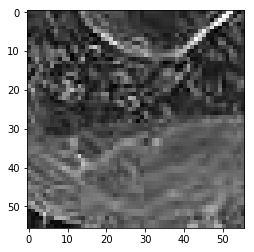

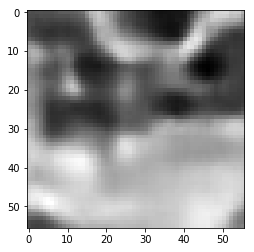

rmse 26.54745787382126
ssim 0.3161849490084749
psnr 19.650344802197406

 next


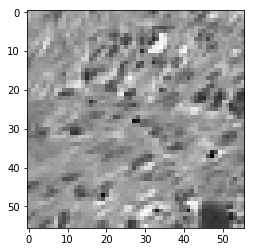

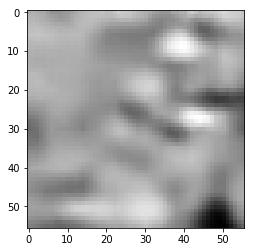

rmse 25.37538606673479
ssim 0.25525167939275745
psnr 20.0425504402028

 next


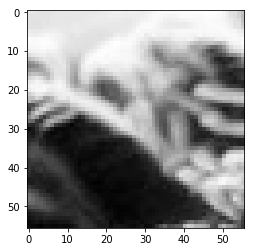

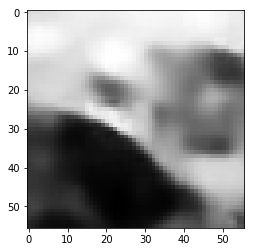

rmse 22.40614179521799
ssim 0.6733003298274162
psnr 21.123462007922136

 next


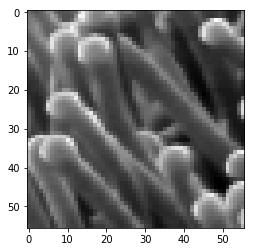

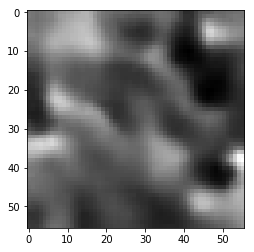

rmse 17.1145723387599
ssim 0.46559895213043784
psnr 23.463482580670323

 next


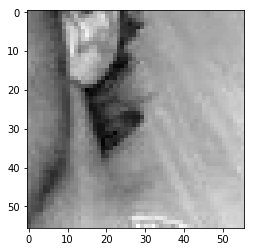

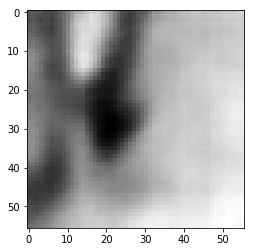

rmse 5.517741870135069
ssim 0.6756538965727688
psnr 33.29557601781336

 next


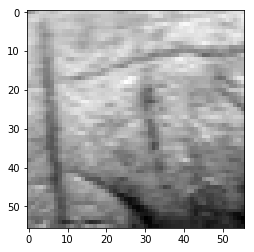

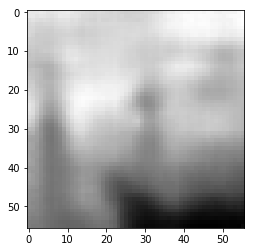

rmse 8.925568107515574
ssim 0.45802906884731404
psnr 29.118086243286953

 next


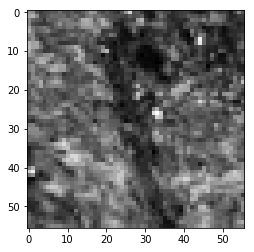

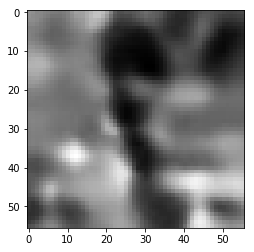

rmse 26.04077596217394
ssim 0.3858253551870286
psnr 19.817725185049902

 next


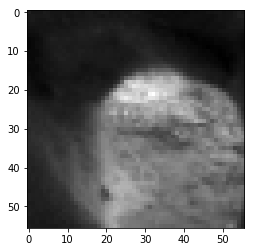

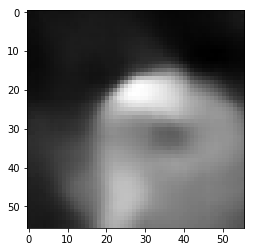

rmse 8.443972449749708
ssim 0.7852336885051711
psnr 29.5998674554769

 next


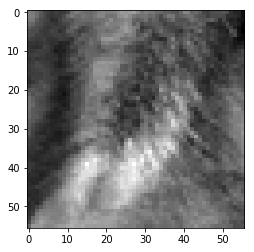

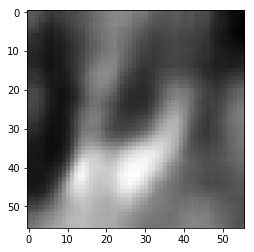

rmse 5.9097630344331264
ssim 0.605741807907417
psnr 32.69940226483176

 next


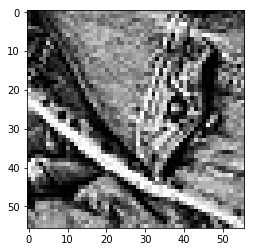

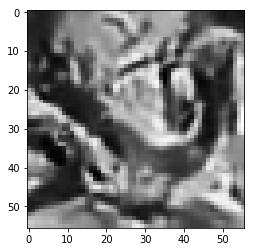

rmse 69.80866089463234
ssim 0.18918169600588186
psnr 11.252617464122029

 next


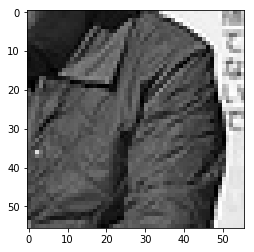

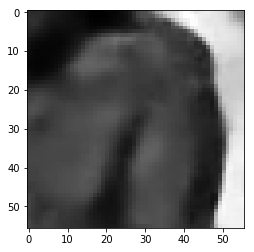

rmse 25.020694099366665
ssim 0.4324473296151689
psnr 20.164816542823147

 next


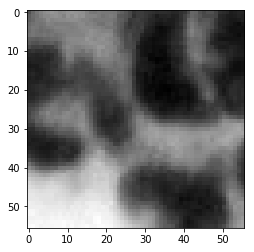

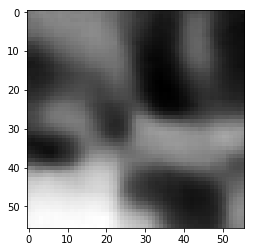

rmse 4.235855005681515
ssim 0.8706081530987926
psnr 35.591981894937845

 next


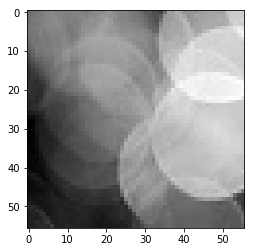

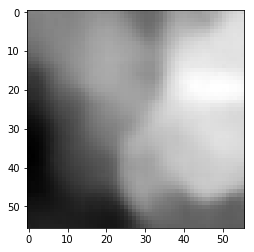

rmse 7.150319991633296
ssim 0.8155817600103501
psnr 31.044294052403117

 next


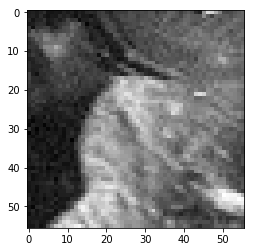

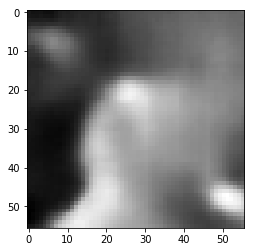

rmse 8.813129290938377
ssim 0.4970126800860585
psnr 29.228200781003025

 next


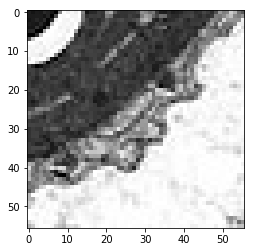

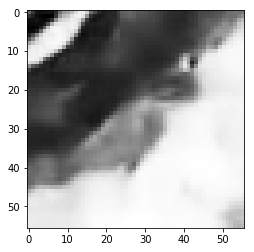

rmse 28.956395611166954
ssim 0.490123475058172
psnr 18.89591357944928

 next


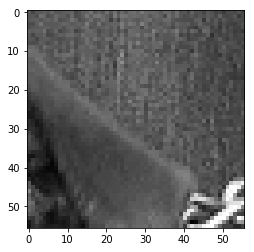

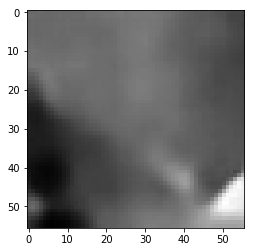

rmse 18.30391801893711
ssim 0.4694684785968757
psnr 22.879922369395768

 next


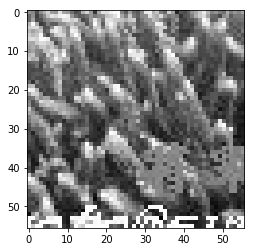

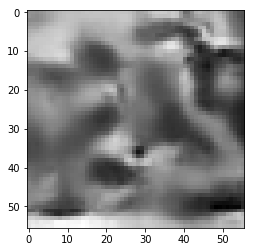

rmse 41.547935754060745
ssim 0.3025408072316526
psnr 15.759814580760612

 next


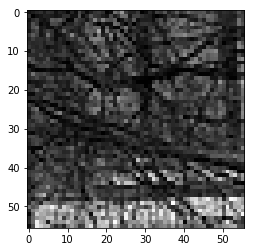

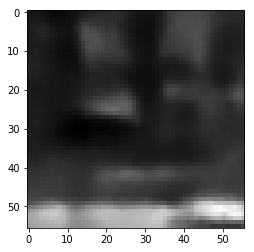

rmse 34.71714869141579
ssim 0.22001875650694355
psnr 17.31992261870168

 next


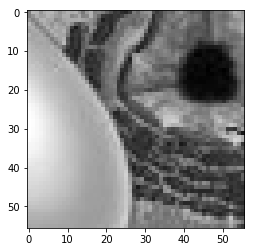

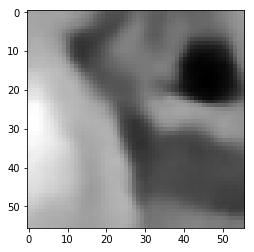

rmse 18.88406328856945
ssim 0.5845589588192657
psnr 22.608894663316384

 next


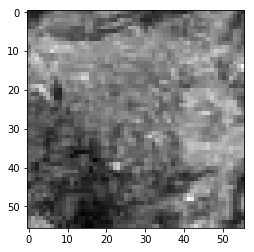

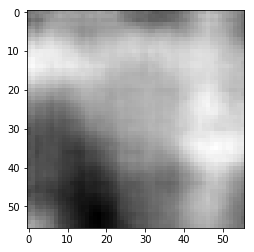

rmse 5.806637043133378
ssim 0.2877675291666152
psnr 32.852310002050004

 next


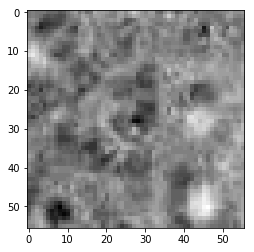

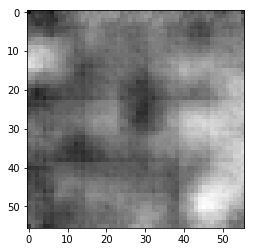

rmse 3.3199034677818418
ssim 0.31075067561353265
psnr 37.708294488930704

 next


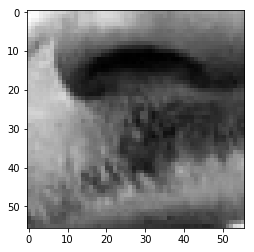

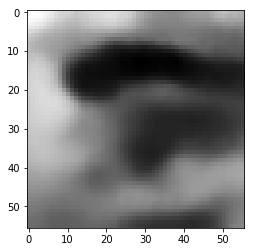

rmse 9.474831484258175
ssim 0.7519692901343431
psnr 28.599373718425948

 next


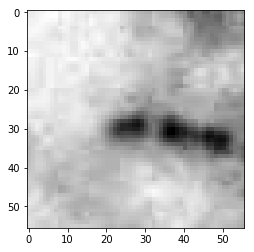

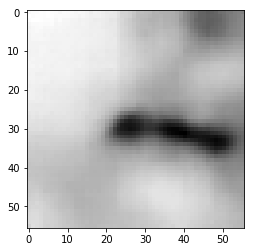

rmse 4.349567703902721
ssim 0.761734446890853
psnr 35.361881702409605

 next


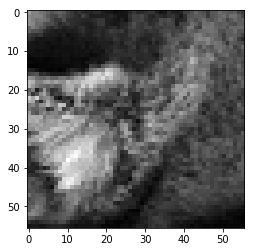

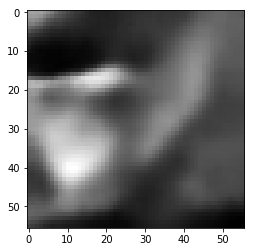

rmse 12.825068961828947
ssim 0.566373846160729
psnr 25.969609427877266

 next


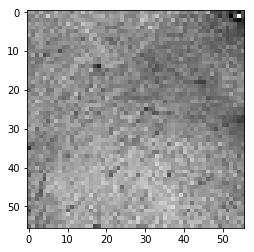

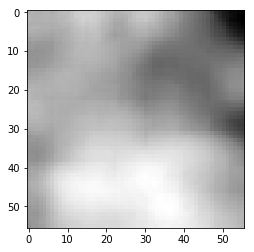

rmse 15.36264119669795
ssim 0.27361689280339285
psnr 24.401485859166456

 next


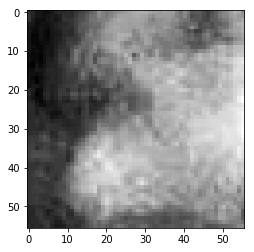

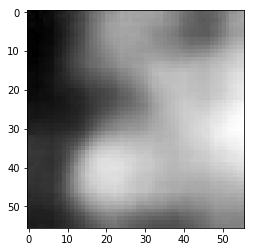

rmse 3.7331996904686093
ssim 0.6781895858143664
psnr 36.689179185727085

 next


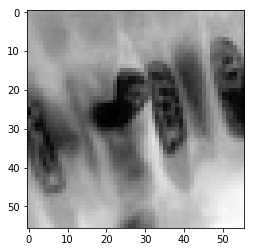

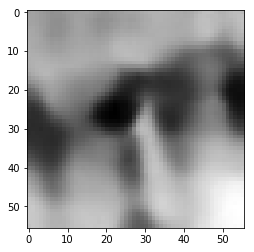

rmse 13.003866467624903
ssim 0.7532886587937323
psnr 25.849353584248092

 next


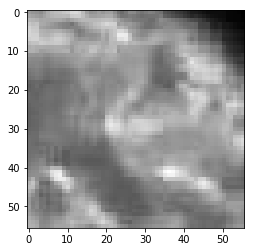

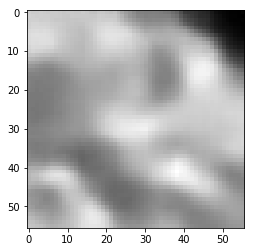

rmse 7.963263094425201
ssim 0.7282237574249084
psnr 30.108982320476837

 next


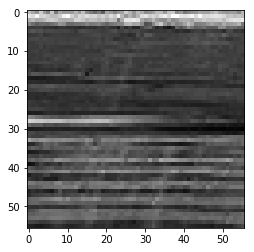

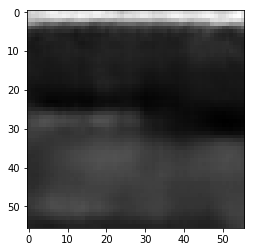

rmse 20.316348932683468
ssim 0.287759906141135
psnr 21.973890344372833

 next


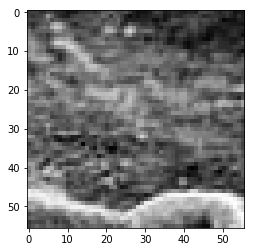

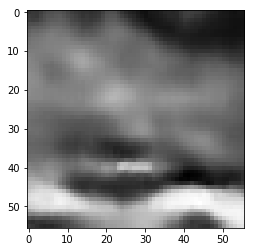

rmse 17.993858456611633
ssim 0.4101874982353473
psnr 23.02831761053981

 next


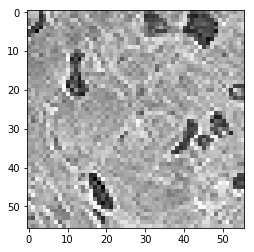

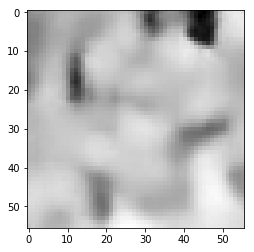

rmse 32.17313960194588
ssim 0.2090300158193646
psnr 17.980934740487736

 next


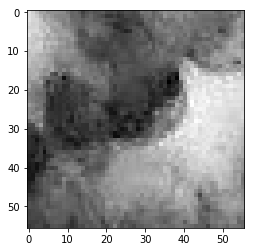

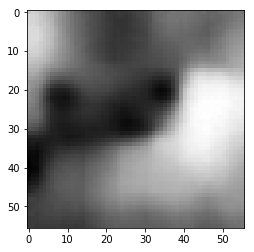

rmse 6.190510494634509
ssim 0.6501838599940962
psnr 32.296274325009506

 next


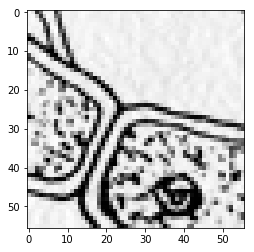

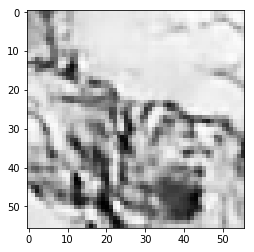

rmse 69.59410920739174
ssim 0.24239458206625694
psnr 11.27935400238626

 next


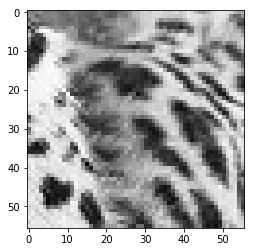

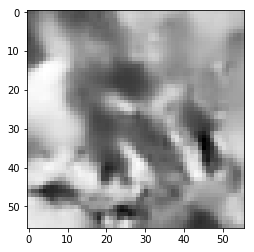

rmse 41.43863841891289
ssim 0.40409486180415644
psnr 15.78269406817666

 next


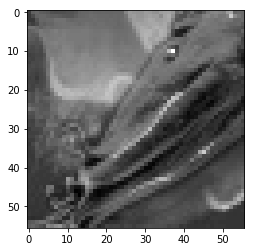

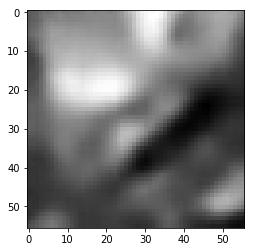

rmse 14.973753914237022
ssim 0.48469404319894127
psnr 24.624189779689427

 next


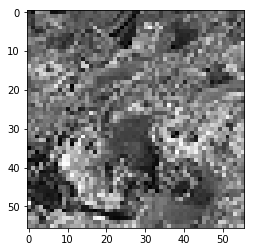

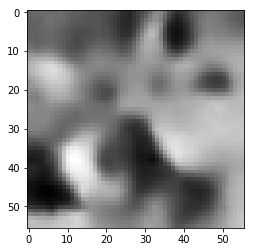

rmse 38.79928484559059
ssim 0.24046215265958845
psnr 16.354329194978515

 next


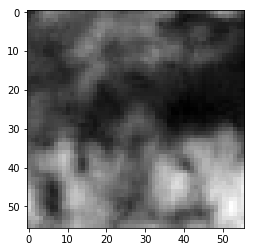

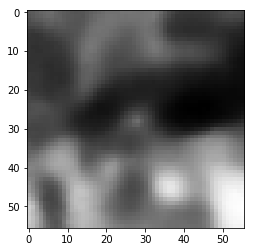

rmse 9.30461011826992
ssim 0.7619041704586498
psnr 28.75684000782574

 next


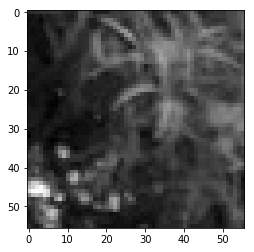

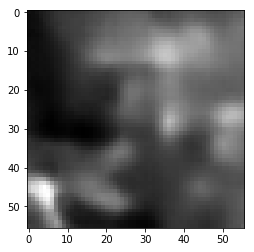

rmse 12.228522822260857
ssim 0.5014487583714881
psnr 26.383323640295227

 next


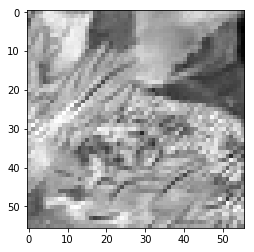

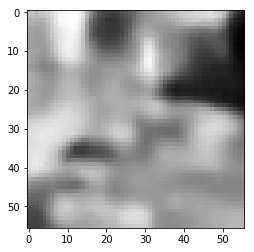

rmse 25.854141376912594
ssim 0.3838235230034842
psnr 19.88020122249165

 next


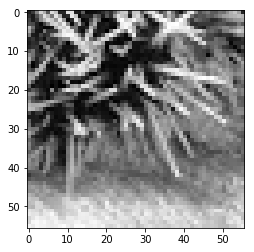

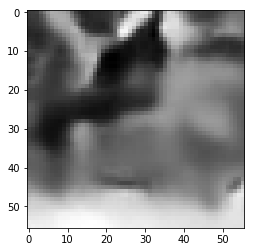

rmse 42.07226201891899
ssim 0.3547146217371881
psnr 15.65088635815374

 next


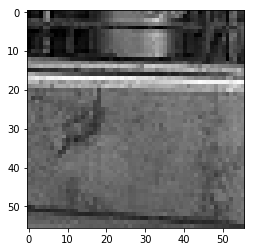

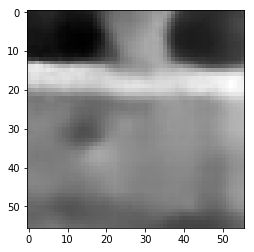

rmse 23.864237554371357
ssim 0.47313739927192416
psnr 20.57585233827419

 next


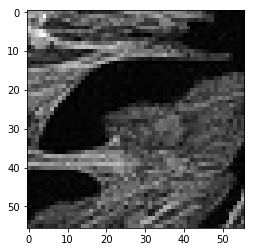

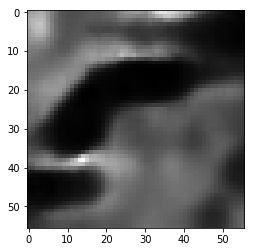

rmse 14.550145994871855
ssim 0.5092223471676448
psnr 24.873456588358614

 next


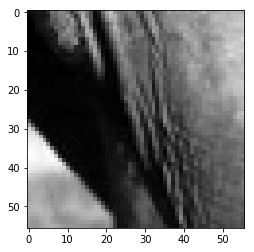

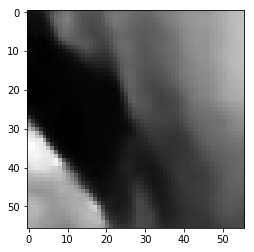

rmse 13.468451388180256
ssim 0.6219582800407049
psnr 25.54445034638239

 next


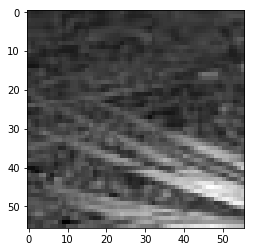

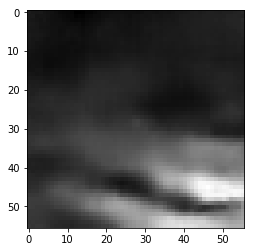

rmse 14.239151682704687
ssim 0.4175941485645819
psnr 25.06112128122217

 next


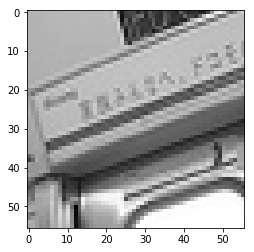

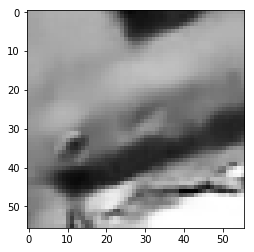

rmse 32.49405898153782
ssim 0.4627050399055686
psnr 17.894724319803363

 next


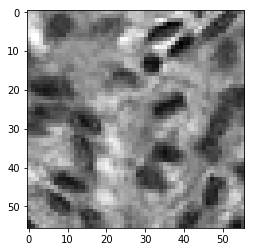

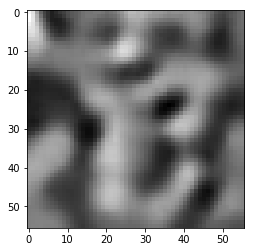

rmse 21.358448714017868
ssim 0.5632512741269283
psnr 21.539409483690676

 next


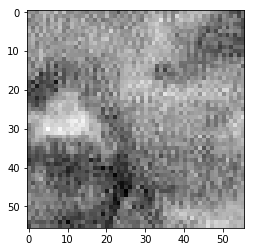

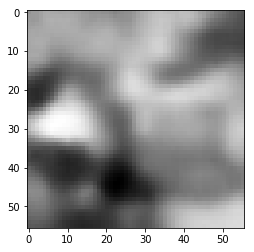

rmse 19.15556062012911
ssim 0.46588253107567346
psnr 22.48490627121324

 next


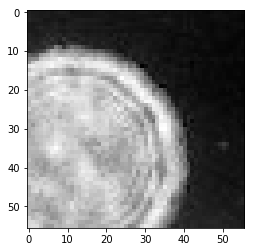

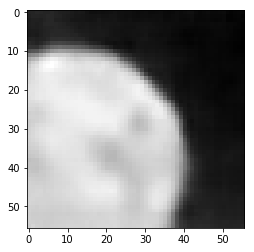

rmse 7.741330303251743
ssim 0.6322459007126316
psnr 30.354491646396692

 next


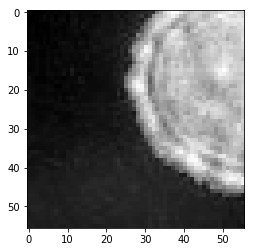

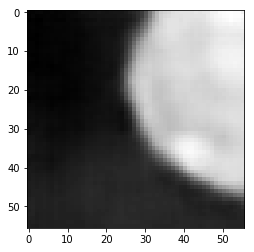

rmse 7.041941257193685
ssim 0.6928934946288805
psnr 31.176955650068052

 next


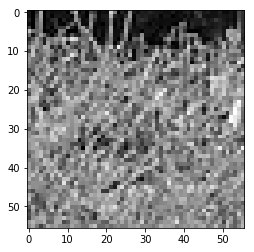

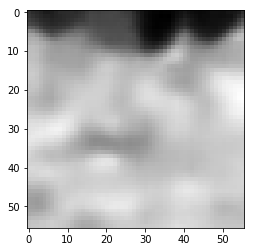

rmse 37.824306562542915
ssim 0.15259588221330955
psnr 16.575384112750402

 next


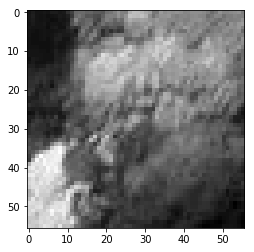

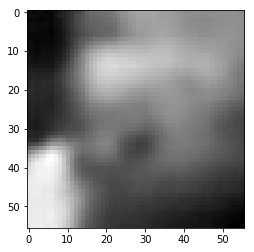

rmse 7.422492736950517
ssim 0.5343703042093839
psnr 30.719807982620537

 next


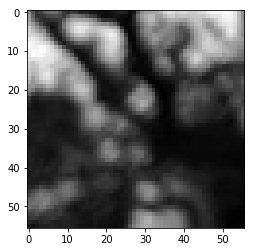

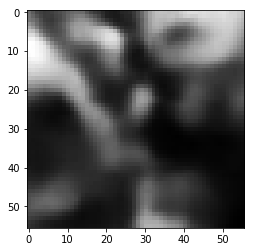

rmse 14.122675582766533
ssim 0.7545339456587267
psnr 25.132463950917053

 next


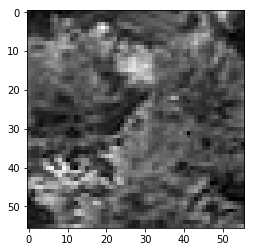

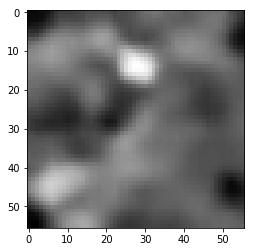

rmse 17.484571784734726
ssim 0.3809637329440622
psnr 23.277703599598908

 next


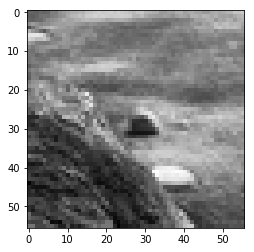

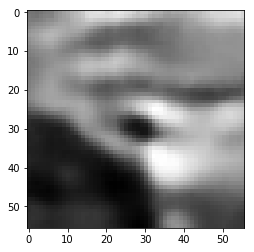

rmse 16.048267856240273
ssim 0.5555742508103311
psnr 24.0222403206803

 next


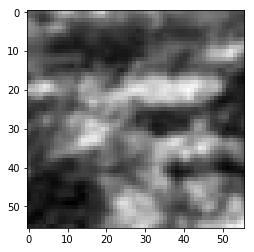

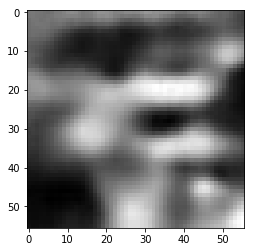

rmse 8.862089663743973
ssim 0.7280198406298791
psnr 29.180080813313303

 next


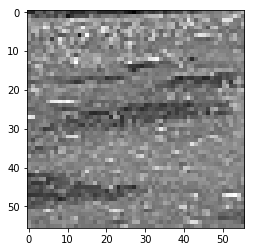

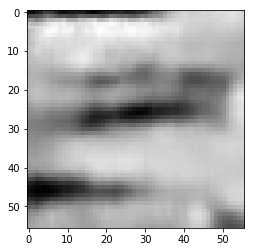

rmse 24.60405595600605
ssim 0.2593553244852461
psnr 20.310669487656096

 next


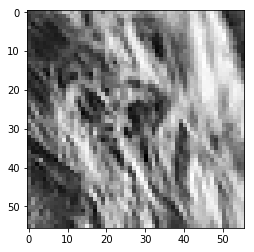

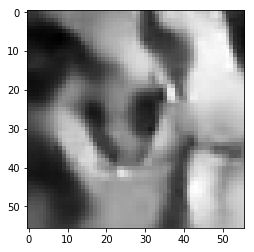

rmse 34.3108706921339
ssim 0.424373463945756
psnr 17.42216882669219

 next


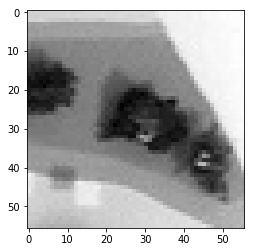

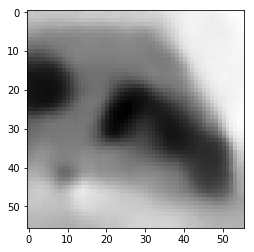

rmse 9.477953016757965
ssim 0.7938455070002017
psnr 28.59651257820262

 next


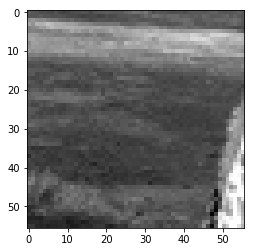

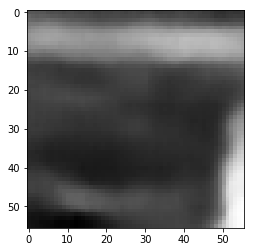

rmse 14.21343656256795
ssim 0.6321933216344597
psnr 25.076821698662407

 next


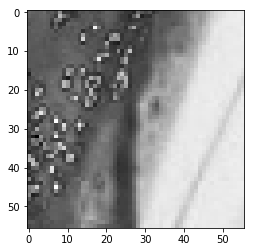

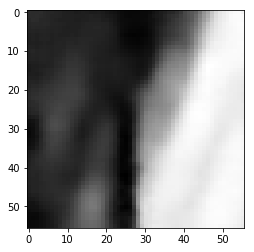

rmse 17.936527132987976
ssim 0.582347955332338
psnr 23.056036432046657

 next


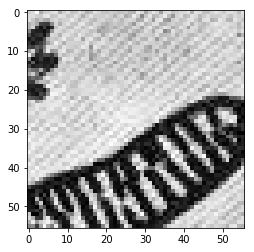

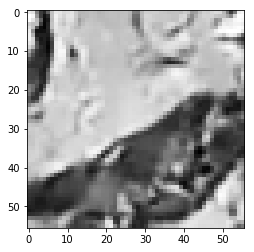

rmse 53.954619616270065
ssim 0.24411130355350988
psnr 13.490230907090817

 next


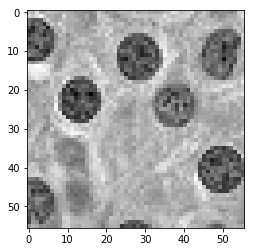

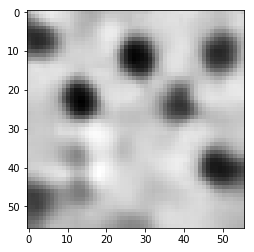

rmse 23.983458057045937
ssim 0.48489533690498154
psnr 20.532567567352213

 next


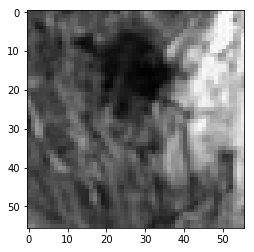

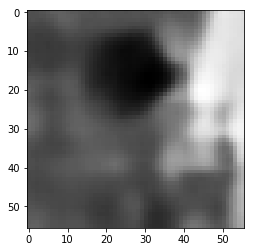

rmse 16.363787725567818
ssim 0.5112352433455739
psnr 23.853126866574886

 next


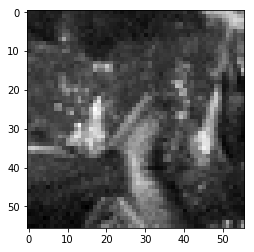

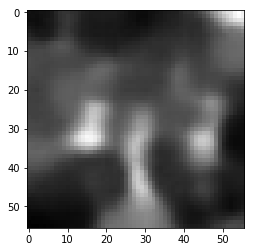

rmse 13.84438706561923
ssim 0.5312457956399267
psnr 25.3053289500763

 next


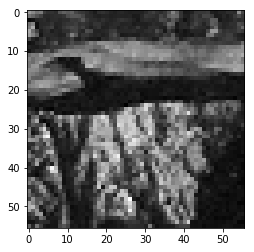

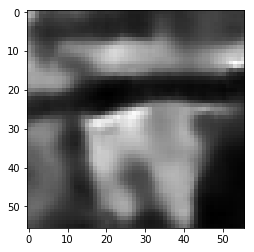

rmse 30.205973759293556
ssim 0.4692838984333359
psnr 18.52894679315237

 next


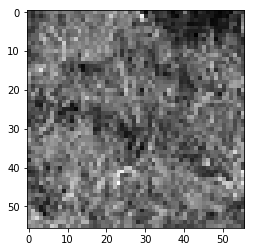

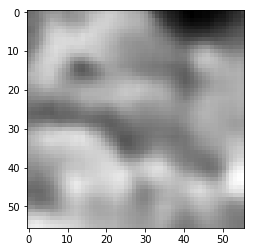

rmse 21.6049262881279
ssim 0.25402873580234375
psnr 21.43974783027605

 next


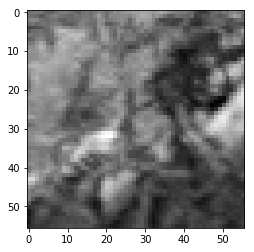

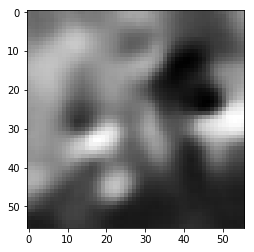

rmse 15.121463388204575
ssim 0.5391398460190431
psnr 24.53892716279771

 next


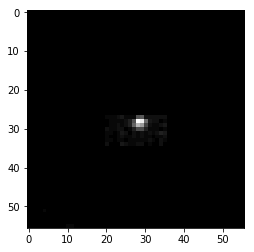

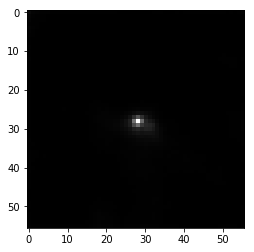

rmse 0.6206226570066065
ssim 0.9011725798907104
psnr 52.274251083060896

 next


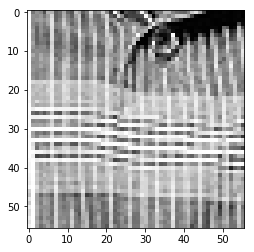

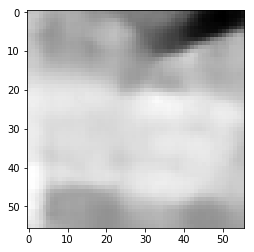

rmse 43.99510703980923
ssim 0.15013741927216398
psnr 15.262716035215744

 next


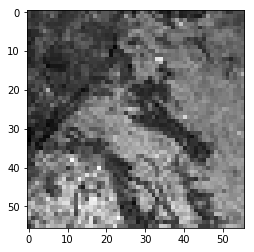

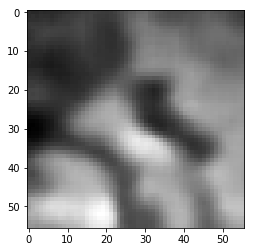

rmse 16.598565727472305
ssim 0.37300295860260424
psnr 23.729392358185976

 next


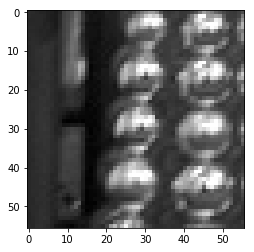

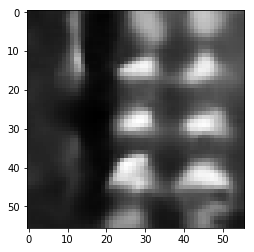

rmse 27.02316004782915
ssim 0.6942555942327934
psnr 19.496080940651737

 next


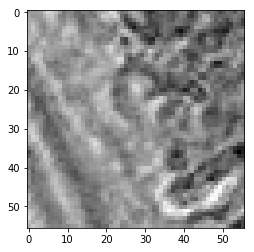

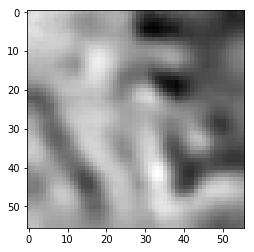

rmse 18.9584518969059
ssim 0.3476065210807169
psnr 22.57474618922992

 next


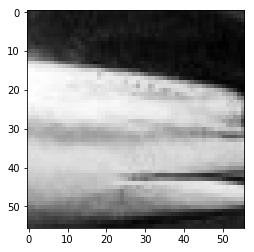

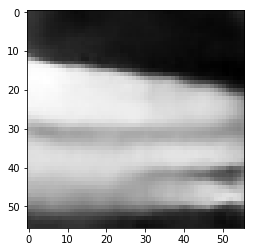

rmse 12.009784709662199
ssim 0.8049603554724057
psnr 26.540099164607255

 next


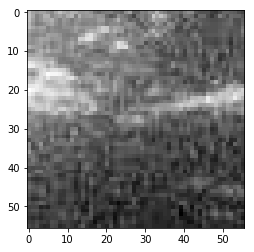

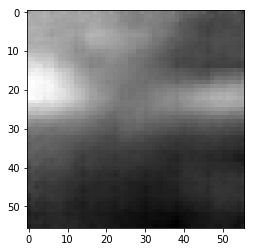

rmse 4.107247581705451
ssim 0.33006741543991874
psnr 35.85978595711996

 next


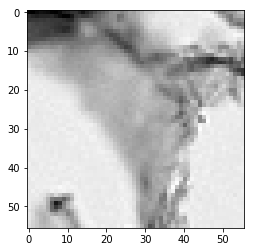

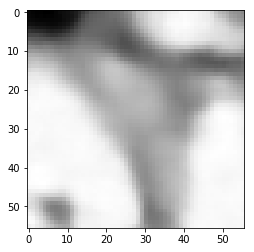

rmse 14.178038612008095
ssim 0.7431018681217658
psnr 25.098480513457993

 next


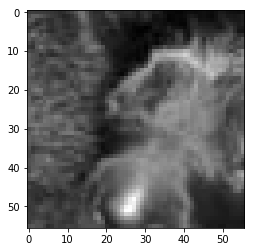

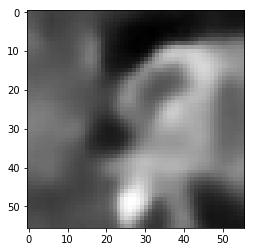

rmse 13.552112448960543
ssim 0.6402048059414396
psnr 25.490663677281105

 next


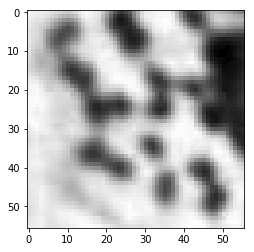

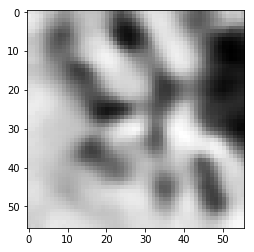

rmse 10.422983206808567
ssim 0.83512345166998
psnr 27.770962847778627

 next


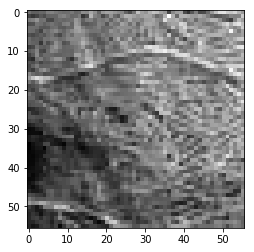

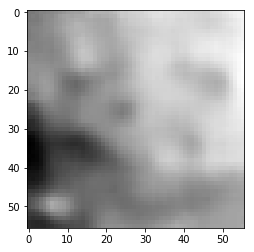

rmse 17.69630592316389
ssim 0.23785782450298693
psnr 23.173151258418542

 next


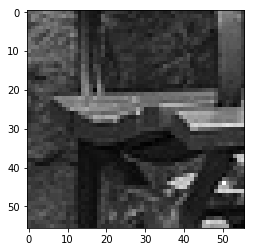

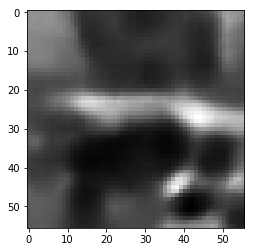

rmse 17.971333265304565
ssim 0.48193999012308614
psnr 23.039197649932575

 next


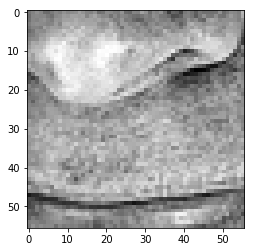

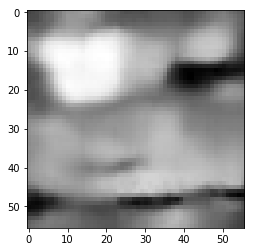

rmse 21.87813352793455
ssim 0.5101007579876335
psnr 21.33059823634214

 next


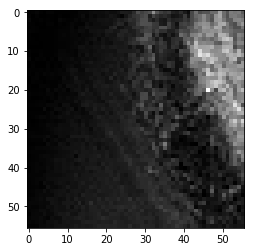

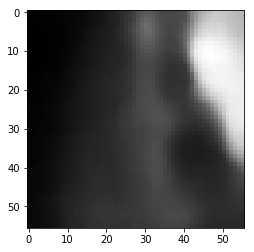

rmse 11.542288195341825
ssim 0.6187132778205812
psnr 26.884965331589605

 next


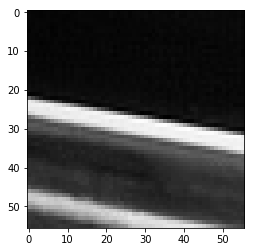

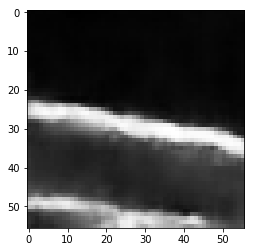

rmse 16.88999678939581
ssim 0.8649681931975529
psnr 23.578212268351667

 next


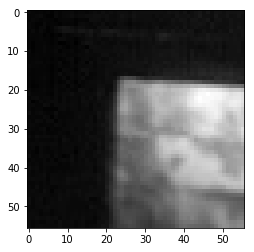

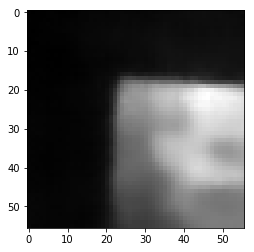

rmse 5.9801276586949825
ssim 0.8531679448008083
psnr 32.596594507924145

 next


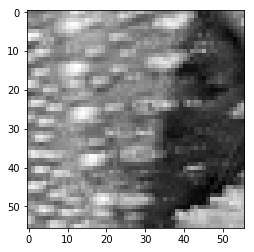

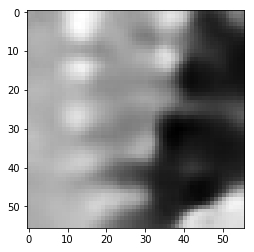

rmse 21.30126178264618
ssim 0.3976302352414989
psnr 21.562697015012056

 next


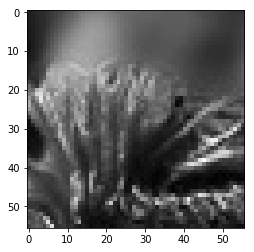

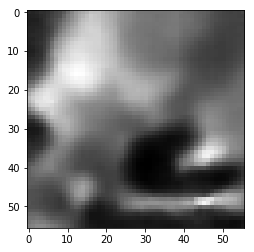

rmse 15.740225985646248
ssim 0.5735507521391423
psnr 24.190584342227574

 next


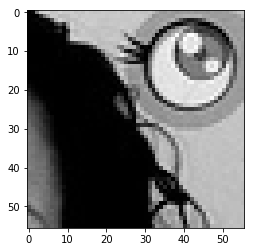

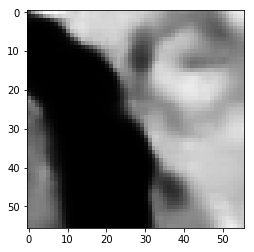

rmse 23.865179903805256
ssim 0.6610379545606129
psnr 20.575509357210503

 next


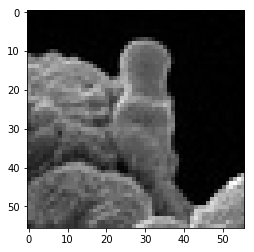

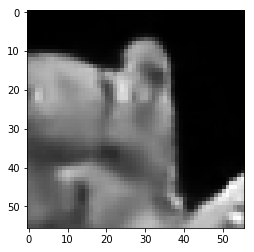

rmse 21.457032524049282
ssim 0.6602045159338572
psnr 21.49941041874883

 next


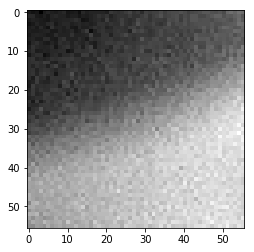

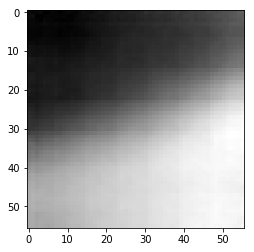

rmse 3.1399776600301266
ssim 0.6173815392956076
psnr 38.19227244441325

 next


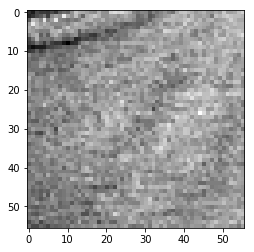

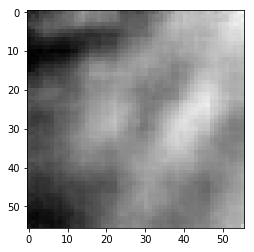

rmse 6.641210010275245
ssim 0.21376280135152537
psnr 31.685859331829974

 next


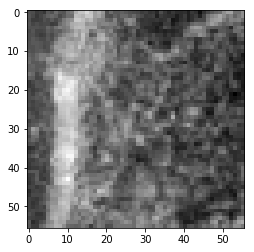

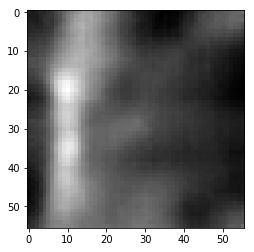

rmse 5.4741050116717815
ssim 0.3838345538787643
psnr 33.36454112113873

 next


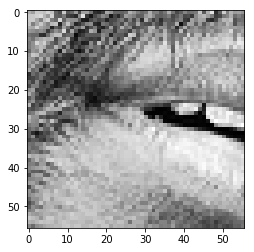

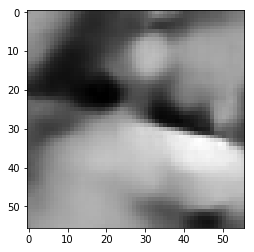

rmse 30.517412647604942
ssim 0.4535907924784415
psnr 18.439849406050193

 next


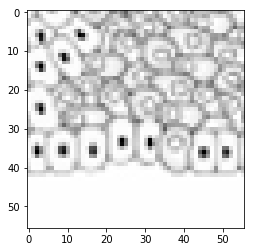

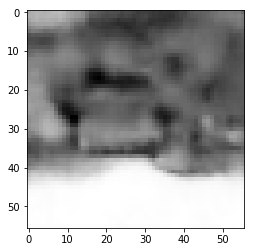

rmse 33.56658563017845
ssim 0.2926654197669159
psnr 17.61266026145907

 next


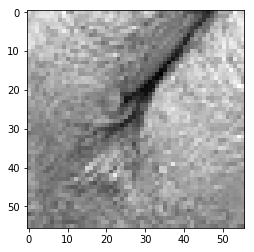

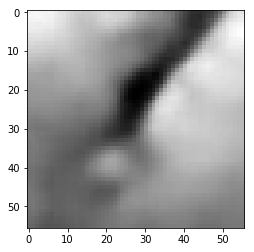

rmse 15.561736263334751
ssim 0.4015303424062392
psnr 24.289642594271236

 next


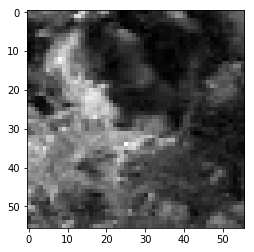

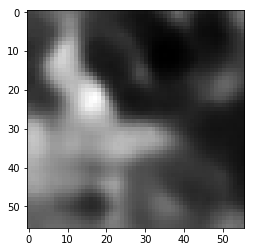

rmse 12.298277579247952
ssim 0.5546954917591914
psnr 26.333917786734172

 next


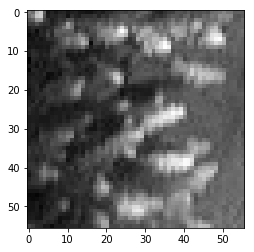

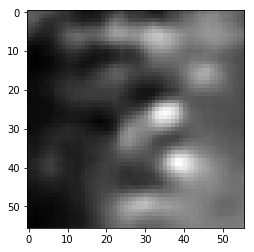

rmse 9.250155240297318
ssim 0.4810499211645054
psnr 28.807823182138982

 next


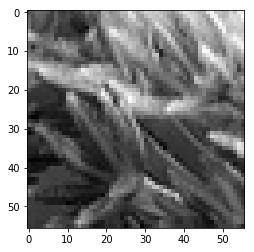

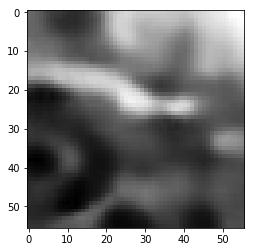

rmse 23.89804434031248
ssim 0.4423008376456078
psnr 20.56355635704833

 next


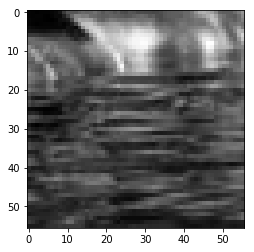

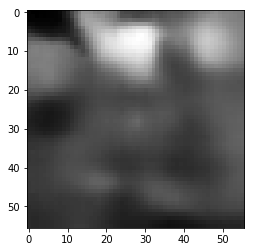

rmse 13.774498365819454
ssim 0.4368734559310251
psnr 25.349287771703068

 next


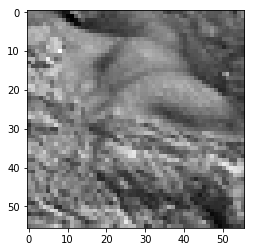

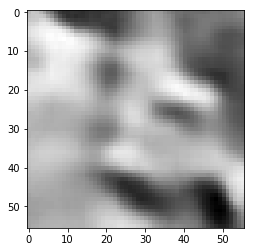

rmse 17.768659740686417
ssim 0.4316097099547522
psnr 23.137710189518288

 next


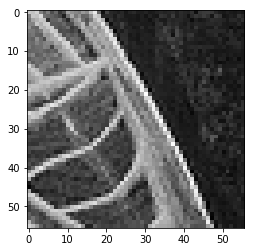

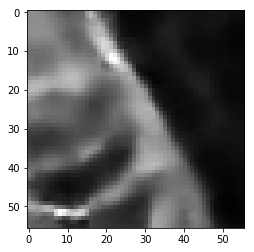

rmse 30.44520702213049
ssim 0.3976165150638788
psnr 18.46042497812351

 next


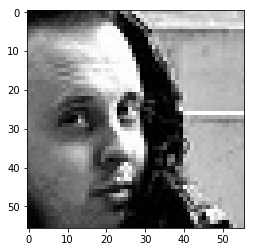

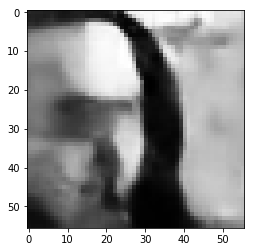

rmse 32.459952011704445
ssim 0.6052415884916558
psnr 17.90384613995147

 next
rmses 0.074995324
ssims 0.5059693598797744
psnrs 24.523222056506807


In [33]:
images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
        img = np.expand_dims(img, axis=-1)        
        images.append(img)
        

rmses = []
ssims = []
psnrs = []
        
images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 1)
images = images / 255
predictions = decoder.predict_on_batch(encoder.predict_on_batch(np.array(images)))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size))
    plt.imshow(im_1, cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

In [29]:
pred_1.shape

(56, 56)

predictions: 


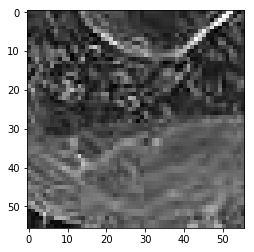

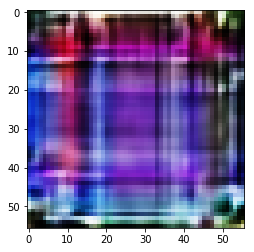

rmse 67.80659392476082
ssim 0.09459464929508443
psnr 11.50536502163543

 next


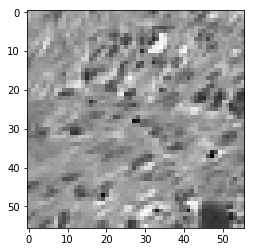

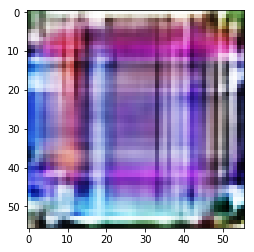

rmse 65.8980019390583
ssim 0.07456249103017047
psnr 11.75335867339879

 next


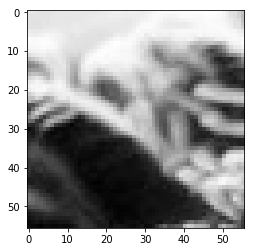

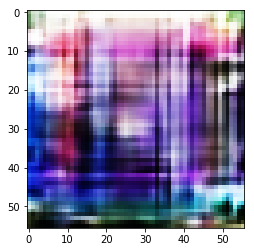

rmse 67.48834580183029
ssim 0.1721076294354247
psnr 11.546227941966725

 next


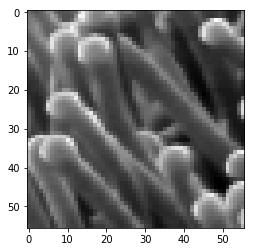

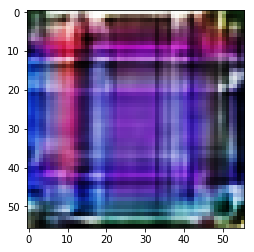

rmse 65.4570659995079
ssim 0.10683117979167574
psnr 11.811672910590008

 next


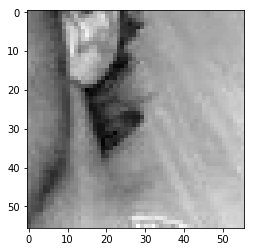

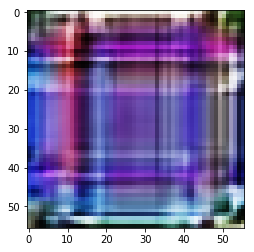

rmse 60.33149063587189
ssim 0.0482998203256649
psnr 12.519922493719776

 next


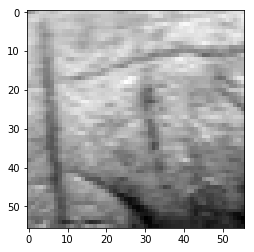

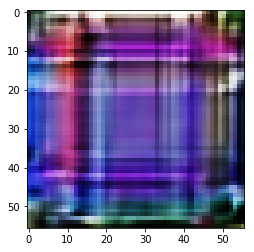

rmse 59.84240747988224
ssim 0.06354037253204968
psnr 12.590622468303561

 next


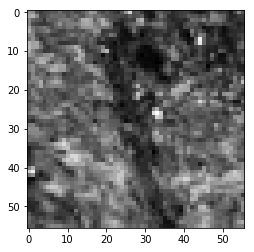

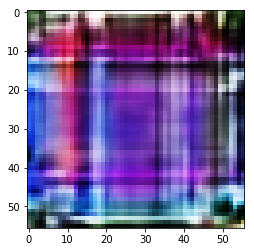

rmse 70.47222688794136
ssim 0.10291798868805814
psnr 11.170443704527905

 next


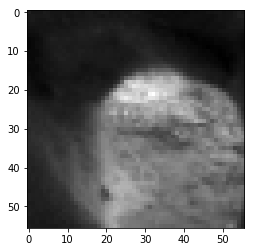

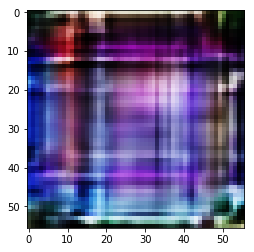

rmse 59.298246279358864
ssim 0.15614982745502093
psnr 12.669966619120528

 next


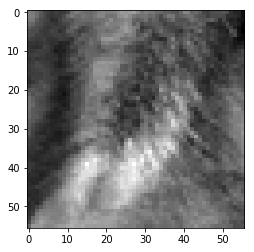

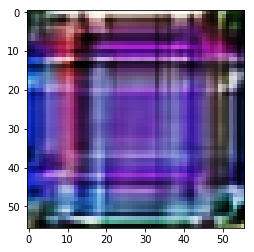

rmse 61.8691199272871
ssim 0.07590111782364661
psnr 12.301324842001826

 next


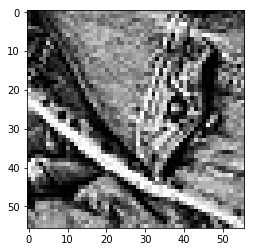

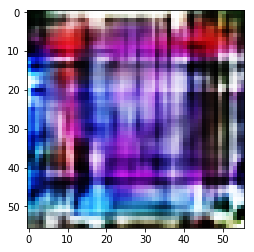

rmse 91.82024136185646
ssim 0.09044224113790422
psnr 8.872035008019681

 next


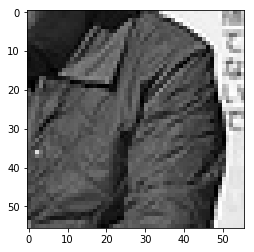

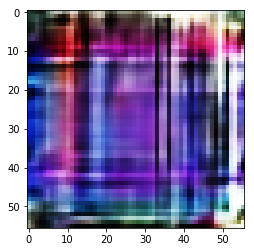

rmse 71.67092576622963
ssim 0.1116024136274757
psnr 11.023943323789931

 next


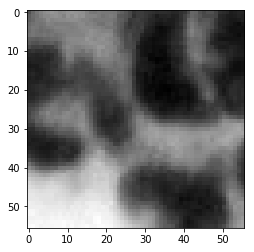

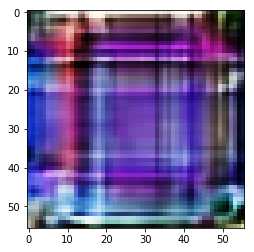

rmse 61.51369459927082
ssim 0.11928798185257623
psnr 12.35136736575264

 next


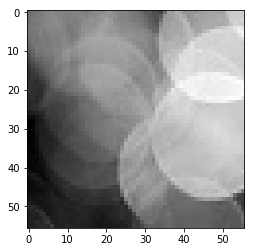

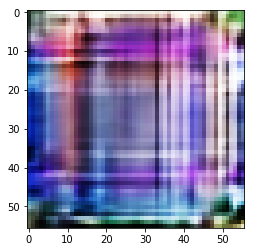

rmse 60.90742193162441
ssim 0.10545852649792793
psnr 12.437399264214639

 next


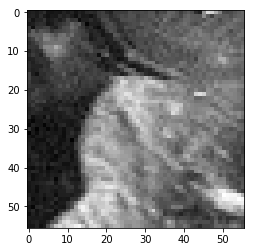

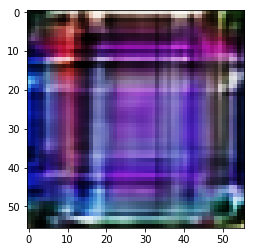

rmse 61.02138161659241
ssim 0.09957620692566967
psnr 12.421162878615135

 next


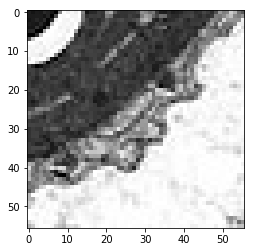

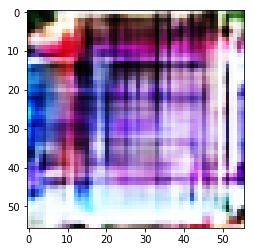

rmse 74.82915669679642
ssim 0.13912695377885706
psnr 10.6493865911599

 next


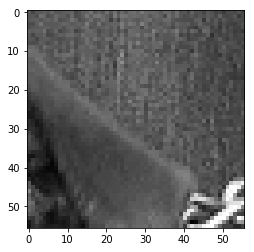

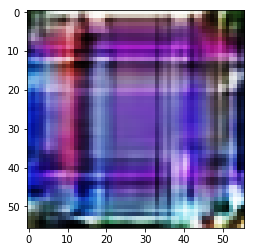

rmse 63.64950679242611
ssim 0.07075822804631139
psnr 12.054902753884098

 next


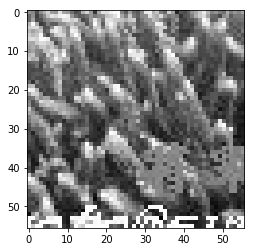

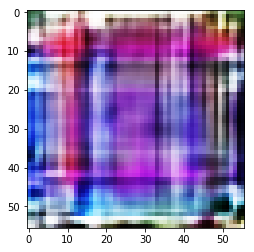

rmse 76.06708467006683
ssim 0.10408181665540168
psnr 10.506868170647195

 next


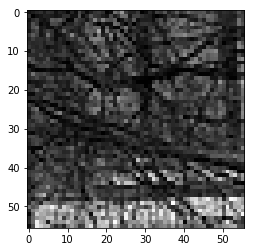

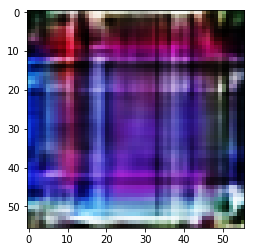

rmse 71.90273612737656
ssim 0.08731094922543459
psnr 10.995895269057021

 next


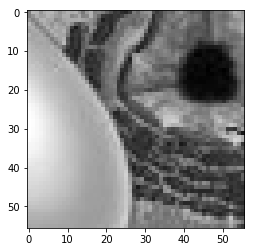

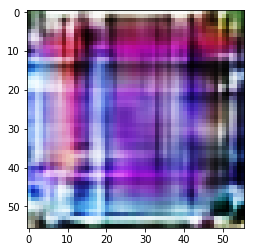

rmse 66.57428964972496
ssim 0.10123432425204182
psnr 11.66467278474733

 next


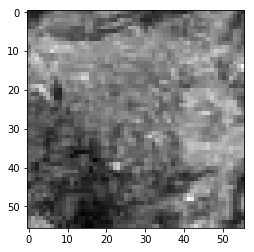

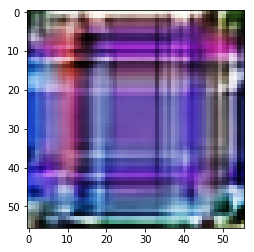

rmse 58.300480619072914
ssim 0.05756907076855134
psnr 12.817360908232649

 next


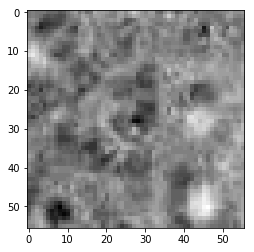

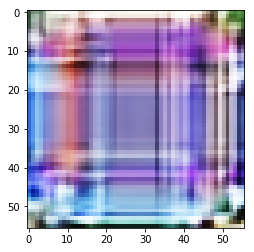

rmse 54.937851056456566
ssim 0.07272888588274212
psnr 13.333370256742711

 next


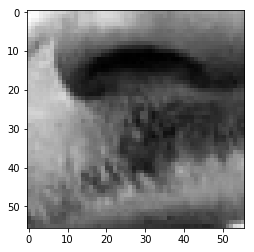

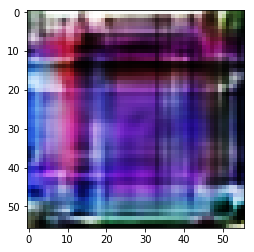

rmse 59.92218799889088
ssim 0.18587227636991863
psnr 12.579050352469043

 next


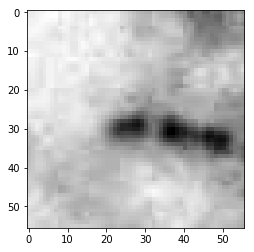

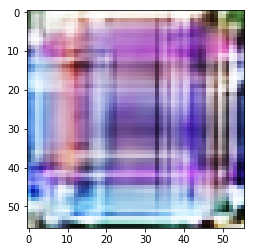

rmse 57.21135266125202
ssim 0.1122292391305985
psnr 12.981159288439004

 next


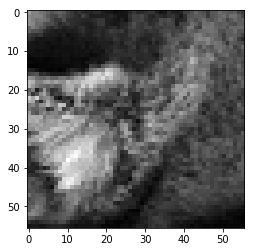

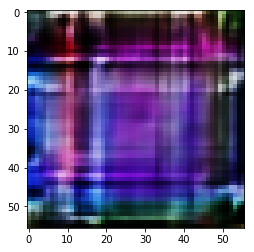

rmse 61.06199763715267
ssim 0.13857226696308253
psnr 12.415383446766242

 next


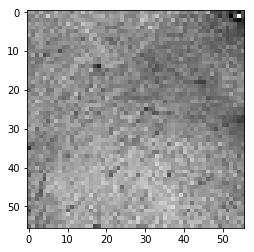

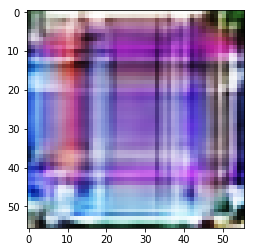

rmse 58.0156023055315
ssim 0.0851385891898332
psnr 12.859907501568113

 next


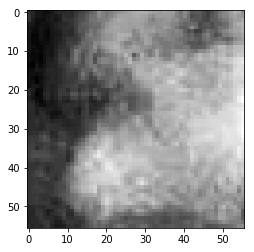

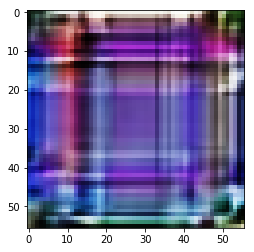

rmse 58.81816864013672
ssim 0.07861507690420144
psnr 12.740573644518498

 next


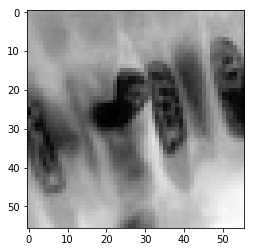

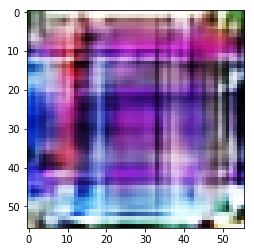

rmse 65.6149323284626
ssim 0.07961715216646485
psnr 11.790749903519044

 next


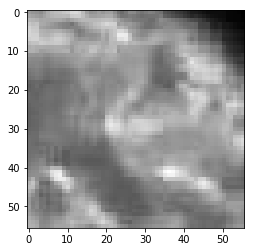

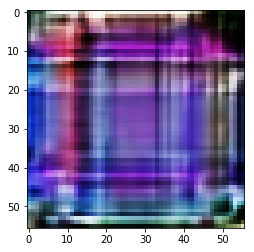

rmse 59.7505322098732
ssim 0.09606696853020852
psnr 12.603968048984633

 next


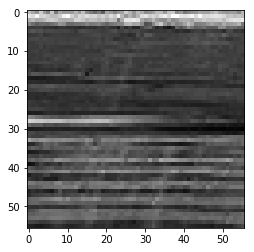

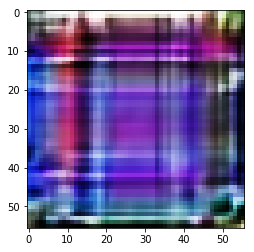

rmse 66.62248626351357
ssim 0.06425915607375736
psnr 11.658386889556597

 next


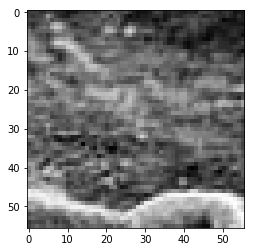

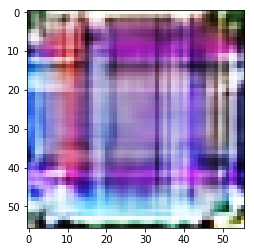

rmse 62.16027930378914
ssim 0.10560830402624556
psnr 12.260544464565228

 next


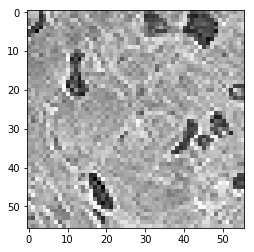

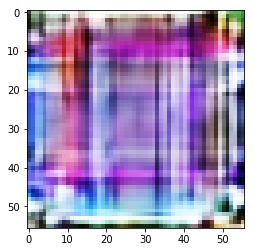

rmse 71.33684769272804
ssim 0.032081271912068096
psnr 11.06452532133245

 next


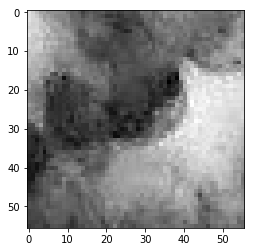

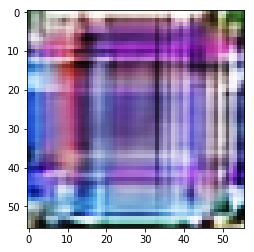

rmse 57.53207065165043
ssim 0.09562799703701479
psnr 12.932603506440435

 next


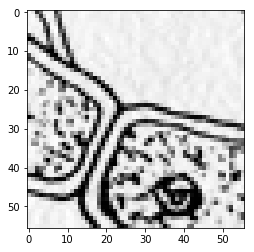

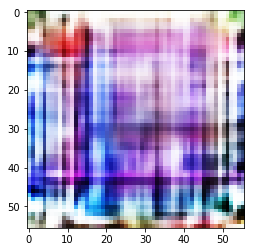

rmse 90.51532298326492
ssim 0.08076712553620642
psnr 8.996361499984197

 next


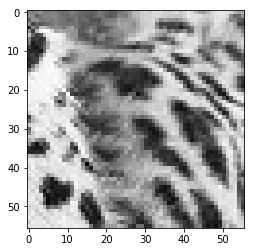

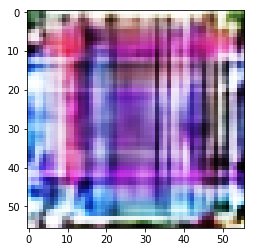

rmse 79.33899030089378
ssim 0.09804972331337436
psnr 10.141070225251106

 next


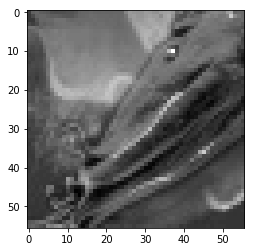

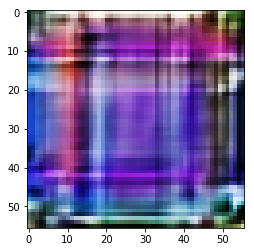

rmse 62.47428685426712
ssim 0.09578862579091148
psnr 12.216777461816761

 next


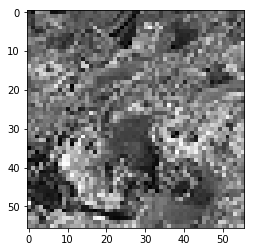

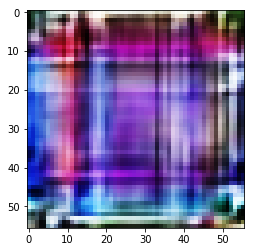

rmse 77.56783694028854
ssim 0.07150871436991303
psnr 10.33716999147381

 next


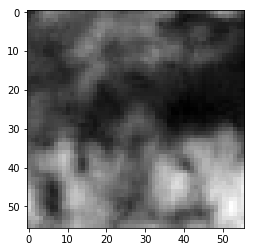

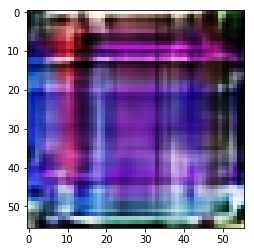

rmse 66.42632558941841
ssim 0.0893902206054971
psnr 11.683999011564104

 next


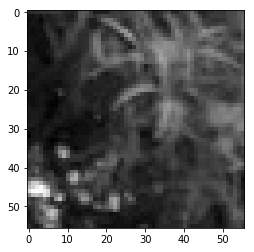

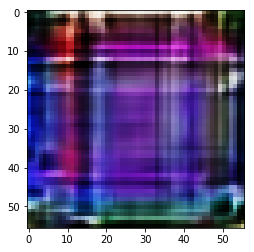

rmse 63.88498395681381
ssim 0.11496110962404092
psnr 12.022827807343726

 next


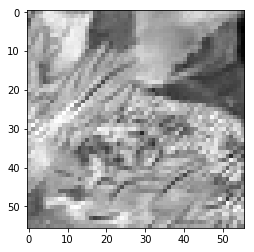

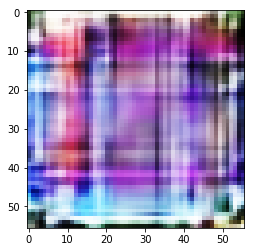

rmse 65.4258468747139
ssim 0.14588129215038667
psnr 11.815816551218802

 next


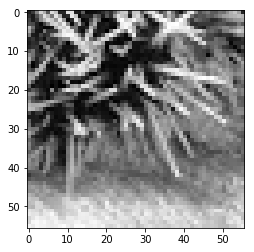

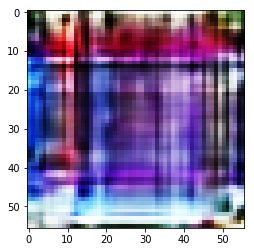

rmse 76.28762483596802
ssim 0.13004254003156485
psnr 10.481721735910067

 next


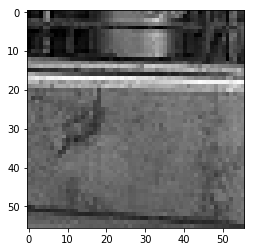

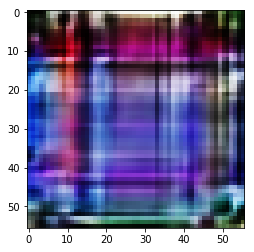

rmse 63.162878304719925
ssim 0.09850609001804585
psnr 12.121565360745938

 next


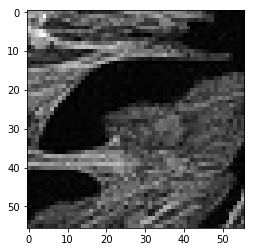

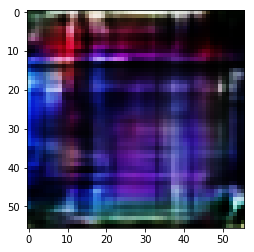

rmse 55.36204129457474
ssim 0.17760091948041276
psnr 13.266561709970349

 next


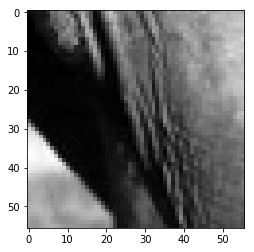

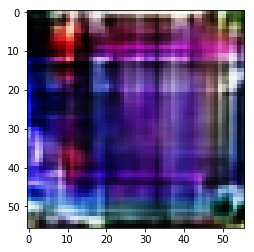

rmse 62.41546221077442
ssim 0.12968761991772812
psnr 12.22495978907718

 next


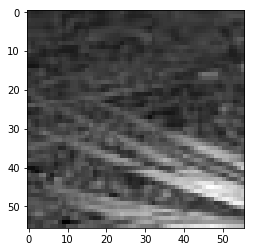

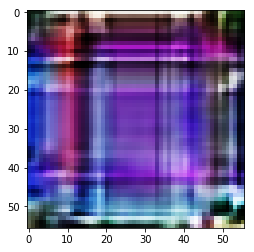

rmse 66.3223023712635
ssim 0.09866599534915294
psnr 11.697611722919504

 next


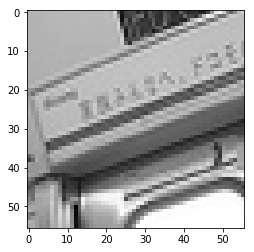

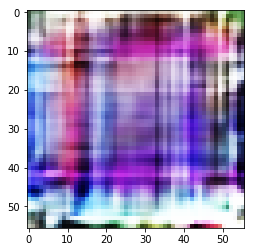

rmse 70.09910970926285
ssim 0.11947300760814873
psnr 11.216553563414326

 next


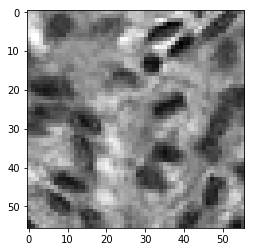

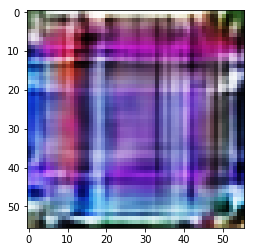

rmse 64.45415541529655
ssim 0.11659501742090916
psnr 11.945785170000796

 next


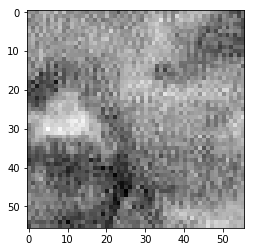

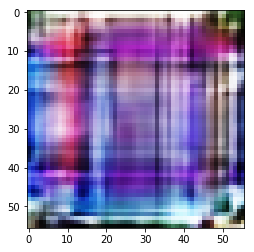

rmse 63.31649266183376
ssim 0.13047490803338943
psnr 12.100466615573735

 next


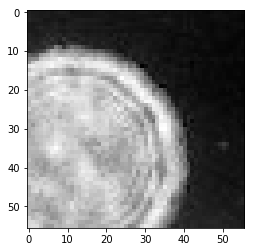

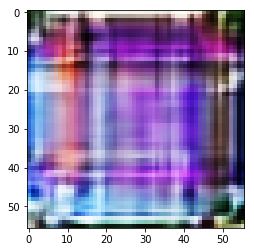

rmse 59.59533713757992
ssim 0.08913754272885495
psnr 12.626557989256625

 next


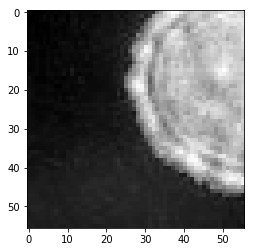

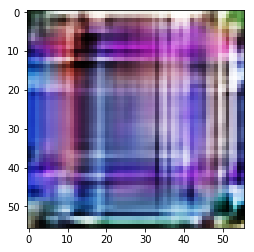

rmse 60.1883789151907
ssim 0.0866801948977209
psnr 12.540550680601072

 next


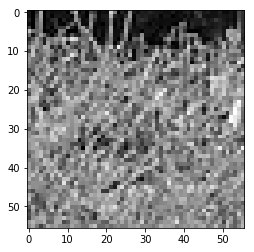

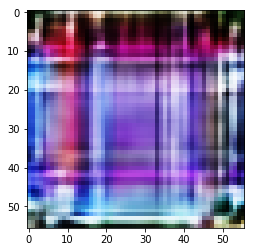

rmse 72.31639713048935
ssim 0.07444393251862552
psnr 10.946067987575335

 next


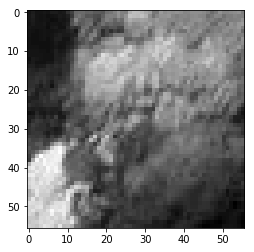

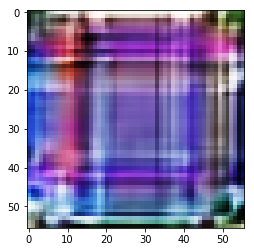

rmse 58.49506817758083
ssim 0.06416529554427708
psnr 12.788418578848134

 next


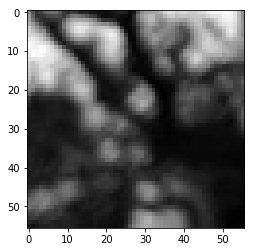

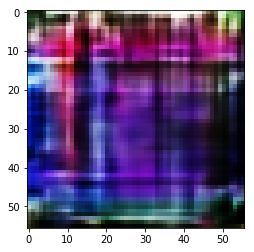

rmse 62.49301604926586
ssim 0.15670179999009307
psnr 12.214173905235047

 next


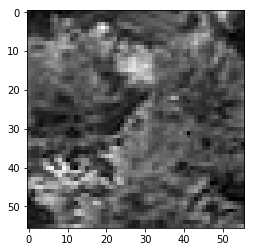

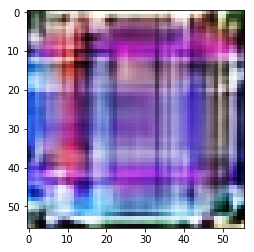

rmse 63.446175903081894
ssim 0.08475853933950893
psnr 12.082694589675063

 next


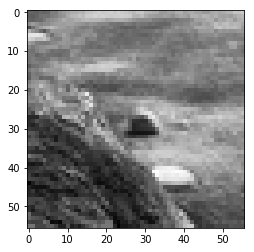

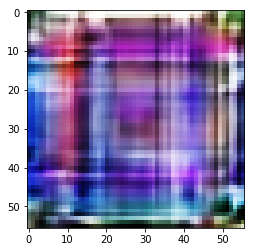

rmse 61.946016401052475
ssim 0.08822376294439127
psnr 12.290535945096915

 next


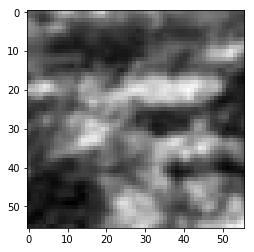

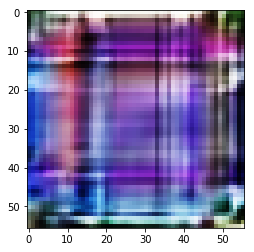

rmse 58.299203887581825
ssim 0.18046315343592015
psnr 12.817551123993118

 next


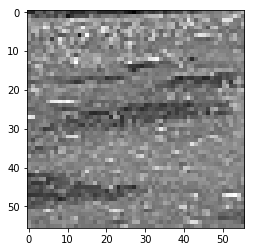

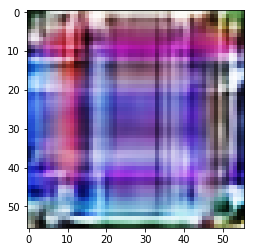

rmse 66.57200217247009
ssim 0.06345913336145113
psnr 11.664971235041595

 next


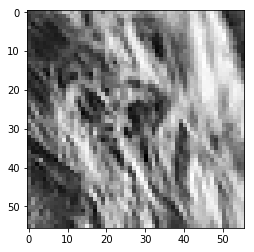

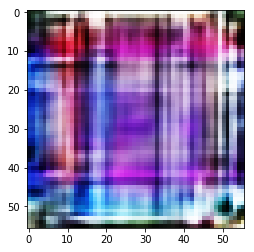

rmse 78.36568012833595
ssim 0.08773632670893139
psnr 10.248285465750097

 next


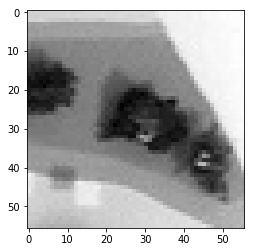

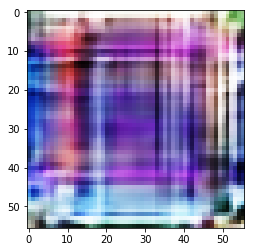

rmse 61.91608540713787
ssim 0.11700824317952924
psnr 12.294733795951453

 next


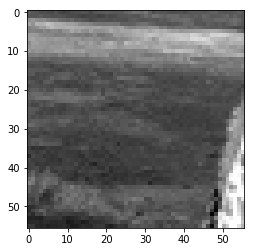

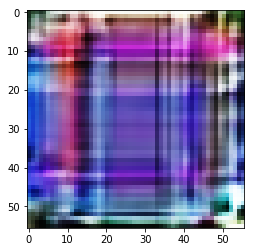

rmse 64.91988882422447
ssim 0.1244945244205587
psnr 11.883248260230825

 next


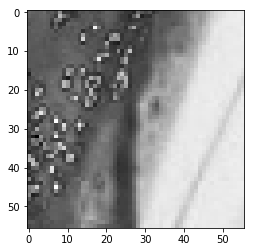

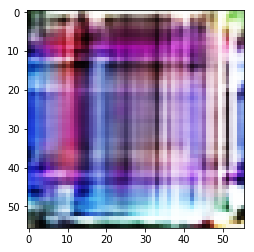

rmse 67.30255097150803
ssim 0.10808027842304935
psnr 11.570173096308544

 next


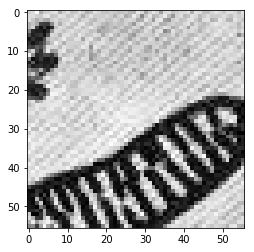

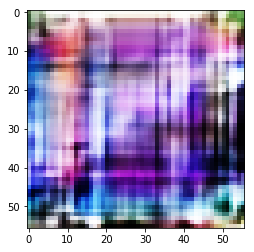

rmse 76.4452251791954
ssim 0.13373088606868647
psnr 10.463796323349433

 next


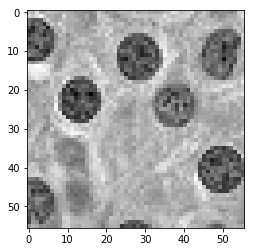

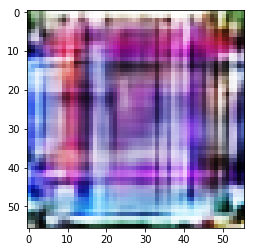

rmse 66.85978353023529
ssim 0.15902262179045948
psnr 11.62750428552732

 next


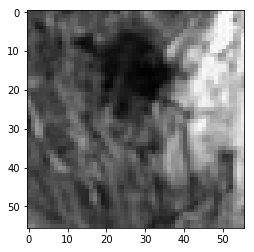

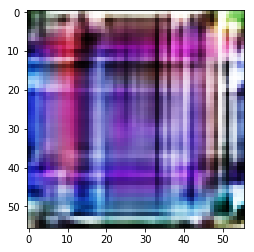

rmse 69.52043116092682
ssim 0.07661676724758172
psnr 11.288554470410439

 next


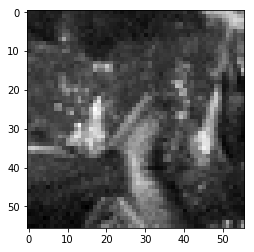

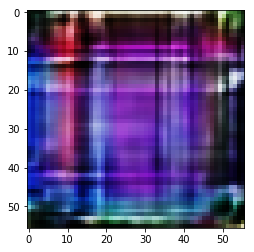

rmse 65.4352855682373
ssim 0.10929480208558583
psnr 11.814563567252005

 next


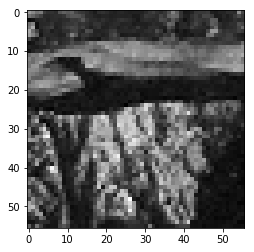

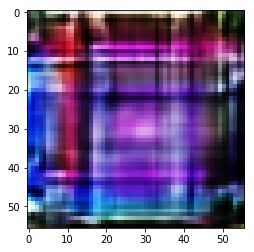

rmse 69.17339578270912
ssim 0.16471169204448824
psnr 11.332021686693498

 next


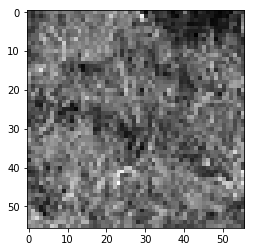

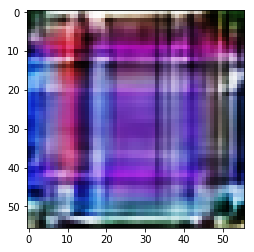

rmse 66.85350626707077
ssim 0.05405578513037854
psnr 11.62831981575919

 next


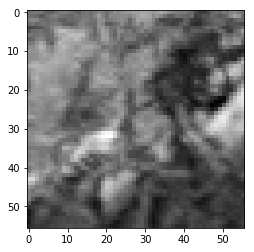

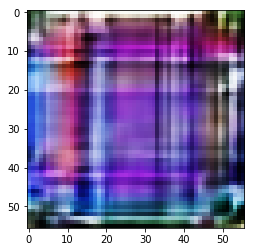

rmse 63.78492772579193
ssim 0.06837721348334501
psnr 12.036442253327632

 next


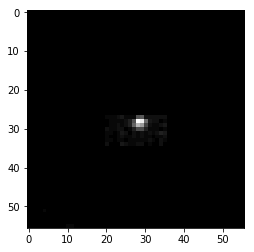

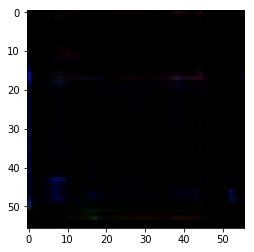

rmse 5.485670641064644
ssim 0.683296029478818
psnr 33.34620902731224

 next


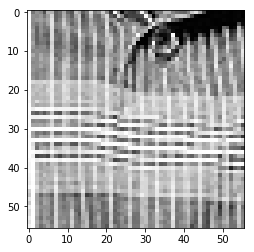

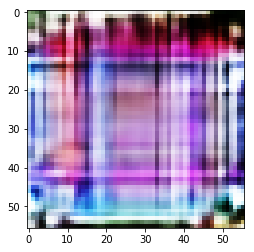

rmse 77.25873112678528
ssim 0.05281792091781912
psnr 10.371852185663988

 next


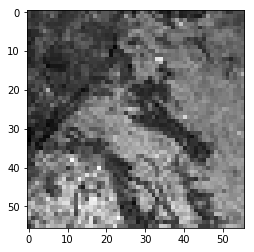

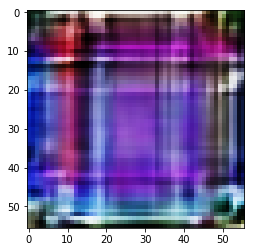

rmse 66.15366742014885
ssim 0.07689332470788983
psnr 11.719725097412468

 next


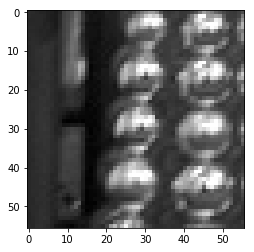

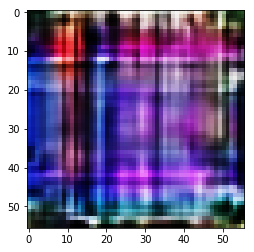

rmse 76.54414147138596
ssim 0.09227090093944708
psnr 10.452564482393347

 next


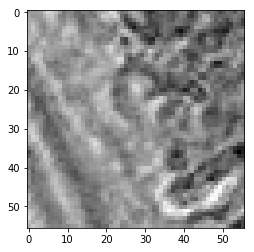

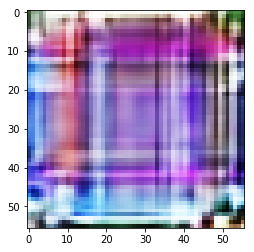

rmse 63.329005390405655
ssim 0.07040185453570408
psnr 12.098750262738907

 next


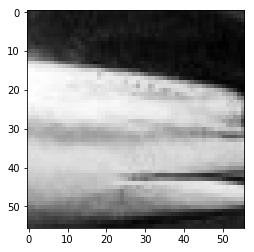

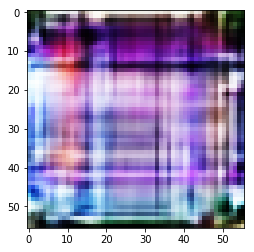

rmse 66.893320530653
ssim 0.13017427240888388
psnr 11.623148518346142

 next


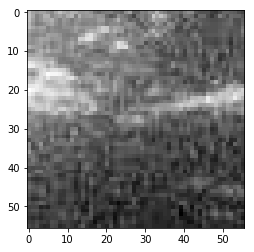

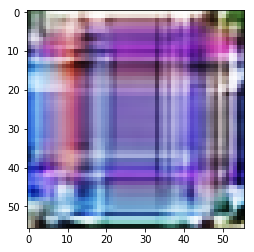

rmse 56.096728071570396
ssim 0.08153801994992056
psnr 13.152052986729421

 next


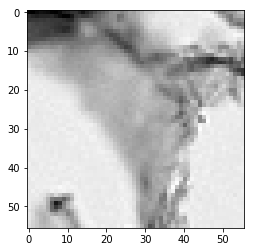

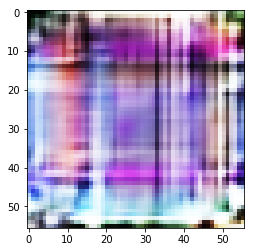

rmse 64.4573700428009
ssim 0.12026963130969755
psnr 11.945351975224195

 next


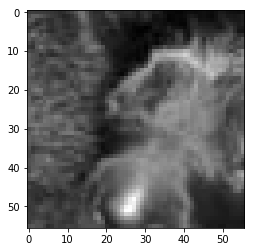

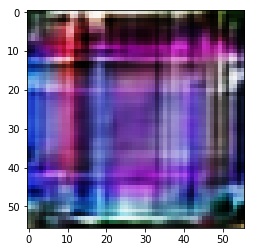

rmse 61.78454026579857
ssim 0.11429842611374082
psnr 12.313207219260029

 next


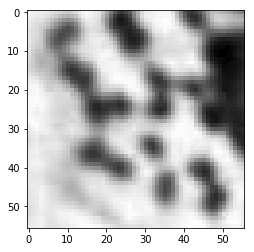

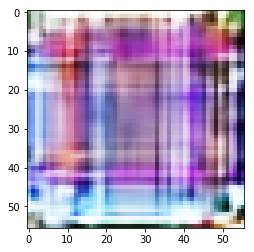

rmse 61.62604317069054
ssim 0.1804652400639181
psnr 12.335517931917755

 next


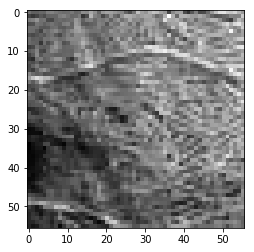

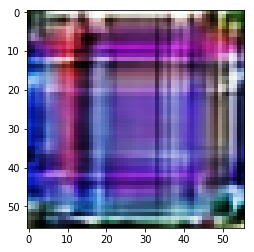

rmse 63.92216116189957
ssim 0.07779444813339038
psnr 12.017774613968122

 next


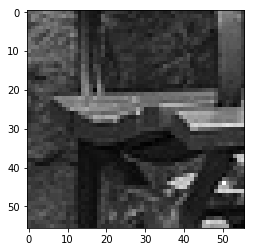

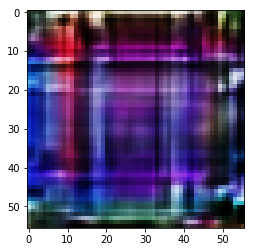

rmse 63.649039417505264
ssim 0.10986064363899432
psnr 12.054966534140872

 next


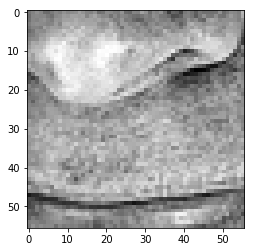

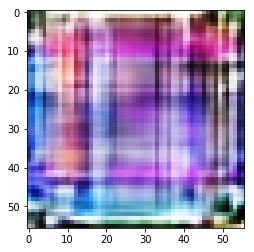

rmse 67.60784938931465
ssim 0.1306261301934682
psnr 11.530861184353578

 next


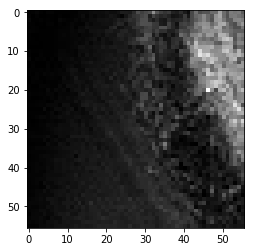

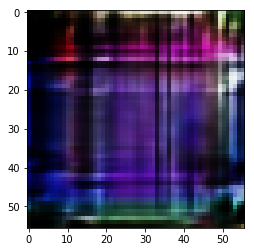

rmse 53.13338488340378
ssim 0.14430959125834983
psnr 13.623453934806388

 next


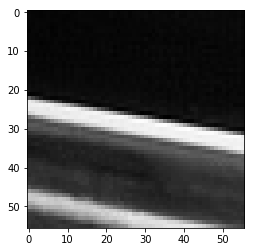

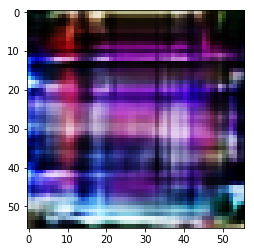

rmse 71.36644810438156
ssim 0.1975433816510456
psnr 11.06092195798874

 next


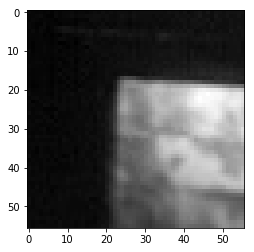

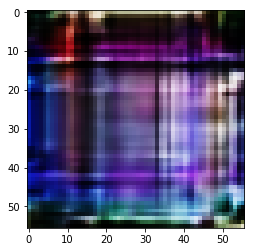

rmse 58.167787939310074
ssim 0.11925939171666888
psnr 12.837152641811965

 next


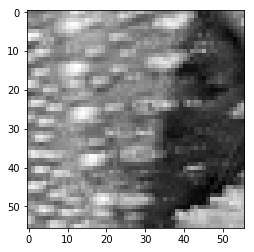

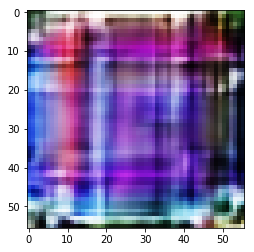

rmse 64.88778054714203
ssim 0.09446966861794619
psnr 11.88754521677037

 next


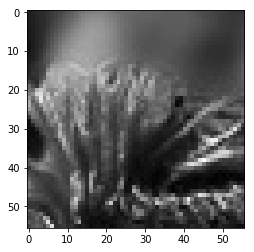

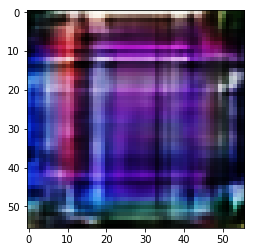

rmse 63.45920920372009
ssim 0.09983859550200896
psnr 12.080910491840822

 next


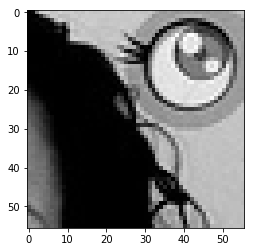

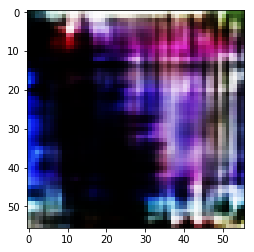

rmse 61.114119440317154
ssim 0.27736687066352533
psnr 12.407972436033244

 next


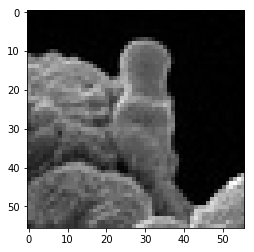

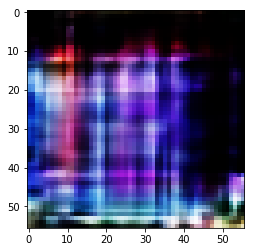

rmse 60.8038242906332
ssim 0.24210890122559336
psnr 12.452185702142998

 next


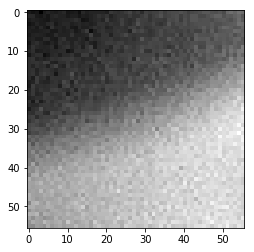

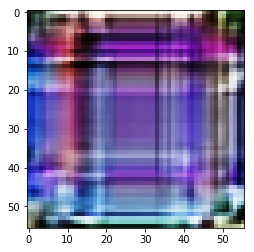

rmse 58.04700382053852
ssim 0.08926779747093934
psnr 12.855207450284103

 next


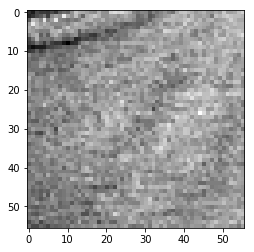

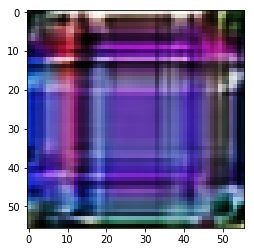

rmse 62.60639816522598
ssim 0.072132453144921
psnr 12.198429230137988

 next


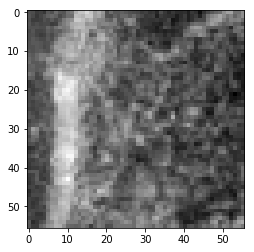

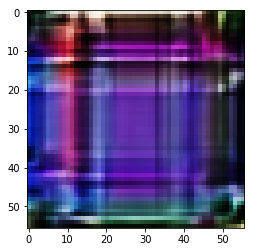

rmse 63.09599049389362
ssim 0.09638999849320273
psnr 12.130768360944636

 next


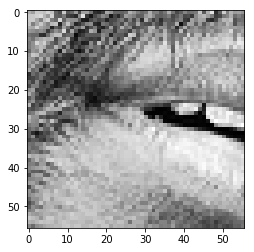

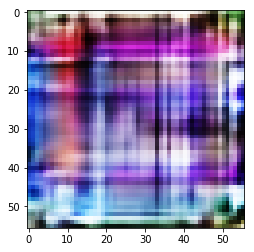

rmse 74.73357662558556
ssim 0.08646974996864894
psnr 10.660488261271329

 next


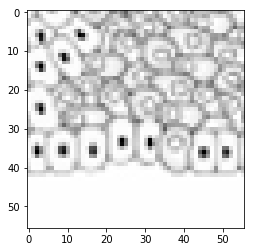

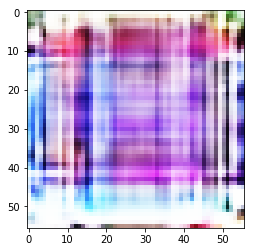

rmse 74.81412470340729
ssim 0.07777119558942745
psnr 10.651131624212312

 next


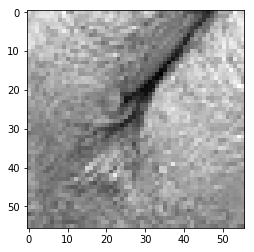

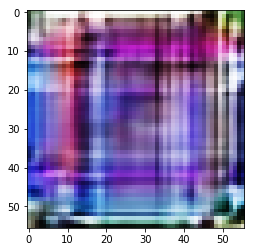

rmse 62.83205285668373
ssim 0.09444171391311475
psnr 12.167178623252441

 next


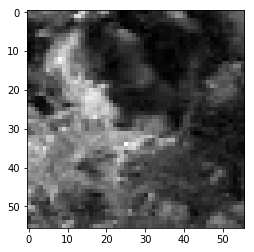

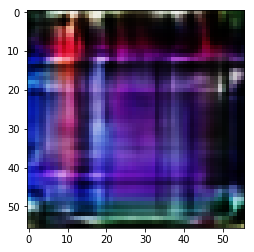

rmse 58.968815356492996
ssim 0.10861483784653621
psnr 12.718355545002197

 next


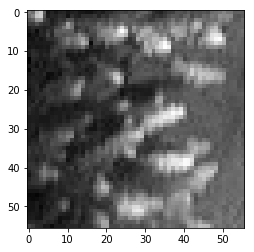

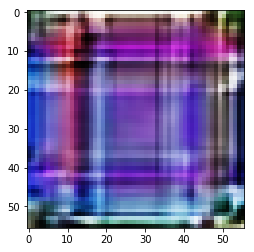

rmse 61.04218550026417
ssim 0.09478131567290149
psnr 12.418202122287363

 next


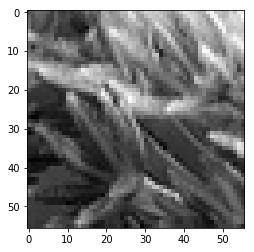

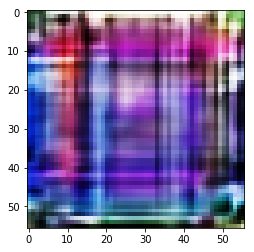

rmse 68.52899596095085
ssim 0.0937107987572136
psnr 11.413316230995441

 next


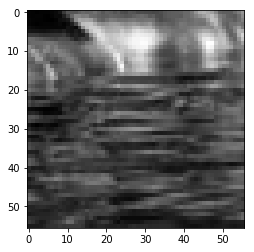

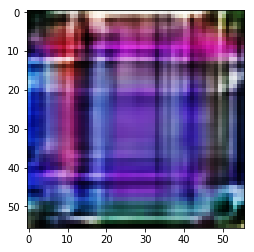

rmse 65.26633143424988
ssim 0.06576543297709327
psnr 11.837019567610255

 next


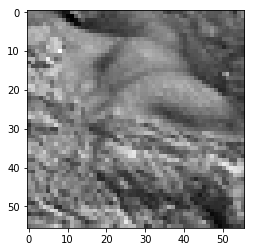

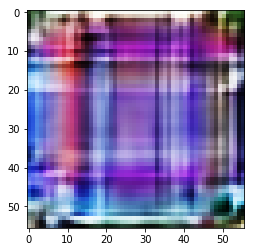

rmse 63.730332255363464
ssim 0.06025753117362644
psnr 12.04387995544934

 next


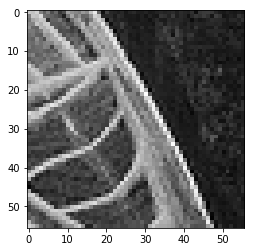

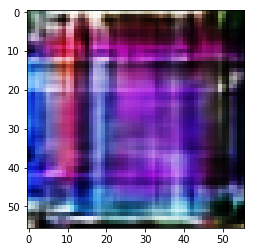

rmse 70.32295569777489
ssim 0.08307386432280234
psnr 11.18886128879328

 next


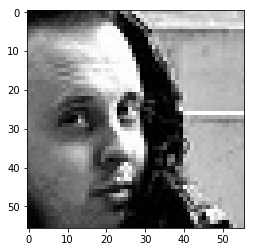

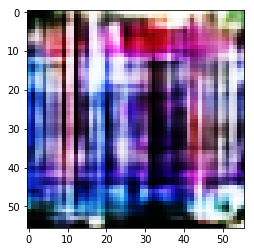

rmse 81.56101986765862
ssim 0.15536895229502176
psnr 9.901150654461135

 next
rmses 0.25505793
ssims 0.1118997526257648
psnrs 12.048086482059919


In [41]:
images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 3)
images = images / 255
predictions = oae.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size, 3))
    plt.imshow(im_1[:, :, 0], cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size, 3))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

In [ ]:
# VAE
rmses 0.074995324
ssims 0.5059693598797744
psnrs 24.523222056506807

# OAE on 56x56
rmses 0.25505793
ssims 0.1118997526257648
psnrs 12.048086482059919

# OAE on 16x16
rmses 0.05975962
ssims 0.6752595144743991
psnrs 27.01498928279417

# OAE on 16x16 other dataset
rmses 0.053720225
ssims 0.7012150733081809
psnrs 27.101235693401605

# OAE on 32x32 other dataset
rmses 0.275013
ssims 0.08755521023284514
psnrs 11.338466030146916

# OAE on 24x24 other dataset
rmses 0.29470614
ssims 0.06684821953073881
psnrs 10.70492824205816

# OAE on 8x8 other dataset
rmses 0.3228558
ssims 0.0569106439300572
psnrs 10.001103957229969

# OAE on 56x56, but grayscaled afterwards
rmses 0.21422918
ssims 0.16835749872977615
psnrs 13.690335572594387

# OAE on 56x56, but grayscaled (equally) afterwards
rmses 0.21284804
ssims 0.16718946933272405
psnrs 13.661733688446883

predictions: 


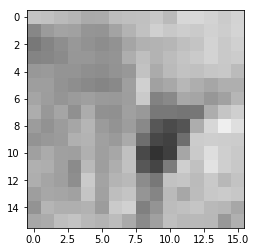

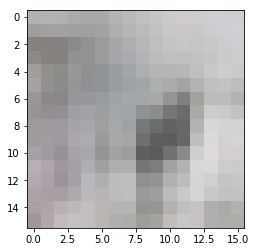

rmse 15.157755240797997
ssim 0.7711932561433409
psnr 24.518105807980124

 next


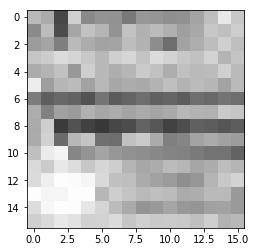

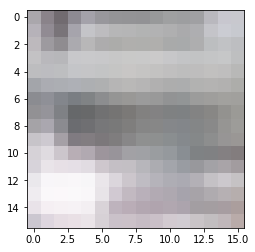

rmse 27.829410284757614
ssim 0.5940836162416073
psnr 19.240723537182703

 next


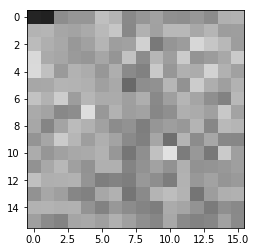

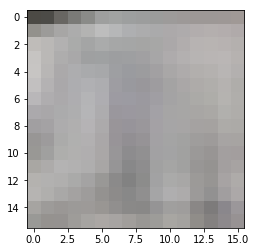

rmse 19.393536150455475
ssim 0.37817937301872234
psnr 22.37766352755722

 next


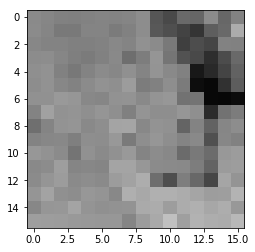

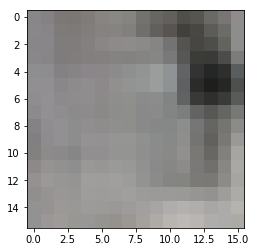

rmse 16.01852685213089
ssim 0.5884133425128262
psnr 24.03835213702115

 next


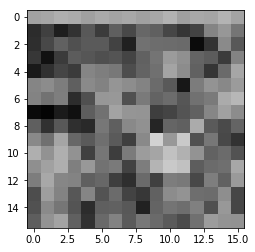

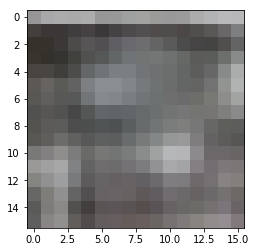

rmse 28.970354162156582
ssim 0.5235542241080334
psnr 18.89172751908082

 next


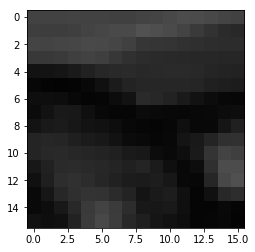

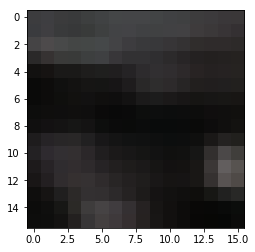

rmse 6.59581289626658
ssim 0.9072583057235786
psnr 31.745437058773092

 next


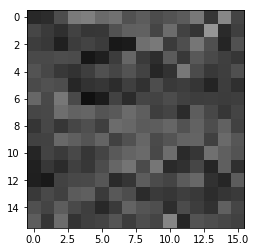

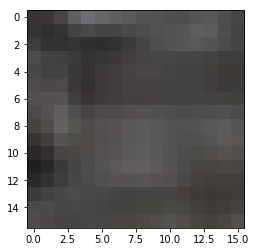

rmse 19.29604098200798
ssim 0.42772254410269167
psnr 22.42143935188154

 next


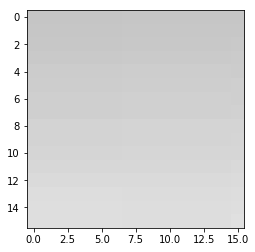

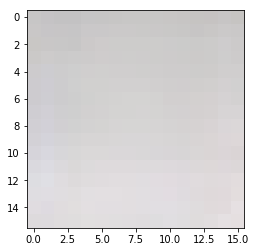

rmse 2.9490633169189095
ssim 0.9078072495159488
psnr 38.7371216680311

 next


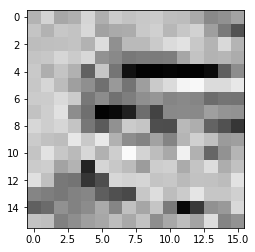

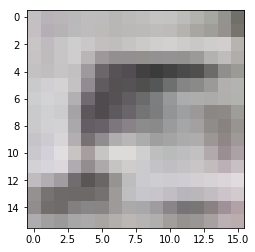

rmse 37.924849167466164
ssim 0.6028267354706515
psnr 16.552326364456885

 next


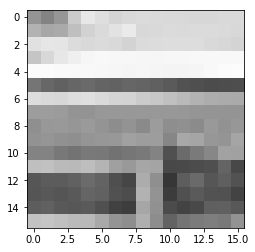

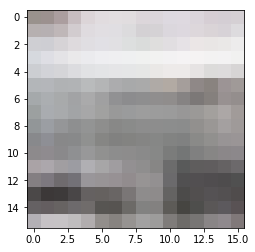

rmse 28.782893121242523
ssim 0.5794530777980046
psnr 18.94811470795165

 next


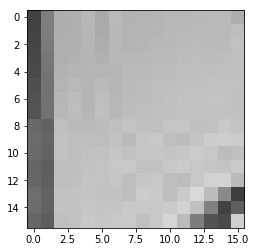

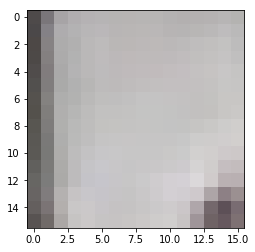

rmse 12.247238717973232
ssim 0.7660542002596337
psnr 26.37003994850464

 next


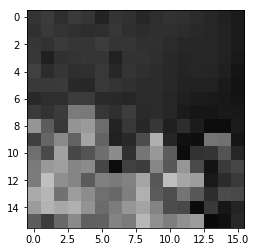

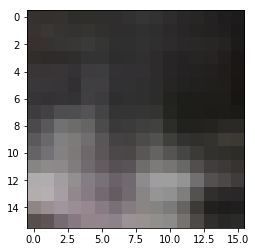

rmse 24.163456298410892
ssim 0.6558446587527359
psnr 20.4676225064119

 next


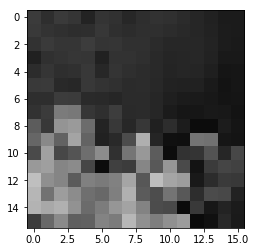

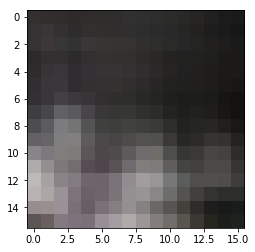

rmse 23.19871846586466
ssim 0.6742099546093773
psnr 20.821523719978163

 next


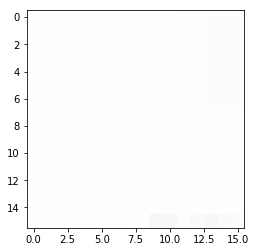

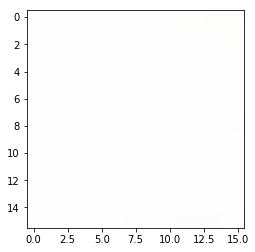

rmse 0.8526324480772018
ssim 0.7349788150181285
psnr 49.51556648292767

 next


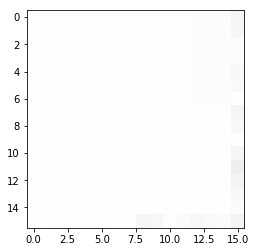

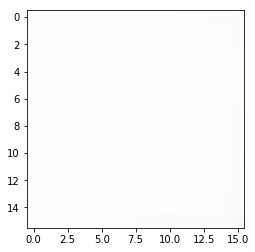

rmse 1.734010234940797
ssim 0.7801050617213244
psnr 43.34977047753395

 next


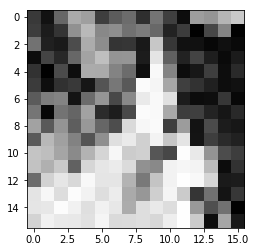

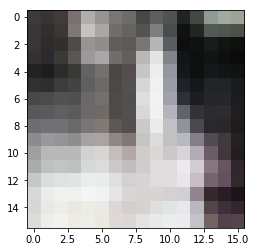

rmse 43.2855711132288
ssim 0.6720623208462694
psnr 15.403940568546039

 next


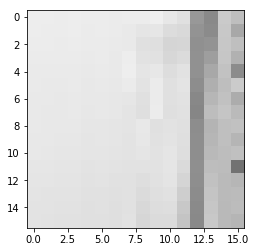

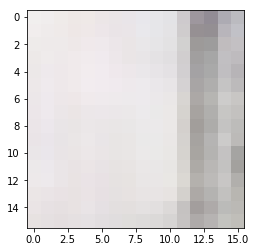

rmse 10.00695588067174
ssim 0.7793528123252473
psnr 28.12476390782256

 next


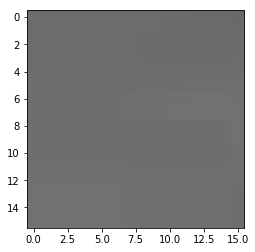

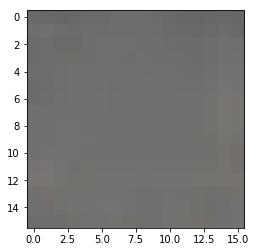

rmse 2.5159110222011805
ssim 0.5329147099542239
psnr 40.11689805326494

 next


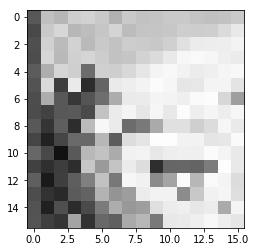

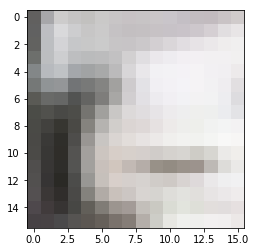

rmse 30.770741254091263
ssim 0.6586260887470515
psnr 18.36804444181638

 next


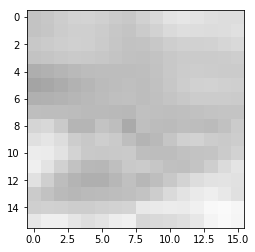

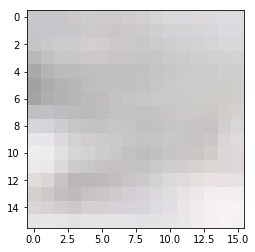

rmse 7.541865231469274
ssim 0.76604197620855
psnr 30.581228257449276

 next


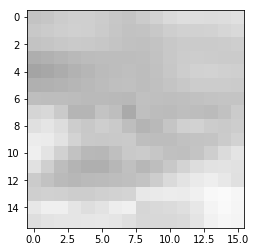

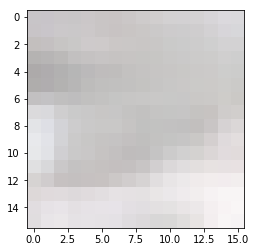

rmse 8.085790369659662
ssim 0.6720738637526568
psnr 29.976354054182824

 next


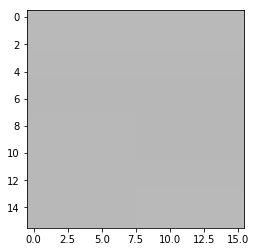

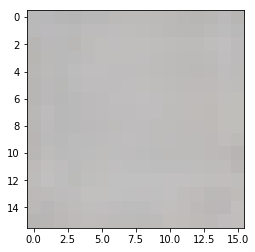

rmse 4.431853238493204
ssim 0.08232348220647275
psnr 35.19909620409062

 next


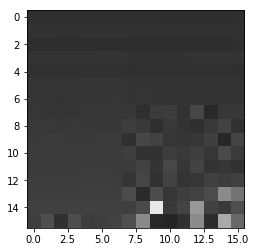

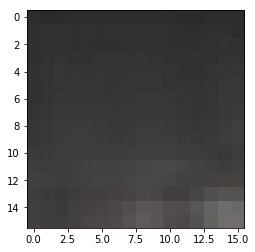

rmse 15.313074756413698
ssim 0.6757296352436458
psnr 24.429555554778766

 next


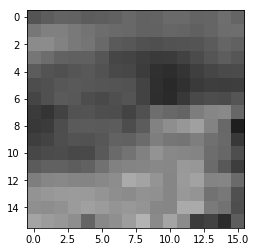

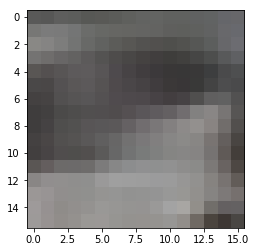

rmse 11.36706629768014
ssim 0.8986671259613347
psnr 27.017835748747842

 next


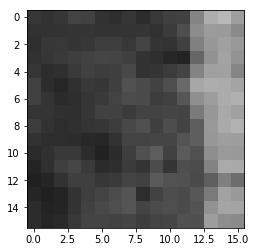

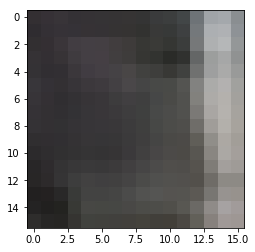

rmse 9.868067633360624
ssim 0.7733188632499268
psnr 28.246161261123973

 next


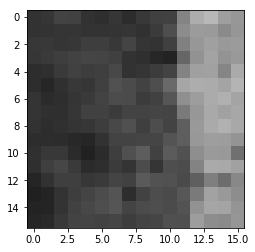

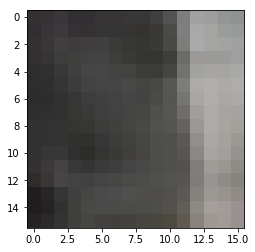

rmse 9.890529178082943
ssim 0.8369773111038996
psnr 28.226413038670415

 next


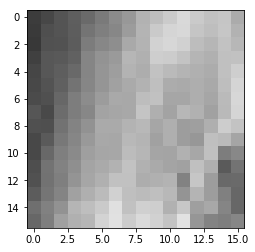

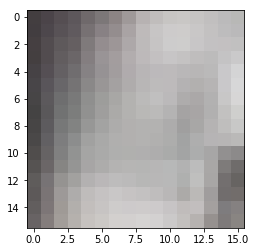

rmse 10.256476141512394
ssim 0.8351100597701834
psnr 27.91084012643327

 next


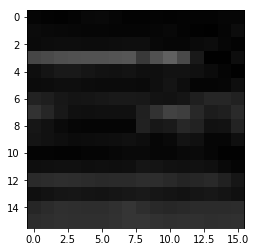

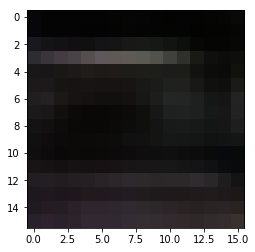

rmse 9.170113485306501
ssim 0.7582481843157737
psnr 28.8833094018492

 next


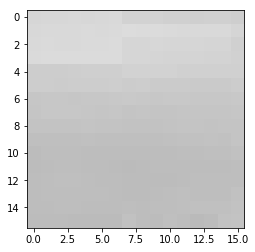

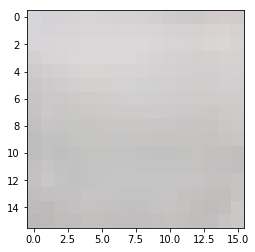

rmse 4.444006411358714
ssim 0.7655204011429295
psnr 35.17531007217873

 next


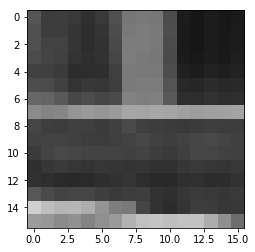

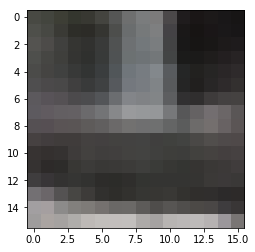

rmse 19.550220742821693
ssim 0.8016834819283233
psnr 22.30777030053944

 next


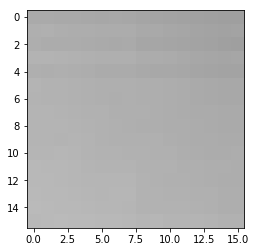

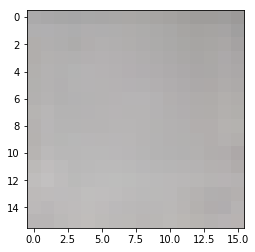

rmse 4.392473101615906
ssim 0.7480065668588788
psnr 35.27662139534066

 next


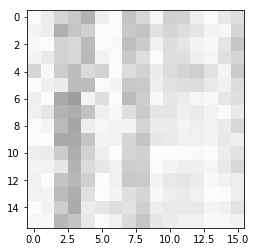

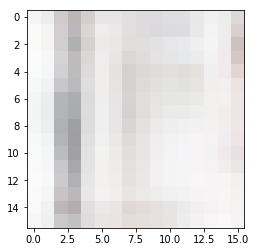

rmse 13.383478447794914
ssim 0.6237828043789357
psnr 25.599423530850732

 next


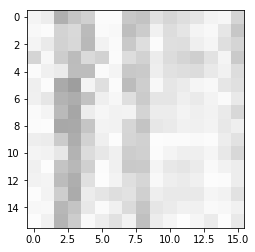

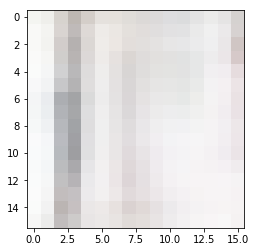

rmse 13.695267867296934
ssim 0.600310885012849
psnr 25.399392986917842

 next


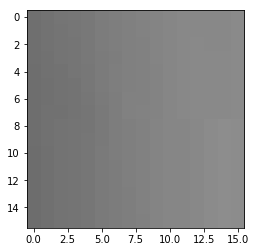

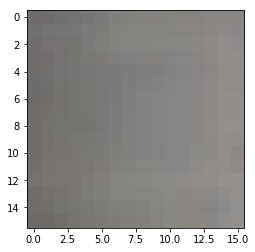

rmse 2.770694000646472
ssim 0.8883593890257014
psnr 39.279032321969325

 next


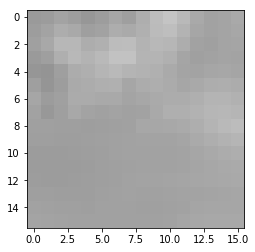

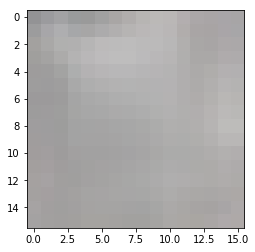

rmse 5.408224621787667
ssim 0.7810166482642164
psnr 33.46970918825811

 next


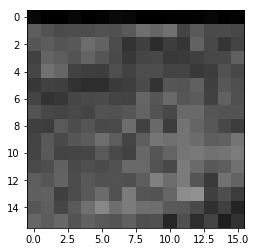

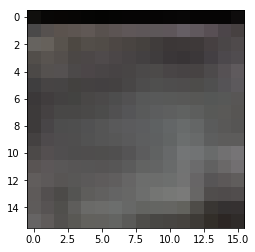

rmse 13.289040215313435
ssim 0.6048403100391281
psnr 25.660931294934045

 next


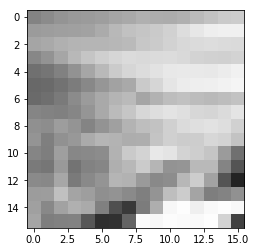

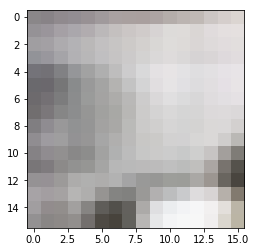

rmse 19.57655142992735
ssim 0.7542029876327888
psnr 22.296079815272257

 next


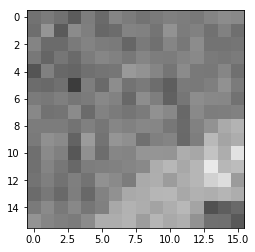

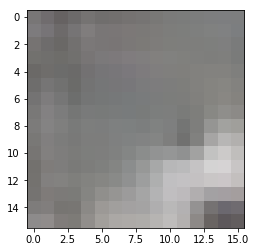

rmse 13.46021817997098
ssim 0.5506358646215842
psnr 25.549761618067777

 next


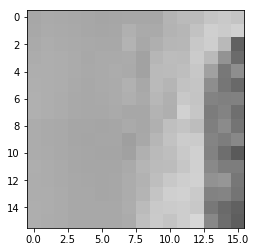

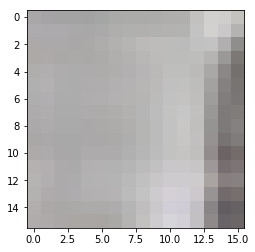

rmse 9.492773171514273
ssim 0.7584683056473311
psnr 28.58294153684746

 next


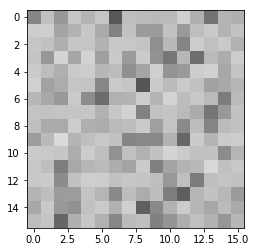

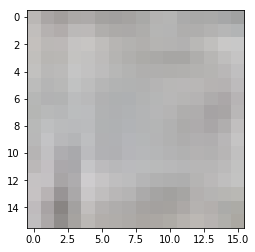

rmse 24.5183477550745
ssim 0.18748536922072956
psnr 20.3409795976495

 next


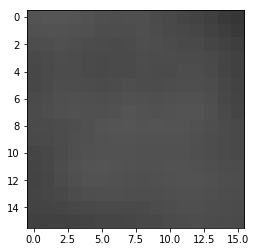

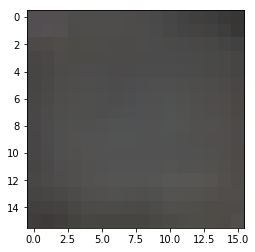

rmse 2.503019501455128
ssim 0.7714225807532816
psnr 40.161518942992

 next


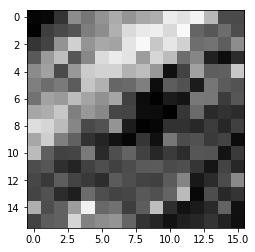

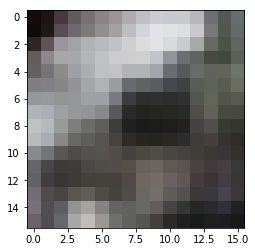

rmse 32.61296220123768
ssim 0.7168284238377463
psnr 17.862998666460122

 next


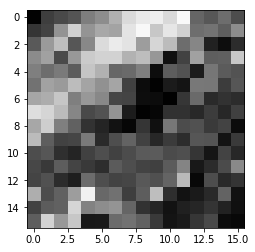

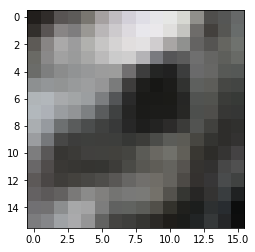

rmse 34.00815233588219
ssim 0.7019096967731354
psnr 17.499142861896708

 next


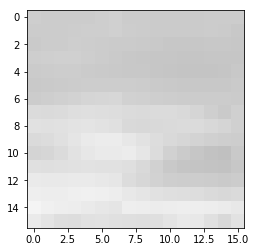

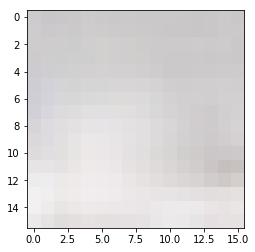

rmse 5.561395827680826
ssim 0.7527114943652978
psnr 33.227127474234074

 next


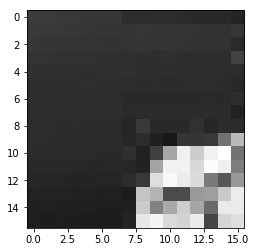

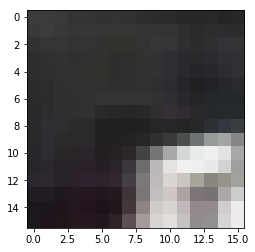

rmse 23.00535824149847
ssim 0.7535714461950226
psnr 20.894223598158483

 next


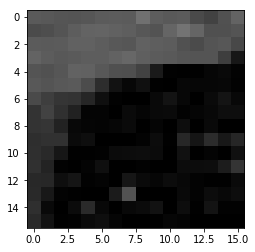

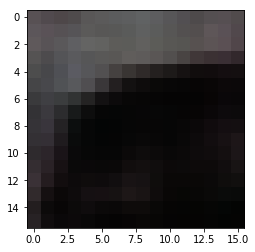

rmse 10.650444701313972
ssim 0.7001851489525964
psnr 27.583448772818393

 next


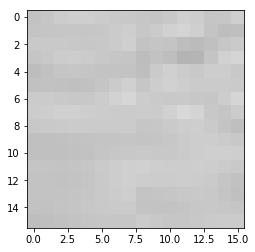

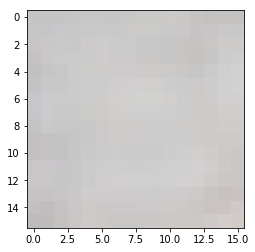

rmse 5.188711825758219
ssim 0.4395009225821753
psnr 33.82961258429056

 next


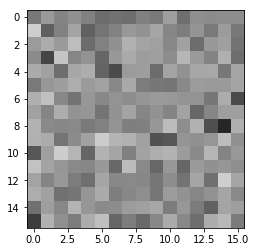

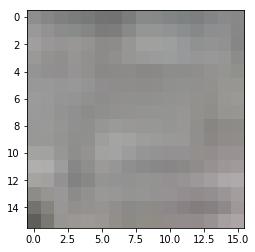

rmse 25.3660461679101
ssim 0.19600618186910823
psnr 20.045748037423273

 next


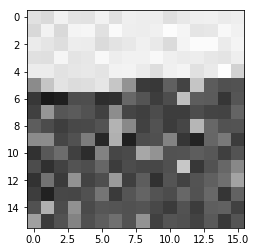

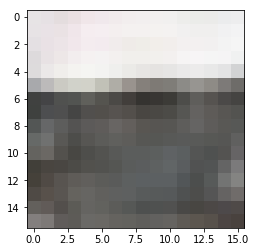

rmse 27.814969159662724
ssim 0.5621188253796549
psnr 19.24523195377005

 next


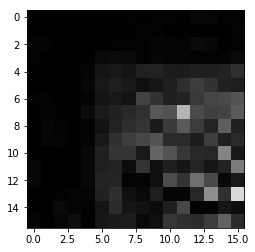

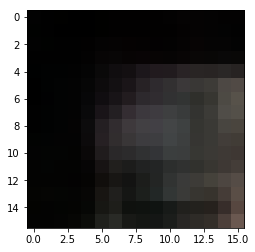

rmse 20.96655674278736
ssim 0.6831589269085939
psnr 21.700261332601972

 next


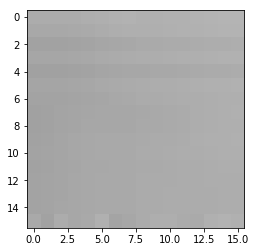

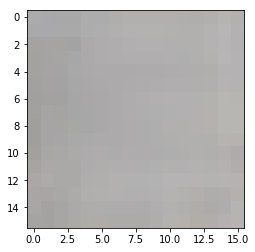

rmse 4.1919455118477345
ssim 0.663085498533274
psnr 35.68249103020412

 next


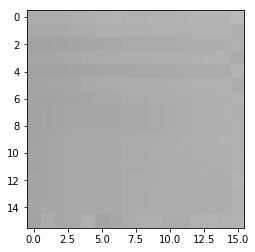

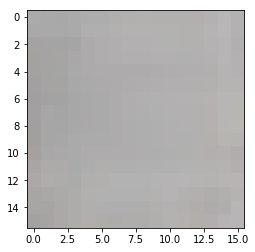

rmse 4.310889104381204
ssim 0.6495863353331862
psnr 35.43946658920176

 next


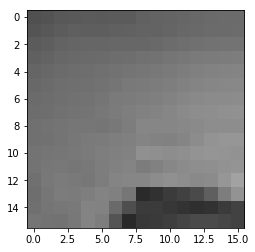

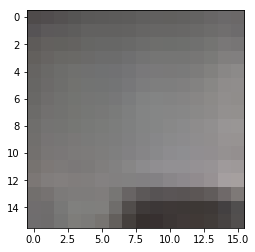

rmse 6.829143175855279
ssim 0.9114637256529708
psnr 31.44347924907725

 next


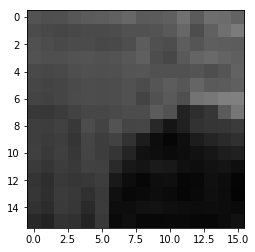

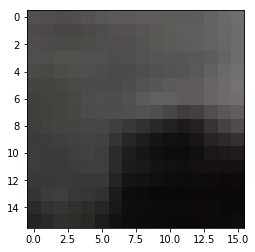

rmse 8.405512813478708
ssim 0.8247857407582155
psnr 29.639519317963668

 next


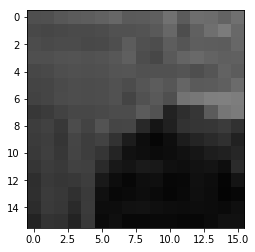

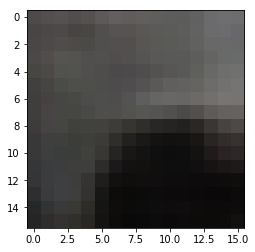

rmse 8.935399129986763
ssim 0.8252016070353926
psnr 29.1085244783834

 next


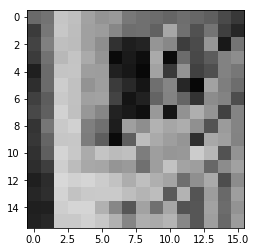

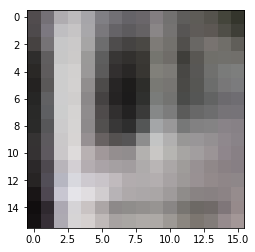

rmse 31.964306607842445
ssim 0.6736586710528379
psnr 18.037497851647796

 next


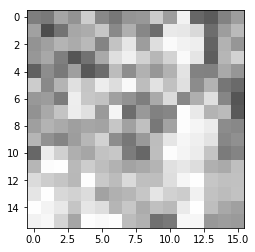

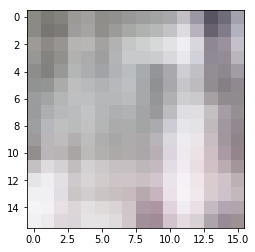

rmse 30.633813701570034
ssim 0.4963217495245427
psnr 18.40678227101578

 next


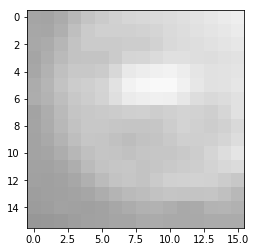

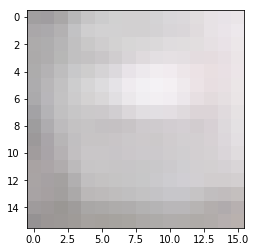

rmse 5.727546187117696
ssim 0.9226112277539759
psnr 32.971431607873015

 next


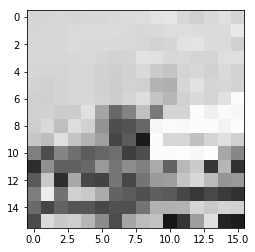

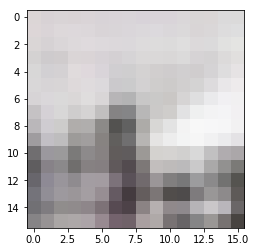

rmse 33.79020743072033
ssim 0.6988543317750177
psnr 17.55498645223373

 next


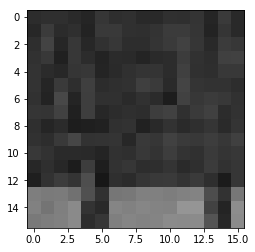

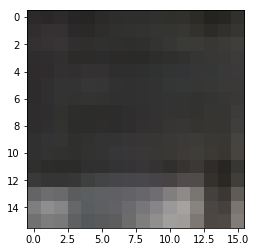

rmse 13.688825313001871
ssim 0.4909004930771383
psnr 25.403479981236636

 next


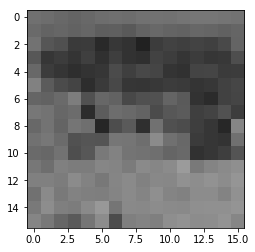

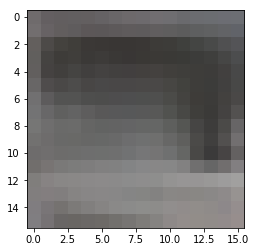

rmse 13.465422950685024
ssim 0.7260199471196467
psnr 25.54640362452123

 next


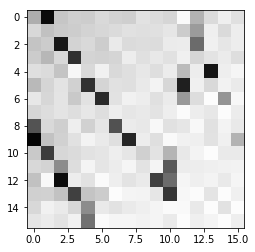

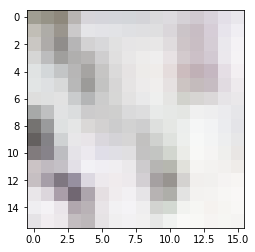

rmse 39.630197659134865
ssim 0.39342941416269417
psnr 16.17027884024033

 next


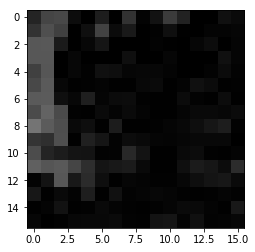

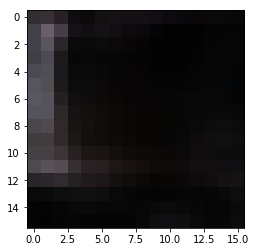

rmse 12.376744318753481
ssim 0.5511853402596752
psnr 26.278675222830856

 next


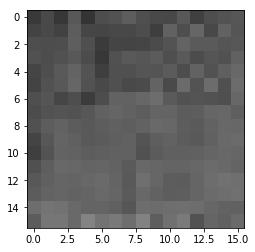

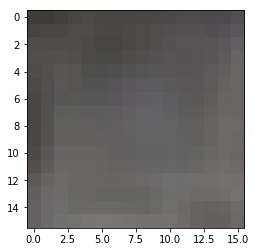

rmse 8.395594395697117
ssim 0.5453390648541249
psnr 29.64977462925601

 next


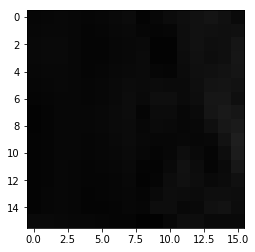

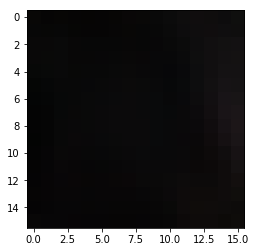

rmse 2.577725392766297
ssim 0.5786992921879204
psnr 39.90607061410735

 next


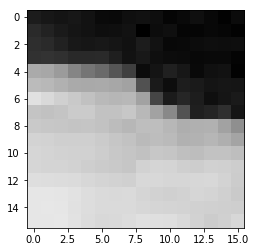

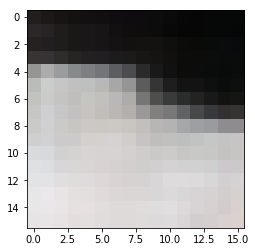

rmse 10.294044725596905
ssim 0.929438836108959
psnr 27.879082591834326

 next


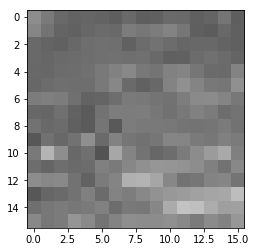

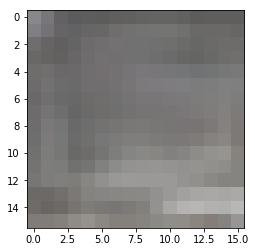

rmse 12.214997448027134
ssim 0.5167239521618144
psnr 26.392935997156957

 next


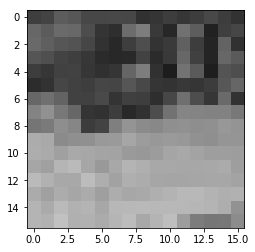

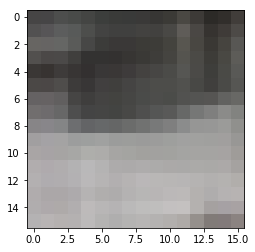

rmse 16.03160385042429
ssim 0.7755063762552531
psnr 24.031264155300825

 next


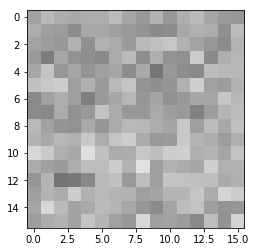

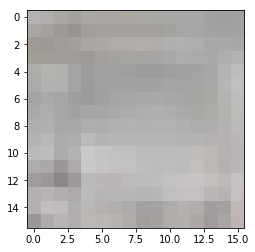

rmse 17.156166806817055
ssim 0.3916640302389071
psnr 23.442398405335577

 next


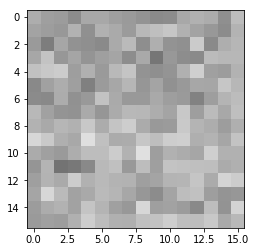

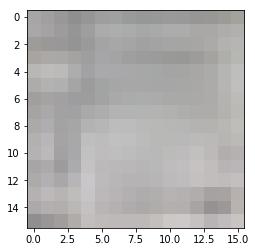

rmse 17.600104585289955
ssim 0.36709875462818903
psnr 23.22049863798774

 next


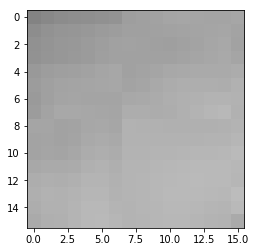

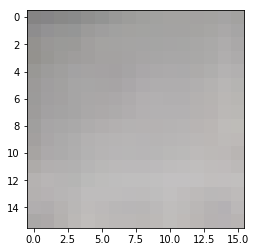

rmse 4.734291359782219
ssim 0.8610248929851828
psnr 34.62570396963607

 next


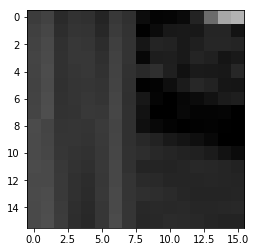

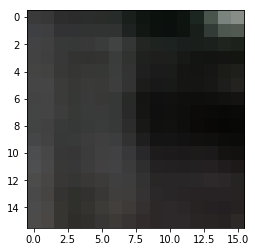

rmse 10.07615776732564
ssim 0.8018235660642099
psnr 28.064904431874666

 next


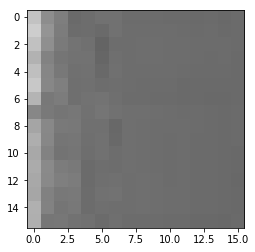

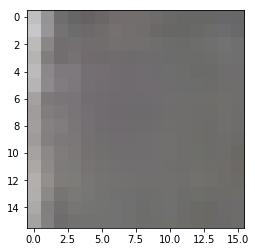

rmse 4.973429627716541
ssim 0.7399742053067985
psnr 34.19768406454415

 next


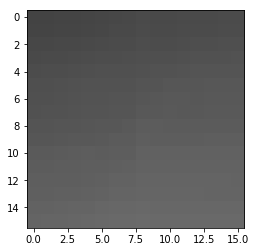

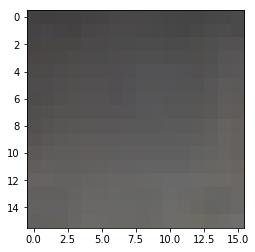

rmse 2.7180245518684387
ssim 0.9311928969948321
psnr 39.44573610090541

 next


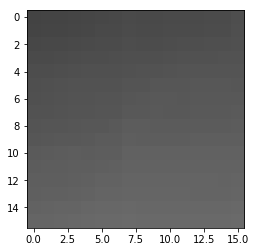

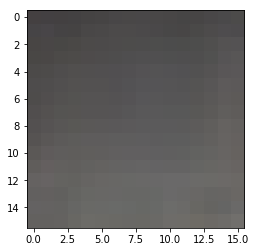

rmse 2.728160982951522
ssim 0.9317482007706882
psnr 39.41340373807571

 next


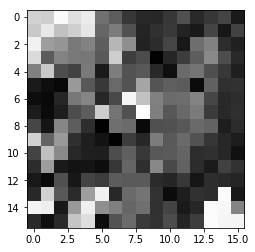

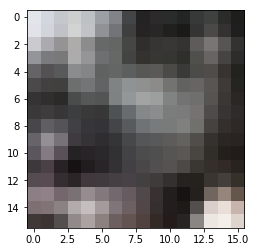

rmse 41.78253136575222
ssim 0.576270387135649
psnr 15.71090865123837

 next


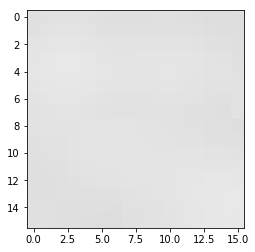

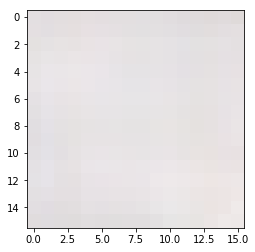

rmse 3.309828070923686
ssim 0.4994836631931412
psnr 37.73469491013391

 next


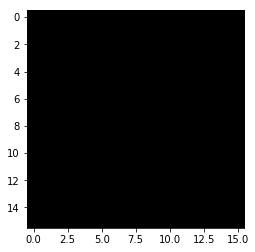

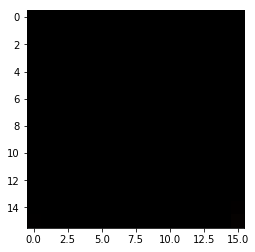

rmse 0.26003572158515453
ssim 0.6609727650832006
psnr 59.83014337067068

 next


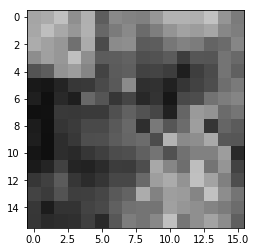

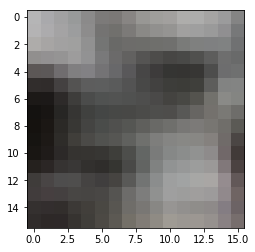

rmse 19.837430231273174
ssim 0.7550166138682225
psnr 22.181095361853377

 next


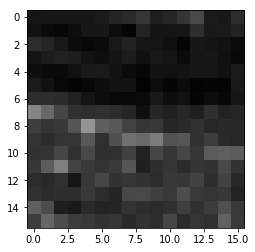

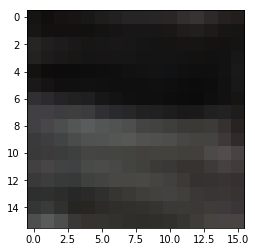

rmse 13.921464029699564
ssim 0.7282291241855162
psnr 25.257105416713863

 next


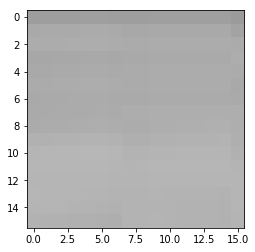

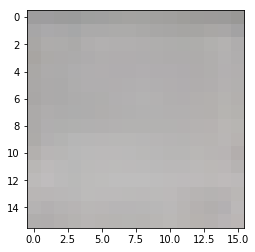

rmse 4.2150800954550505
ssim 0.7767467781431664
psnr 35.63468697758413

 next


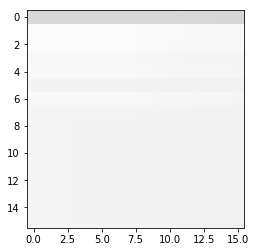

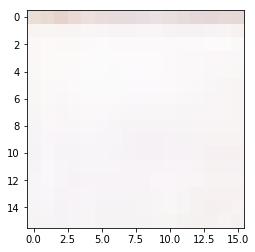

rmse 4.155167760327458
ssim 0.628506227792731
psnr 35.75903235595781

 next


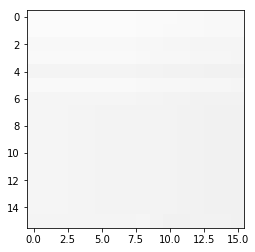

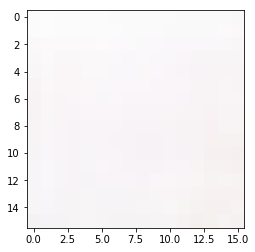

rmse 2.8997106151655316
ssim 0.5202275275486788
psnr 38.88371044040864

 next


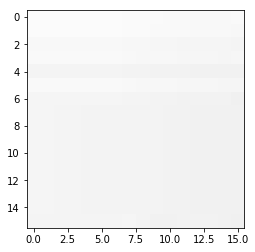

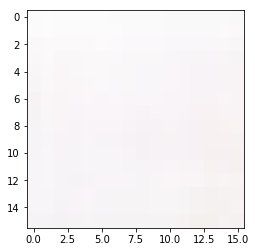

rmse 2.937168055213988
ssim 0.48170441331513264
psnr 38.77222768561802

 next


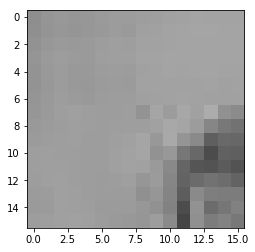

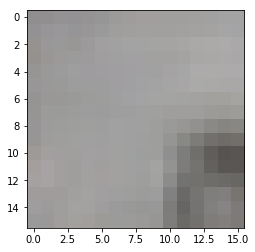

rmse 7.4339828453958035
ssim 0.7238449060106178
psnr 30.70637251695695

 next


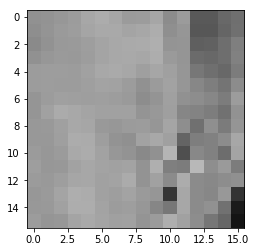

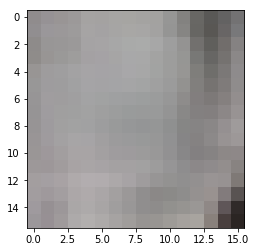

rmse 12.498450838029385
ssim 0.6290126696866181
psnr 26.193679883221076

 next


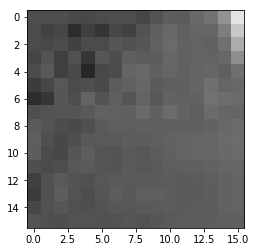

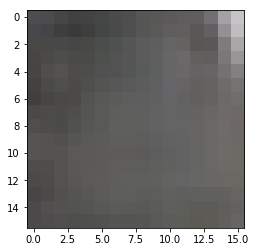

rmse 7.608039630576968
ssim 0.717821134055909
psnr 30.50534828483416

 next


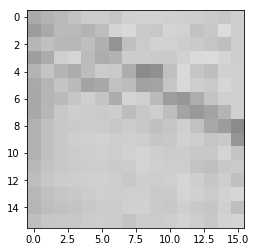

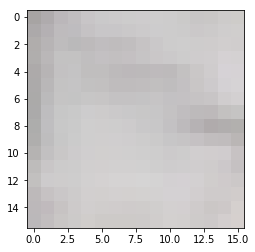

rmse 11.17457052692771
ssim 0.49941363266303035
psnr 27.166186791605618

 next


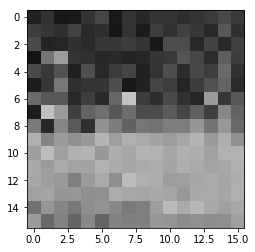

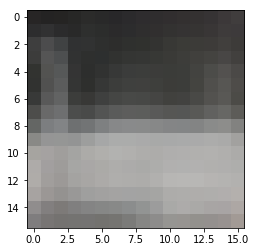

rmse 21.195158176124096
ssim 0.7216884623268748
psnr 21.606070368927377

 next


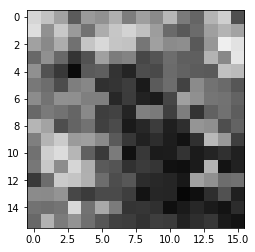

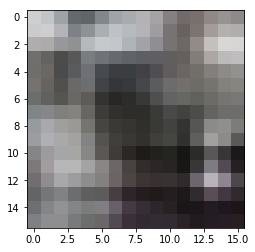

rmse 30.449954867362976
ssim 0.7085812938865304
psnr 18.459070543435697

 next


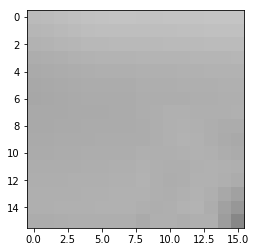

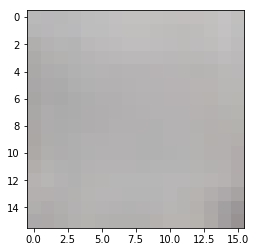

rmse 4.471723074093461
ssim 0.7885794412547492
psnr 35.121305596250416

 next


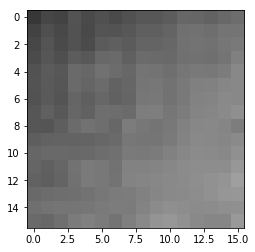

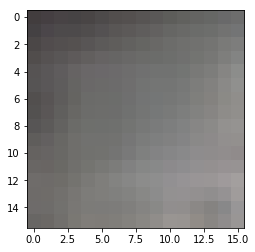

rmse 5.495518762618303
ssim 0.8687368682170816
psnr 33.330629709490566

 next


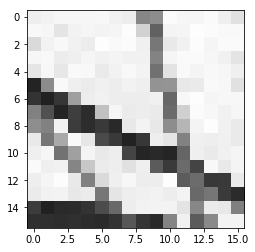

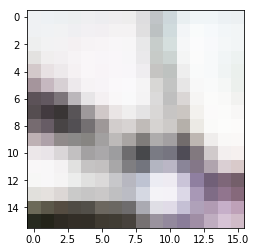

rmse 48.076122254133224
ssim 0.593729669188962
psnr 14.492214990993482

 next


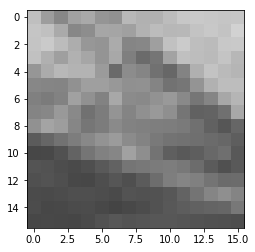

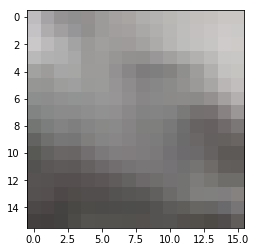

rmse 12.798965312540531
ssim 0.7556133903114293
psnr 25.987306367623425

 next


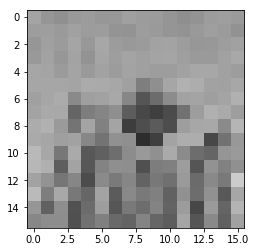

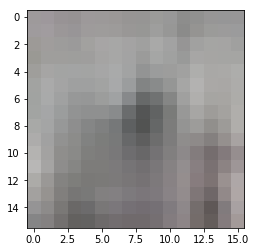

rmse 19.698863066732883
ssim 0.6316721726994117
psnr 22.241980383003472

 next


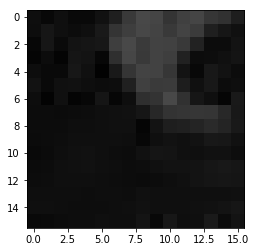

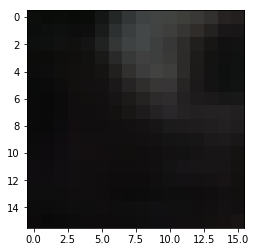

rmse 6.707942504435778
ssim 0.760514875506141
psnr 31.599016978755706

 next


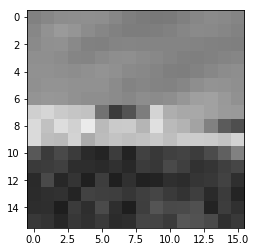

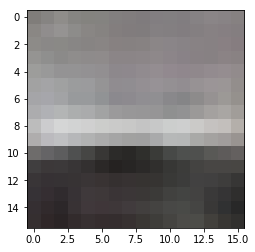

rmse 19.35045976191759
ssim 0.7657994509641094
psnr 22.396977844638172

 next


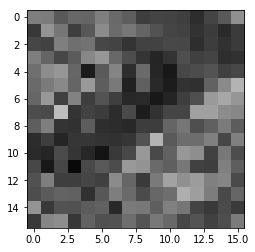

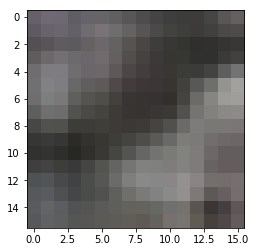

rmse 25.613490790128708
ssim 0.6119579152723005
psnr 19.961428183334007

 next


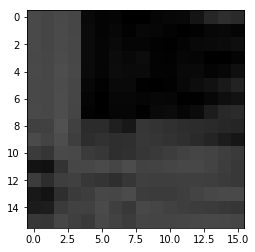

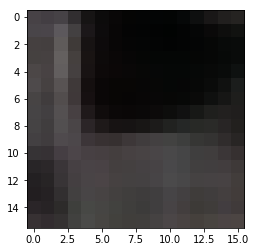

rmse 8.981759492307901
ssim 0.8005998843760941
psnr 29.063575176113527

 next


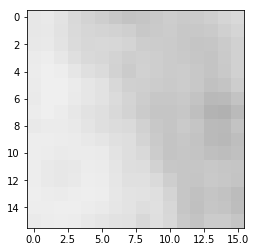

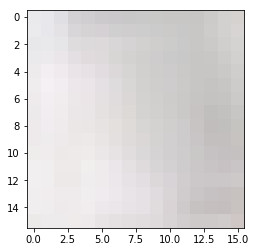

rmse 4.58583427593112
ssim 0.9077845587265291
psnr 34.902436488062406

 next
rmses 0.056164183
ssims 0.6748470348607912
psnrs 27.969169224473895


In [52]:
images_directory = '/home/niaki/Code/ImageNet/tiny-imagenet-200/tiny_test16/class0/'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img = np.dot(img[...,:3], [0.2989, 0.5870, 0.1140])
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], img.shape[0], img.shape[1], 3)
images = images / 255
predictions = oae_aux.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((img.shape[0], img.shape[1], 3))
    plt.imshow(im_1)
    plt.show()
    
    pred_1 = predictions[i].reshape((img.shape[0], img.shape[1], 3))
    plt.imshow(pred_1)
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

predictions: 


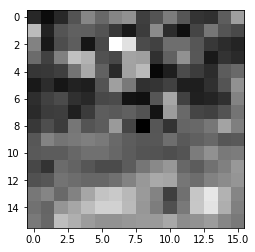

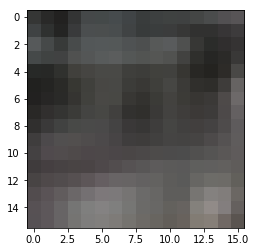

rmse 22.396182529628277
ssim 0.48847622515350375
psnr 21.12732364164391

 next


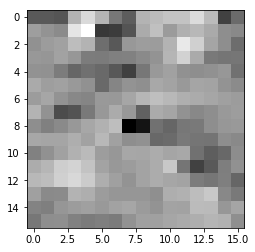

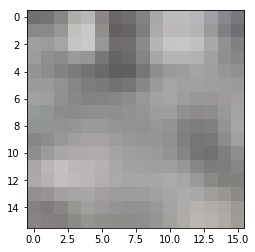

rmse 19.44294299930334
ssim 0.5496339156687889
psnr 22.355563549528043

 next


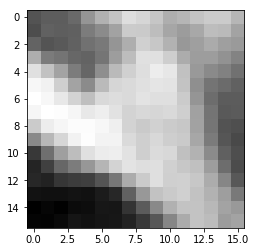

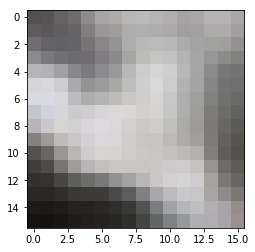

rmse 11.526045016944408
ssim 0.9313548182779798
psnr 26.897197379475344

 next


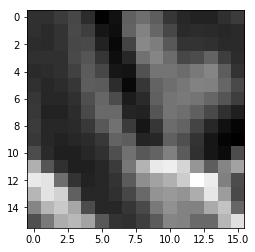

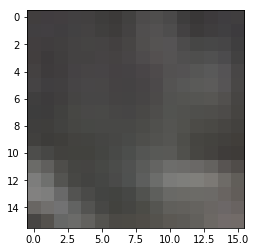

rmse 8.903714530169964
ssim 0.6803303506201673
psnr 29.139379063636177

 next


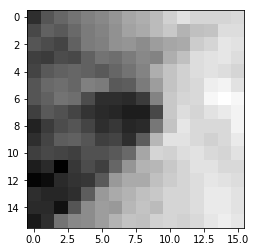

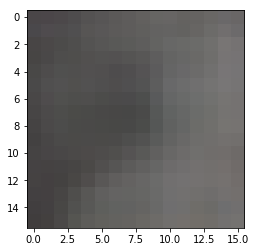

rmse 4.5678697898983955
ssim 0.8685266818388172
psnr 34.93652929733219

 next


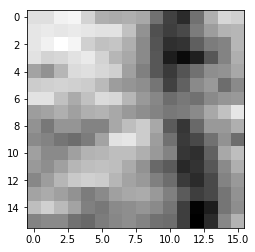

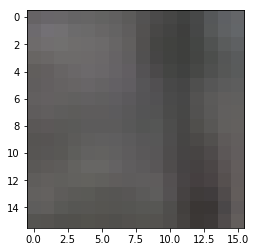

rmse 6.109207682311535
ssim 0.7483731115716813
psnr 32.4111058244911

 next


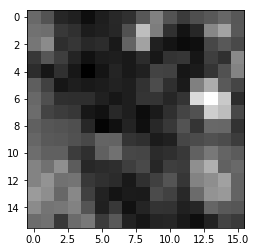

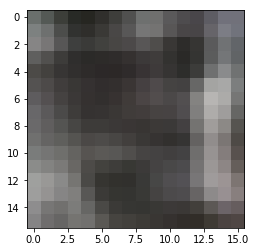

rmse 21.22900675982237
ssim 0.7307556871792714
psnr 21.592210102014022

 next


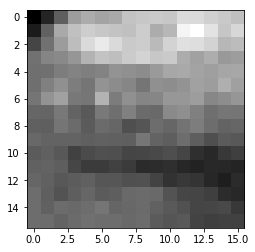

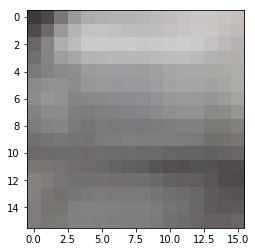

rmse 8.238638117909431
ssim 0.9018131669443017
psnr 29.813695070754992

 next


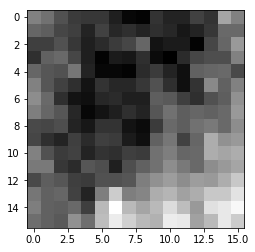

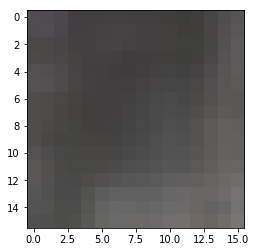

rmse 6.200590878725052
ssim 0.7311484758390708
psnr 32.28214206664167

 next


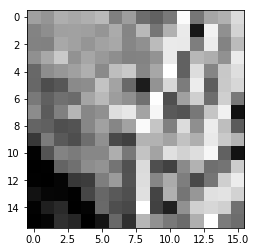

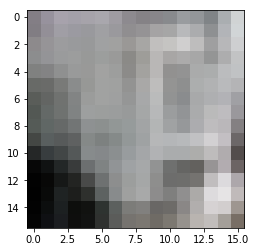

rmse 42.450748309493065
ssim 0.40184331959045666
psnr 15.573096603383942

 next


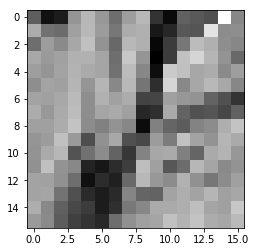

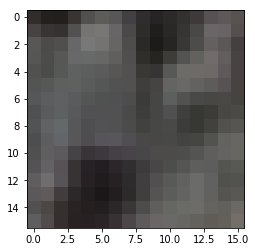

rmse 19.033541567623615
ssim 0.5628238439178729
psnr 22.54041151065082

 next


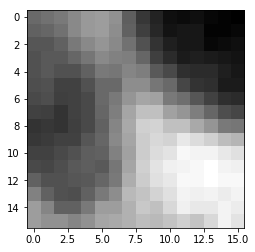

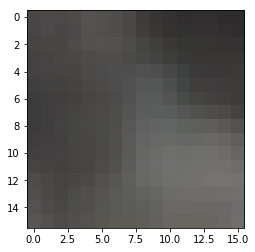

rmse 3.6922834860160947
ssim 0.9453017149131258
psnr 36.78490285105963

 next


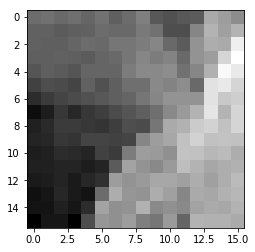

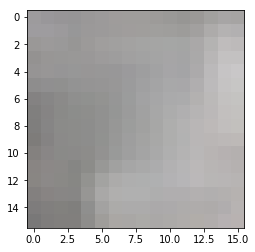

rmse 6.307903295382857
ssim 0.8369496329280345
psnr 32.13310307535007

 next


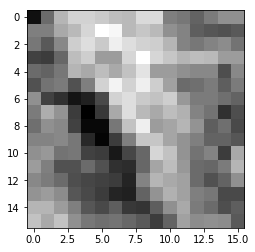

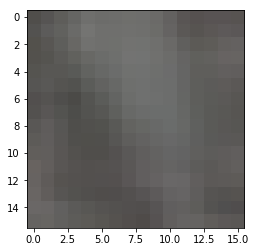

rmse 7.314895810559392
ssim 0.7442556755685664
psnr 30.84664071571055

 next


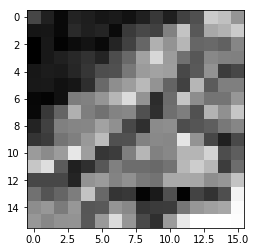

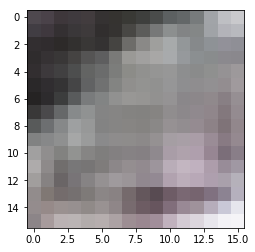

rmse 30.88262055069208
ssim 0.5157976255403424
psnr 18.336520701300664

 next


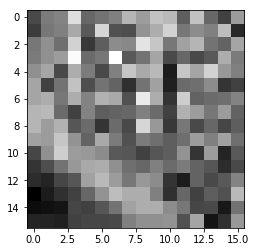

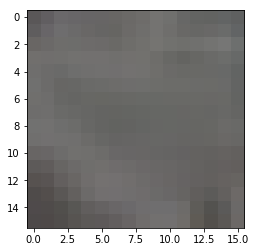

rmse 9.786076582968235
ssim 0.2977907897122889
psnr 28.318631406707205

 next


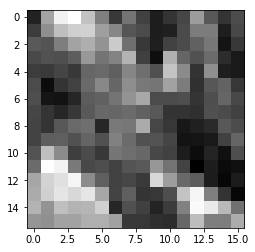

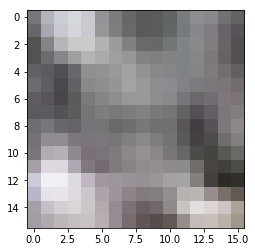

rmse 23.86640153825283
ssim 0.682748961364076
psnr 20.575064746675025

 next


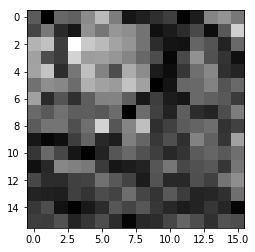

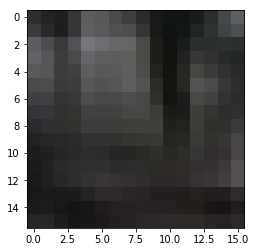

rmse 20.08061908185482
ssim 0.49610641560643587
psnr 22.075261650684766

 next


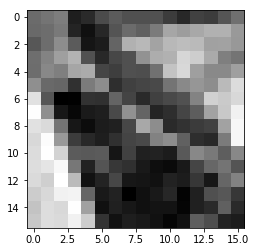

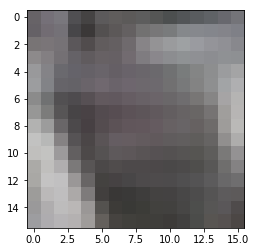

rmse 17.535395957529545
ssim 0.6652284772173026
psnr 23.252492070620505

 next


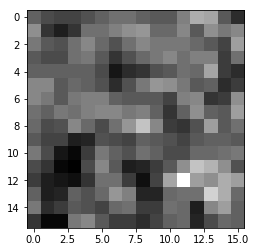

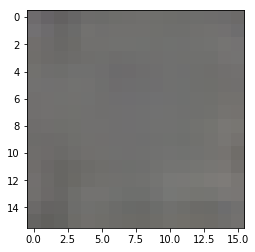

rmse 4.8687053471803665
ssim 0.33376088938152826
psnr 34.38253376970537

 next


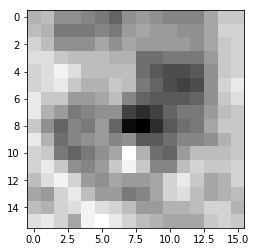

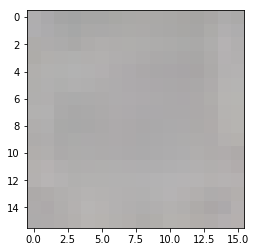

rmse 4.56517668440938
ssim 0.5873549842563769
psnr 34.94165179787022

 next


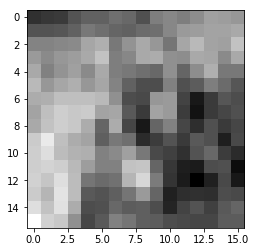

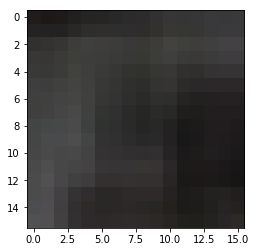

rmse 7.9893515445292
ssim 0.6839292447420261
psnr 30.080572983754177

 next


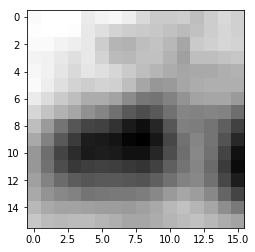

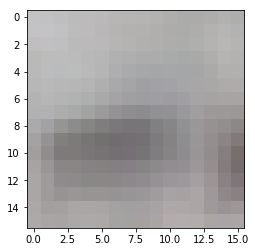

rmse 4.612441398203373
ssim 0.952136119276718
psnr 34.85218638023576

 next


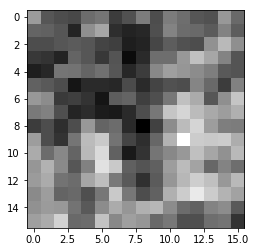

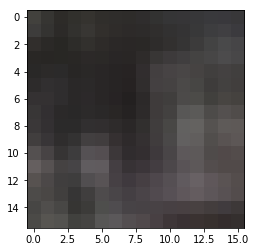

rmse 13.691526968032122
ssim 0.6088291904305764
psnr 25.401765885138225

 next


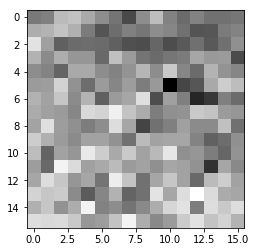

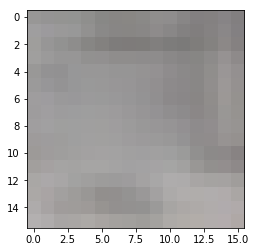

rmse 14.899936225265265
ssim 0.32308455399849456
psnr 24.66711541771504

 next


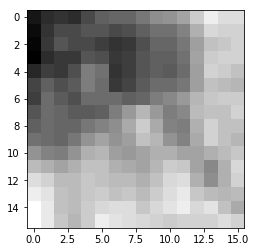

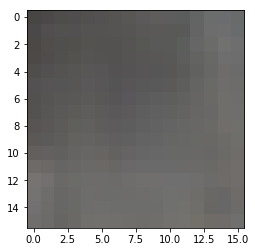

rmse 3.7860605539754033
ssim 0.7911533650369873
psnr 36.56705249352942

 next


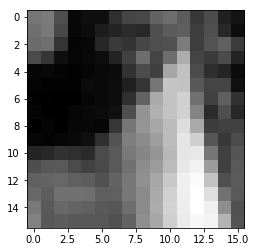

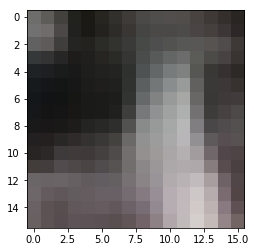

rmse 11.82703921571374
ssim 0.9394513582709573
psnr 26.673282872019918

 next


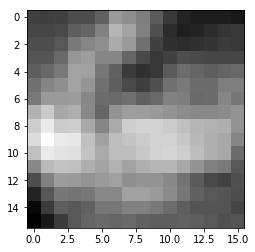

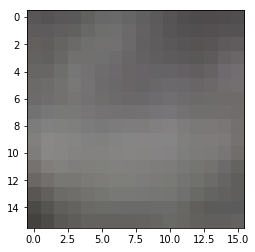

rmse 5.510930735617876
ssim 0.8694204128450597
psnr 33.306304556480285

 next


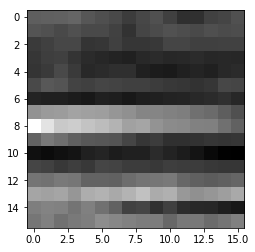

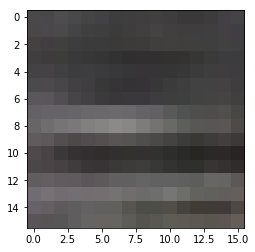

rmse 11.582579333335161
ssim 0.8566692134008386
psnr 26.854697938126773

 next


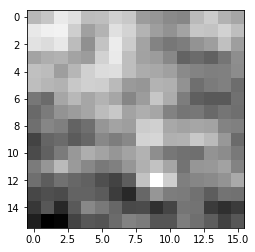

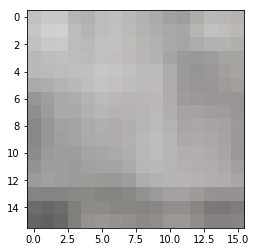

rmse 11.853332854807377
ssim 0.6839618751392534
psnr 26.65399400776325

 next


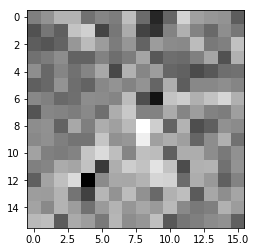

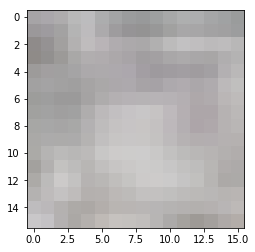

rmse 22.595419138669968
ssim 0.3310861099390632
psnr 21.050395573030457

 next


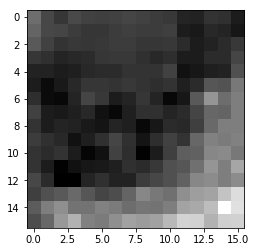

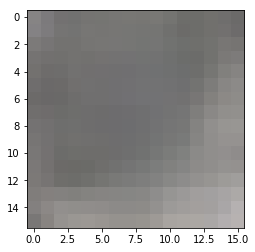

rmse 5.873940456658602
ssim 0.7162051100892987
psnr 32.752212812187835

 next


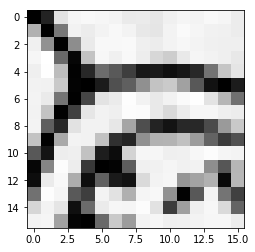

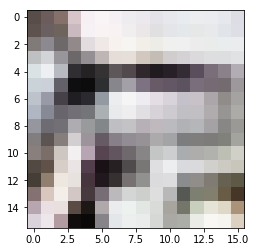

rmse 52.54765011370182
ssim 0.6801421621827516
psnr 13.719737618319083

 next


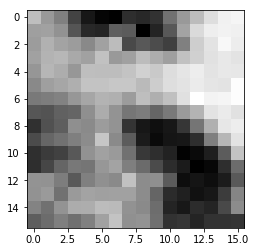

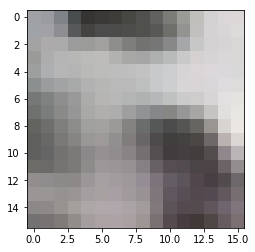

rmse 14.272989816963673
ssim 0.9050848323480426
psnr 25.040504489759723

 next


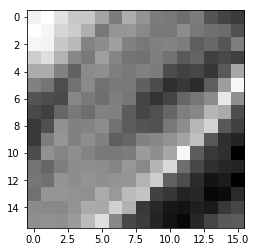

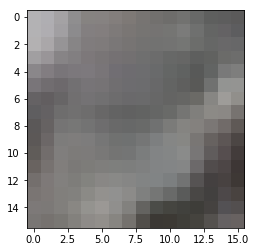

rmse 11.483447402715683
ssim 0.763424015926882
psnr 26.929357897577233

 next


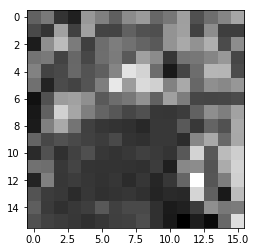

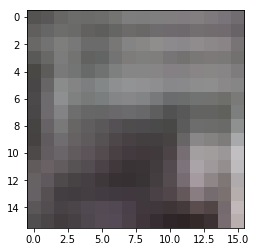

rmse 29.33027844876051
ssim 0.584998002290517
psnr 18.784479888661544

 next


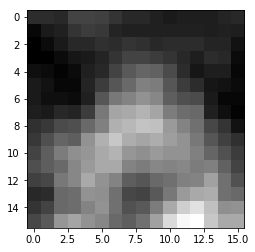

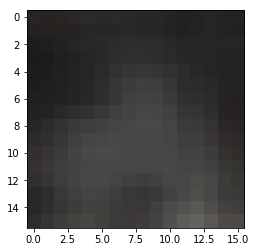

rmse 4.078434202820063
ssim 0.9011179350268511
psnr 35.92093440371874

 next


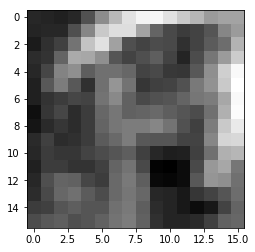

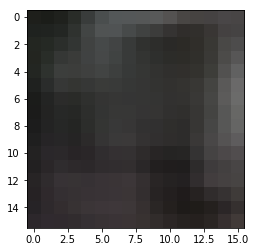

rmse 6.960328761488199
ssim 0.788785745248382
psnr 31.27820854081228

 next


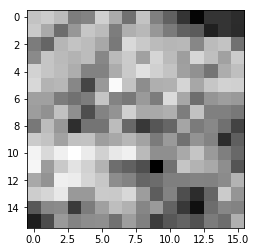

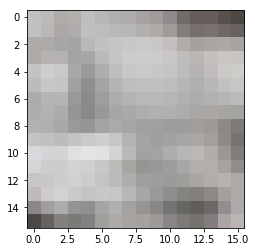

rmse 22.779707349836826
ssim 0.5908616294358665
psnr 20.979840800443803

 next


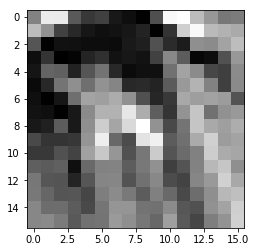

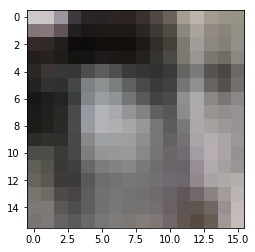

rmse 31.7088558152318
ssim 0.7000276044885924
psnr 18.107192184785912

 next


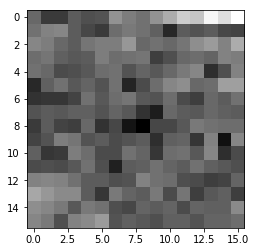

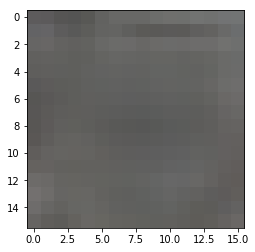

rmse 6.172048235312104
ssim 0.488727022304063
psnr 32.32221737930141

 next


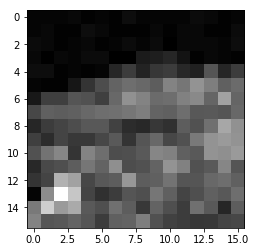

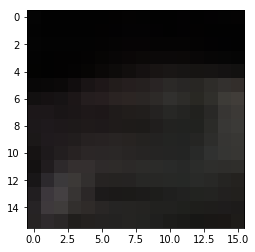

rmse 8.259296659380198
ssim 0.6708088357033622
psnr 29.791942298968014

 next


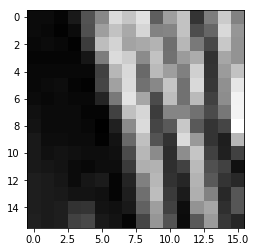

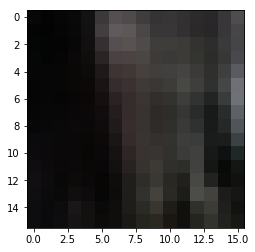

rmse 12.256560567766428
ssim 0.7271852222595733
psnr 26.363431294761757

 next


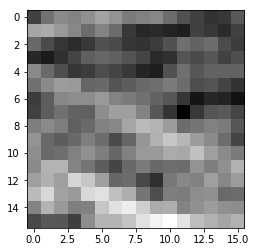

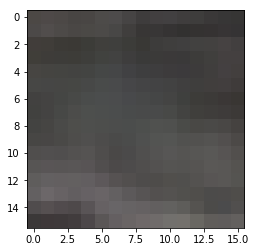

rmse 8.796543180942535
ssim 0.5947310664437245
psnr 29.244562830187096

 next


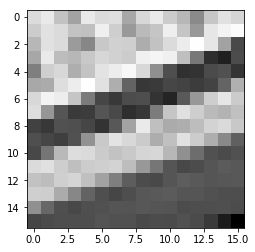

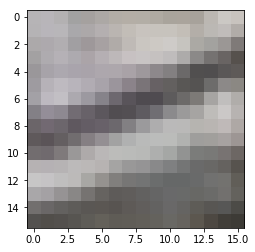

rmse 18.841990046203136
ssim 0.8765961800065295
psnr 22.62826820807454

 next


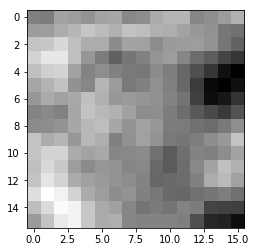

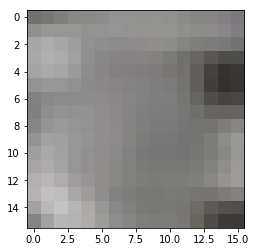

rmse 9.865164589136839
ssim 0.7423954408979839
psnr 28.248716901440755

 next


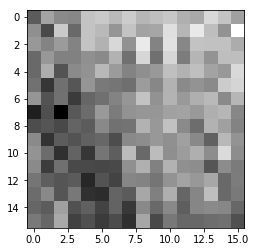

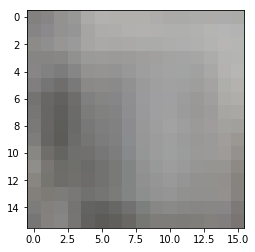

rmse 17.54155732691288
ssim 0.5436021803296393
psnr 23.249440666777108

 next


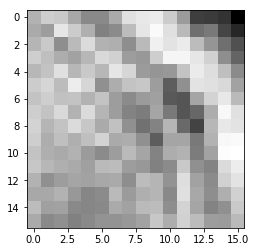

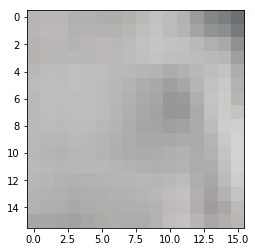

rmse 9.3710932508111
ssim 0.6209518963298843
psnr 28.694998418248254

 next


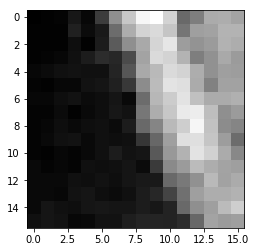

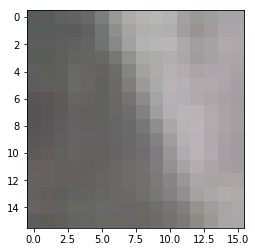

rmse 7.453872878104448
ssim 0.8740771285888448
psnr 30.683163972355256

 next


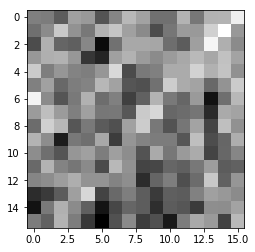

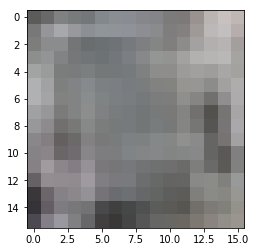

rmse 31.701689399778843
ssim 0.3275971358545533
psnr 18.109155476341876

 next


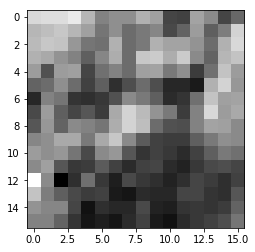

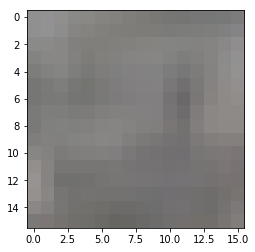

rmse 7.09701550193131
ssim 0.6771497653353138
psnr 31.10928853158939

 next


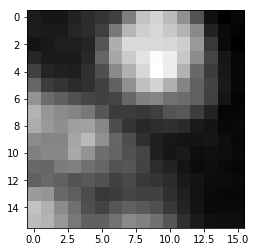

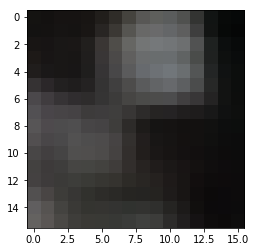

rmse 7.619341649115086
ssim 0.9125949323044743
psnr 30.492454655662762

 next


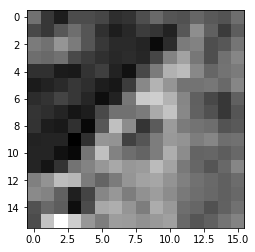

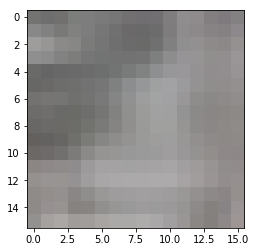

rmse 13.502852842211723
ssim 0.6524278120871526
psnr 25.522292916204524

 next


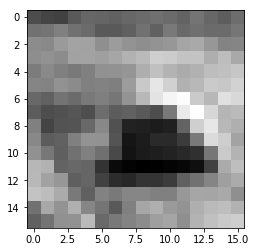

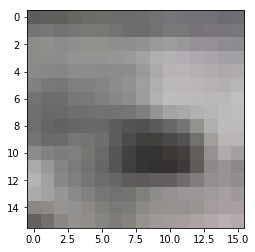

rmse 13.932757023721933
ssim 0.8732127447124481
psnr 25.25006234019429

 next


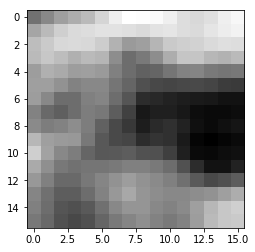

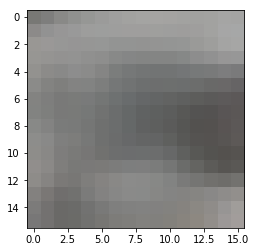

rmse 5.060879085212946
ssim 0.9447771719503734
psnr 34.04628438375255

 next


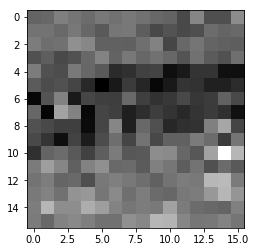

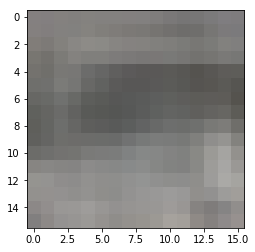

rmse 18.42573568224907
ssim 0.6159607898654887
psnr 22.82230687060794

 next


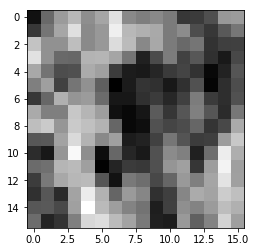

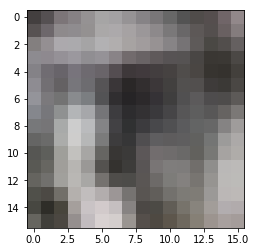

rmse 26.965709030628204
ssim 0.7705543666798572
psnr 19.51456672825482

 next


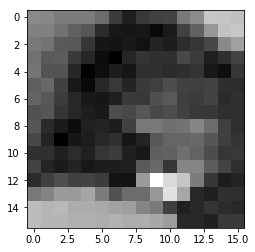

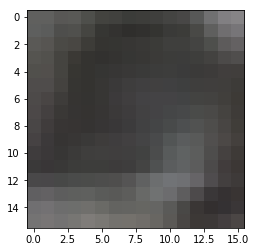

rmse 9.7751341201365
ssim 0.7476067959100913
psnr 28.328349111391404

 next


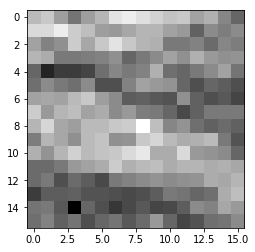

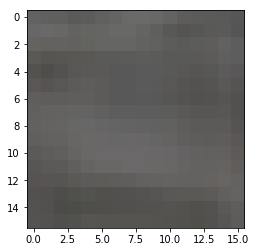

rmse 5.887367511168122
ssim 0.7168474826238501
psnr 32.73238067028323

 next


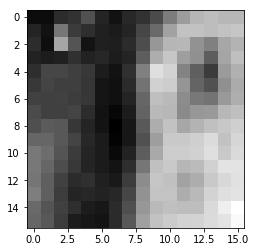

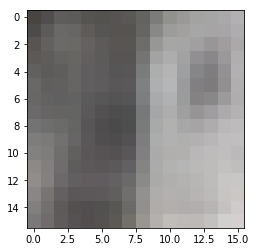

rmse 8.77002440392971
ssim 0.9179221087165234
psnr 29.270787571512766

 next


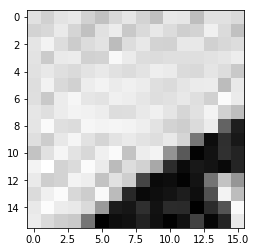

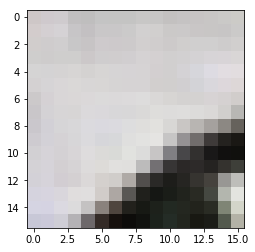

rmse 17.91921716183424
ssim 0.7034896355171981
psnr 23.06442295497162

 next


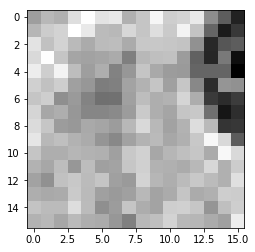

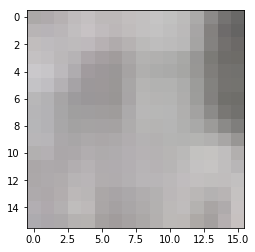

rmse 13.09460274875164
ssim 0.7105749084588577
psnr 25.788957053480047

 next


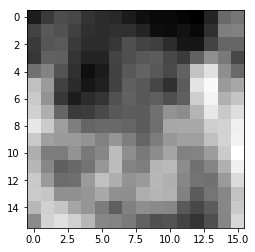

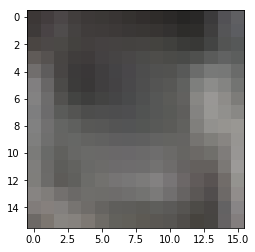

rmse 8.690395876765251
ssim 0.8493628390093299
psnr 29.350012399202498

 next


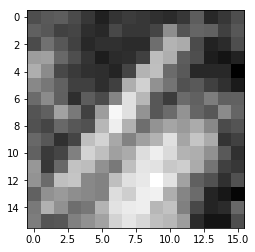

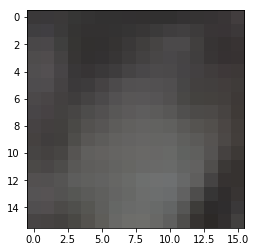

rmse 10.774668585509062
ssim 0.6677032361583516
psnr 27.482725194340535

 next


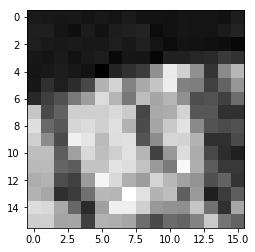

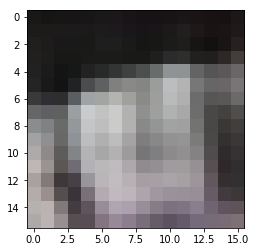

rmse 24.48940470814705
ssim 0.8070245812589064
psnr 20.351239041431086

 next


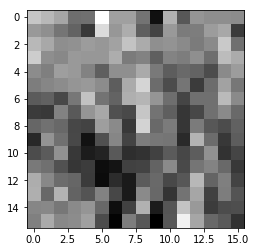

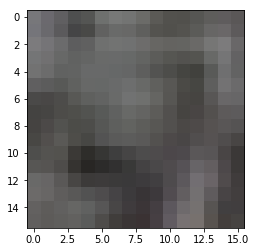

rmse 17.846101485192776
ssim 0.5438328744702386
psnr 23.099936441603678

 next


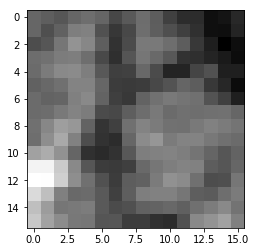

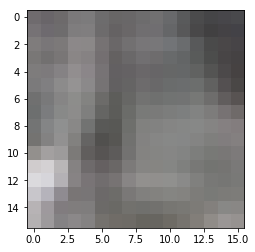

rmse 9.153615720570087
ssim 0.8392263893234074
psnr 28.89895008294481

 next


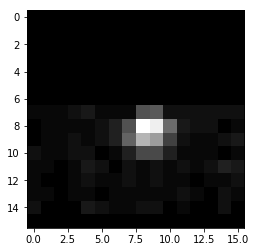

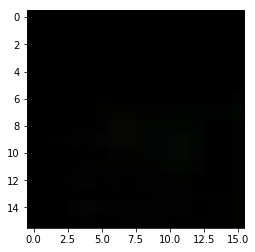

rmse 3.235363941639662
ssim 0.3503120898552554
psnr 37.932340789848084

 next


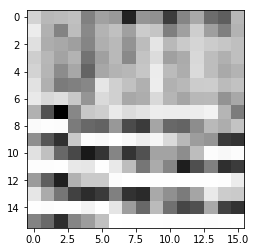

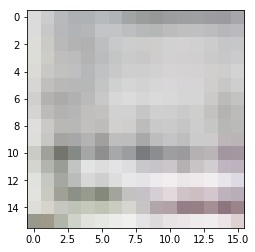

rmse 38.043581396341324
ssim 0.34169781644655245
psnr 16.52517572126063

 next


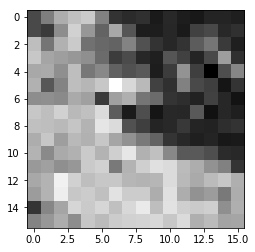

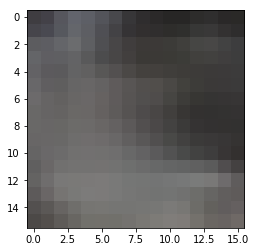

rmse 12.93808439746499
ssim 0.616924500430892
psnr 25.893404012775548

 next


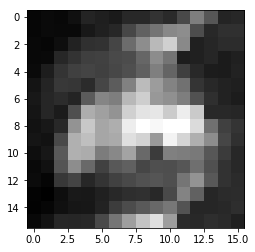

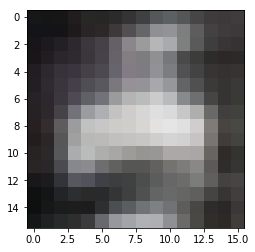

rmse 19.50951922684908
ssim 0.9132813319250214
psnr 22.32587226456031

 next


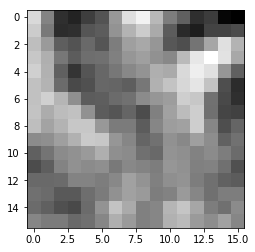

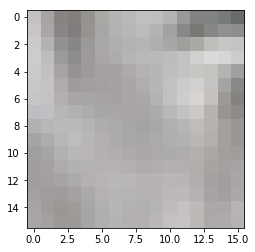

rmse 9.366007223725319
ssim 0.7739841714729406
psnr 28.69971384058463

 next


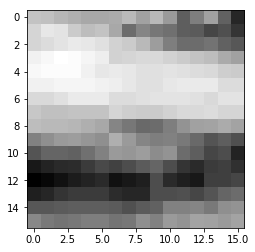

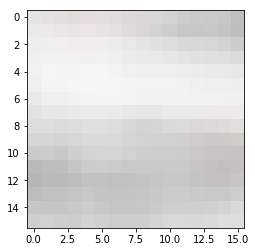

rmse 5.758029101416469
ssim 0.9097464816550026
psnr 32.92532649873173

 next


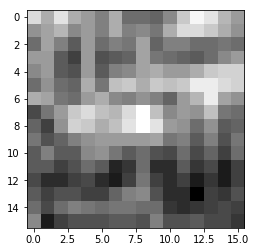

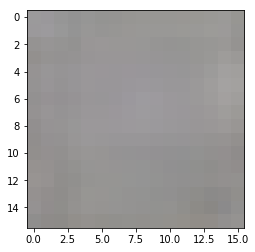

rmse 4.3054501712322235
ssim 0.5346916859786554
psnr 35.45043226217362

 next


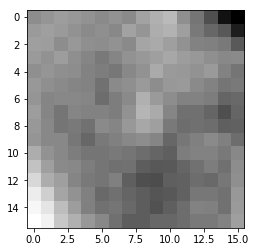

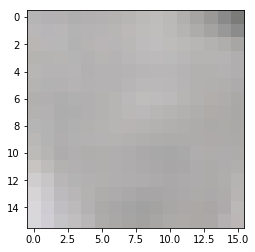

rmse 6.187648773193359
ssim 0.6939461504778398
psnr 32.30029052750258

 next


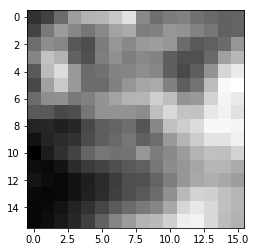

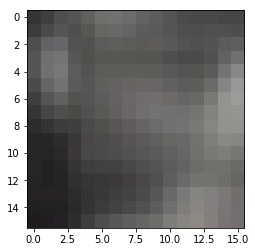

rmse 8.30789415165782
ssim 0.8582991129462835
psnr 29.74098451498015

 next


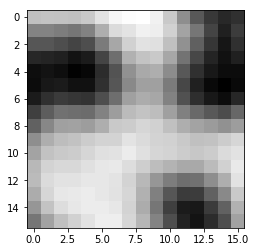

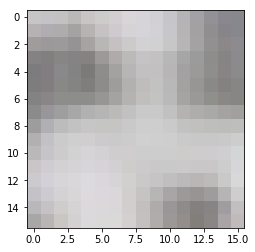

rmse 6.477819727733731
ssim 0.9532869283131277
psnr 31.902226452824408

 next


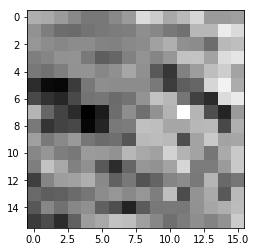

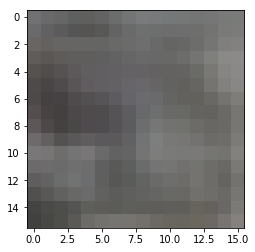

rmse 14.997229054570198
ssim 0.5384712028892099
psnr 24.61058311753341

 next


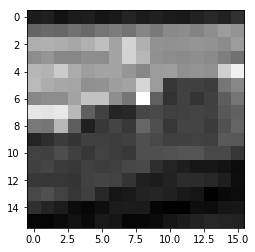

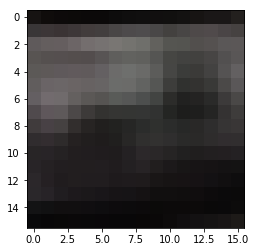

rmse 12.594487834721804
ssim 0.8034192551469802
psnr 26.127193383710228

 next


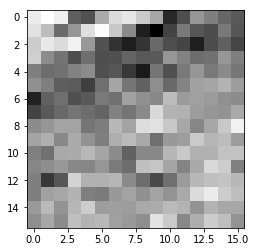

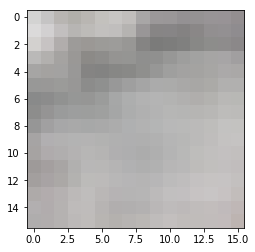

rmse 16.7139408364892
ssim 0.49663758681997655
psnr 23.66922639805546

 next


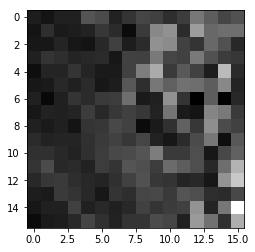

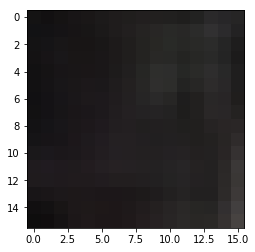

rmse 9.778057113289833
ssim 0.4255890928503119
psnr 28.325752215996815

 next


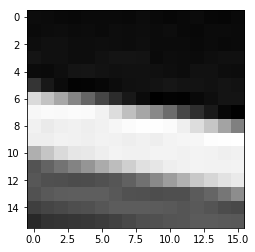

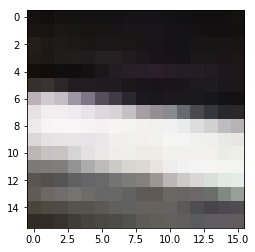

rmse 10.681330393999815
ssim 0.9741605599418358
psnr 27.55829663200245

 next


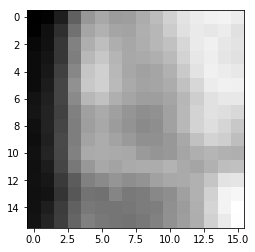

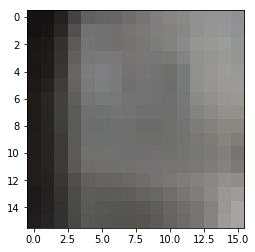

rmse 5.37819055840373
ssim 0.9033228934258614
psnr 33.51807988969482

 next


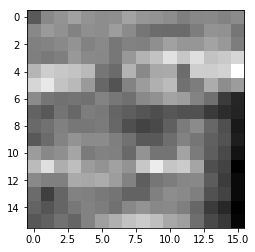

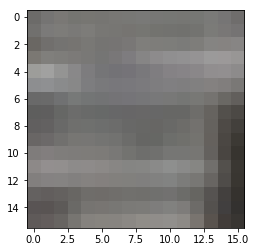

rmse 11.698145382106304
ssim 0.7394426127791296
psnr 26.76846332104089

 next


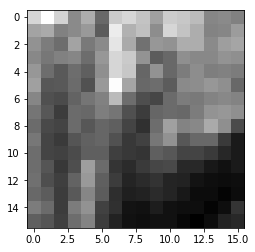

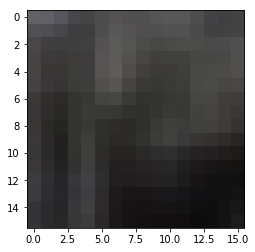

rmse 7.791182678192854
ssim 0.8385392540179916
psnr 30.298735863116754

 next


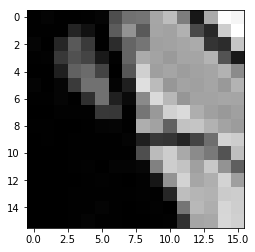

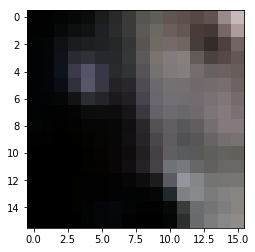

rmse 20.56516908109188
ssim 0.7234825314404049
psnr 21.868157918516452

 next


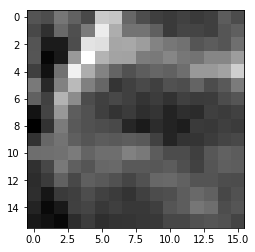

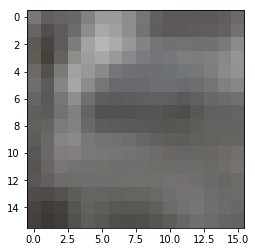

rmse 12.503178734332323
ssim 0.8323537001869803
psnr 26.19039481847134

 next


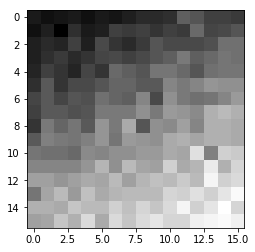

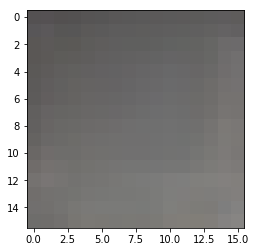

rmse 3.940165559761226
ssim 0.8167576121749757
psnr 36.2205141966341

 next


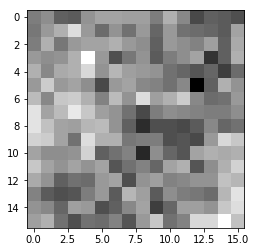

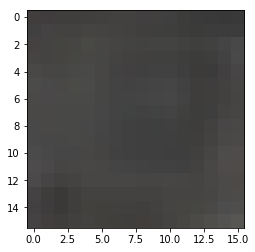

rmse 5.873440308496356
ssim 0.38625920568725963
psnr 32.75295242075751

 next


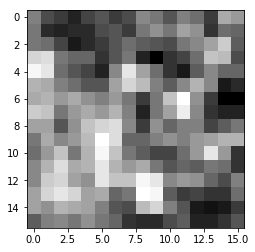

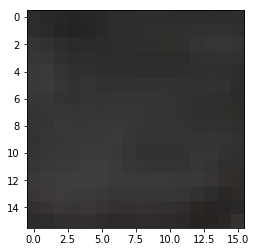

rmse 5.057724304497242
ssim 0.46780548471081773
psnr 34.051700561650115

 next


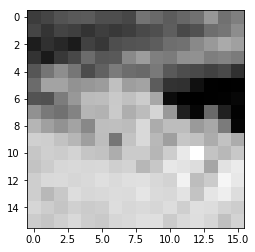

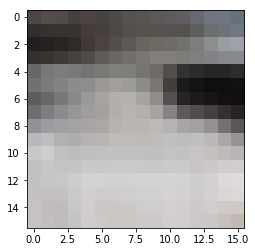

rmse 18.353666849434376
ssim 0.801923889422245
psnr 22.856346723691896

 next


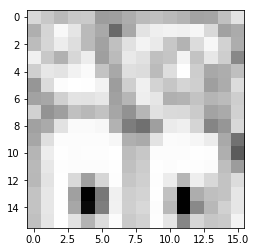

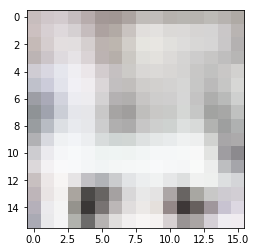

rmse 26.73455223441124
ssim 0.6753293486238346
psnr 19.58934531498678

 next


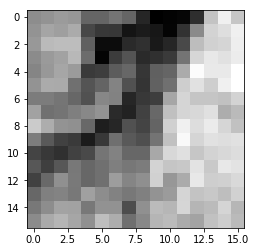

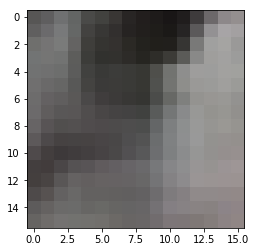

rmse 15.659845098853111
ssim 0.7575815516685803
psnr 24.23505437128538

 next


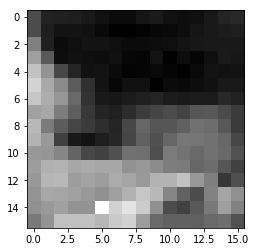

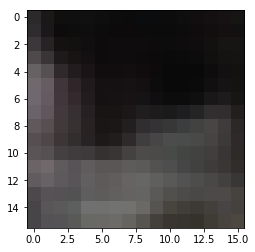

rmse 9.242241214960814
ssim 0.8869564641723047
psnr 28.815257627428824

 next


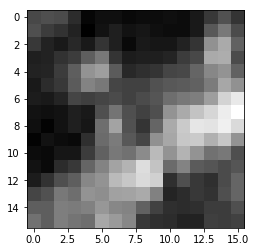

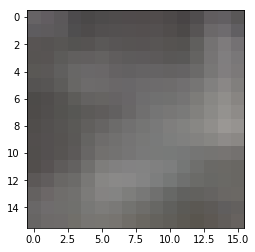

rmse 7.878652084618807
ssim 0.7986665805403413
psnr 30.201765153012467

 next


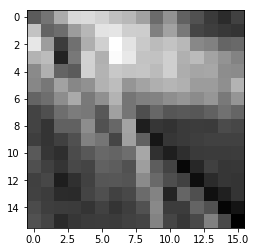

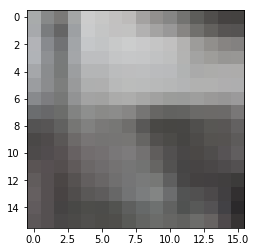

rmse 19.779806323349476
ssim 0.7793469789571761
psnr 22.20636291210341

 next


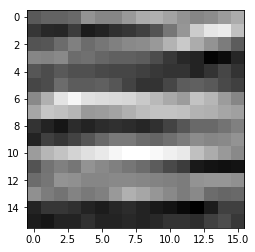

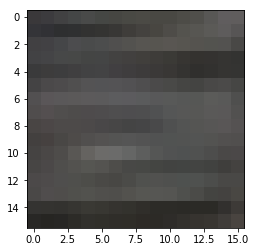

rmse 11.24110210686922
ssim 0.6709268979813472
psnr 27.114625755072524

 next


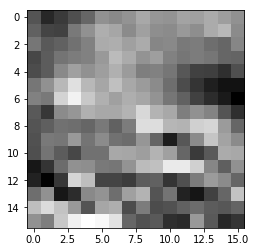

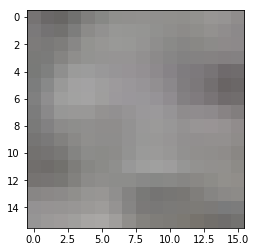

rmse 12.857010047882795
ssim 0.6277123932001883
psnr 25.948003942485926

 next


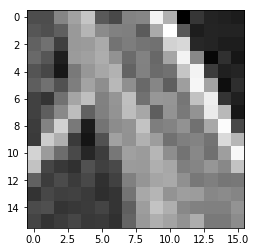

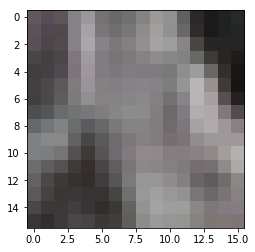

rmse 26.416288912296295
ssim 0.6418259303183579
psnr 19.69336749308344

 next


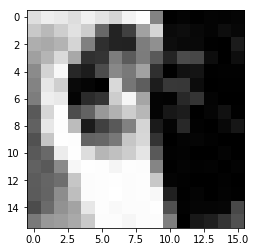

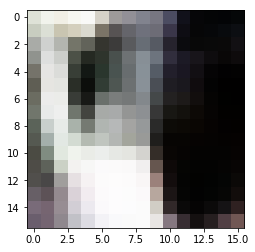

rmse 34.353379011154175
ssim 0.8011422480532365
psnr 17.411414391408215

 next
rmses 0.053720225
ssims 0.7012150733081809
psnrs 27.101235693401605


In [58]:
patch_size = 16

images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img = img[20: 36, 20: 36]
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 3)
images = images / 255
predictions = oae_aux.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size, 3))
    plt.imshow(im_1[:, :, 0], cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size, 3))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

In [55]:
img.shape

(16, 16)

In [72]:
patch_size = 8

input_shape = (patch_size, patch_size, 3)

input_img = layers.Input(shape=input_shape)

x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input_img)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
encoded = layers.MaxPooling2D((2, 2), padding="same")(x)

# encoder = Model(input_img, encoded)

x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

oae_20x20 = tf.keras.models.Model(input_img, decoded)
oae_20x20.summary()

for i in range(len(oae.layers)):
    oae_20x20.get_layer(index=i).set_weights(oae_aux.get_layer(index=i).get_weights())

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 8, 8, 3)]         0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 8, 8, 32)          896       
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 8, 8, 32)          9248      
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 8, 8, 32)          9248      
_________________________________________________________________
max_pooling2d_25 (MaxPooling (None, 4, 4, 32)          0         
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 2, 2, 32)          0         
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 1, 1, 32)          0   

predictions: 


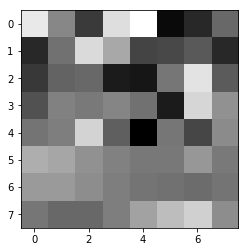

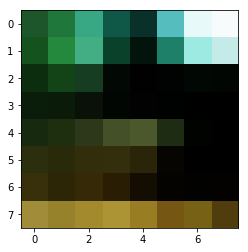

rmse 76.06418922543526
ssim -0.057529744024711886
psnr 10.507198799739847

 next


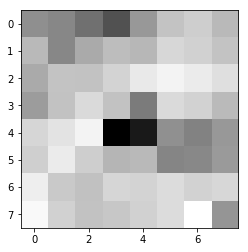

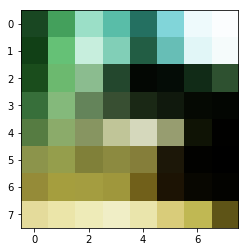

rmse 94.24568921327591
ssim -0.07727622888812595
psnr 8.645573713605733

 next


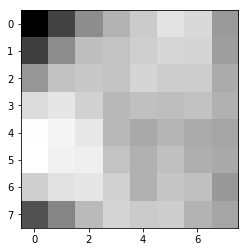

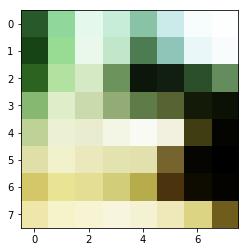

rmse 92.54241541028023
ssim 0.09776400013064784
psnr 8.803986995726508

 next


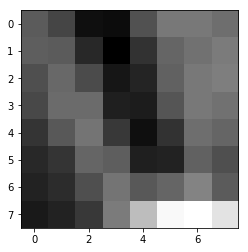

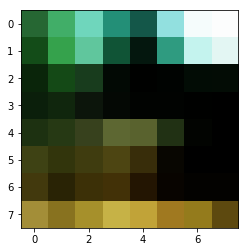

rmse 72.9748409986496
ssim 0.07346281635094966
psnr 10.86734046072214

 next


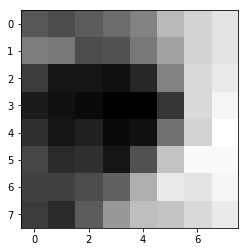

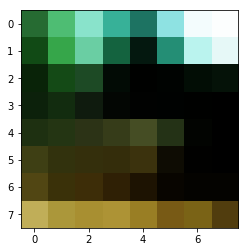

rmse 75.68488597869873
ssim 0.054267185551368315
psnr 10.55062038892997

 next


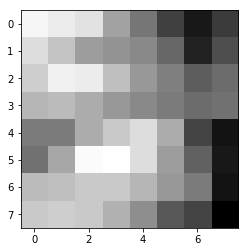

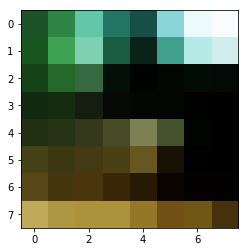

rmse 74.51470077037811
ssim 0.00398166165725389
psnr 10.685964372873464

 next


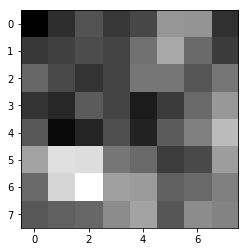

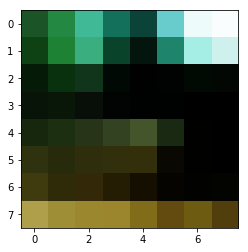

rmse 71.22519448399544
ssim 0.031811162017595825
psnr 11.078130733155525

 next


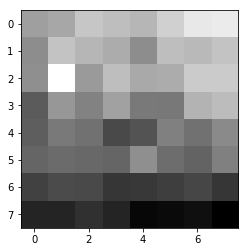

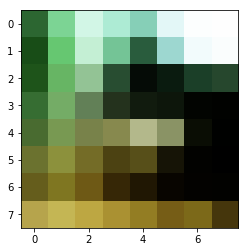

rmse 81.21681153774261
ssim 0.15197083922085652
psnr 9.9378848951937

 next


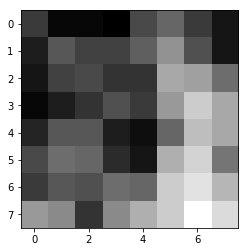

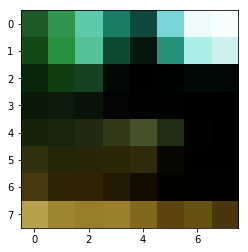

rmse 72.32848808169365
ssim -0.042019720284388884
psnr 10.944615870303846

 next


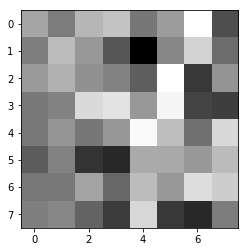

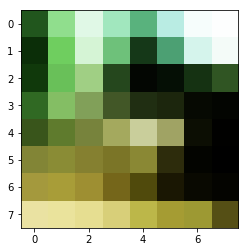

rmse 106.53740644454956
ssim 0.07593064515819466
psnr 7.5807612071462325

 next


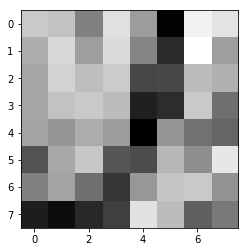

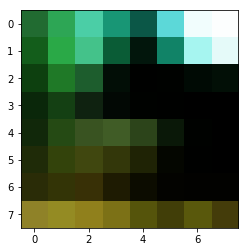

rmse 72.98620998859406
ssim 0.0892308060062547
psnr 10.865987362871918

 next


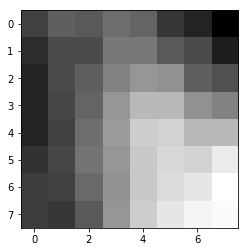

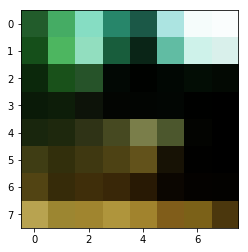

rmse 80.6617297232151
ssim -0.1003790280514002
psnr 9.99745299162376

 next


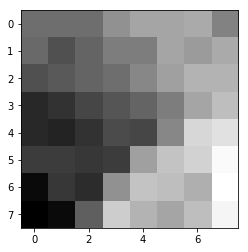

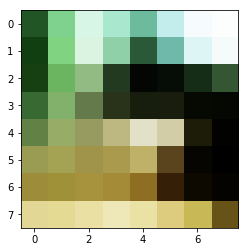

rmse 95.62865540385246
ssim -0.07439061361796652
psnr 8.51904262110463

 next


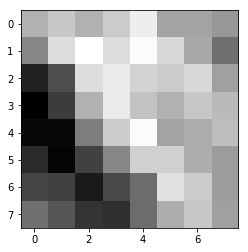

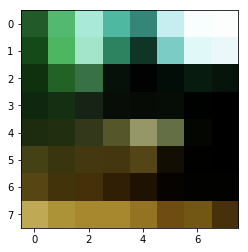

rmse 80.17068967223167
ssim 0.04150045641709166
psnr 10.050491215624637

 next


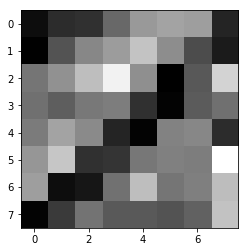

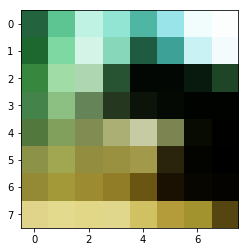

rmse 99.56096559762955
ssim -0.043068576711295624
psnr 8.169021608949862

 next


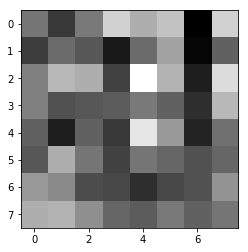

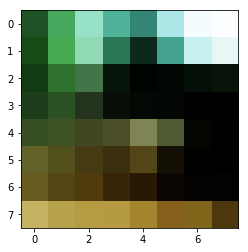

rmse 78.25574442744255
ssim 0.0249800767685245
psnr 10.260479066016138

 next


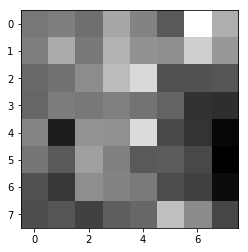

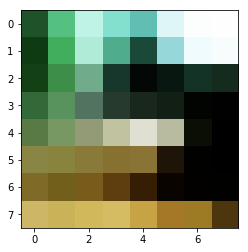

rmse 77.74528741836548
ssim 0.25851751595879774
psnr 10.317322139647606

 next


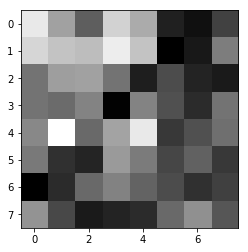

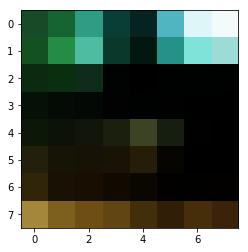

rmse 71.68954476714134
ssim -0.009260160456237287
psnr 11.021687156697318

 next


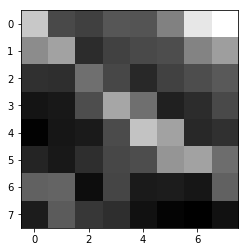

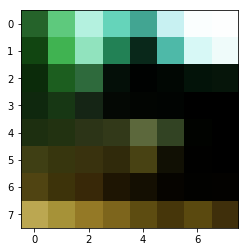

rmse 74.57755699753761
ssim 0.1682700491454452
psnr 10.678640554820229

 next


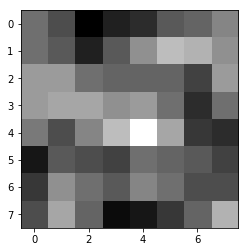

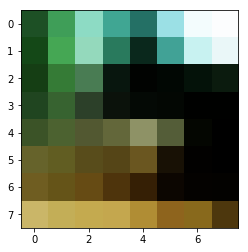

rmse 79.64096769690514
ssim 0.022073477188650558
psnr 10.10807304092054

 next


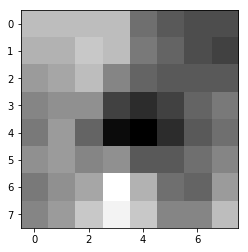

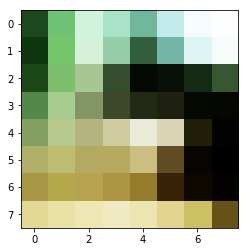

rmse 93.3325982093811
ssim 0.025415893030358988
psnr 8.73013648941367

 next


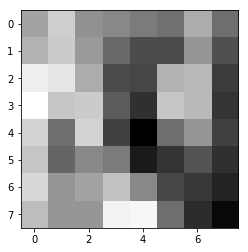

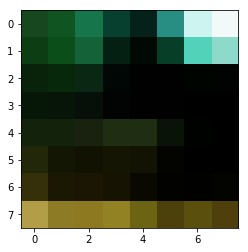

rmse 58.26021037995815
ssim 0.08765501178801983
psnr 12.823362637693382

 next


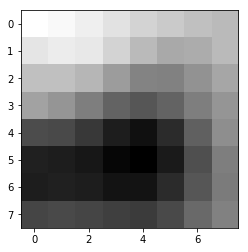

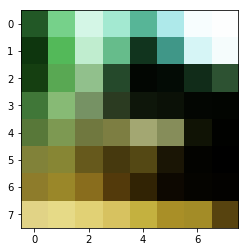

rmse 89.81809079647064
ssim 0.14101643356585536
psnr 9.063527222372747

 next


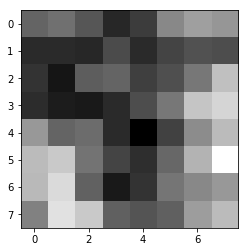

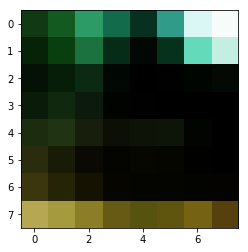

rmse 65.4666642844677
ssim 0.09606208885208882
psnr 11.810399350115613

 next


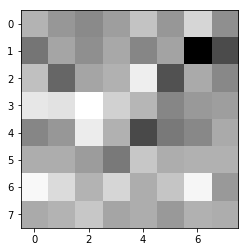

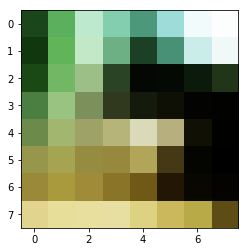

rmse 95.17050638794899
ssim -0.08430679606602454
psnr 8.560756006014728

 next


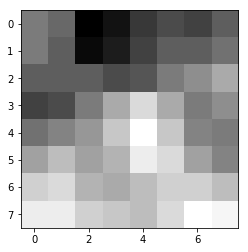

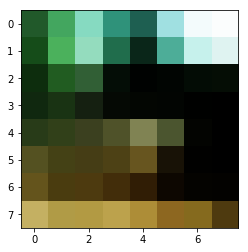

rmse 78.16501289606094
ssim -0.020452594114944257
psnr 10.270555531187938

 next


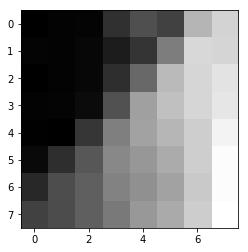

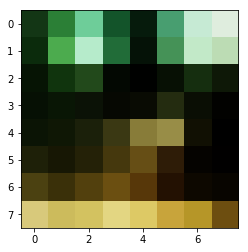

rmse 92.42247864603996
ssim 0.04304713291386569
psnr 8.815251378073857

 next


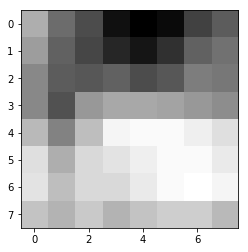

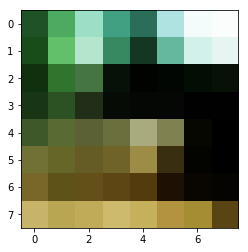

rmse 85.38662418723106
ssim -0.059700980760617445
psnr 9.503006732755182

 next


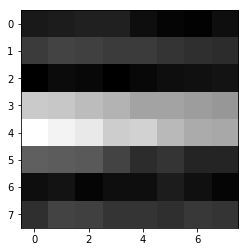

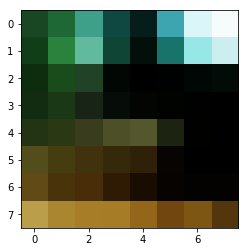

rmse 75.18348008394241
ssim -0.06066913587089886
psnr 10.608355120396205

 next


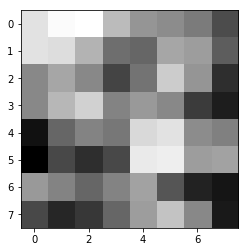

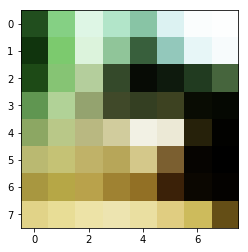

rmse 94.56634640693665
ssim 0.07416142387981163
psnr 8.616071402862541

 next


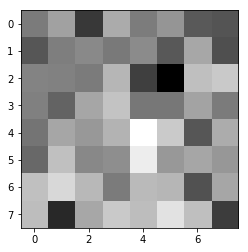

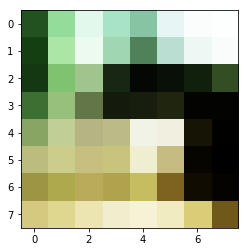

rmse 101.09295979142189
ssim 0.14736276642697968
psnr 8.036385369301982

 next


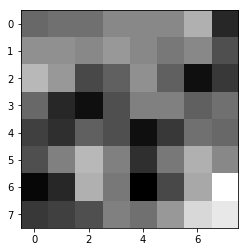

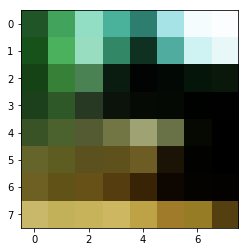

rmse 81.23490616679192
ssim 0.011431454147162401
psnr 9.935949945488831

 next


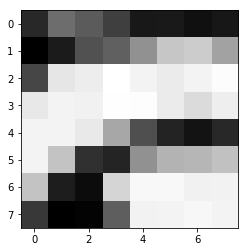

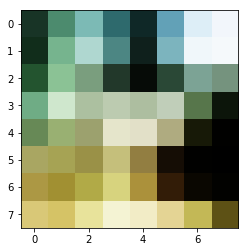

rmse 120.95874980092049
ssim -0.038121544067443065
psnr 6.478057820233473

 next


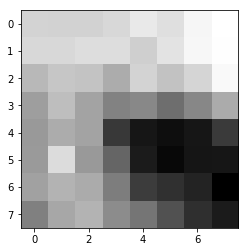

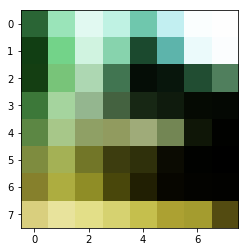

rmse 77.87119746208191
ssim 0.44286901590017375
psnr 10.303266546713017

 next


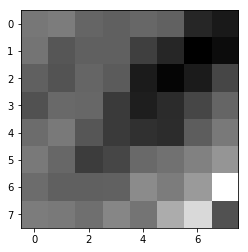

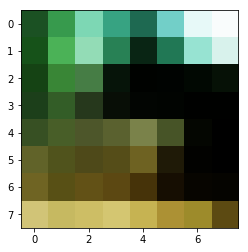

rmse 84.49016869068146
ssim -0.0068685793254050454
psnr 9.594680064428053

 next


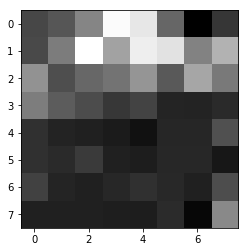

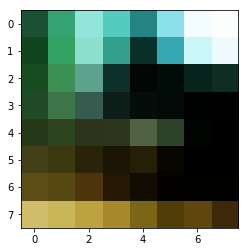

rmse 80.05500867962837
ssim 0.2875640773223031
psnr 10.063033429762545

 next


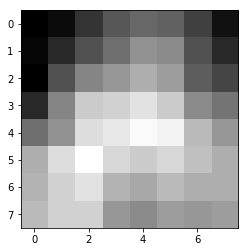

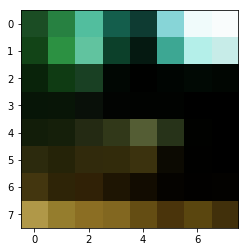

rmse 72.52206489443779
ssim -0.09243305922979561
psnr 10.921400386504999

 next


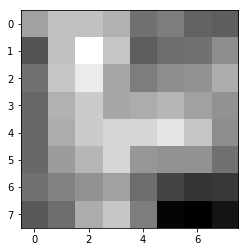

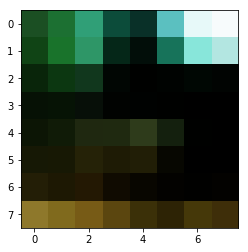

rmse 62.89683178067207
ssim 0.004929068899074146
psnr 12.158228211641834

 next


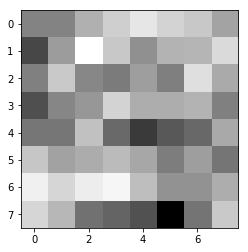

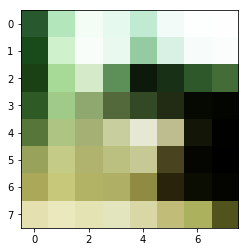

rmse 93.30074071884155
ssim 0.11802240440541227
psnr 8.73310177580086

 next


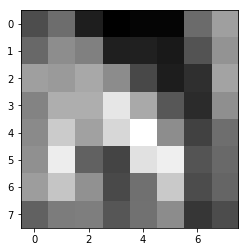

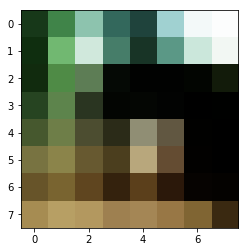

rmse 92.56187796592712
ssim 0.1266981462855221
psnr 8.8021604620685

 next


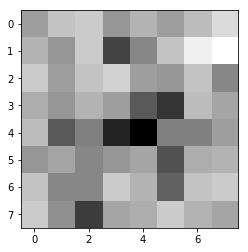

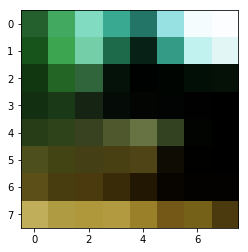

rmse 74.70181033015251
ssim 0.052463457247287536
psnr 10.664181075217456

 next


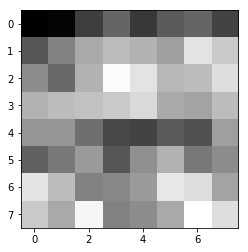

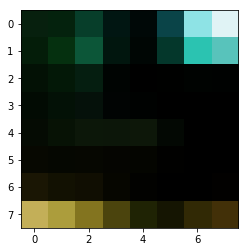

rmse 54.77051183581352
ssim 0.04402804844063111
psnr 13.35986761923219

 next


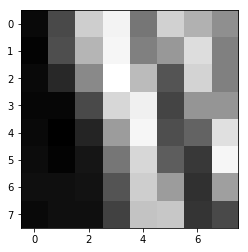

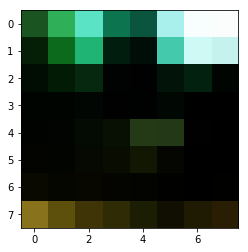

rmse 69.1717466711998
ssim 0.15722189496475625
psnr 11.332228763000154

 next


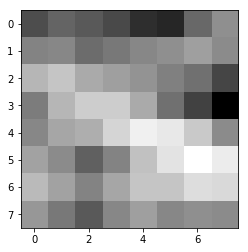

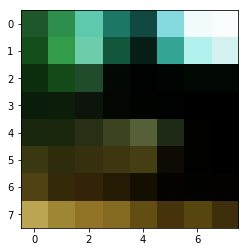

rmse 74.69436272978783
ssim -0.07236542417967028
psnr 10.665047081803362

 next


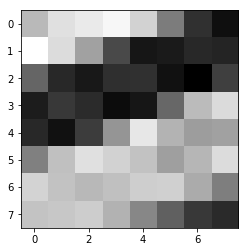

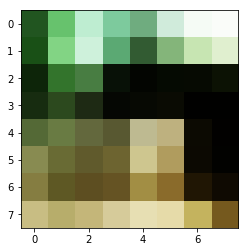

rmse 95.64065515995026
ssim 0.18082776908874906
psnr 8.517952759307372

 next


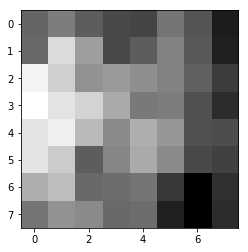

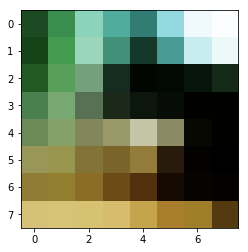

rmse 82.30074897408485
ssim 0.09749478731125431
psnr 9.822727858544992

 next


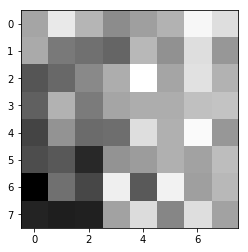

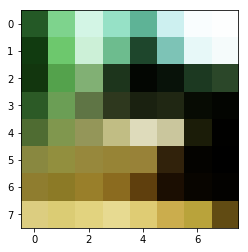

rmse 93.4592454135418
ssim -0.07590077211022662
psnr 8.718358204178756

 next


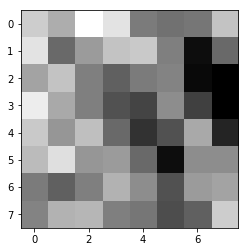

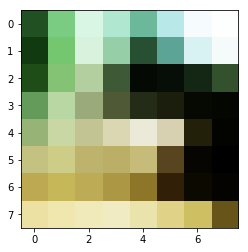

rmse 94.14995715022087
ssim 0.054152287590114985
psnr 8.654401074769746

 next


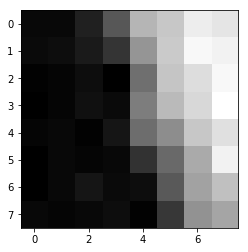

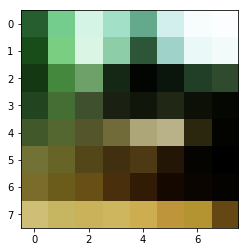

rmse 92.66348451375961
ssim 0.0015925766950904234
psnr 8.792631061367796

 next


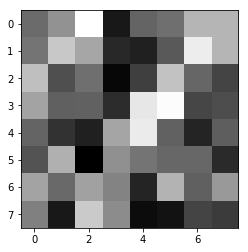

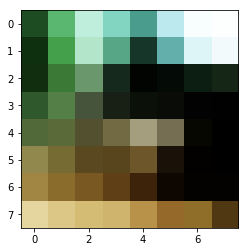

rmse 85.00675097107887
ssim 0.1805055759287153
psnr 9.541735260731505

 next


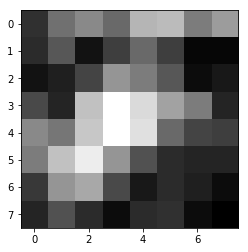

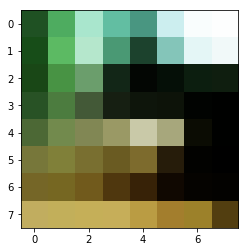

rmse 81.63686379790306
ssim 0.02046328332439207
psnr 9.893077362817262

 next


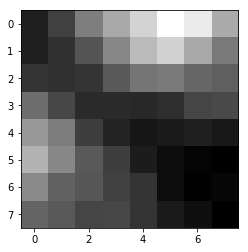

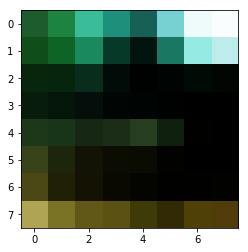

rmse 54.53583262860775
ssim 0.3577632010654391
psnr 13.397164645972332

 next


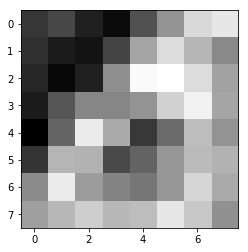

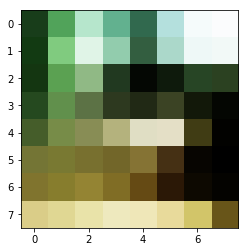

rmse 92.92337536811829
ssim -0.10933377840468905
psnr 8.768304072313178

 next


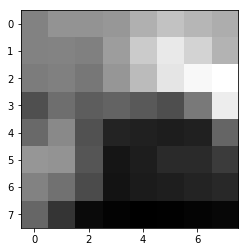

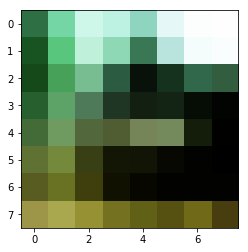

rmse 75.79457849264145
ssim 0.36994180214509537
psnr 10.53804076646969

 next


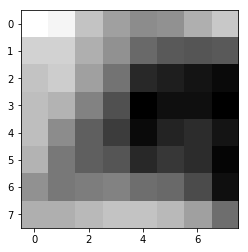

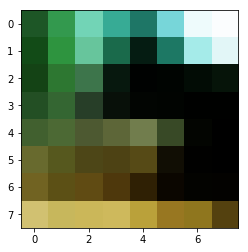

rmse 74.90747049450874
ssim 0.17777707394672393
psnr 10.640300970909875

 next


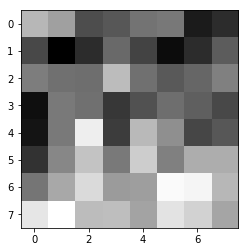

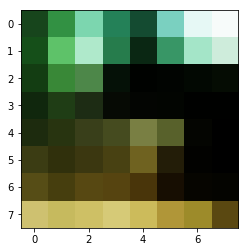

rmse 85.29843091964722
ssim -0.06328228123287434
psnr 9.511982762399327

 next


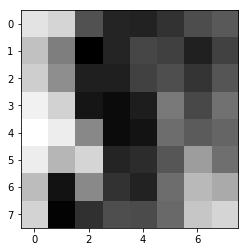

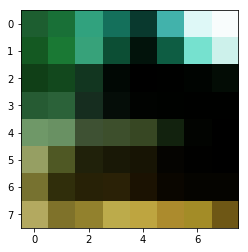

rmse 81.66611462831497
ssim 0.08124311972626477
psnr 9.88996572958258

 next


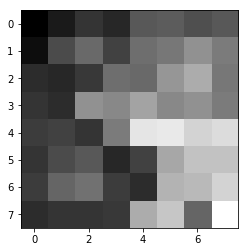

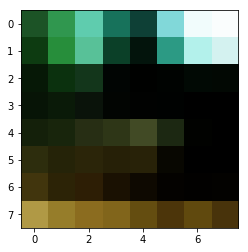

rmse 72.88747608661652
ssim -0.047736882821918875
psnr 10.877745369818149

 next


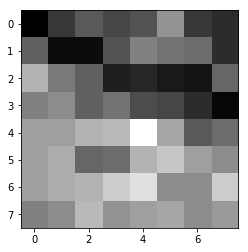

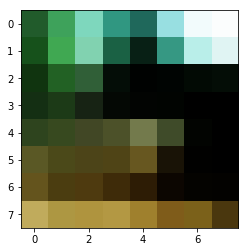

rmse 76.59988448023796
ssim 0.011757210704525019
psnr 10.446241315147923

 next


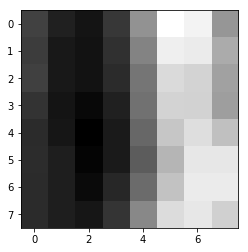

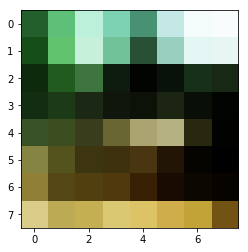

rmse 95.09869024157524
ssim 0.011152926938317249
psnr 8.56731289659193

 next


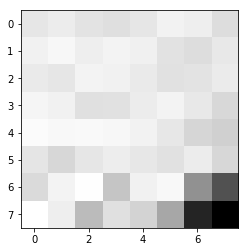

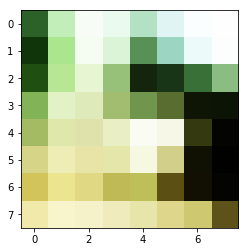

rmse 96.5664678812027
ssim 0.13548138766546935
psnr 8.43427667918744

 next


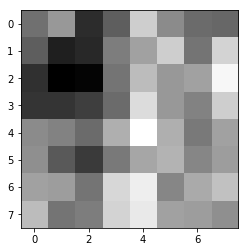

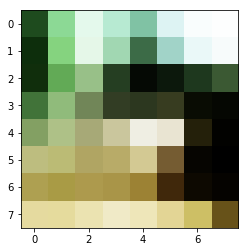

rmse 94.8297330737114
ssim -0.01348645833395704
psnr 8.59191304646133

 next


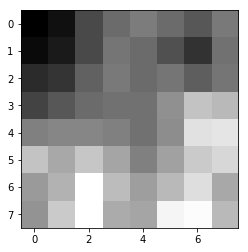

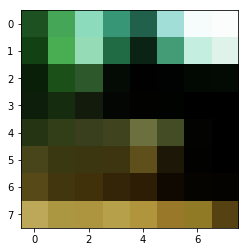

rmse 80.28053417801857
ssim -0.09864506638816689
psnr 10.038598537204724

 next


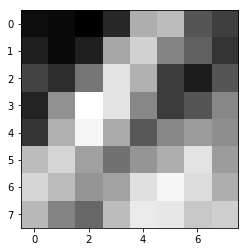

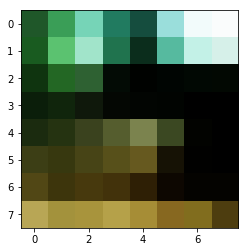

rmse 81.69781252741814
ssim -0.13861194413073044
psnr 9.886595041063794

 next


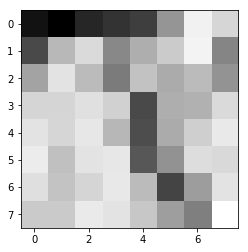

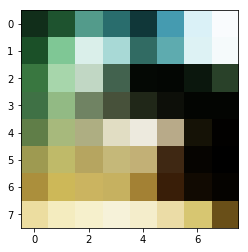

rmse 92.56072282791138
ssim 0.16090442736722615
psnr 8.802268859436282

 next


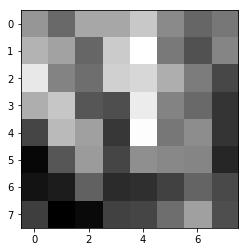

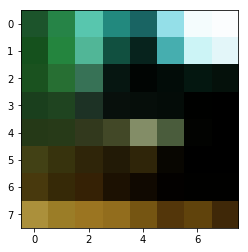

rmse 76.06564074754715
ssim -0.016732467865978876
psnr 10.507033049723908

 next


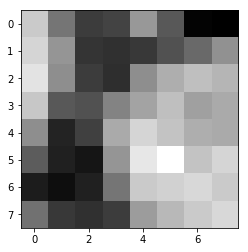

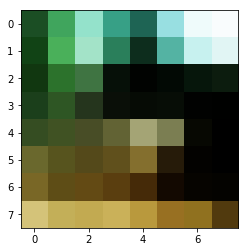

rmse 91.1379499733448
ssim -0.15393923668595036
psnr 8.93681849905822

 next


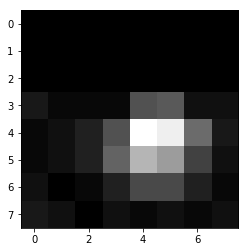

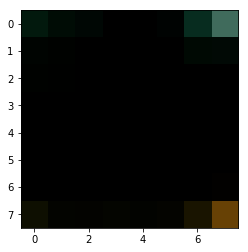

rmse 16.96890525519848
ssim -0.020113176878330665
psnr 23.53772711231093

 next


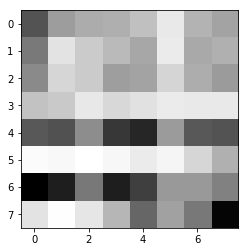

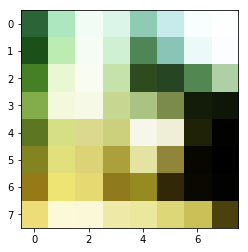

rmse 98.91423270106316
ssim 0.10807491167678558
psnr 8.225627880110672

 next


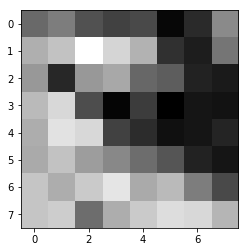

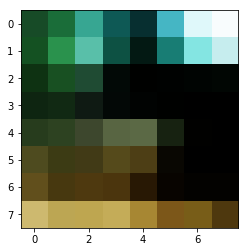

rmse 73.2879289984703
ssim 0.12422552566443901
psnr 10.830154620920107

 next


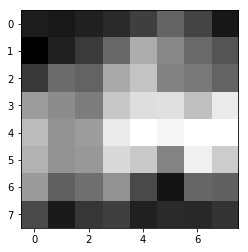

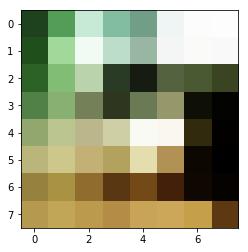

rmse 107.53788515925407
ssim -0.08761609820168359
psnr 7.499573780939346

 next


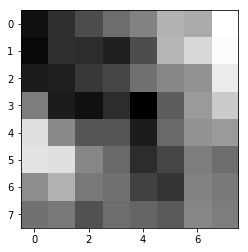

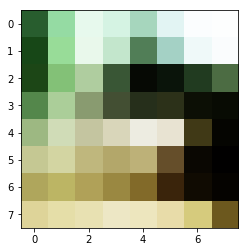

rmse 91.61878377199173
ssim 0.037425146288075146
psnr 8.891113163221753

 next


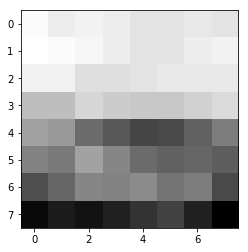

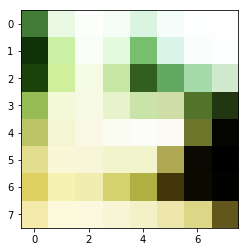

rmse 96.49985745549202
ssim 0.026272053600783062
psnr 8.44027017213257

 next


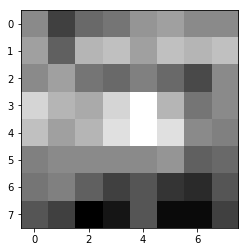

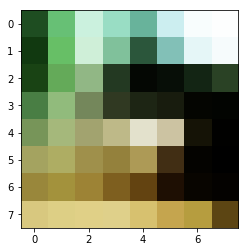

rmse 89.47838142514229
ssim 0.03887583482653483
psnr 9.096441217864271

 next


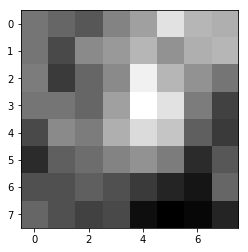

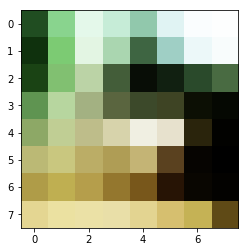

rmse 93.12538772821426
ssim 0.03170385383338383
psnr 8.749441729713537

 next


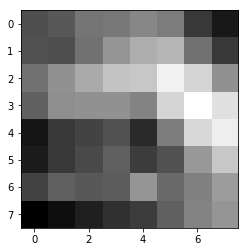

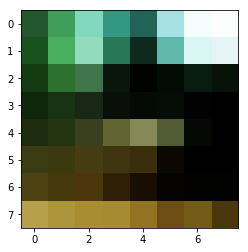

rmse 83.5622888803482
ssim -0.1616918666852706
psnr 9.690597061381396

 next


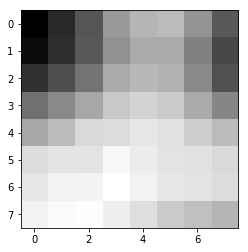

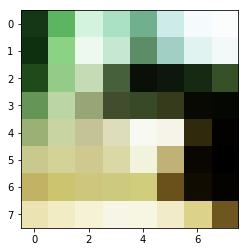

rmse 98.11767384409904
ssim 0.04394386573197313
psnr 8.295858739037186

 next


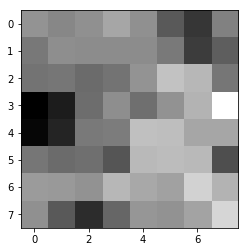

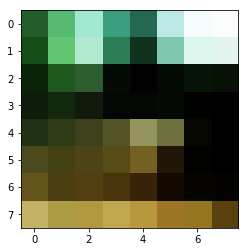

rmse 87.34584465622902
ssim -0.10603177236257999
psnr 9.305958630267142

 next


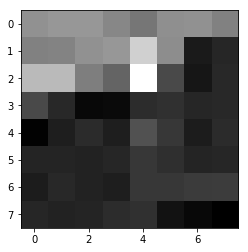

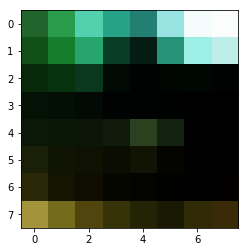

rmse 65.39803236722946
ssim 0.1452405938308969
psnr 11.819509970912318

 next


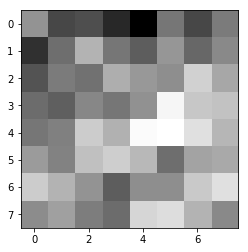

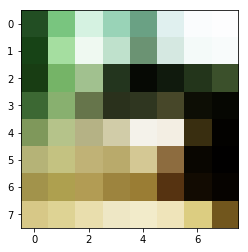

rmse 96.58665239810944
ssim -0.03190246133924011
psnr 8.432461326822079

 next


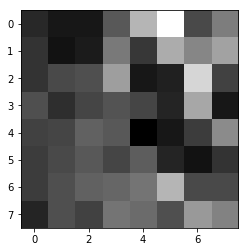

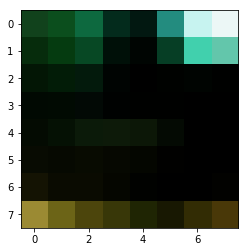

rmse 52.1236764639616
ssim 0.094971471261181
psnr 13.790102800293011

 next


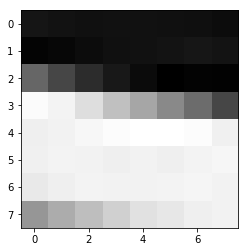

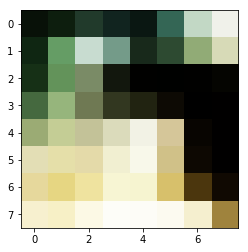

rmse 105.80161392688751
ssim 0.44475641307487646
psnr 7.640957756738222

 next


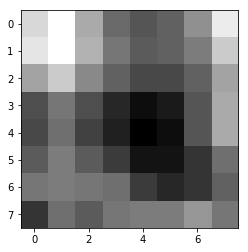

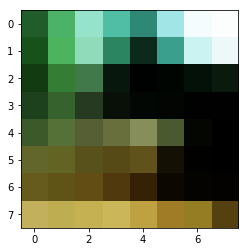

rmse 79.17438313364983
ssim 0.09553662676021786
psnr 10.159109841357573

 next


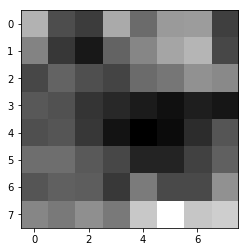

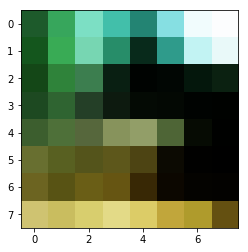

rmse 80.16357645392418
ssim 0.1363973735576232
psnr 10.051261913376575

 next


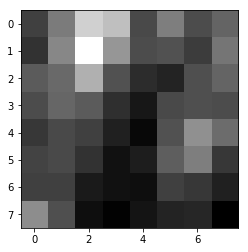

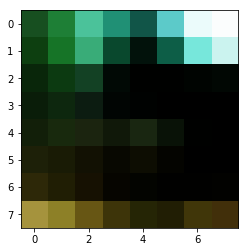

rmse 61.45701304078102
ssim 0.16988820561635176
psnr 12.359374635221467

 next


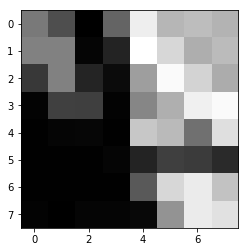

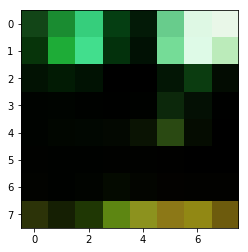

rmse 78.33105638623238
ssim 0.17675754456090723
psnr 10.252123937620697

 next


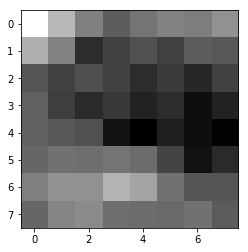

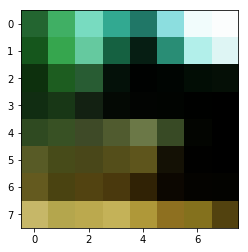

rmse 74.60096374154091
ssim 0.14685284612709595
psnr 10.675914848788821

 next


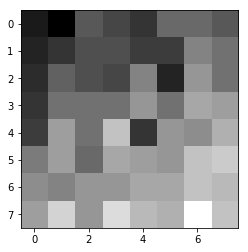

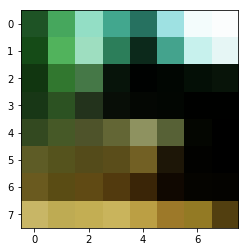

rmse 80.2863098680973
ssim -0.006533614473735974
psnr 10.0379736634093

 next


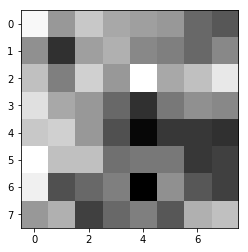

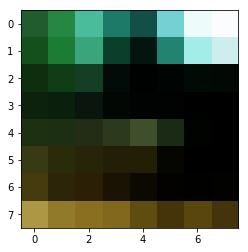

rmse 67.17479422688484
ssim 0.01641751516482084
psnr 11.586676713576193

 next


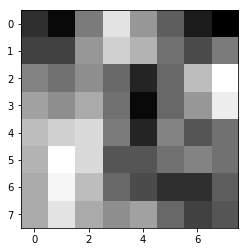

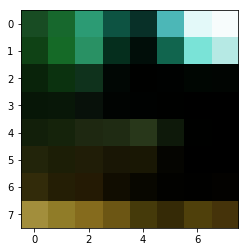

rmse 63.30574683845043
ssim 0.002822992852149887
psnr 12.101940875333634

 next


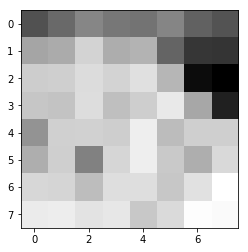

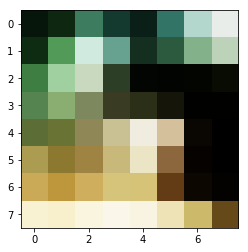

rmse 98.10625165700912
ssim 0.20318215996361158
psnr 8.296869949635965

 next


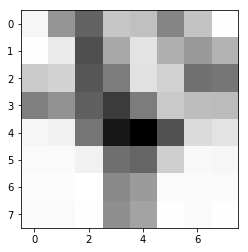

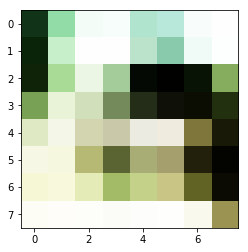

rmse 114.20560017228127
ssim -0.08245143403330278
psnr 6.977055599784126

 next


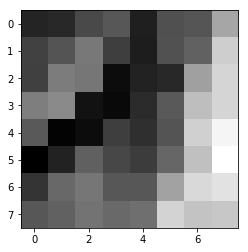

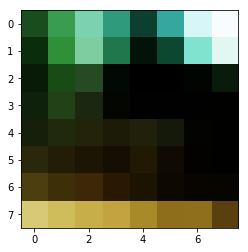

rmse 83.21537509560585
ssim 0.041888939814838815
psnr 9.726732106354367

 next


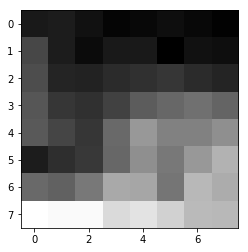

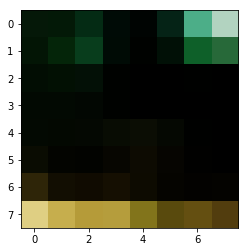

rmse 48.7873262912035
ssim 0.11709743516347317
psnr 14.364663249218836

 next


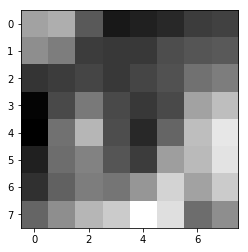

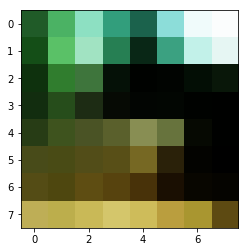

rmse 84.57151472568512
ssim -0.03457977202693693
psnr 9.58632142605672

 next


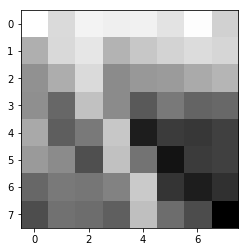

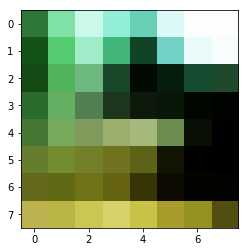

rmse 75.06771549582481
ssim 0.4058838916527183
psnr 10.621739621351079

 next


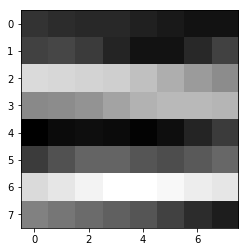

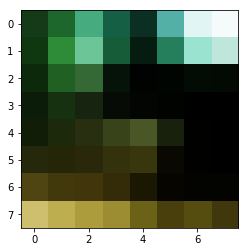

rmse 77.86026164889336
ssim -0.17576127140491313
psnr 10.304486432112622

 next


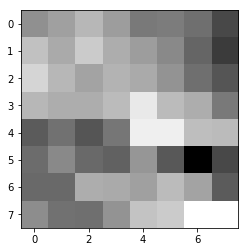

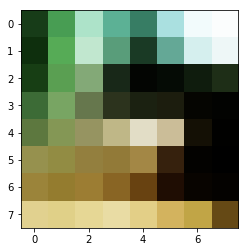

rmse 91.87203258275986
ssim 0.012235469028171077
psnr 8.867137111867082

 next


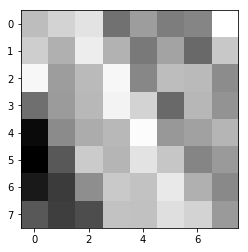

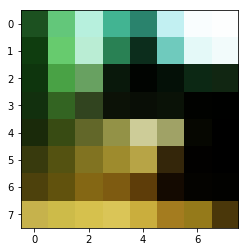

rmse 91.4565096795559
ssim 0.050029129097985826
psnr 8.90651114730331

 next


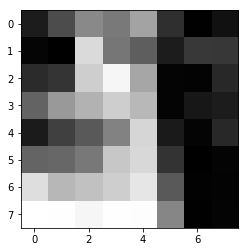

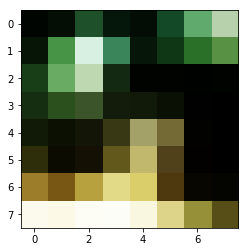

rmse 82.76398971676826
ssim 0.4890106957479274
psnr 9.773975247149139

 next
rmses 0.3228558
ssims 0.0569106439300572
psnrs 10.001103957229969


In [74]:
images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img = img[24: 32, 24: 32]
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 3)
images = images / 255
predictions = oae_20x20.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size, 3))
    plt.imshow(im_1[:, :, 0], cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size, 3))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

predictions: 


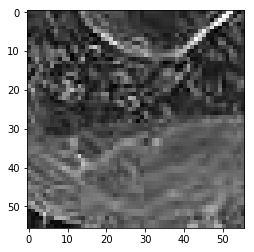

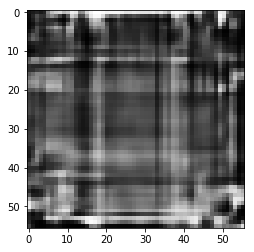

rmse 52.13656157255173
ssim 0.14749541433382726
psnr 13.787955891099902

 next


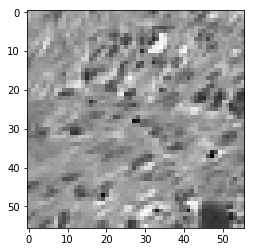

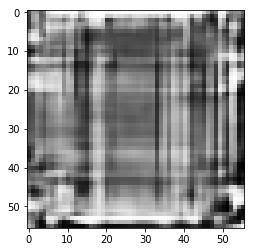

rmse 61.77974112331867
ssim 0.11457283968351388
psnr 12.313881925922667

 next


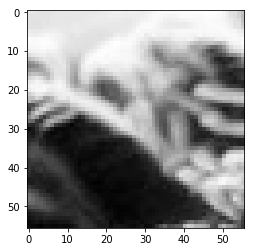

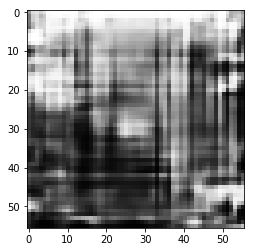

rmse 62.00174041092396
ssim 0.16821128344220246
psnr 12.282725999277924

 next


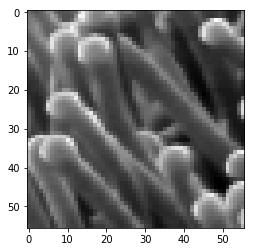

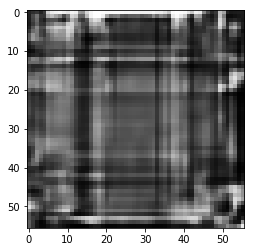

rmse 47.708393186330795
ssim 0.15361937692871575
psnr 14.558907812424613

 next


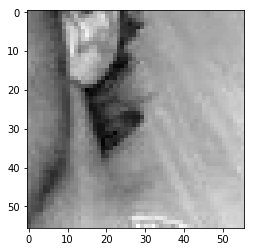

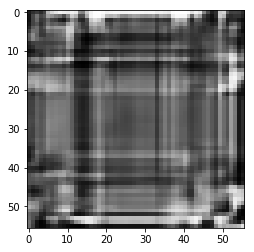

rmse 47.94006295502186
ssim 0.22219714684827704
psnr 14.516831608384873

 next


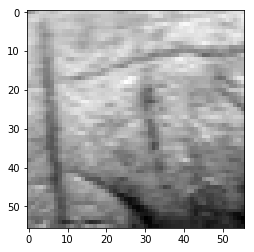

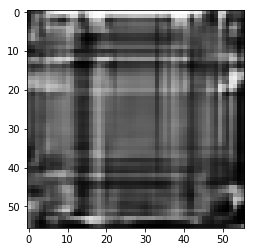

rmse 44.13724601268768
ssim 0.1624220545907748
psnr 15.234698979971677

 next


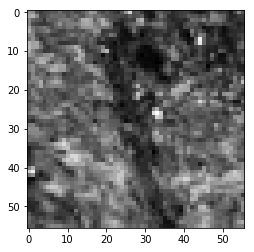

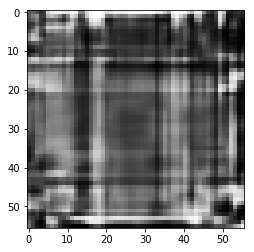

rmse 56.700325682759285
ssim 0.11193464963152457
psnr 13.059092539526794

 next


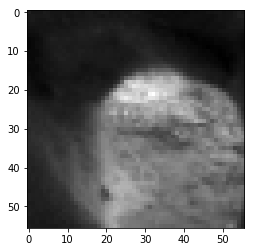

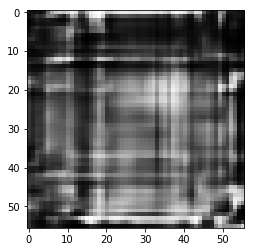

rmse 47.88588546216488
ssim 0.2133248487866168
psnr 14.526653160516325

 next


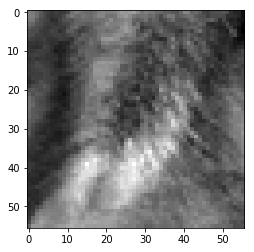

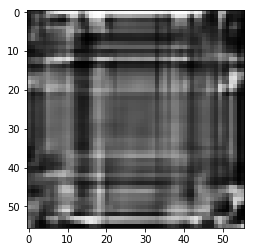

rmse 45.62853679060936
ssim 0.1889534109040119
psnr 14.946072766626322

 next


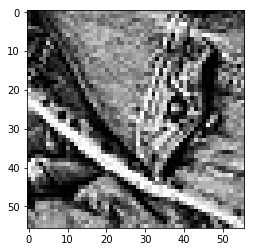

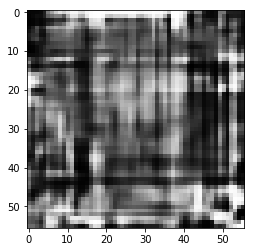

rmse 83.22795242071152
ssim 0.0838548198944808
psnr 9.72541940419144

 next


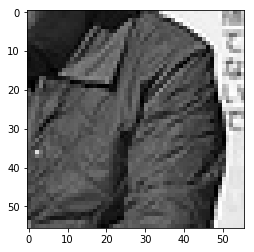

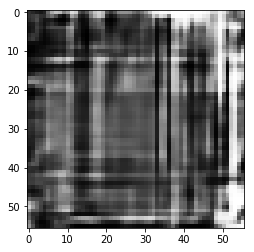

rmse 57.85701781511307
ssim 0.11596650668537276
psnr 12.883682716811887

 next


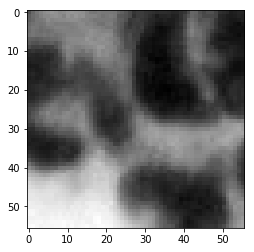

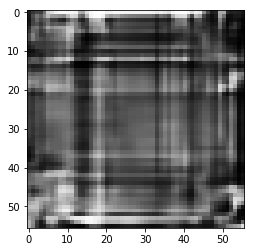

rmse 45.561337396502495
ssim 0.2276944091630285
psnr 14.95887433328746

 next


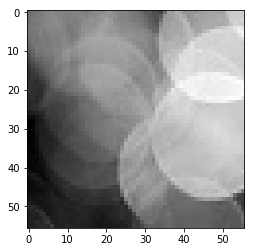

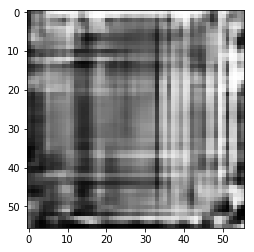

rmse 56.29863403737545
ssim 0.18060034624815807
psnr 13.120846453118247

 next


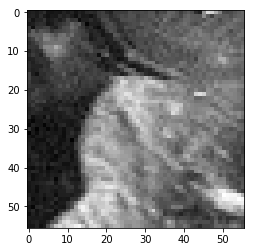

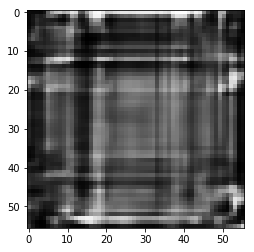

rmse 44.3093653768301
ssim 0.19204187086966135
psnr 15.200893011258108

 next


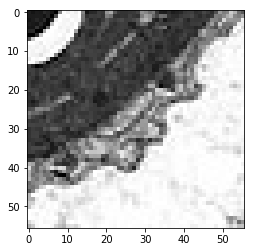

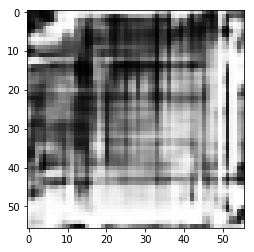

rmse 69.33101892471313
ssim 0.18010943032709098
psnr 11.312251951413991

 next


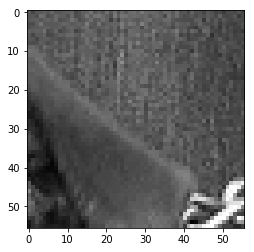

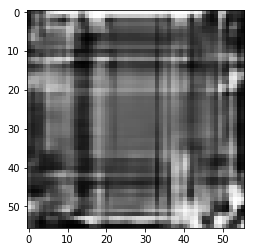

rmse 49.179089069366455
ssim 0.16134115425827433
psnr 14.295194005461017

 next


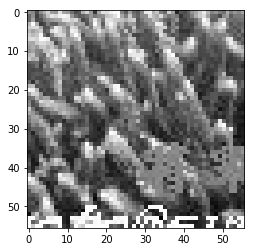

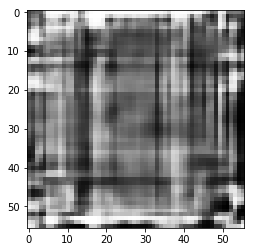

rmse 67.80243694782257
ssim 0.12117283218152668
psnr 11.505897538425685

 next


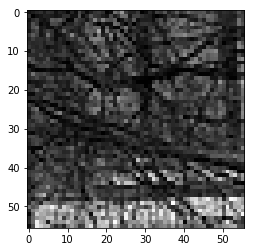

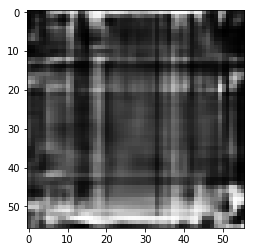

rmse 55.199436619877815
ssim 0.11081712261126006
psnr 13.292110704141093

 next


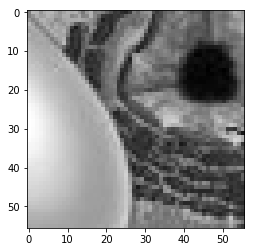

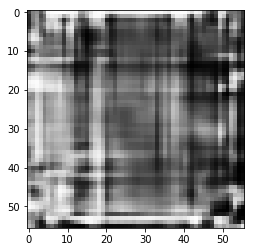

rmse 57.25561648607254
ssim 0.13347330630854654
psnr 12.974441704853497

 next


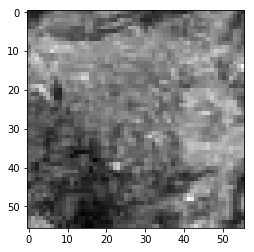

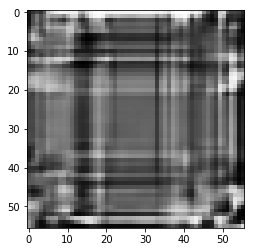

rmse 47.38667204976082
ssim 0.18982139579925278
psnr 14.61767942041616

 next


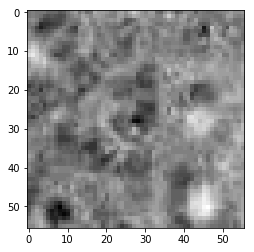

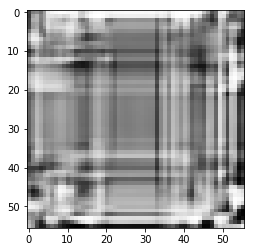

rmse 52.337365597486496
ssim 0.21450854614604925
psnr 13.754566436055647

 next


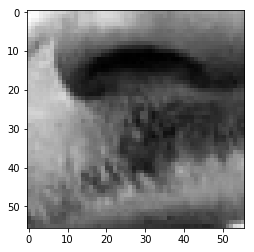

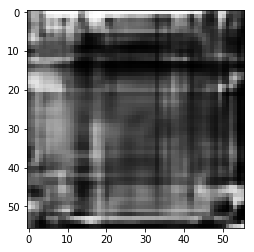

rmse 42.8898261487484
ssim 0.25359388512576675
psnr 15.483717891541504

 next


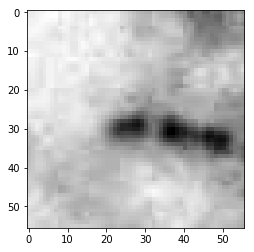

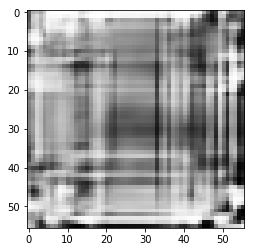

rmse 56.63100980222225
ssim 0.21443644067589449
psnr 13.069717494416945

 next


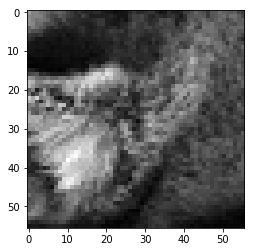

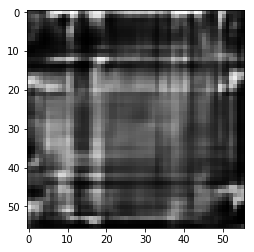

rmse 42.60388769209385
ssim 0.2179762725874361
psnr 15.541818985222742

 next


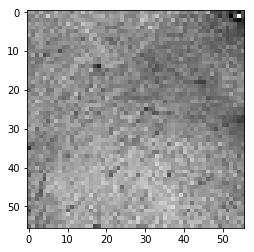

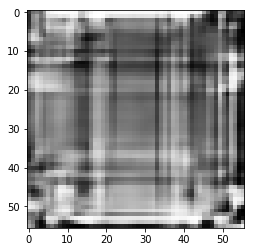

rmse 52.4317829310894
ssim 0.13451937454952084
psnr 13.738911087641963

 next


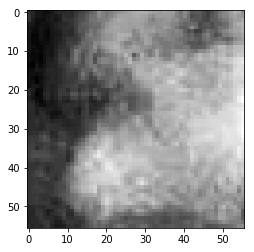

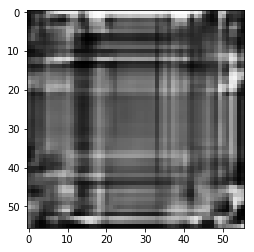

rmse 45.96924550831318
ssim 0.2305425571435518
psnr 14.8814560937187

 next


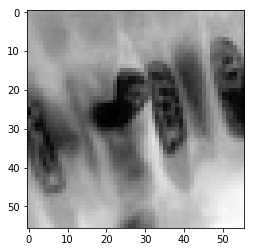

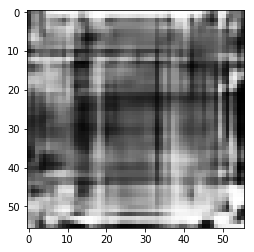

rmse 56.05194367468357
ssim 0.19058122037165462
psnr 13.15899007021844

 next


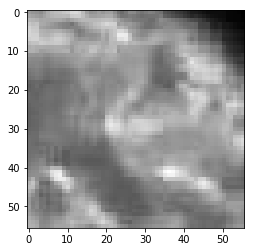

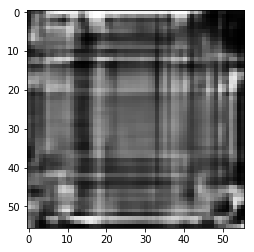

rmse 46.309718638658524
ssim 0.18054039349438464
psnr 14.817360761009928

 next


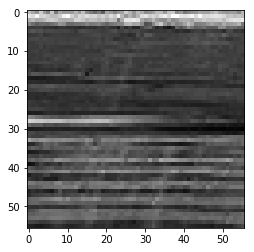

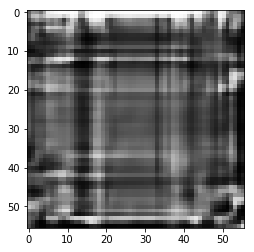

rmse 47.4488291144371
ssim 0.09182576946102736
psnr 14.60629361078402

 next


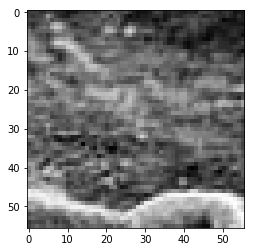

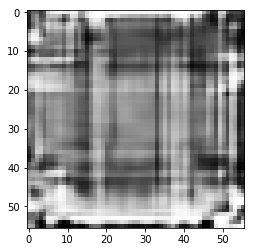

rmse 57.26896516978741
ssim 0.16876231801726166
psnr 12.972416895988719

 next


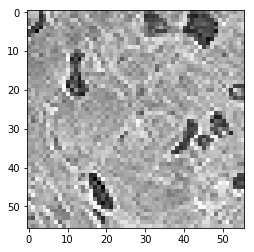

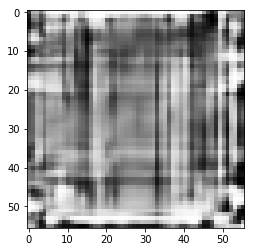

rmse 68.96187633275986
ssim 0.059818105258646184
psnr 11.358622221174869

 next


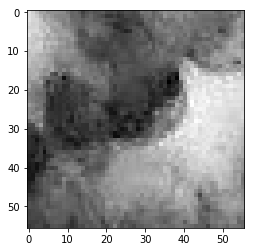

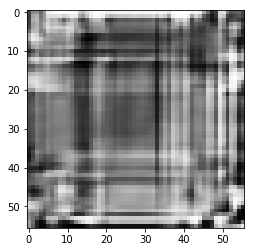

rmse 51.585199758410454
ssim 0.19750242398084317
psnr 13.880301275840765

 next


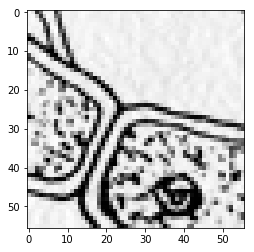

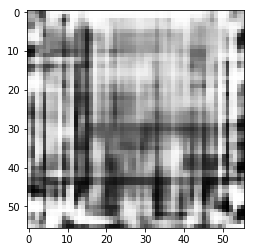

rmse 88.2370488345623
ssim 0.11981008690267965
psnr 9.217784122370487

 next


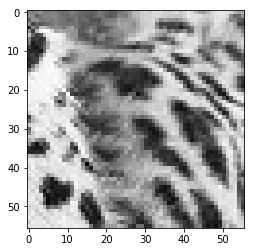

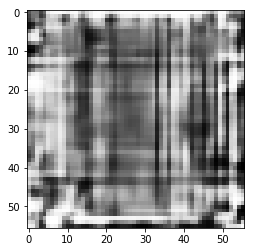

rmse 76.087466776371
ssim 0.04168899666247785
psnr 10.504541106154871

 next


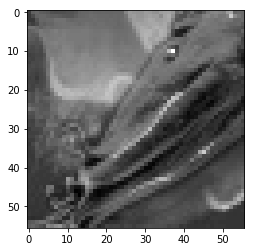

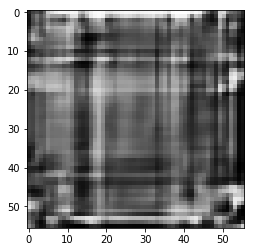

rmse 49.09890577197075
ssim 0.15933513361012844
psnr 14.30936733953558

 next


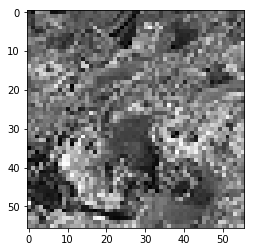

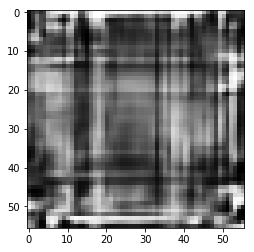

rmse 66.83165743947029
ssim 0.09720582877788028
psnr 11.631158971603966

 next


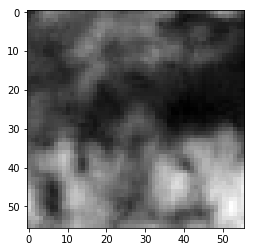

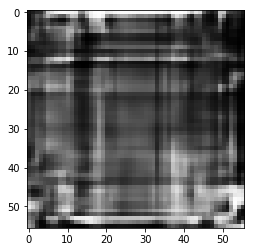

rmse 48.7070631980896
ssim 0.14981900055808933
psnr 14.37896471887159

 next


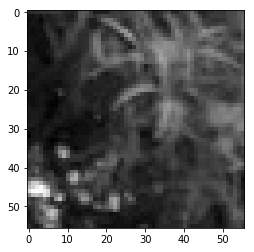

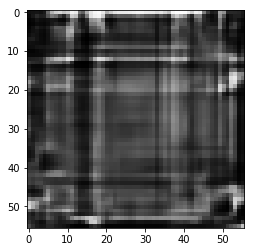

rmse 44.8062115162611
ssim 0.21610417352806857
psnr 15.10403911432299

 next


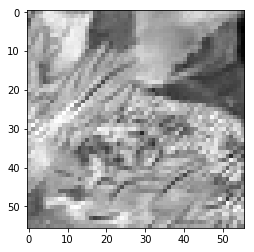

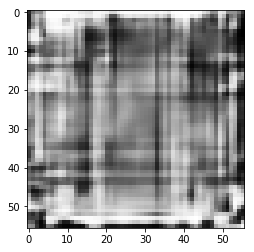

rmse 62.41846024990082
ssim 0.1344279550217409
psnr 12.224542584579012

 next


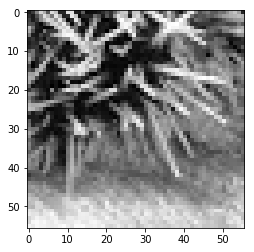

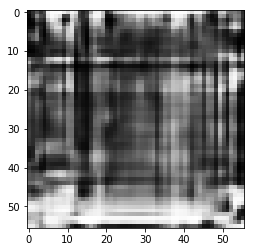

rmse 68.20715323090553
ssim 0.15417632254880323
psnr 11.454205134376085

 next


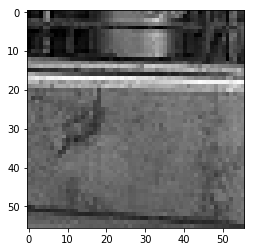

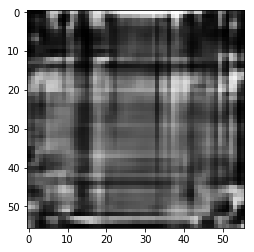

rmse 50.886622443795204
ssim 0.1674342301389959
psnr 13.998731090604672

 next


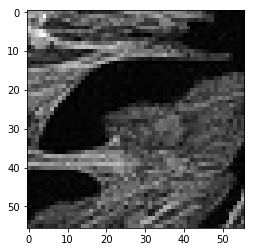

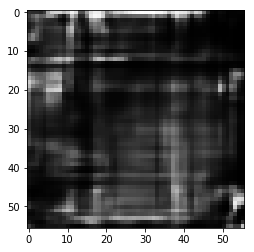

rmse 39.52997803688049
ssim 0.24348508908077474
psnr 16.192272147756576

 next


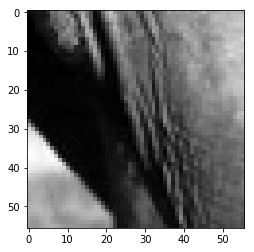

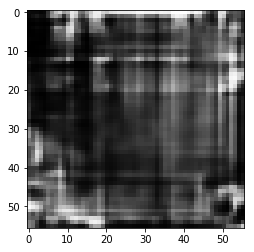

rmse 46.56778559088707
ssim 0.21394566078230404
psnr 14.769091874943419

 next


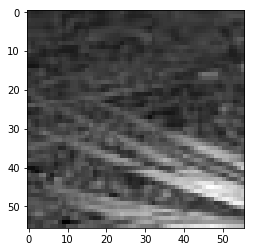

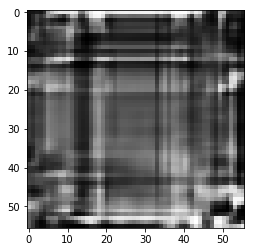

rmse 48.57785493135452
ssim 0.17744772697521402
psnr 14.402036936573126

 next


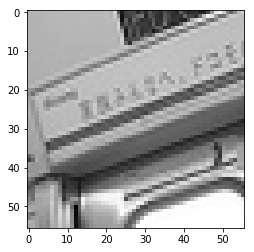

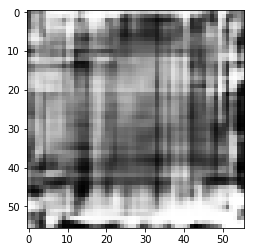

rmse 63.481430411338806
ssim 0.1429545293478514
psnr 12.077869527819253

 next


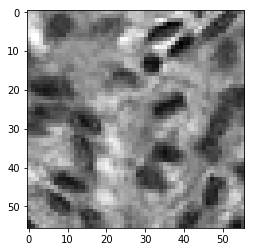

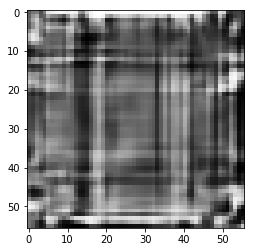

rmse 55.51292359828949
ssim 0.11938321869771981
psnr 13.242921606027016

 next


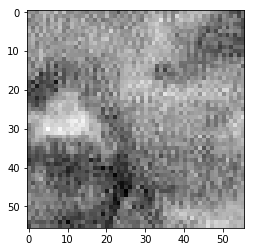

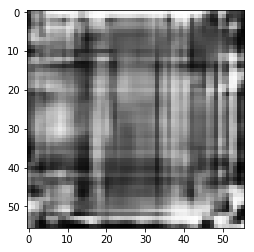

rmse 55.73354735970497
ssim 0.191482691562287
psnr 13.208469885643845

 next


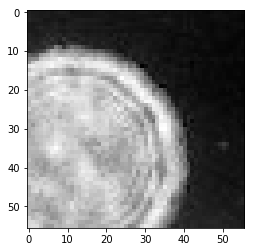

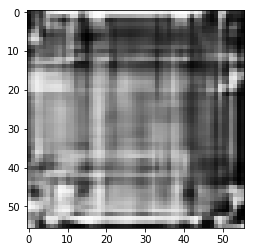

rmse 52.2944051027298
ssim 0.17928564276701633
psnr 13.761699071482248

 next


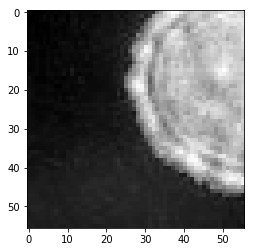

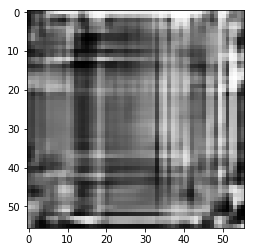

rmse 52.5943686068058
ssim 0.18457406250269756
psnr 13.712018692873254

 next


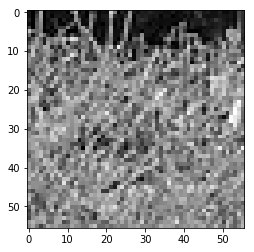

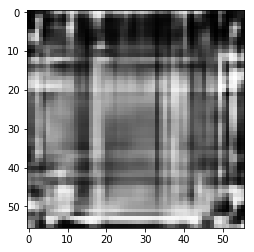

rmse 64.12392273545265
ssim 0.08611501628691441
psnr 11.990401965651106

 next


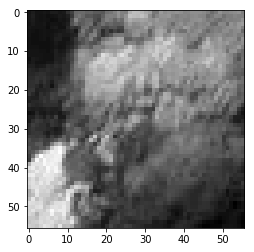

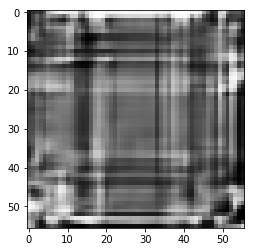

rmse 50.01129001379013
ssim 0.1513070430906686
psnr 14.149442467077895

 next


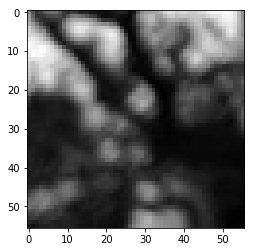

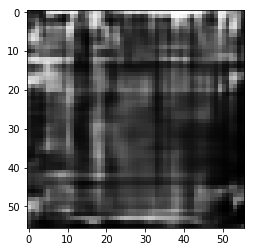

rmse 45.73350615799427
ssim 0.24278391985047593
psnr 14.92611365204774

 next


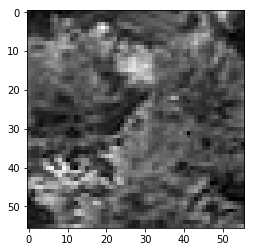

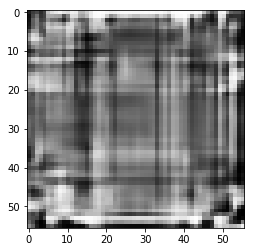

rmse 56.75662726163864
ssim 0.11698257465706581
psnr 13.050472012920974

 next


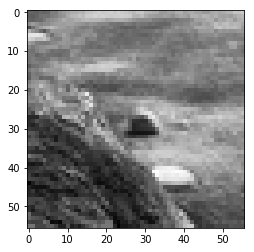

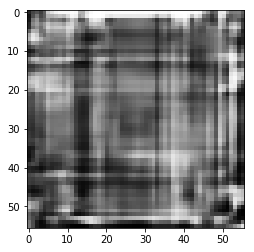

rmse 52.98369951546192
ssim 0.12858458922874924
psnr 13.647958027734429

 next


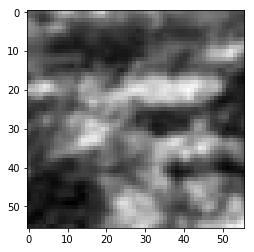

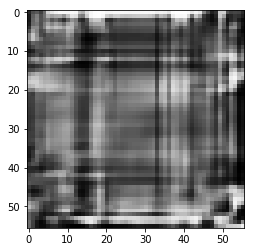

rmse 47.886972203850746
ssim 0.3017776905570692
psnr 14.526456041654491

 next


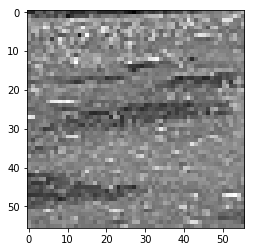

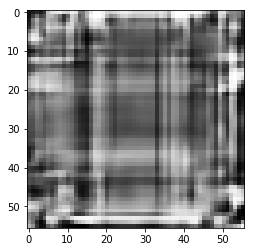

rmse 58.32783915102482
ssim 0.09113558937281972
psnr 12.813285856923997

 next


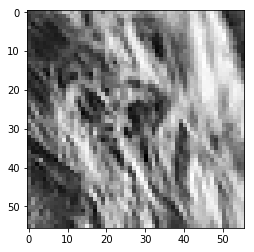

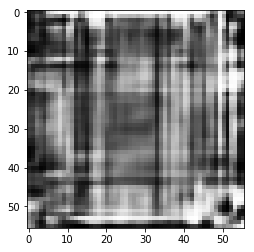

rmse 70.98363384604454
ssim 0.11267982529298241
psnr 11.107639042657432

 next


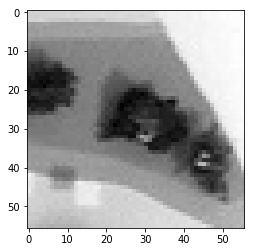

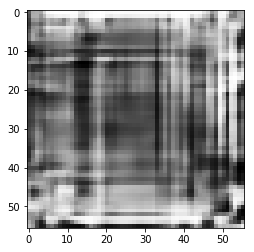

rmse 53.0906979739666
ssim 0.2381534720324134
psnr 13.630434909258629

 next


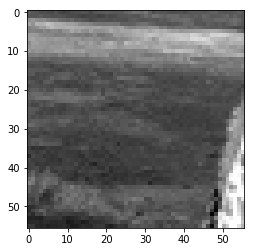

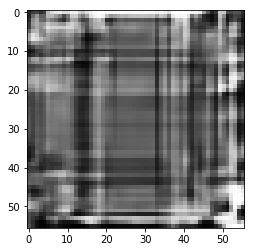

rmse 52.99037575721741
ssim 0.15426453501326415
psnr 13.646863626127004

 next


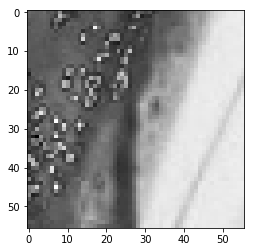

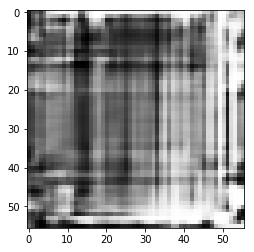

rmse 61.419585049152374
ssim 0.15725639834853866
psnr 12.3646660482288

 next


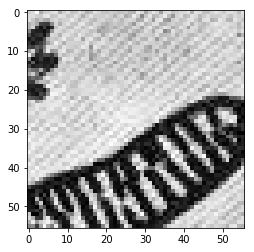

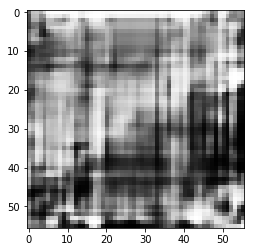

rmse 71.06860488653183
ssim 0.15764244049602075
psnr 11.09724780666263

 next


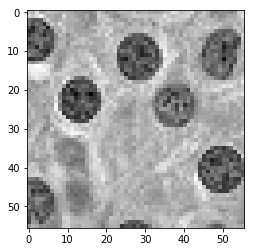

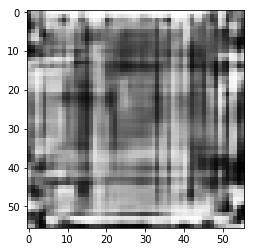

rmse 63.63683447241783
ssim 0.16479457475208406
psnr 12.056632246181858

 next


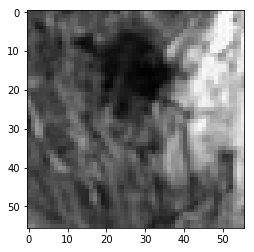

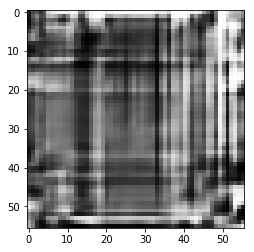

rmse 60.0045295804739
ssim 0.14928749676117212
psnr 12.567122901821222

 next


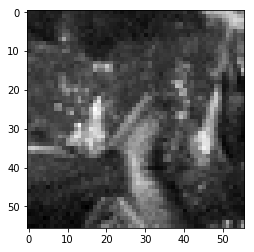

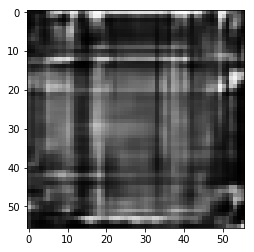

rmse 46.221076995134354
ssim 0.15543299957358744
psnr 14.834002393954666

 next


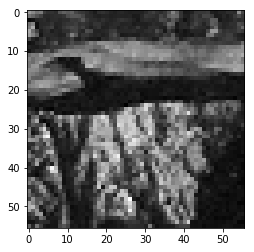

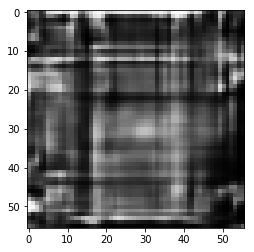

rmse 54.20884497463703
ssim 0.16845922710261466
psnr 13.449400530946047

 next


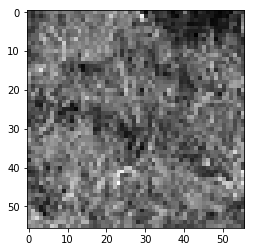

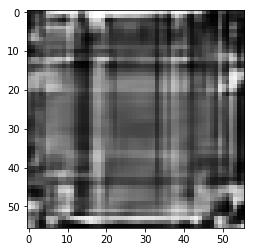

rmse 51.44614242017269
ssim 0.11474876295765449
psnr 13.903747295297553

 next


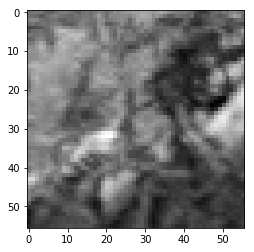

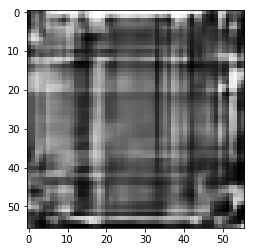

rmse 51.42452158033848
ssim 0.1327718691643943
psnr 13.907398408727644

 next


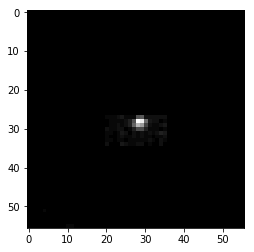

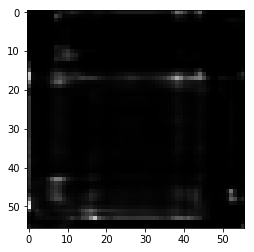

rmse 2.6658379146829247
ssim 0.4672772117783258
psnr 39.61412880088622

 next


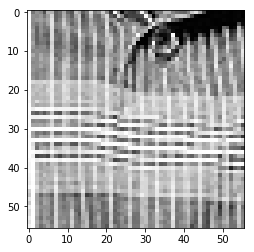

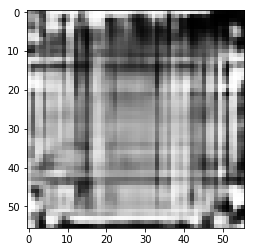

rmse 75.32957464456558
ssim 0.07563388243479496
psnr 10.591493305570898

 next


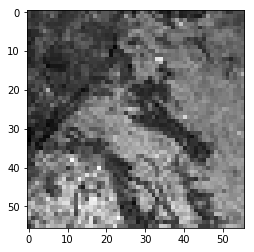

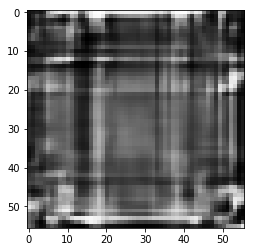

rmse 49.06305469572544
ssim 0.12499432052792805
psnr 14.31571192564683

 next


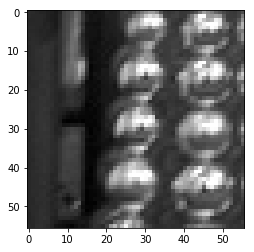

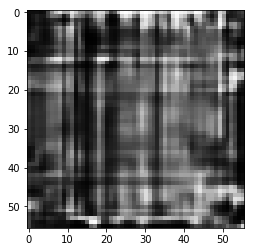

rmse 63.144578486680984
ssim 0.13982401718062706
psnr 12.124082238292726

 next


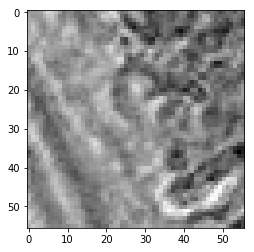

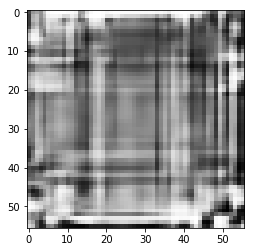

rmse 60.06722241640091
ssim 0.10318924810855672
psnr 12.55805260686196

 next


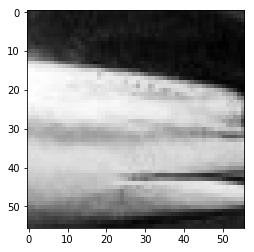

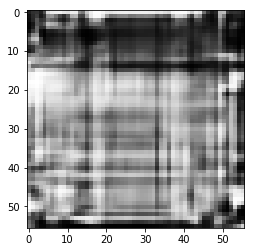

rmse 64.40767630934715
ssim 0.17398615227288725
psnr 11.95205098815434

 next


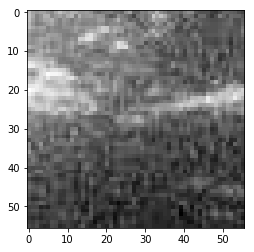

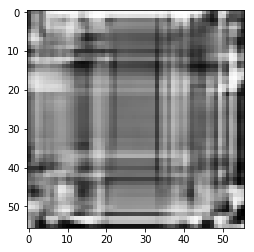

rmse 50.461516454815865
ssim 0.2000350520774926
psnr 14.071597655296644

 next


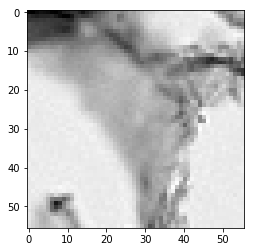

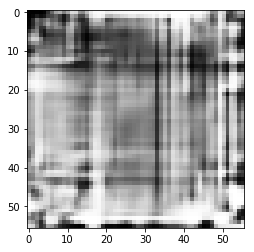

rmse 64.06129449605942
ssim 0.2425972654209247
psnr 11.998889403292178

 next


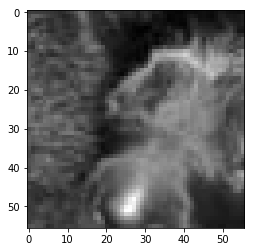

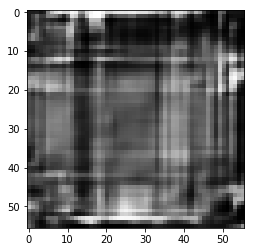

rmse 47.722095251083374
ssim 0.16018094948300582
psnr 14.55641354408289

 next


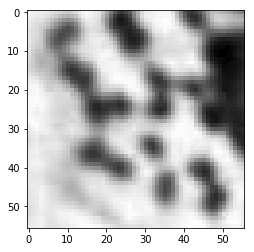

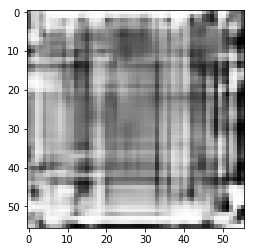

rmse 61.41371436417103
ssim 0.201729499181736
psnr 12.365496313671969

 next


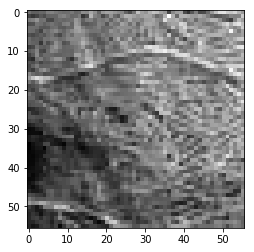

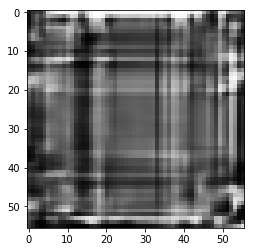

rmse 50.2215289324522
ssim 0.10622982440744666
psnr 14.113005005928105

 next


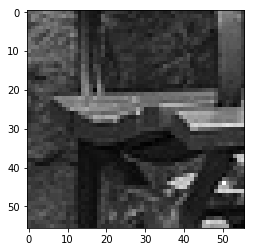

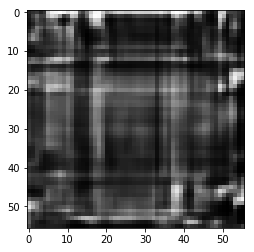

rmse 46.8163188546896
ssim 0.17440710038215929
psnr 14.722858362067722

 next


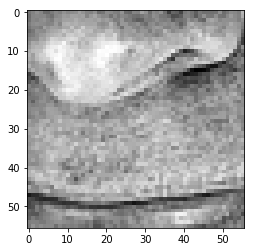

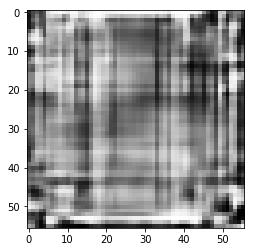

rmse 65.21308869123459
ssim 0.1270598847747569
psnr 11.844108204501529

 next


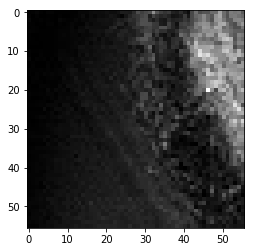

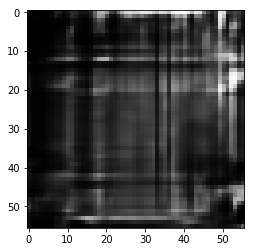

rmse 39.53859597444534
ssim 0.27027346243760153
psnr 16.190378741790216

 next


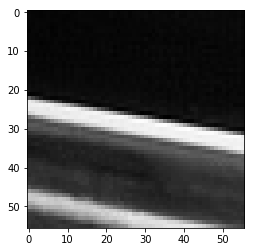

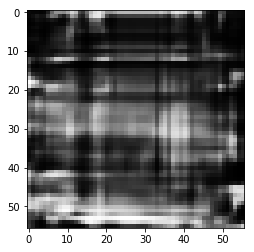

rmse 58.17090377211571
ssim 0.26804487893259027
psnr 12.836687383358585

 next


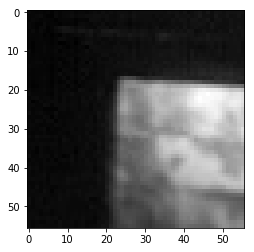

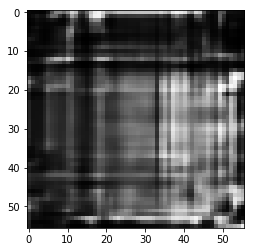

rmse 47.84768991172314
ssim 0.19753490942307403
psnr 14.533584111378865

 next


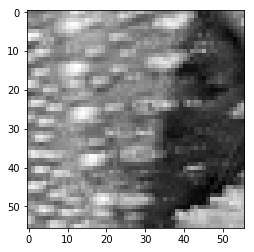

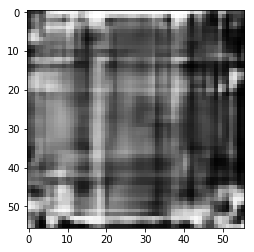

rmse 52.12224394083023
ssim 0.1737868282371658
psnr 13.79034151923329

 next


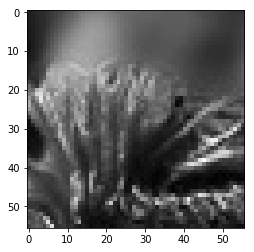

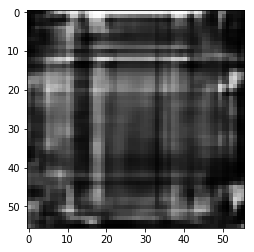

rmse 45.11480435729027
ssim 0.17097690818027672
psnr 15.044422041338766

 next


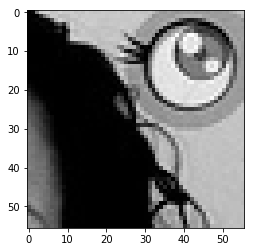

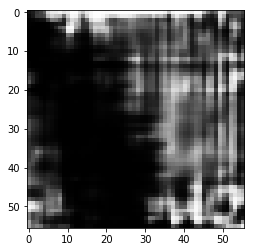

rmse 55.21966673433781
ssim 0.31573123478967624
psnr 13.288927984155272

 next


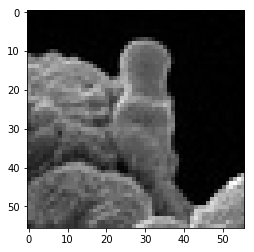

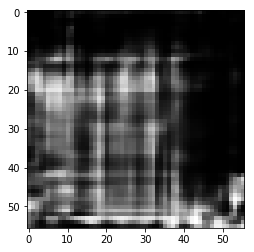

rmse 46.92699171602726
ssim 0.31485124203008225
psnr 14.702349320936714

 next


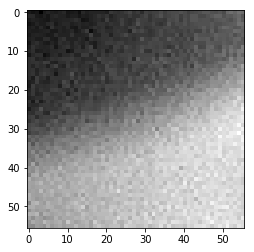

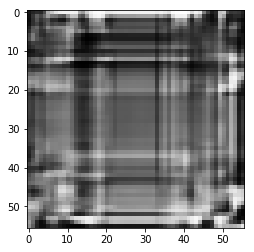

rmse 47.23477520048618
ssim 0.20920703215345013
psnr 14.645566552580213

 next


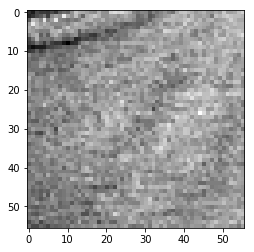

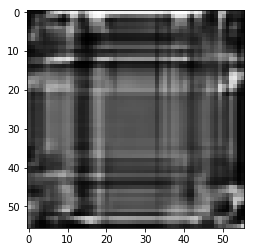

rmse 43.892957121133804
ssim 0.185823993549412
psnr 15.282906793270342

 next


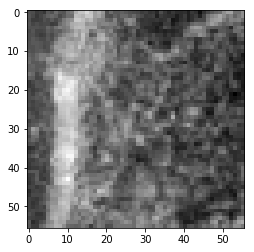

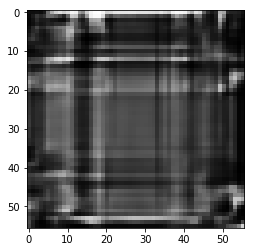

rmse 42.471483796834946
ssim 0.224777244314844
psnr 15.568854930649838

 next


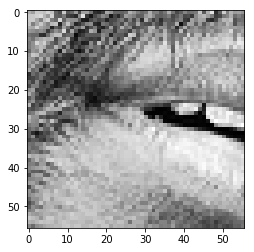

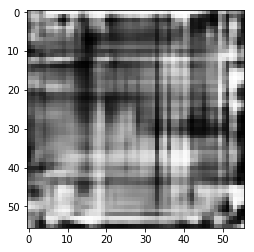

rmse 70.45784085988998
ssim 0.08956566120727441
psnr 11.172217001801016

 next


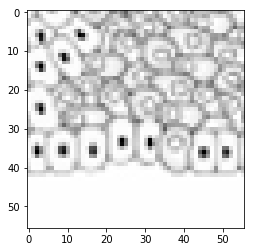

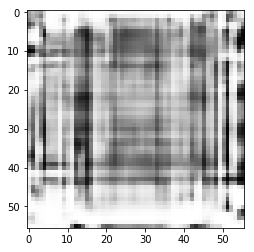

rmse 77.21205443143845
ssim 0.08662655035608625
psnr 10.377101445390695

 next


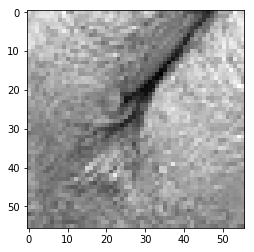

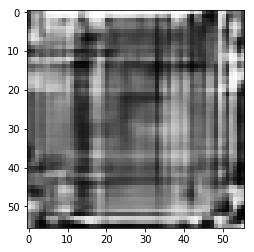

rmse 53.30306097865105
ssim 0.14633689371502803
psnr 13.595760618404098

 next


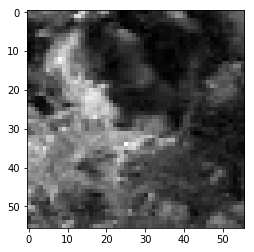

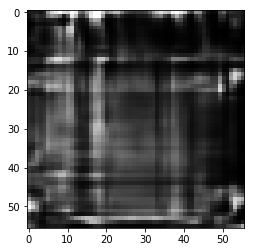

rmse 40.316752418875694
ssim 0.1908736554797084
psnr 16.02109277453567

 next


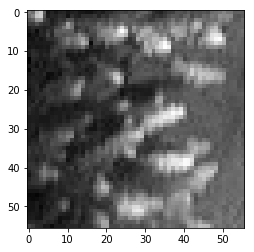

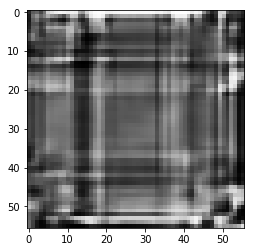

rmse 47.783716544508934
ssim 0.1966099132386981
psnr 14.545205098894925

 next


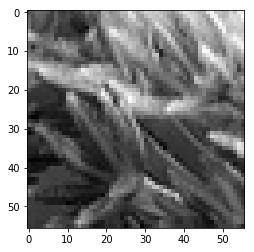

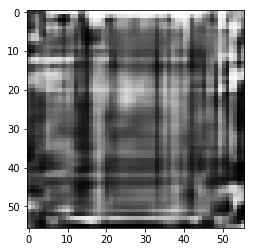

rmse 57.332573756575584
ssim 0.130107562647382
psnr 12.962774840100336

 next


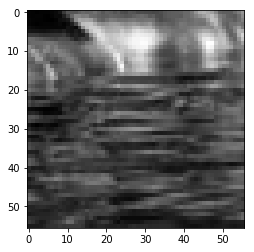

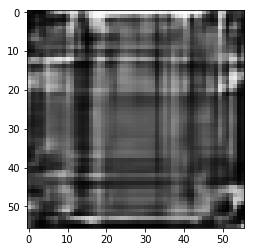

rmse 48.812910318374634
ssim 0.10584636322952921
psnr 14.360109570881264

 next


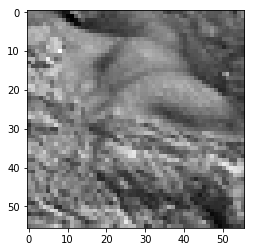

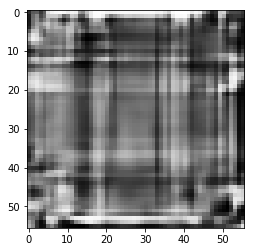

rmse 55.69305673241615
ssim 0.13981587387844474
psnr 13.214782509785135

 next


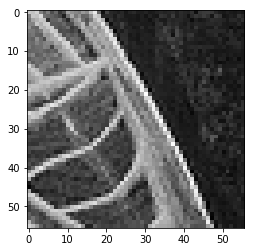

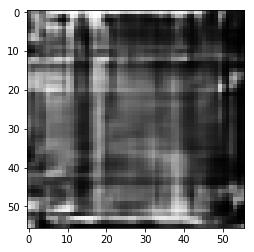

rmse 54.81401190161705
ssim 0.12811366655672826
psnr 13.352971813551292

 next


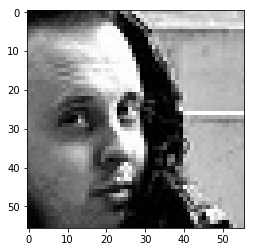

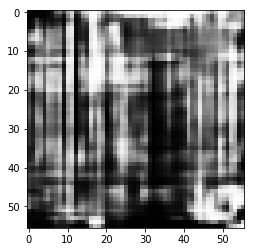

rmse 76.28210753202438
ssim 0.14273169027855123
psnr 10.48234994299192

 next
rmses 0.21422918
ssims 0.16835749872977615
psnrs 13.690335572594387


In [80]:
patch_size = 56

images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 3)
images = images / 255
predictions = oae.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size, 3))[:, :, 0]
    plt.imshow(im_1, cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size, 3))
    pred_1 = np.dot(pred_1[...,:3], [0.2989, 0.5870, 0.1140])
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

predictions: 


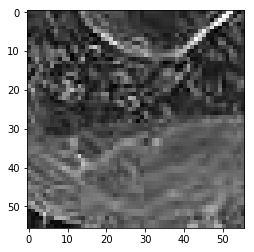

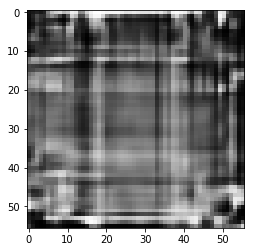

rmse 55.22639237344265
ssim 0.15004589383633885
psnr 13.287870125512706

 next


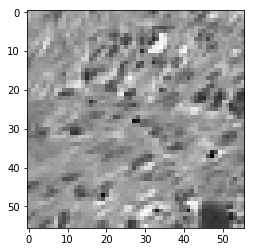

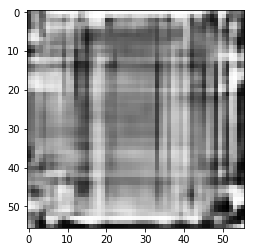

rmse 56.083983555436134
ssim 0.12574281923143307
psnr 13.154026542780253

 next


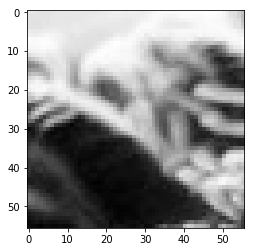

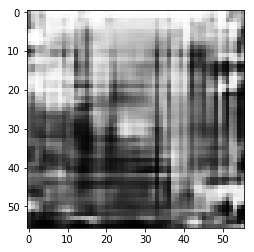

rmse 59.32592399418354
ssim 0.16877586224346502
psnr 12.66591338814392

 next


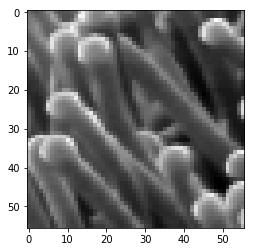

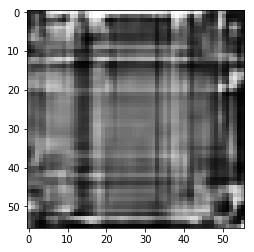

rmse 51.67734481394291
ssim 0.14573452173765286
psnr 13.864799779169408

 next


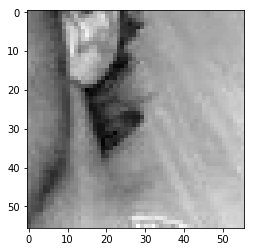

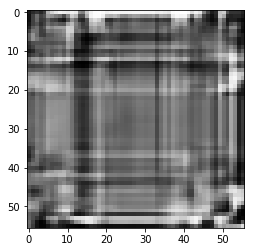

rmse 48.628631606698036
ssim 0.21635730710594142
psnr 14.392962631883325

 next


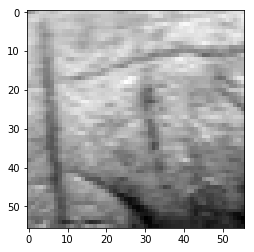

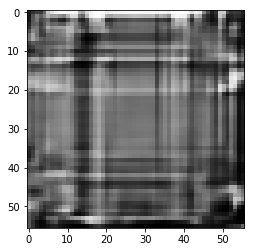

rmse 46.941951513290405
ssim 0.15409484597841816
psnr 14.699580798256786

 next


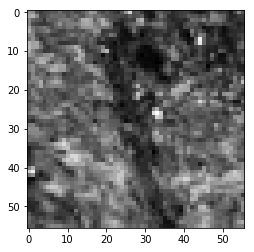

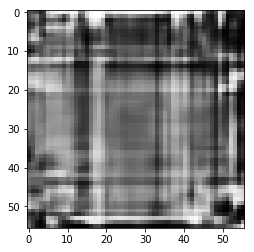

rmse 57.564429715275764
ssim 0.12274652768726454
psnr 12.927719478482151

 next


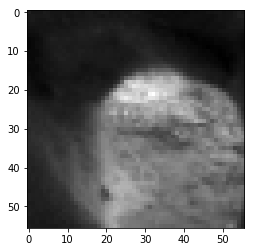

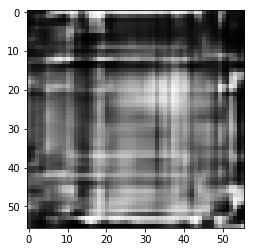

rmse 49.6145761013031
ssim 0.20288889431467627
psnr 14.21861790533054

 next


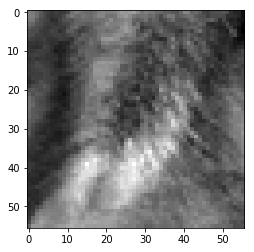

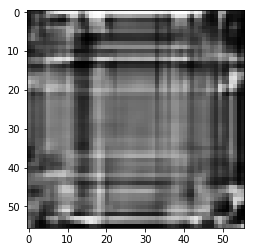

rmse 49.9885368347168
ssim 0.1779937860082
psnr 14.153395106037081

 next


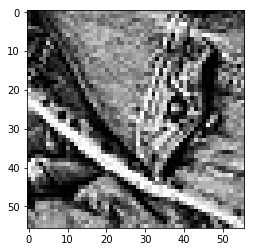

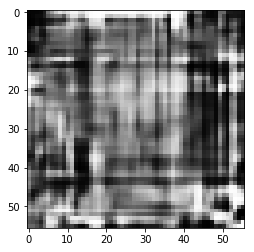

rmse 81.94725394248962
ssim 0.0822495445677203
psnr 9.860115510367057

 next


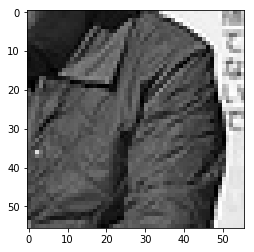

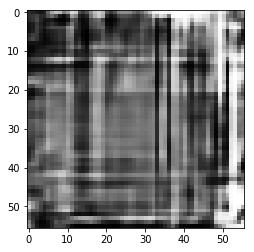

rmse 60.88178850710392
ssim 0.11523883837552036
psnr 12.44105556675435

 next


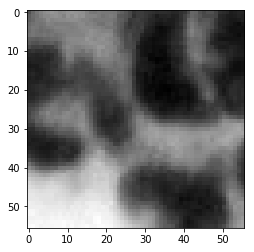

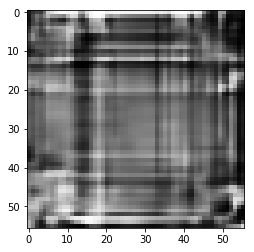

rmse 49.42872807383537
ssim 0.2197325412931223
psnr 14.251214906492427

 next


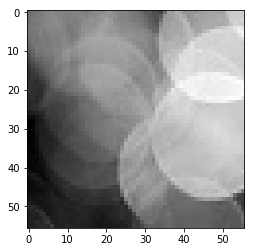

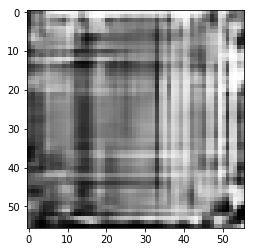

rmse 52.07871347665787
ssim 0.1933310510945127
psnr 13.797598666174375

 next


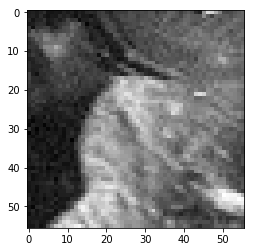

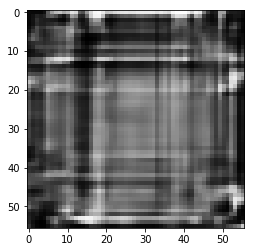

rmse 49.54458765685558
ssim 0.17879998110228892
psnr 14.230879243210389

 next


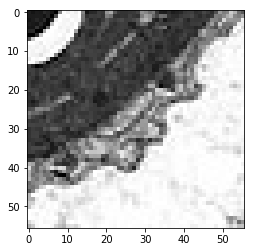

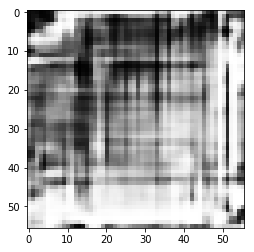

rmse 66.18828356266022
ssim 0.18728373781513488
psnr 11.715181232097297

 next


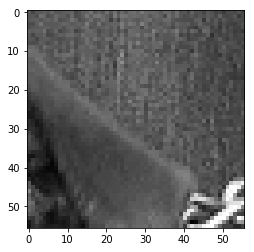

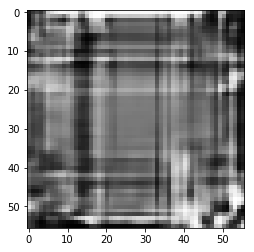

rmse 51.17864817380905
ssim 0.15397126173253525
psnr 13.94902740259083

 next


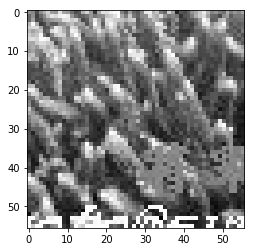

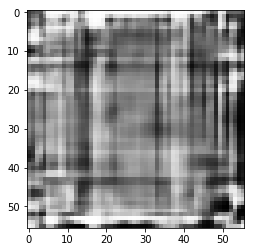

rmse 64.17354807257652
ssim 0.12905880528126532
psnr 11.983682577961051

 next


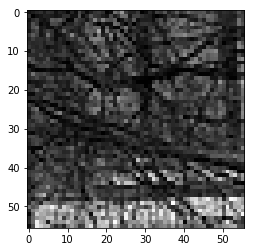

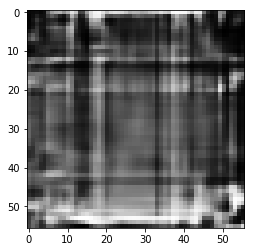

rmse 61.088258028030396
ssim 0.09902352402580027
psnr 12.411648786379521

 next


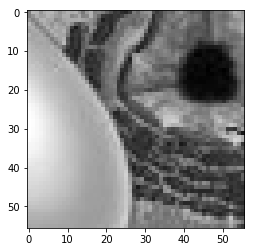

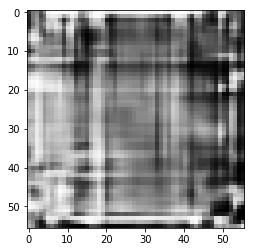

rmse 55.0623893737793
ssim 0.13937529652705632
psnr 13.313702544419012

 next


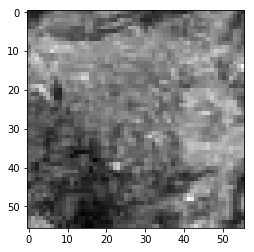

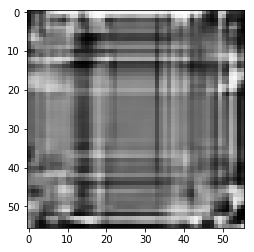

rmse 46.40603967010975
ssim 0.19677869962796618
psnr 14.799313469691617

 next


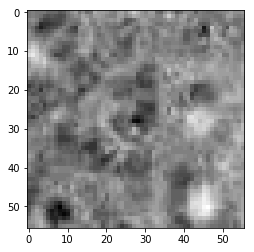

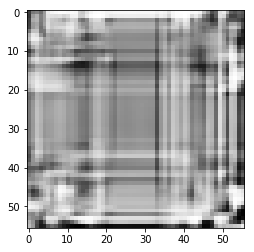

rmse 46.156199276447296
ssim 0.23375936403532088
psnr 14.846202814228576

 next


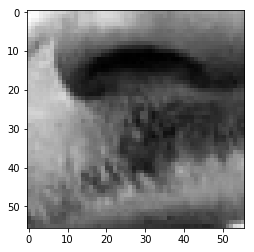

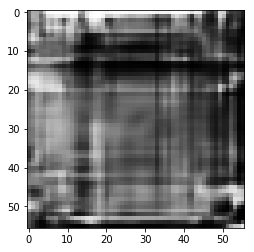

rmse 47.31426313519478
ssim 0.23964025852725504
psnr 14.630961991745952

 next


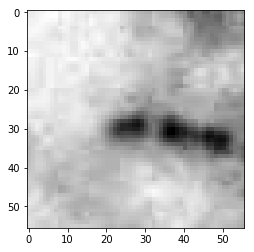

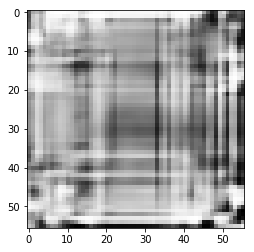

rmse 49.59692604839802
ssim 0.23428343158038775
psnr 14.22170840209624

 next


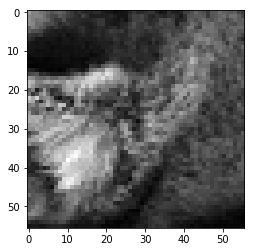

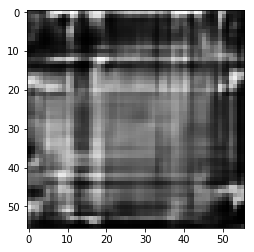

rmse 49.21877034008503
ssim 0.19962709792365826
psnr 14.288188423044637

 next


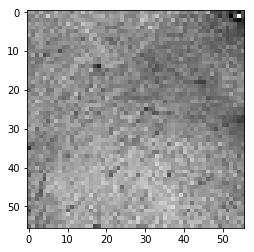

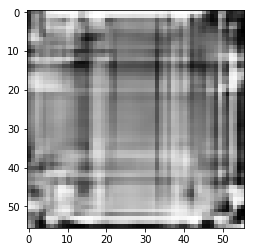

rmse 46.68815553188324
ssim 0.14407155794806709
psnr 14.746669269128304

 next


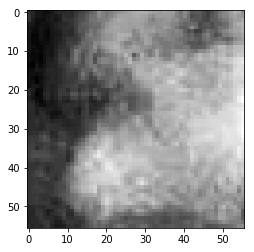

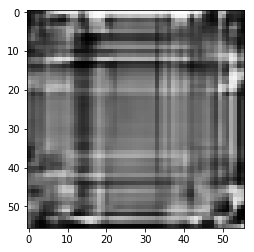

rmse 47.241390645504
ssim 0.2267525034276003
psnr 14.644350139426468

 next


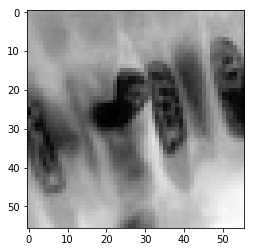

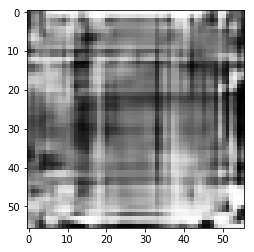

rmse 53.96580621600151
ssim 0.20016215214133562
psnr 13.48843021792023

 next


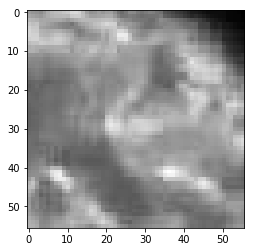

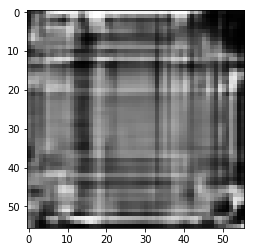

rmse 47.474530935287476
ssim 0.19325153653940955
psnr 14.601589959654472

 next


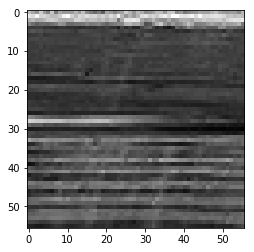

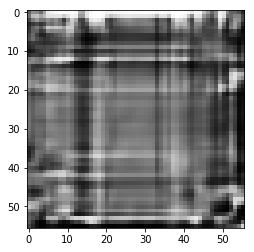

rmse 53.35012145340443
ssim 0.08481090621979491
psnr 13.588095359717386

 next


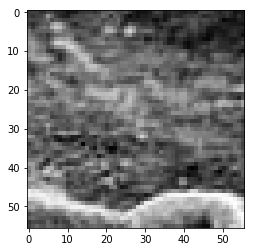

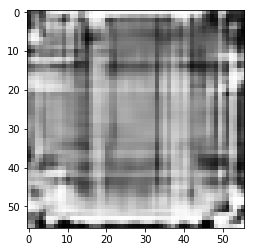

rmse 51.48196689784527
ssim 0.16441654557466867
psnr 13.897700988335691

 next


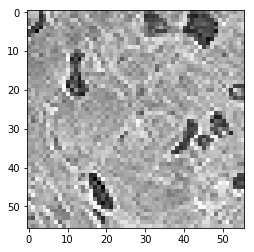

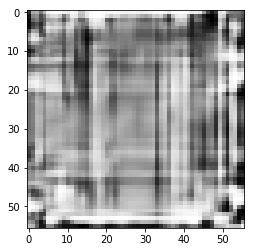

rmse 62.55199648439884
ssim 0.06905848037941284
psnr 12.205980094414748

 next


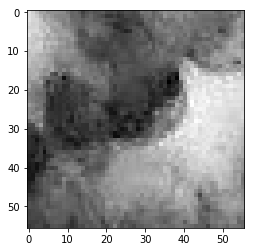

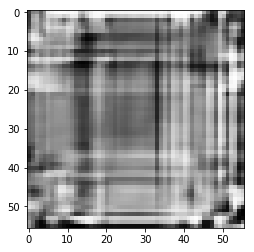

rmse 47.537352964282036
ssim 0.2073488214480851
psnr 14.590103706192071

 next


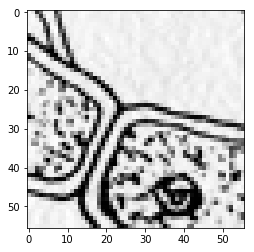

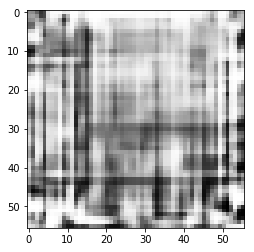

rmse 83.56327682733536
ssim 0.13372206951570206
psnr 9.690494369749958

 next


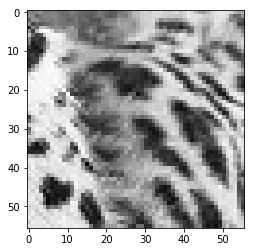

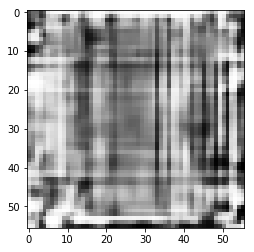

rmse 70.60050040483475
ssim 0.055758037192527254
psnr 11.154648023255419

 next


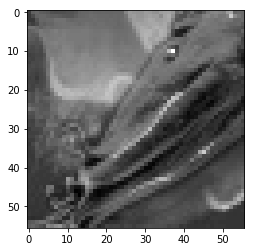

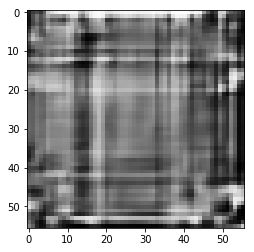

rmse 48.885672613978386
ssim 0.15842944517974702
psnr 14.347171708994033

 next


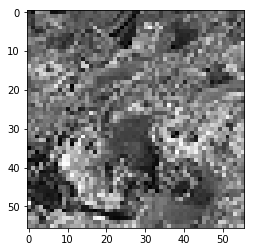

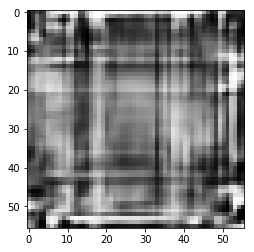

rmse 66.68534249067307
ssim 0.09650607929522718
psnr 11.65019588835682

 next


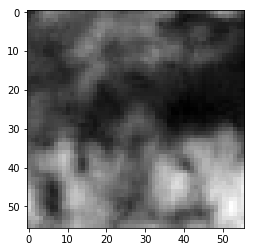

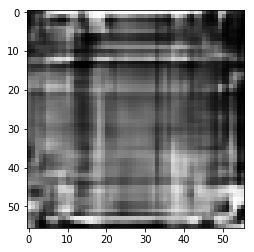

rmse 54.33017626404762
ssim 0.1399094340229949
psnr 13.429981328222222

 next


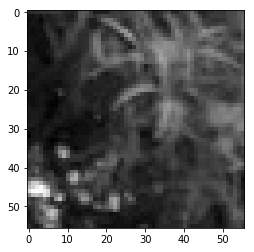

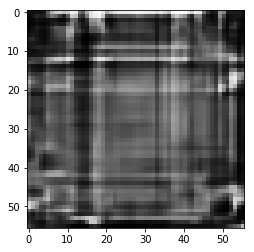

rmse 52.1310518682003
ssim 0.19022170429627
psnr 13.788873849848553

 next


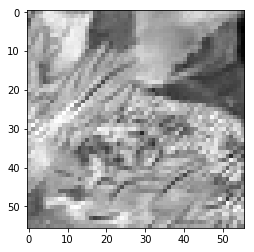

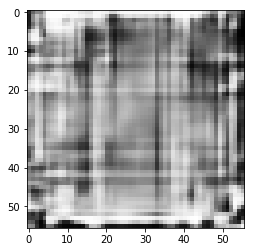

rmse 55.86244024336338
ssim 0.15123229609465566
psnr 13.188405546692819

 next


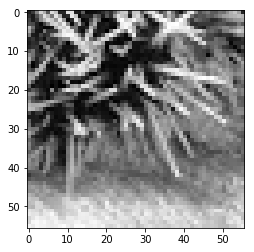

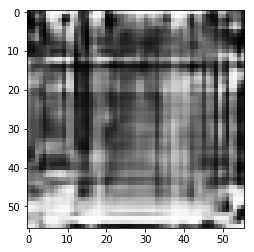

rmse 66.66179895401001
ssim 0.1480856919670354
psnr 11.653263019171241

 next


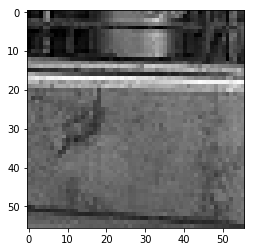

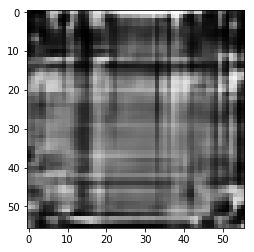

rmse 51.75213240087032
ssim 0.16302424458586473
psnr 13.852238624321613

 next


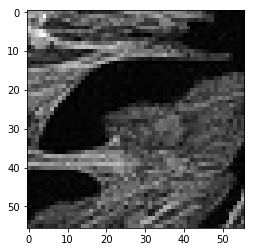

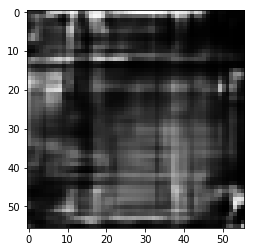

rmse 45.080047622323036
ssim 0.22079521989049056
psnr 15.051116285465167

 next


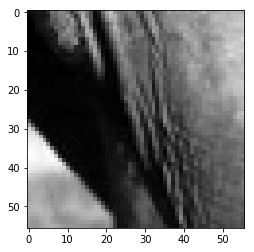

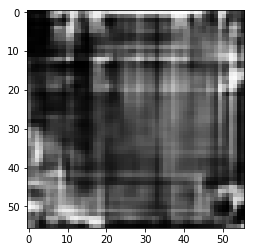

rmse 51.32853113114834
ssim 0.1573916889889159
psnr 13.923626884057862

 next


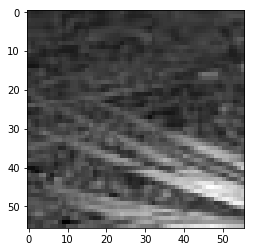

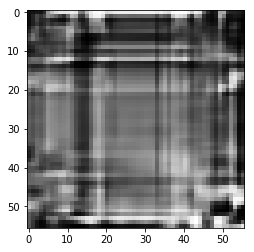

rmse 54.147911444306374
ssim 0.16247176223431783
psnr 13.45916940910354

 next


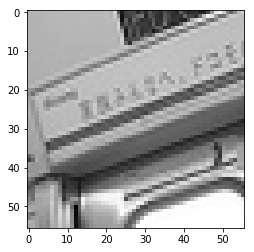

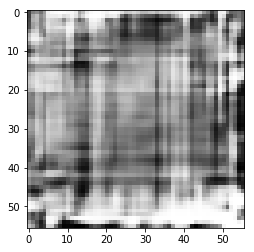

rmse 59.960645735263824
ssim 0.1364285823640985
psnr 12.573477583542601

 next


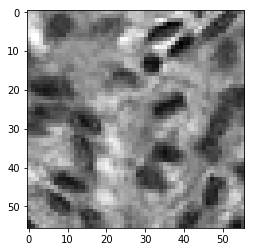

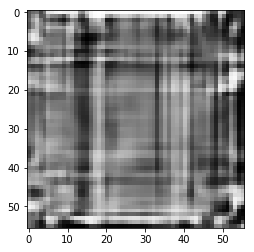

rmse 52.36871771514416
ssim 0.13298781647376437
psnr 13.749364808157491

 next


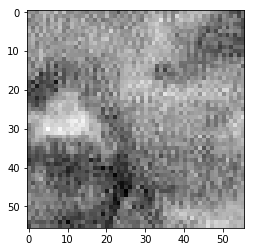

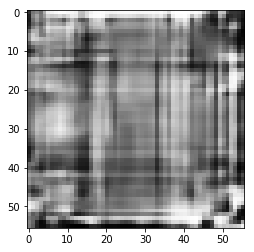

rmse 52.066565528512
ssim 0.1986106420159799
psnr 13.7996249843793

 next


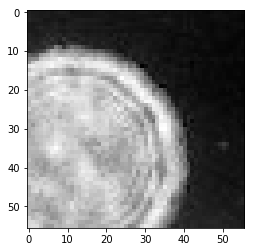

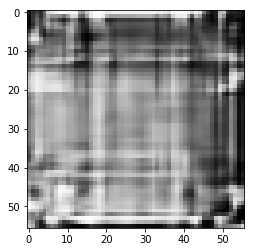

rmse 48.25226940214634
ssim 0.18523020227461862
psnr 14.460448730460332

 next


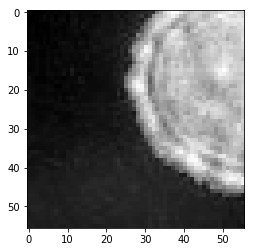

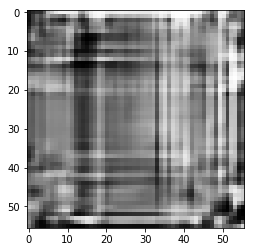

rmse 50.065034329891205
ssim 0.19255848399002026
psnr 14.140113242683094

 next


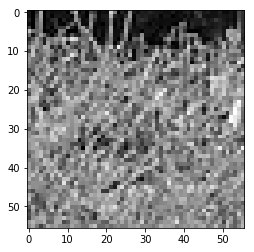

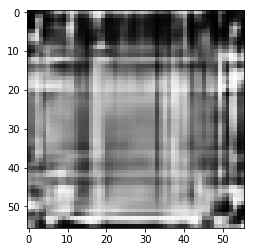

rmse 62.132347002625465
ssim 0.09051159598216277
psnr 12.264448427278689

 next


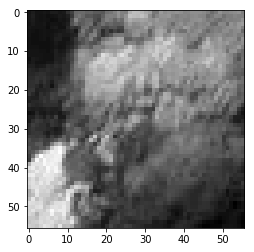

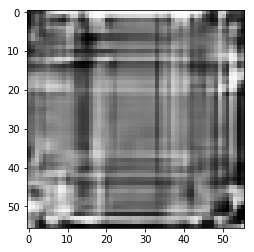

rmse 46.4311221241951
ssim 0.16133226147242222
psnr 14.794620016571606

 next


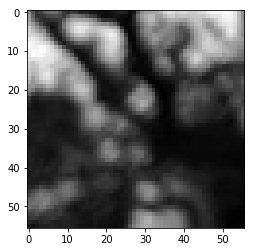

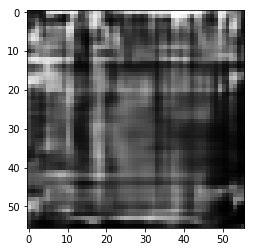

rmse 50.76775722205639
ssim 0.2242166157145613
psnr 14.019044050494271

 next


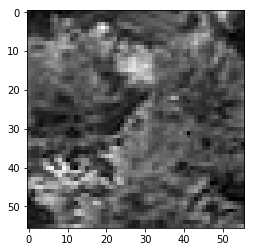

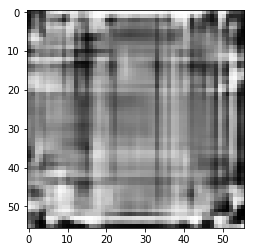

rmse 51.549614667892456
ssim 0.13305317011729093
psnr 13.88629514285812

 next


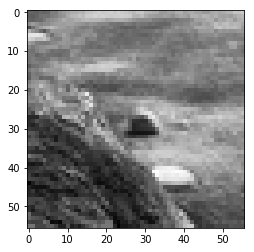

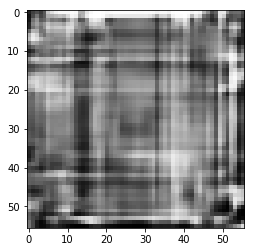

rmse 50.212895795702934
ssim 0.1219711591676338
psnr 14.114498248378036

 next


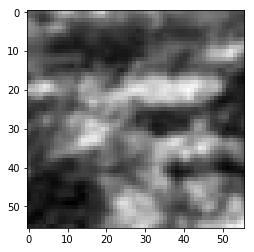

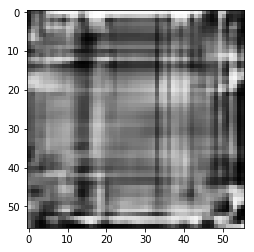

rmse 46.5789569914341
ssim 0.29754476138386526
psnr 14.767008419311388

 next


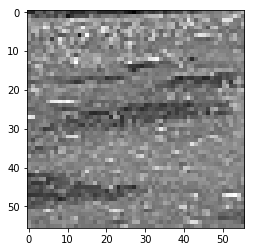

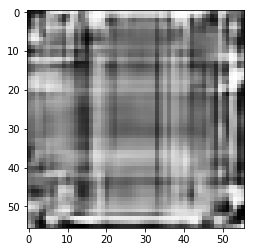

rmse 55.033917501568794
ssim 0.09767291847931094
psnr 13.318195039259964

 next


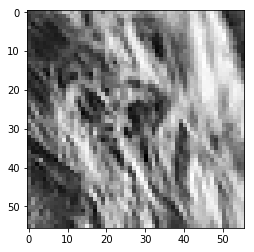

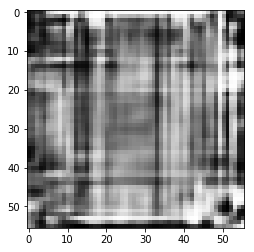

rmse 67.86061182618141
ssim 0.11664001257049929
psnr 11.498448190815239

 next


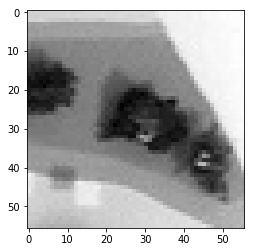

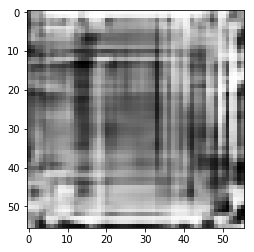

rmse 51.453673616051674
ssim 0.24095600102294543
psnr 13.90247586180264

 next


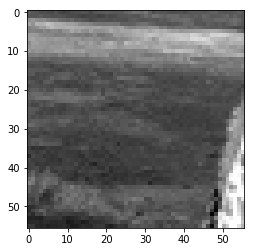

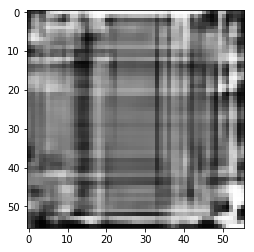

rmse 52.25567378103733
ssim 0.1783389633677556
psnr 13.768134571191833

 next


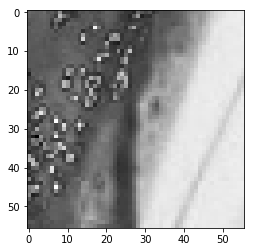

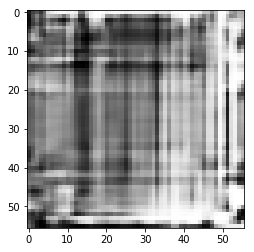

rmse 58.22813630104065
ssim 0.1647897132719132
psnr 12.828145809996844

 next


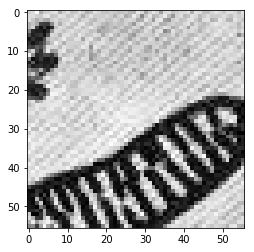

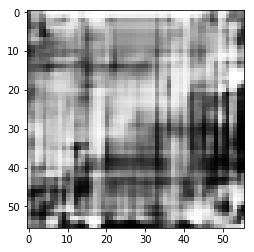

rmse 67.97991022467613
ssim 0.15933357225451933
psnr 11.483191874451295

 next


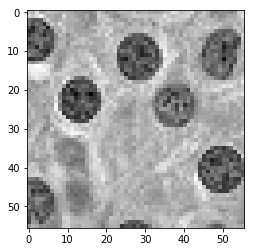

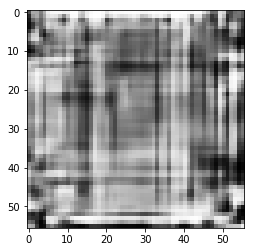

rmse 57.41964988410473
ssim 0.17018599531511433
psnr 12.94959280745644

 next


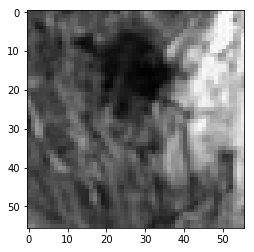

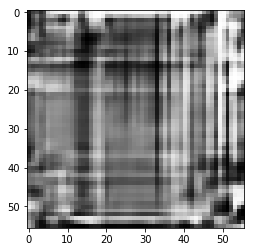

rmse 58.935833126306534
ssim 0.15376899094516908
psnr 12.72321506534471

 next


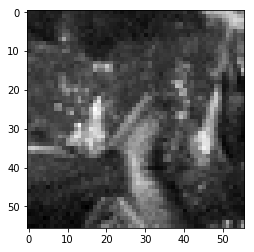

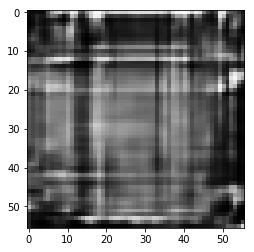

rmse 52.7262557297945
ssim 0.1499623007646324
psnr 13.690264974625446

 next


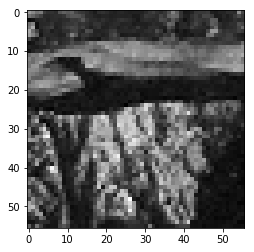

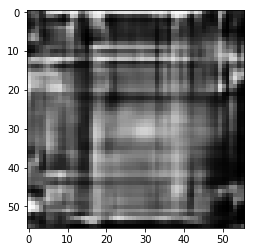

rmse 56.17079369723797
ssim 0.17412621380896393
psnr 13.140592398061926

 next


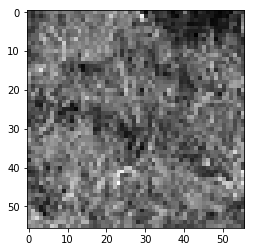

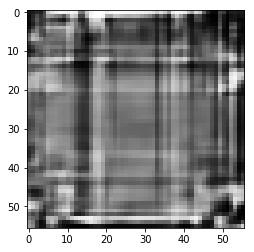

rmse 53.75988386571407
ssim 0.11938372873248936
psnr 13.521637171355252

 next


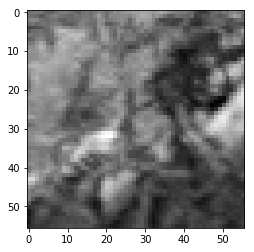

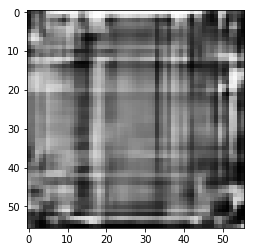

rmse 50.8722972124815
ssim 0.13522083659250078
psnr 14.001176623231649

 next


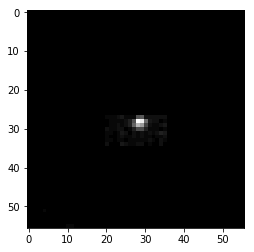

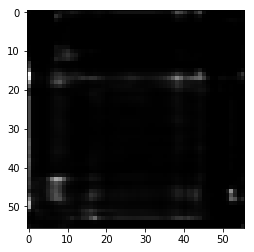

rmse 3.8930554501712322
ssim 0.47711320157760806
psnr 36.324991817224245

 next


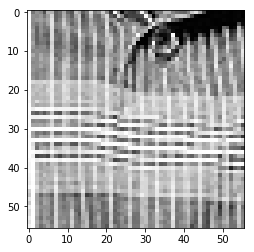

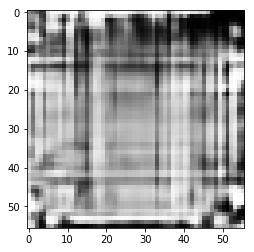

rmse 69.84333783388138
ssim 0.08769285371085798
psnr 11.248303883561263

 next


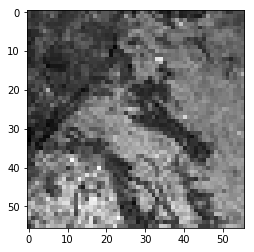

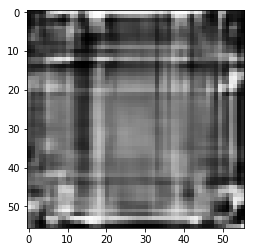

rmse 53.51364187896252
ssim 0.11652627202594738
psnr 13.56151344955046

 next


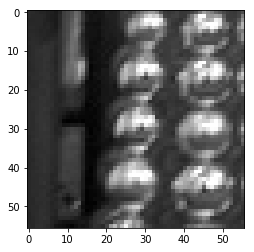

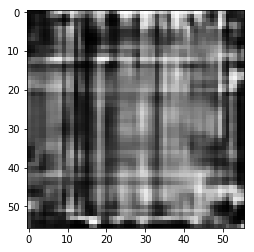

rmse 65.41133165359497
ssim 0.13001110883363004
psnr 11.817743795609832

 next


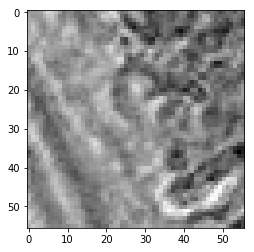

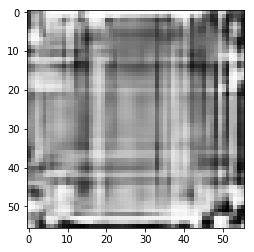

rmse 53.37696321308613
ssim 0.12601631585523276
psnr 13.583726373757901

 next


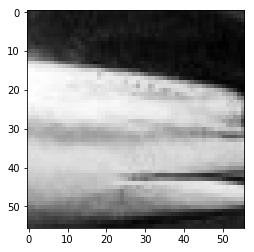

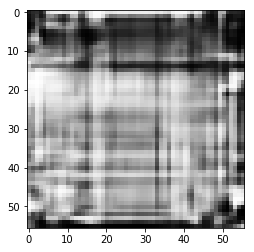

rmse 59.0328723192215
ssim 0.17439663592690643
psnr 12.70892531100433

 next


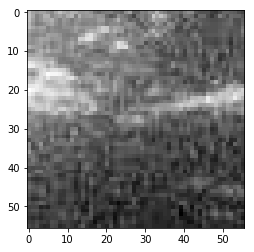

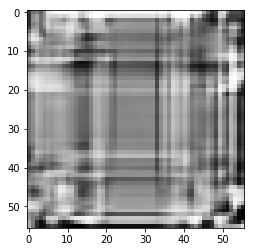

rmse 45.2143894135952
ssim 0.215917223939587
psnr 15.025270200765409

 next


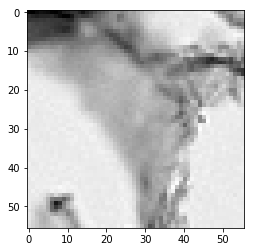

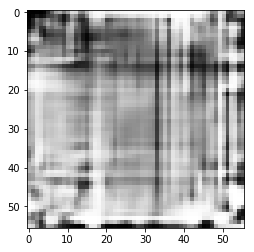

rmse 57.522438168525696
ssim 0.26365415131033026
psnr 12.934057889869914

 next


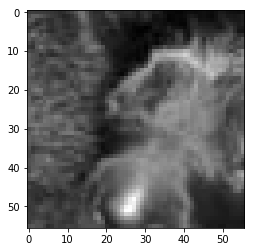

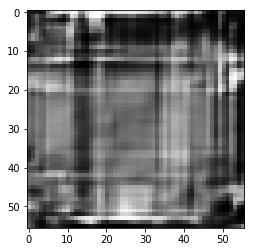

rmse 49.36548426747322
ssim 0.1677957980740207
psnr 14.26233557407756

 next


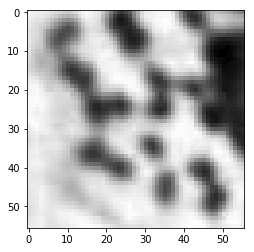

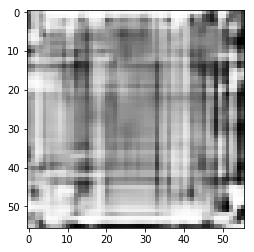

rmse 54.1755435615778
ssim 0.21122866259647735
psnr 13.454738059932147

 next


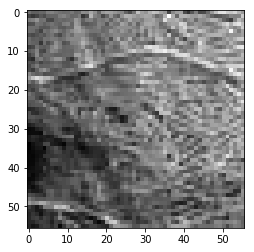

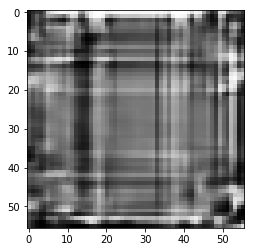

rmse 51.72310955822468
ssim 0.11087663723551343
psnr 13.857111079027508

 next


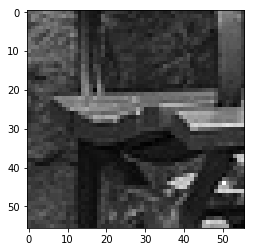

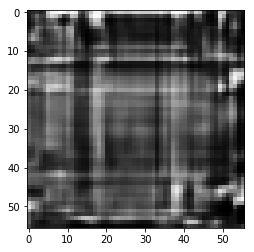

rmse 53.35688889026642
ssim 0.1467653765949535
psnr 13.586993628732602

 next


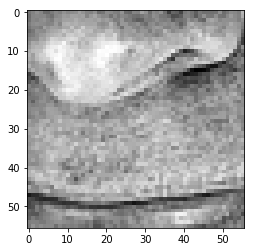

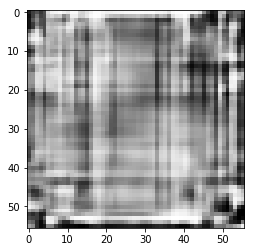

rmse 57.98293545842171
ssim 0.16548126764852972
psnr 12.864799643172473

 next


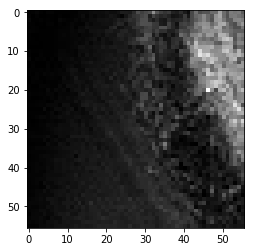

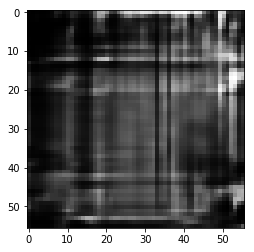

rmse 45.58710381388664
ssim 0.20589208479439813
psnr 14.953963568807968

 next


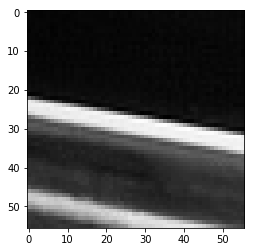

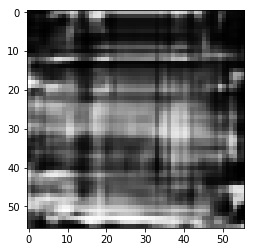

rmse 62.596188113093376
ssim 0.24372581700285606
psnr 12.199845868385735

 next


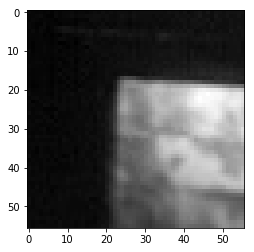

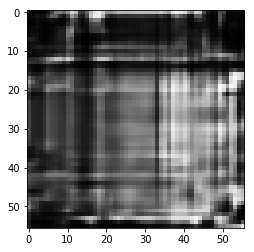

rmse 50.425080209970474
ssim 0.17409852963377406
psnr 14.077871654534906

 next


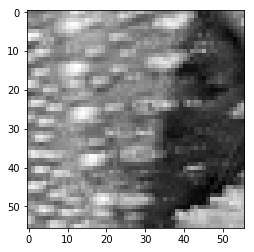

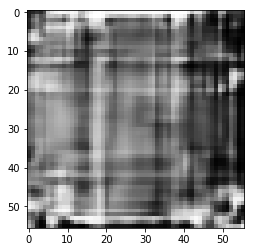

rmse 51.47190883755684
ssim 0.157438654513096
psnr 13.899398121178766

 next


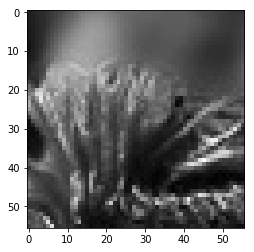

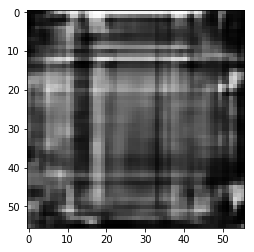

rmse 51.857120767235756
ssim 0.14576154780513753
psnr 13.83463560822478

 next


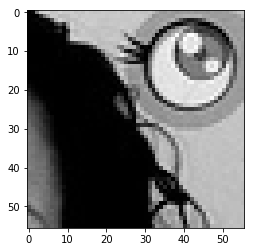

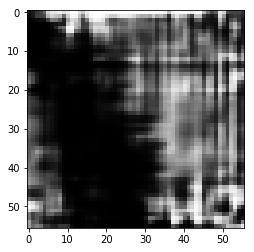

rmse 53.406244441866875
ssim 0.2810681318185108
psnr 13.5789628246266

 next


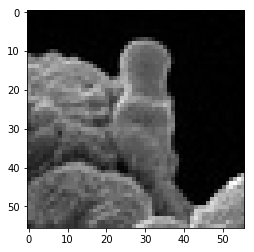

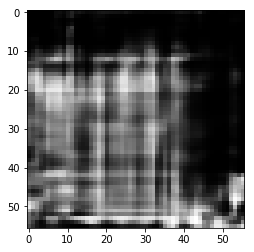

rmse 48.444683477282524
ssim 0.28954900062998223
psnr 14.425881154594881

 next


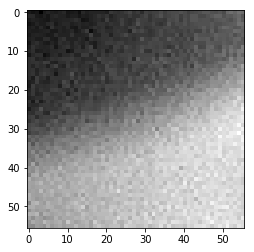

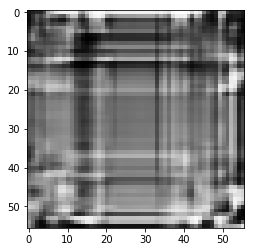

rmse 47.31783114373684
ssim 0.21016443873903687
psnr 14.630307006168914

 next


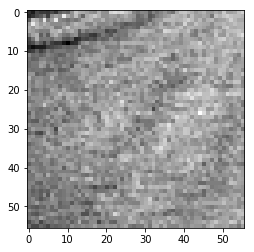

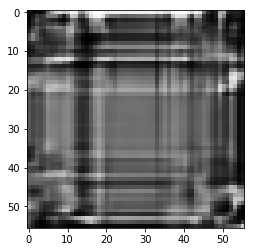

rmse 50.83519220352173
ssim 0.17114535002778603
psnr 14.007514210148654

 next


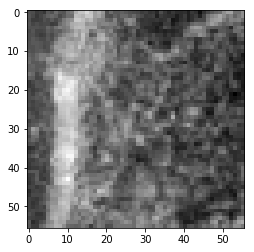

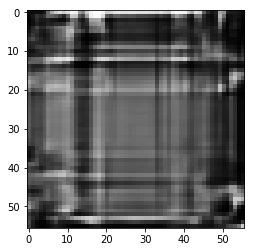

rmse 51.43882401287556
ssim 0.19519892960826685
psnr 13.904982983667203

 next


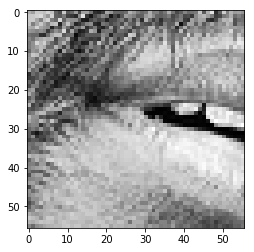

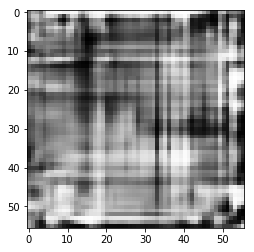

rmse 65.86434334516525
ssim 0.09993471942281085
psnr 11.75779628169509

 next


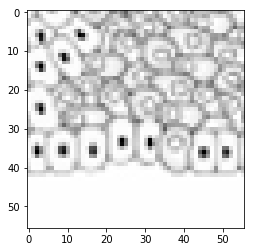

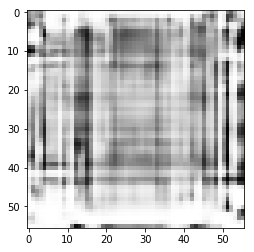

rmse 66.7965017259121
ssim 0.09657248295259298
psnr 11.63572924566994

 next


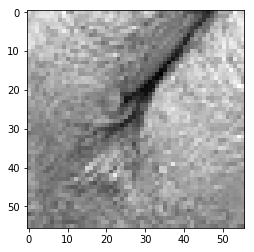

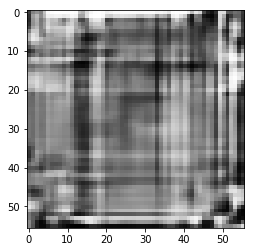

rmse 51.6592425853014
ssim 0.1477535615535939
psnr 13.867842921308098

 next


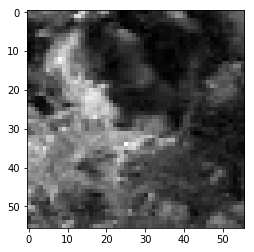

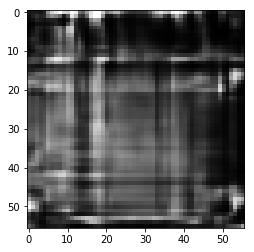

rmse 47.14044526219368
ssim 0.16080794081395242
psnr 14.662930002485997

 next


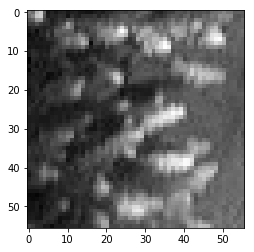

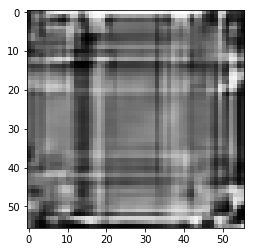

rmse 48.21096181869507
ssim 0.18871130424627292
psnr 14.467887691989258

 next


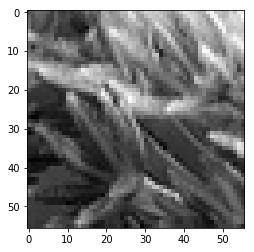

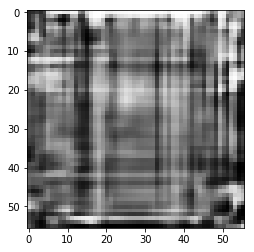

rmse 56.551100090146065
ssim 0.1425145155285703
psnr 13.081982454949873

 next


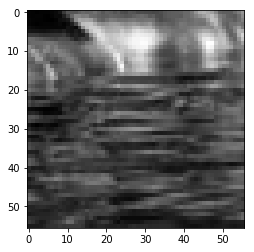

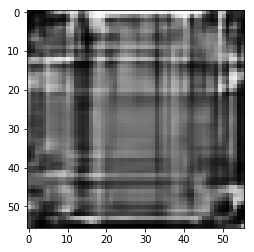

rmse 52.499753683805466
ssim 0.11729323728032734
psnr 13.727658292565694

 next


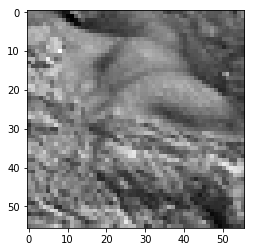

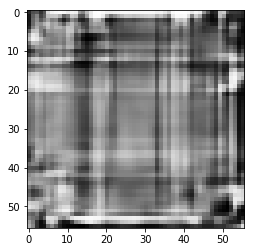

rmse 51.821729466319084
ssim 0.1559076177221919
psnr 13.840565553341978

 next


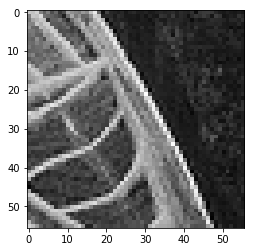

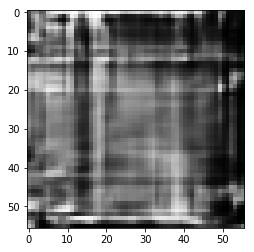

rmse 56.8002413213253
ssim 0.11653104419170122
psnr 13.043799991537139

 next


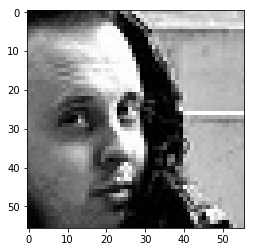

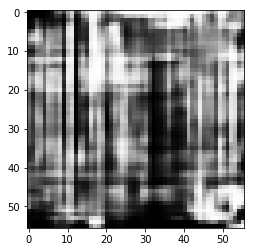

rmse 72.76949241757393
ssim 0.15662391298065945
psnr 10.891816695935258

 next
rmses 0.21284804
ssims 0.16718946933272405
psnrs 13.661733688446883


In [83]:
patch_size = 56

images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
#         img = np.expand_dims(img, axis=-1)
        img_3ch = np.repeat(img, 3, axis=1).reshape((img.shape[0], img.shape[1], 3))
        images.append(img_3ch)
        

rmses = []
ssims = []
psnrs = []

images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 3)
images = images / 255
predictions = oae.predict_on_batch(np.array(images))
print("predictions: ")
for i, im1 in enumerate(images):
    im_1 = im1.reshape((patch_size, patch_size, 3))[:, :, 0]
    plt.imshow(im_1, cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size, 3))
    pred_1 = np.dot(pred_1[...,:3], [0.3333333333333333, 0.3333333333333333, 0.3333333333333333])
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min, multichannel=True)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

predictions: 
0


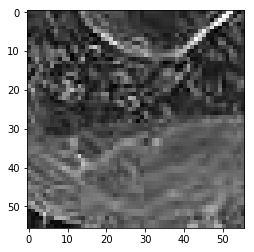

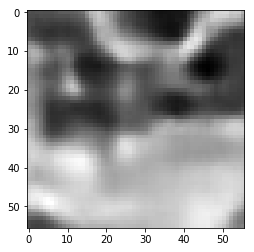

rmse 26.54745787382126
ssim 0.3161849490084749
psnr 19.650344802197406

 next
1


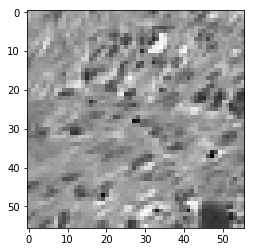

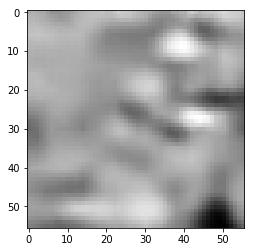

rmse 25.37538606673479
ssim 0.25525167939275745
psnr 20.0425504402028

 next
2


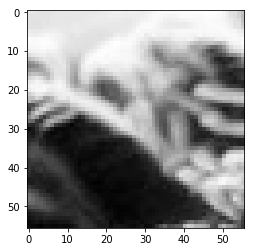

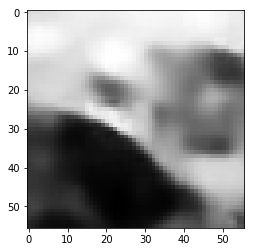

rmse 22.40614179521799
ssim 0.6733003298274162
psnr 21.123462007922136

 next
3


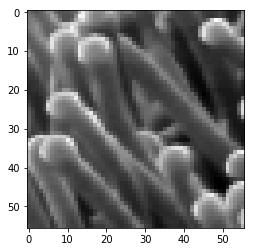

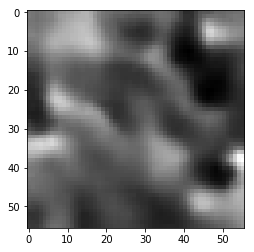

rmse 17.1145723387599
ssim 0.46559895213043784
psnr 23.463482580670323

 next
4


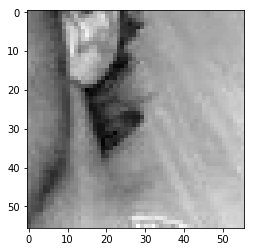

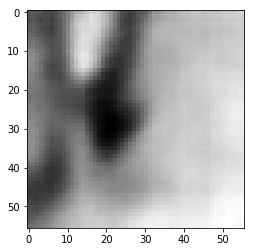

rmse 5.517741870135069
ssim 0.6756538965727688
psnr 33.29557601781336

 next
5


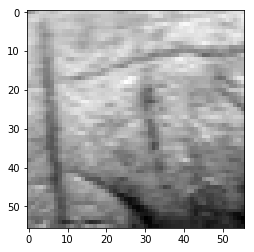

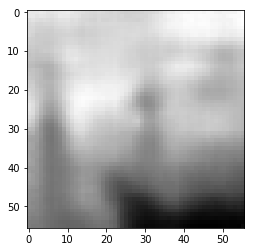

rmse 8.925568107515574
ssim 0.45802906884731404
psnr 29.118086243286953

 next
6


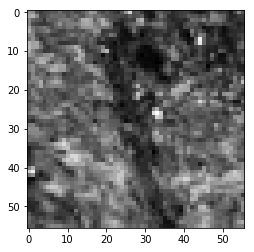

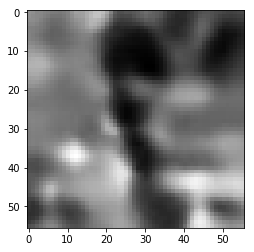

rmse 26.04077596217394
ssim 0.3858253551870286
psnr 19.817725185049902

 next
7


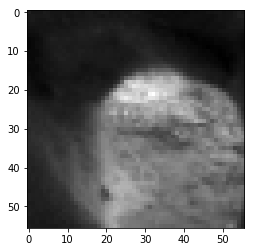

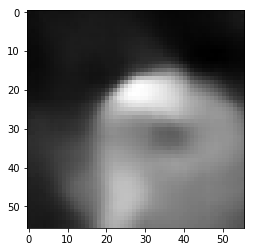

rmse 8.443972449749708
ssim 0.7852336885051711
psnr 29.5998674554769

 next
8


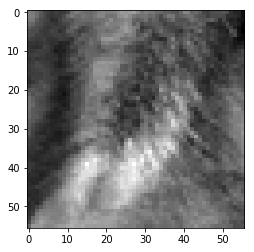

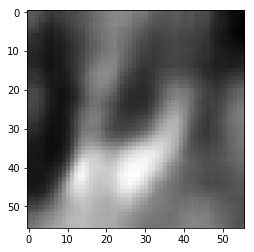

rmse 5.9097630344331264
ssim 0.605741807907417
psnr 32.69940226483176

 next
9


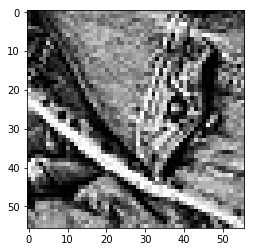

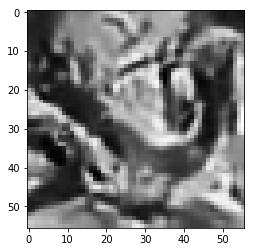

rmse 69.80866089463234
ssim 0.18918169600588186
psnr 11.252617464122029

 next
10


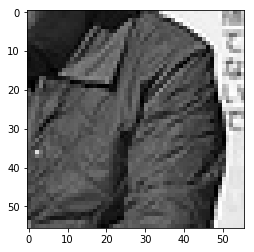

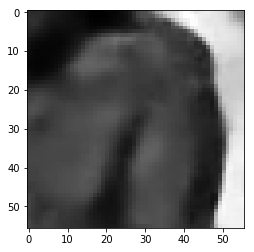

rmse 25.020694099366665
ssim 0.4324473296151689
psnr 20.164816542823147

 next
11


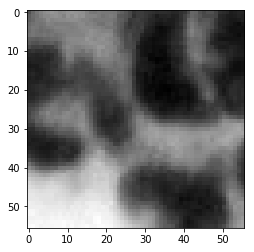

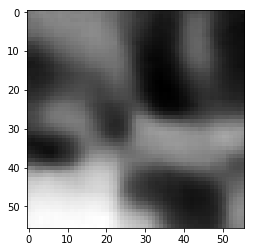

rmse 4.235855005681515
ssim 0.8706081530987926
psnr 35.591981894937845

 next
12


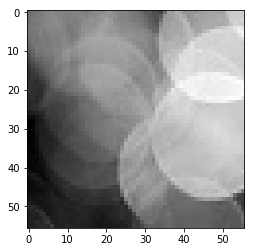

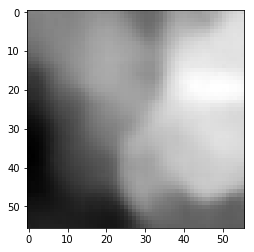

rmse 7.150319991633296
ssim 0.8155817600103501
psnr 31.044294052403117

 next
13


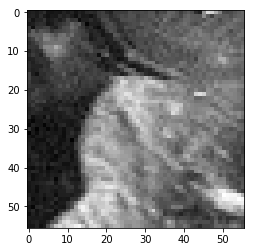

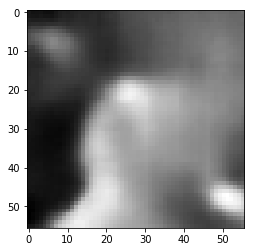

rmse 8.813129290938377
ssim 0.4970126800860585
psnr 29.228200781003025

 next
14


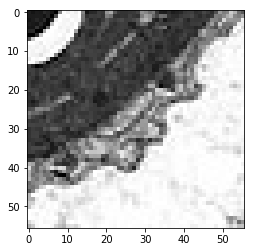

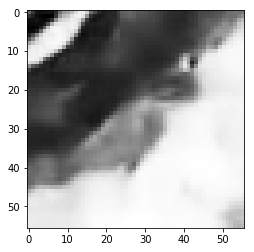

rmse 28.956395611166954
ssim 0.490123475058172
psnr 18.89591357944928

 next
15


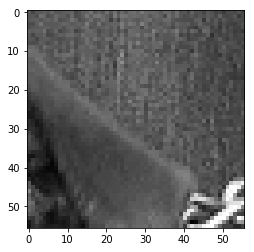

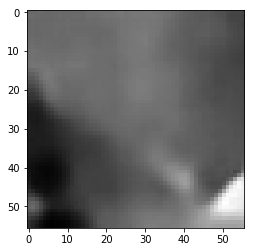

rmse 18.30391801893711
ssim 0.4694684785968757
psnr 22.879922369395768

 next
16


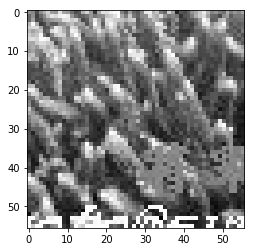

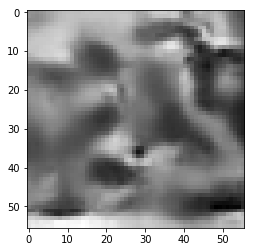

rmse 41.547935754060745
ssim 0.3025408072316526
psnr 15.759814580760612

 next
17


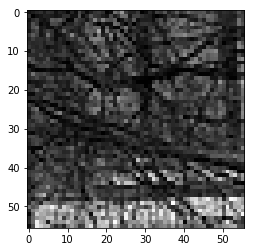

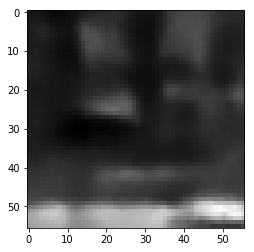

rmse 34.71714869141579
ssim 0.22001875650694355
psnr 17.31992261870168

 next
18


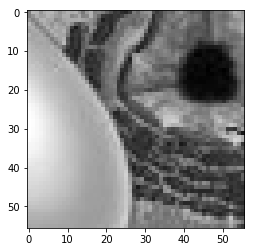

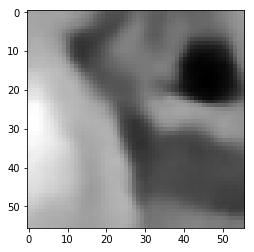

rmse 18.88406328856945
ssim 0.5845589588192657
psnr 22.608894663316384

 next
19


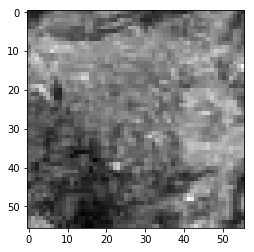

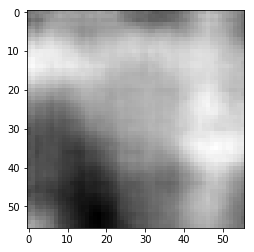

rmse 5.806637043133378
ssim 0.2877675291666152
psnr 32.852310002050004

 next
20


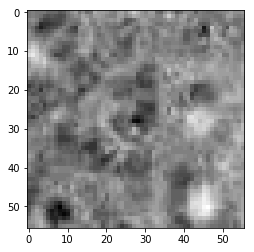

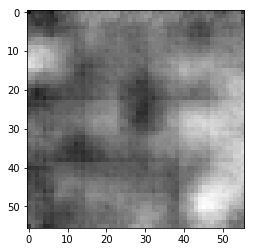

rmse 3.3199034677818418
ssim 0.31075067561353265
psnr 37.708294488930704

 next
21


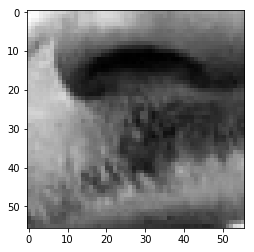

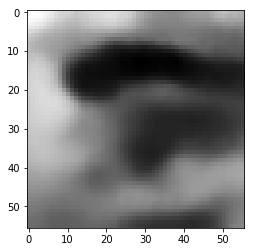

rmse 9.474831484258175
ssim 0.7519692901343431
psnr 28.599373718425948

 next
22


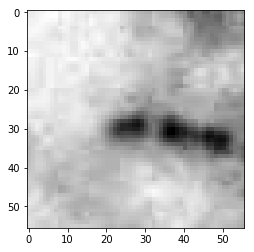

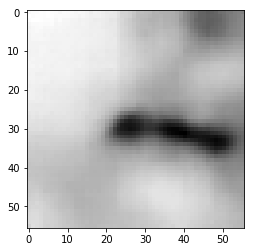

rmse 4.349567703902721
ssim 0.761734446890853
psnr 35.361881702409605

 next
23


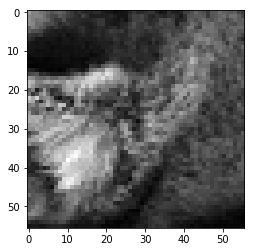

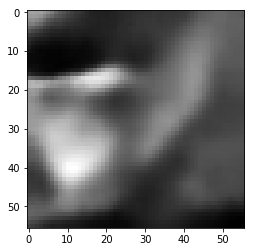

rmse 12.825068961828947
ssim 0.566373846160729
psnr 25.969609427877266

 next
24


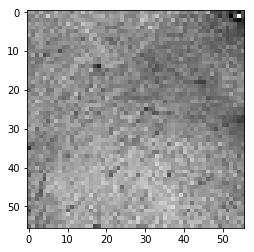

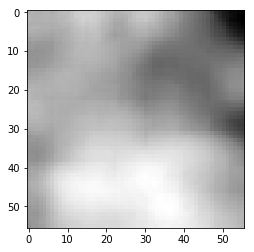

rmse 15.36264119669795
ssim 0.27361689280339285
psnr 24.401485859166456

 next
25


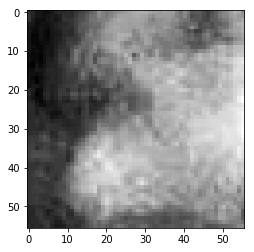

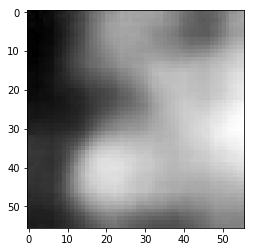

rmse 3.7331996904686093
ssim 0.6781895858143664
psnr 36.689179185727085

 next
26


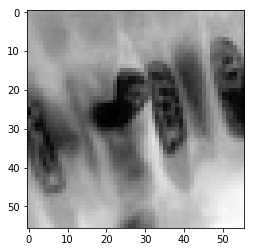

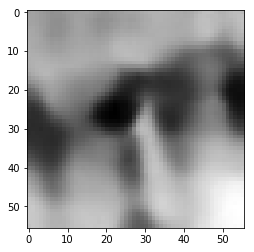

rmse 13.003866467624903
ssim 0.7532886587937323
psnr 25.849353584248092

 next
27


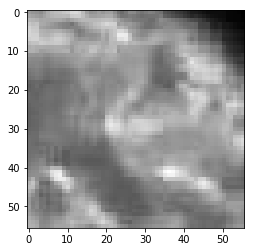

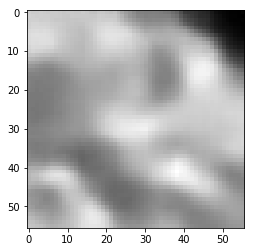

rmse 7.963263094425201
ssim 0.7282237574249084
psnr 30.108982320476837

 next
28


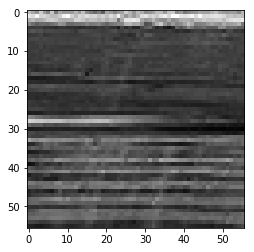

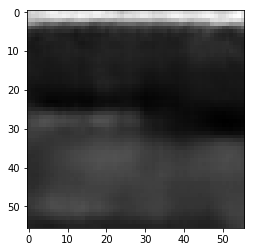

rmse 20.316348932683468
ssim 0.287759906141135
psnr 21.973890344372833

 next
29


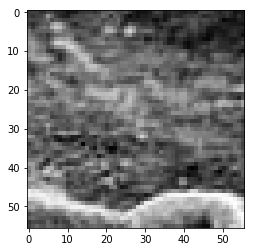

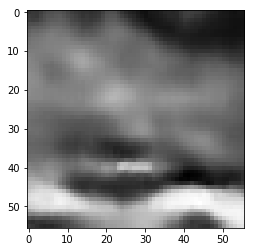

rmse 17.993858456611633
ssim 0.4101874982353473
psnr 23.02831761053981

 next
30


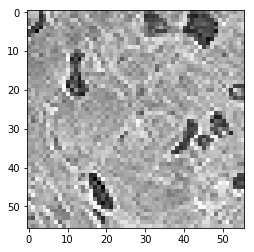

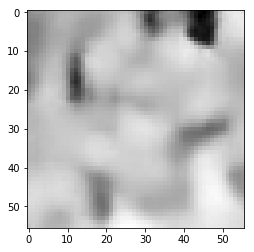

rmse 32.17313960194588
ssim 0.2090300158193646
psnr 17.980934740487736

 next
31


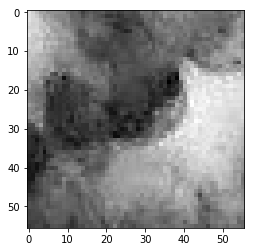

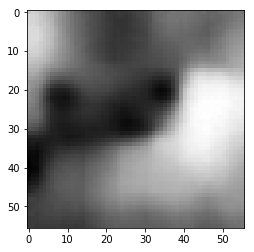

rmse 6.190510494634509
ssim 0.6501838599940962
psnr 32.296274325009506

 next
32


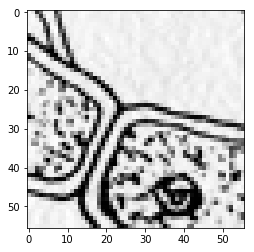

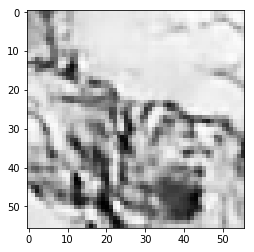

rmse 69.59410920739174
ssim 0.24239458206625694
psnr 11.27935400238626

 next
33


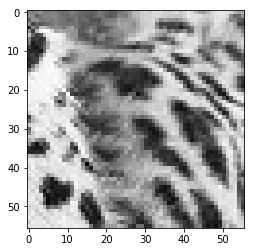

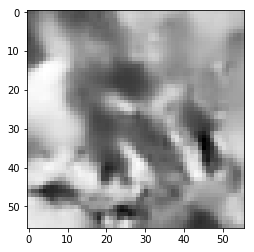

rmse 41.43863841891289
ssim 0.40409486180415644
psnr 15.78269406817666

 next
34


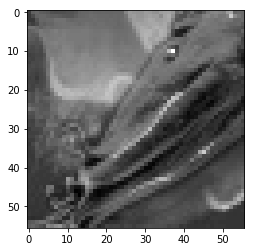

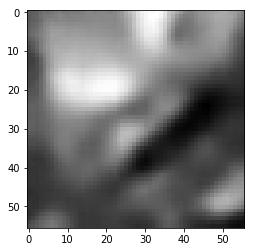

rmse 14.973753914237022
ssim 0.48469404319894127
psnr 24.624189779689427

 next
35


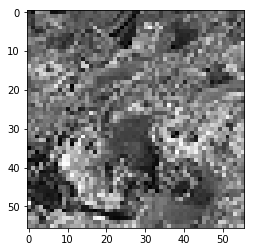

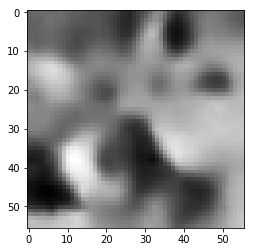

rmse 38.79928484559059
ssim 0.24046215265958845
psnr 16.354329194978515

 next
36


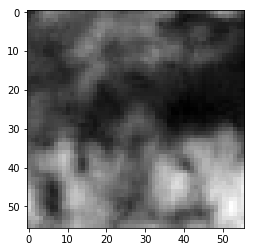

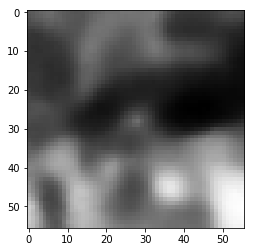

rmse 9.30461011826992
ssim 0.7619041704586498
psnr 28.75684000782574

 next
37


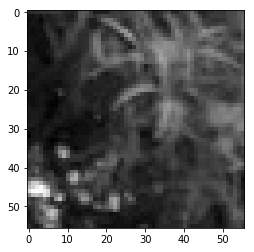

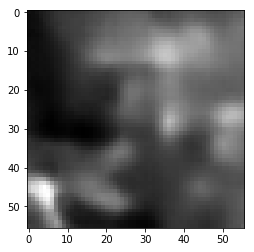

rmse 12.228522822260857
ssim 0.5014487583714881
psnr 26.383323640295227

 next
38


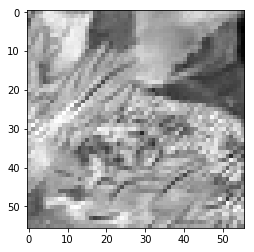

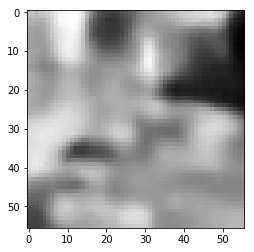

rmse 25.854141376912594
ssim 0.3838235230034842
psnr 19.88020122249165

 next
39


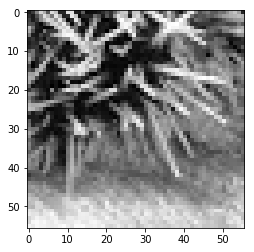

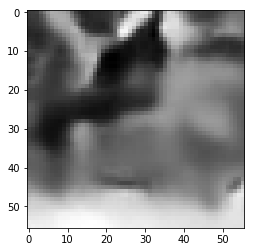

rmse 42.07226201891899
ssim 0.3547146217371881
psnr 15.65088635815374

 next
40


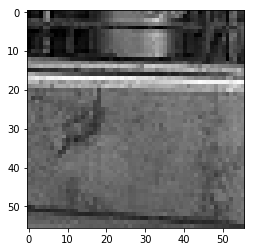

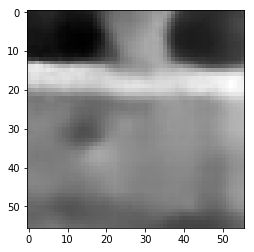

rmse 23.864237554371357
ssim 0.47313739927192416
psnr 20.57585233827419

 next
41


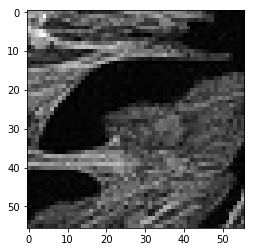

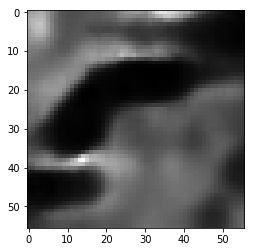

rmse 14.550145994871855
ssim 0.5092223471676448
psnr 24.873456588358614

 next
42


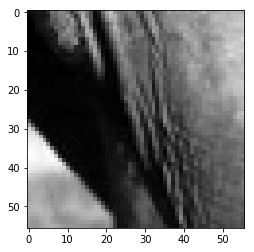

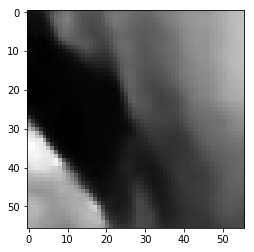

rmse 13.468451388180256
ssim 0.6219582800407049
psnr 25.54445034638239

 next
43


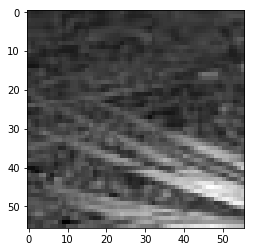

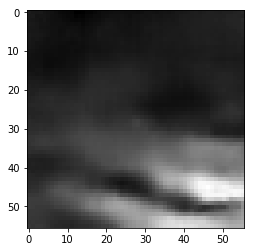

rmse 14.239151682704687
ssim 0.4175941485645819
psnr 25.06112128122217

 next
44


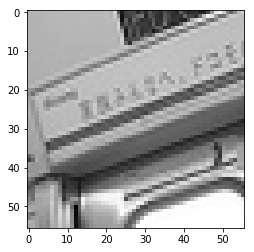

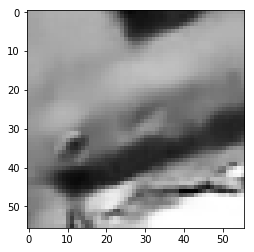

rmse 32.49405898153782
ssim 0.4627050399055686
psnr 17.894724319803363

 next
45


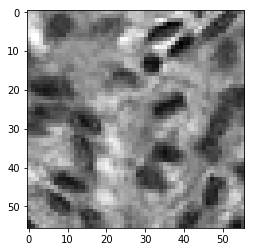

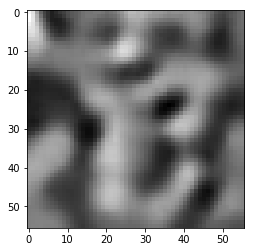

rmse 21.358448714017868
ssim 0.5632512741269283
psnr 21.539409483690676

 next
46


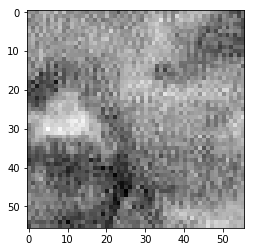

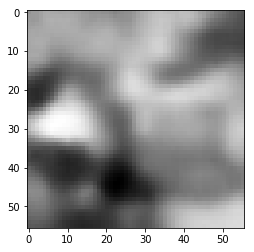

rmse 19.15556062012911
ssim 0.46588253107567346
psnr 22.48490627121324

 next
47


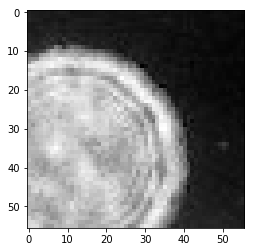

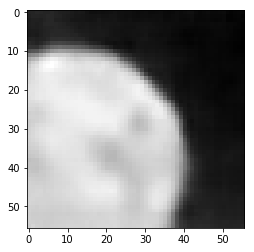

rmse 7.741330303251743
ssim 0.6322459007126316
psnr 30.354491646396692

 next
48


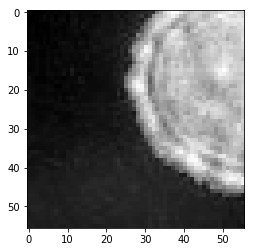

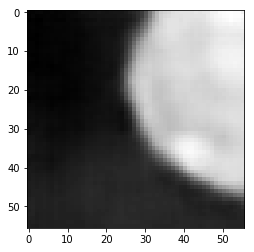

rmse 7.041941257193685
ssim 0.6928934946288805
psnr 31.176955650068052

 next
49


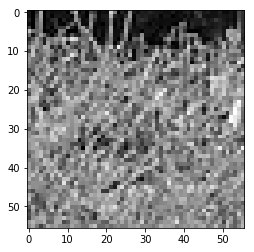

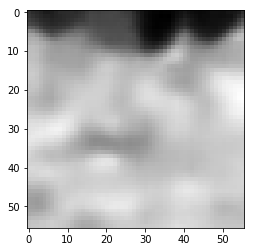

rmse 37.824306562542915
ssim 0.15259588221330955
psnr 16.575384112750402

 next
50


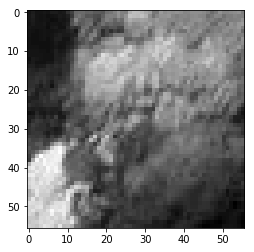

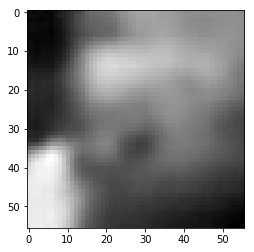

rmse 7.422492736950517
ssim 0.5343703042093839
psnr 30.719807982620537

 next
51


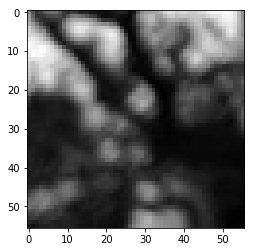

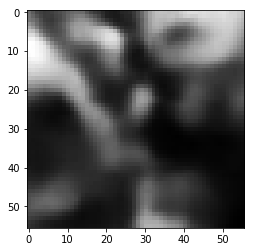

rmse 14.122675582766533
ssim 0.7545339456587267
psnr 25.132463950917053

 next
52


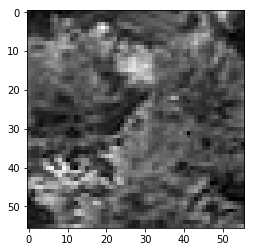

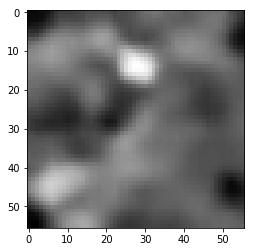

rmse 17.484571784734726
ssim 0.3809637329440622
psnr 23.277703599598908

 next
53


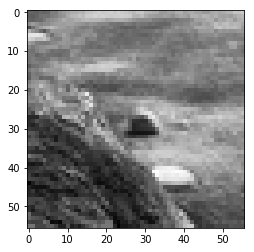

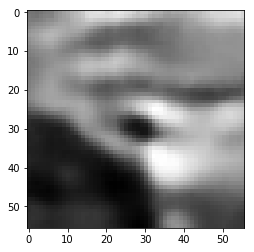

rmse 16.048267856240273
ssim 0.5555742508103311
psnr 24.0222403206803

 next
54


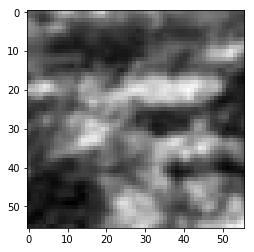

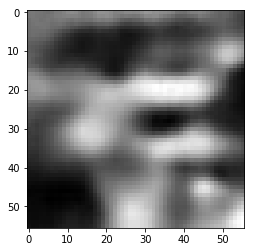

rmse 8.862089663743973
ssim 0.7280198406298791
psnr 29.180080813313303

 next
55


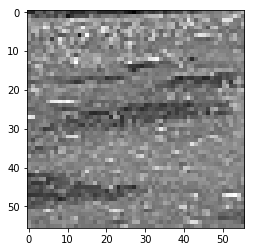

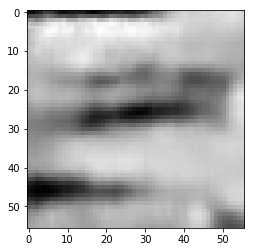

rmse 24.60405595600605
ssim 0.2593553244852461
psnr 20.310669487656096

 next
56


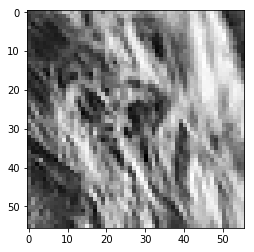

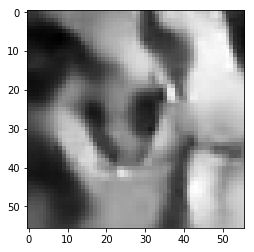

rmse 34.3108706921339
ssim 0.424373463945756
psnr 17.42216882669219

 next
57


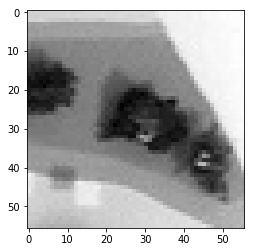

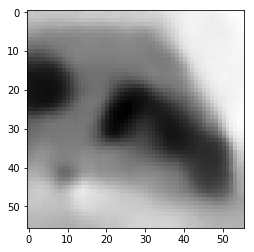

rmse 9.477953016757965
ssim 0.7938455070002017
psnr 28.59651257820262

 next
58


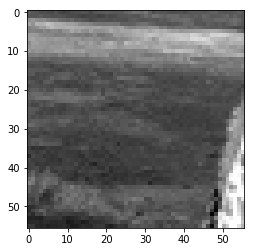

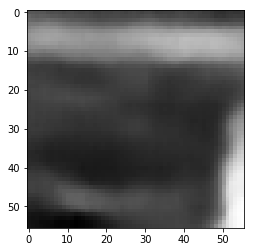

rmse 14.21343656256795
ssim 0.6321933216344597
psnr 25.076821698662407

 next
59


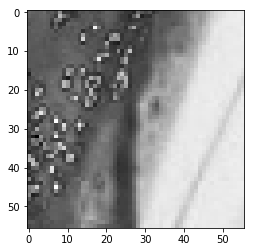

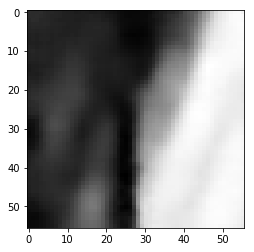

rmse 17.936527132987976
ssim 0.582347955332338
psnr 23.056036432046657

 next
60


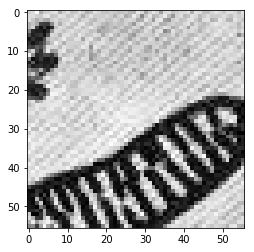

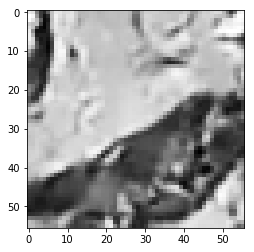

rmse 53.954619616270065
ssim 0.24411130355350988
psnr 13.490230907090817

 next
61


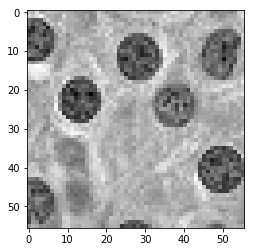

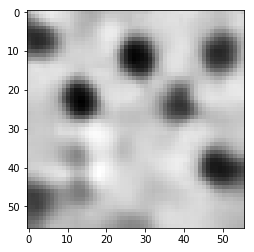

rmse 23.983458057045937
ssim 0.48489533690498154
psnr 20.532567567352213

 next
62


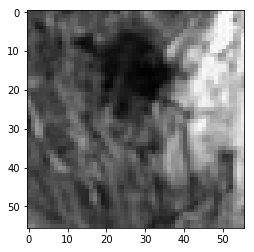

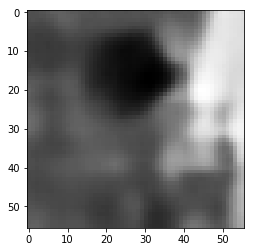

rmse 16.363787725567818
ssim 0.5112352433455739
psnr 23.853126866574886

 next
63


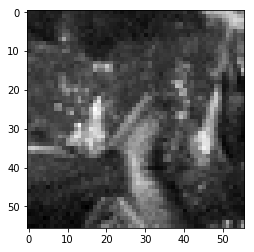

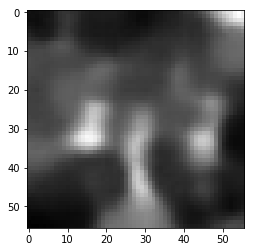

rmse 13.84438706561923
ssim 0.5312457956399267
psnr 25.3053289500763

 next
64


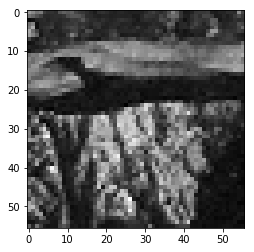

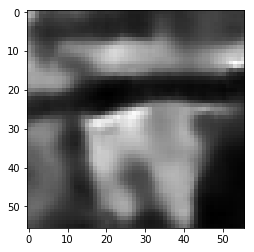

rmse 30.205973759293556
ssim 0.4692838984333359
psnr 18.52894679315237

 next
65


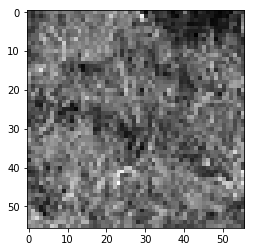

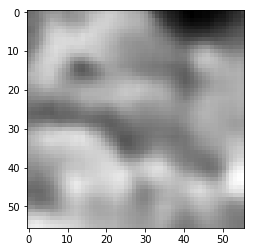

rmse 21.6049262881279
ssim 0.25402873580234375
psnr 21.43974783027605

 next
66


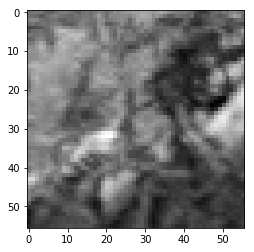

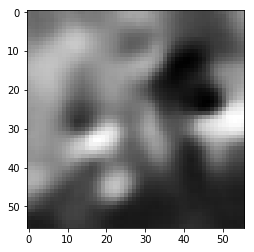

rmse 15.121463388204575
ssim 0.5391398460190431
psnr 24.53892716279771

 next
67


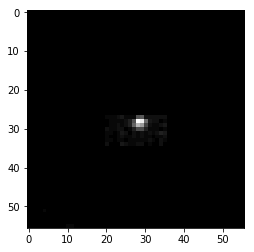

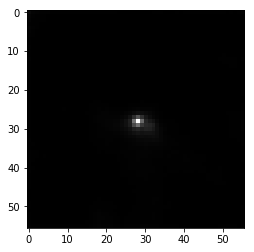

rmse 0.6206226570066065
ssim 0.9011725798907104
psnr 52.274251083060896

 next
68


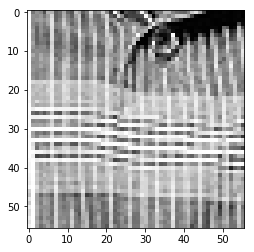

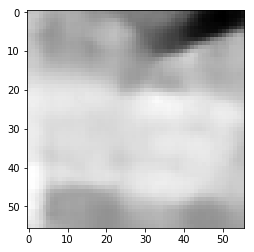

rmse 43.99510703980923
ssim 0.15013741927216398
psnr 15.262716035215744

 next
69


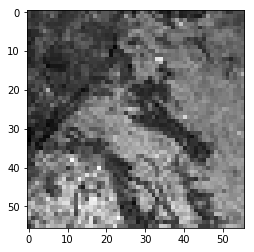

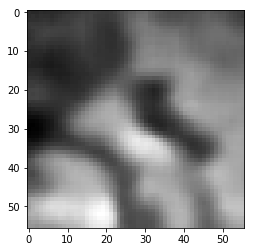

rmse 16.598565727472305
ssim 0.37300295860260424
psnr 23.729392358185976

 next
70


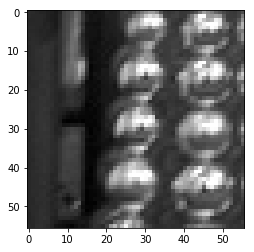

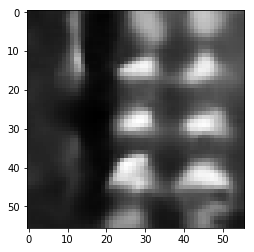

rmse 27.02316004782915
ssim 0.6942555942327934
psnr 19.496080940651737

 next
71


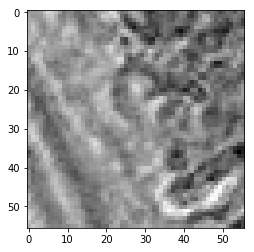

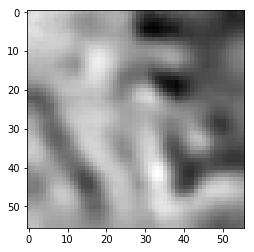

rmse 18.9584518969059
ssim 0.3476065210807169
psnr 22.57474618922992

 next
72


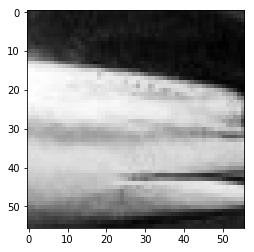

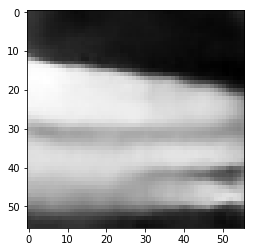

rmse 12.009784709662199
ssim 0.8049603554724057
psnr 26.540099164607255

 next
73


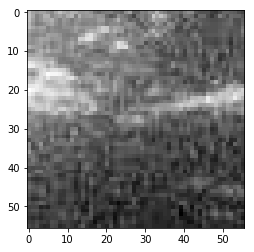

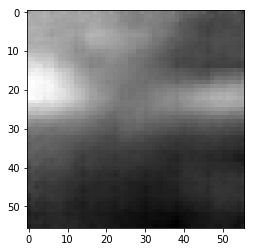

rmse 4.107247581705451
ssim 0.33006741543991874
psnr 35.85978595711996

 next
74


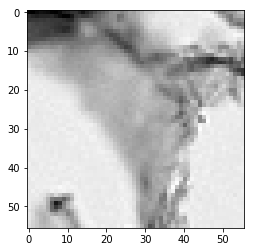

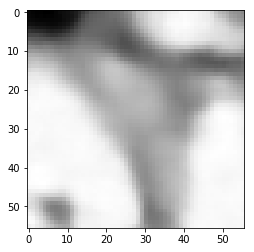

rmse 14.178038612008095
ssim 0.7431018681217658
psnr 25.098480513457993

 next
75


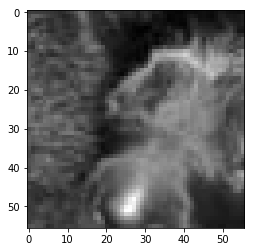

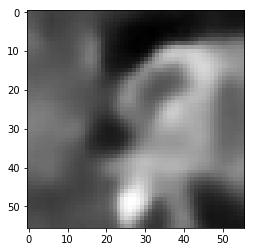

rmse 13.552112448960543
ssim 0.6402048059414396
psnr 25.490663677281105

 next
76


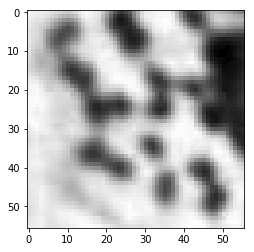

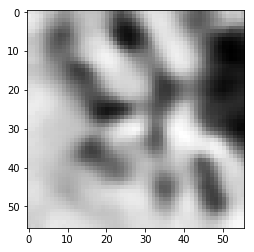

rmse 10.422983206808567
ssim 0.83512345166998
psnr 27.770962847778627

 next
77


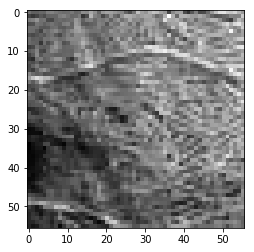

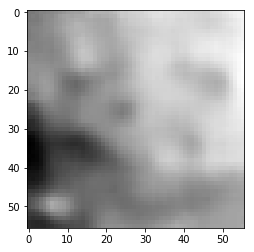

rmse 17.69630592316389
ssim 0.23785782450298693
psnr 23.173151258418542

 next
78


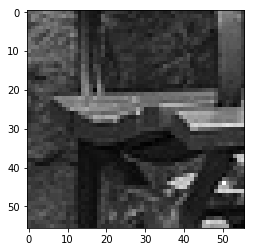

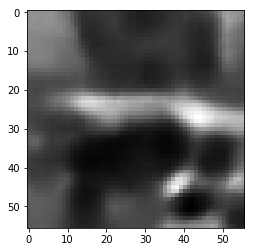

rmse 17.971333265304565
ssim 0.48193999012308614
psnr 23.039197649932575

 next
79


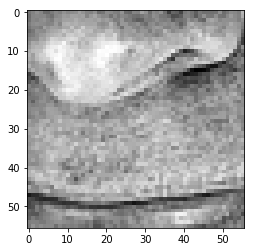

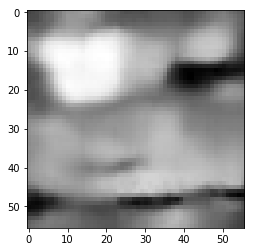

rmse 21.87813352793455
ssim 0.5101007579876335
psnr 21.33059823634214

 next
80


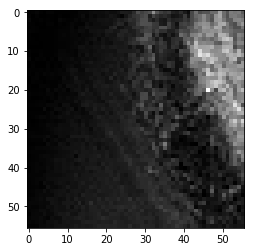

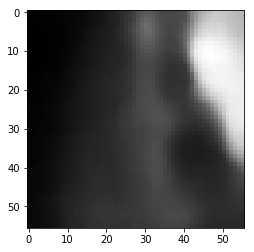

rmse 11.542288195341825
ssim 0.6187132778205812
psnr 26.884965331589605

 next
81


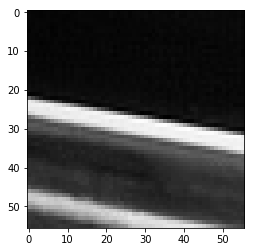

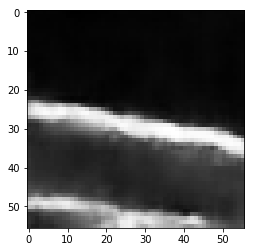

rmse 16.88999678939581
ssim 0.8649681931975529
psnr 23.578212268351667

 next
82


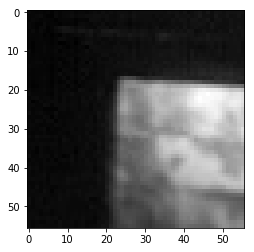

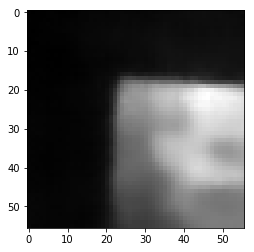

rmse 5.9801276586949825
ssim 0.8531679448008083
psnr 32.596594507924145

 next
83


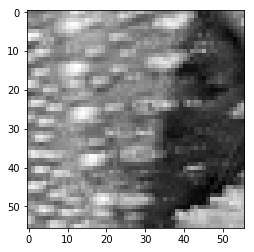

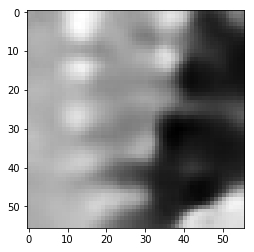

rmse 21.30126178264618
ssim 0.3976302352414989
psnr 21.562697015012056

 next
84


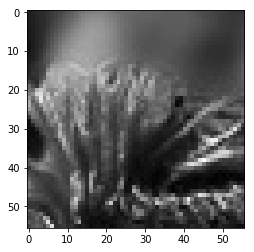

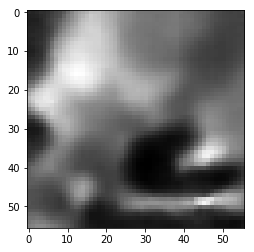

rmse 15.740225985646248
ssim 0.5735507521391423
psnr 24.190584342227574

 next
85


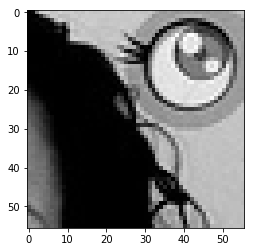

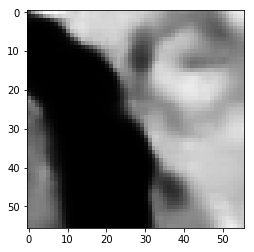

rmse 23.865179903805256
ssim 0.6610379545606129
psnr 20.575509357210503

 next
86


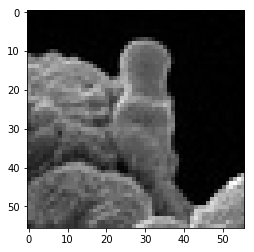

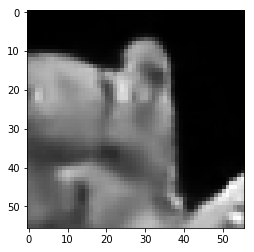

rmse 21.457032524049282
ssim 0.6602045159338572
psnr 21.49941041874883

 next
87


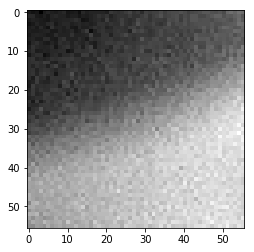

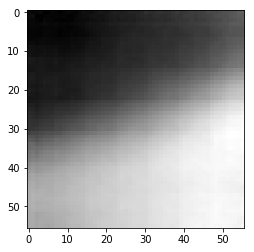

rmse 3.1399776600301266
ssim 0.6173815392956076
psnr 38.19227244441325

 next
88


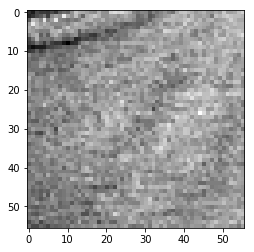

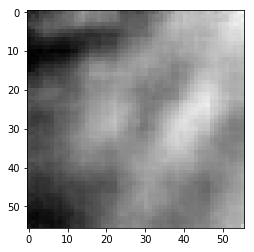

rmse 6.641210010275245
ssim 0.21376280135152537
psnr 31.685859331829974

 next
89


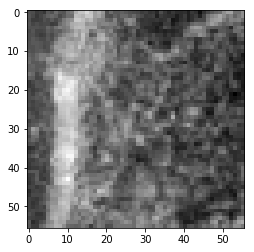

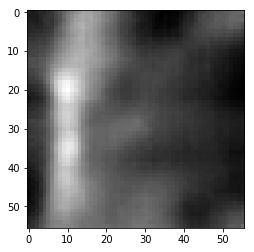

rmse 5.4741050116717815
ssim 0.3838345538787643
psnr 33.36454112113873

 next
90


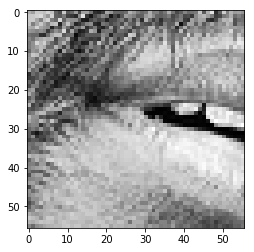

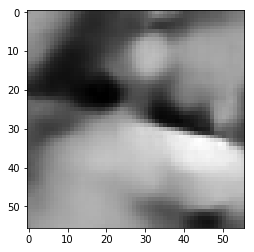

rmse 30.517412647604942
ssim 0.4535907924784415
psnr 18.439849406050193

 next
91


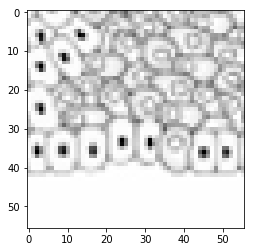

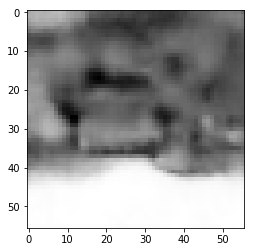

rmse 33.56658563017845
ssim 0.2926654197669159
psnr 17.61266026145907

 next
92


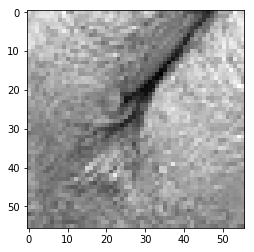

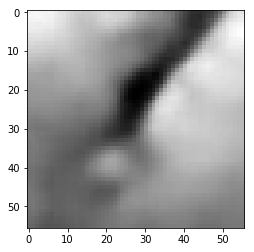

rmse 15.561736263334751
ssim 0.4015303424062392
psnr 24.289642594271236

 next
93


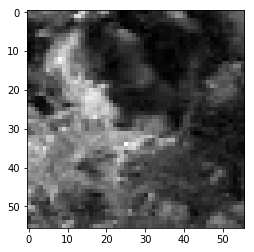

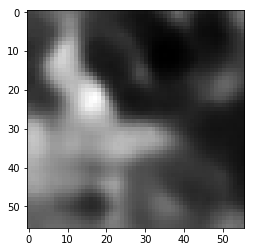

rmse 12.298277579247952
ssim 0.5546954917591914
psnr 26.333917786734172

 next
94


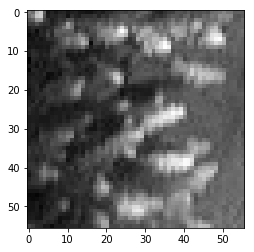

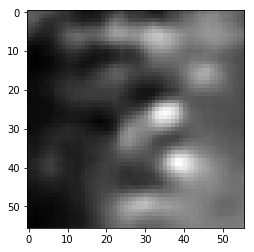

rmse 9.250155240297318
ssim 0.4810499211645054
psnr 28.807823182138982

 next
95


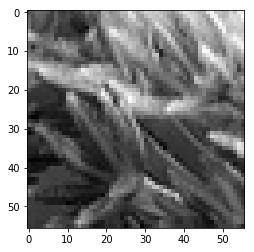

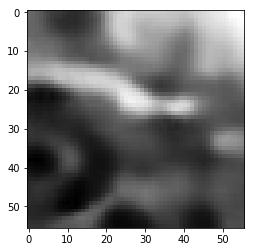

rmse 23.89804434031248
ssim 0.4423008376456078
psnr 20.56355635704833

 next
96


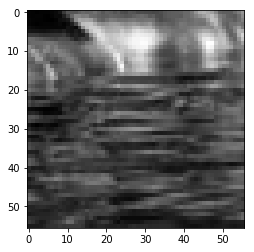

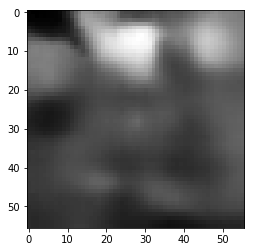

rmse 13.774498365819454
ssim 0.4368734559310251
psnr 25.349287771703068

 next
97


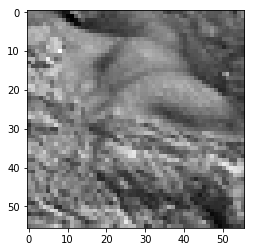

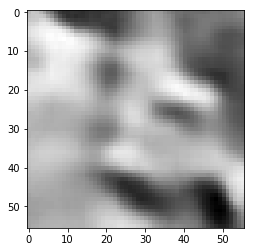

rmse 17.768659740686417
ssim 0.4316097099547522
psnr 23.137710189518288

 next
98


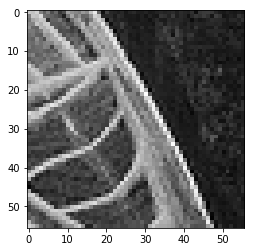

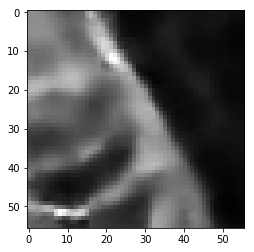

rmse 30.44520702213049
ssim 0.3976165150638788
psnr 18.46042497812351

 next
99


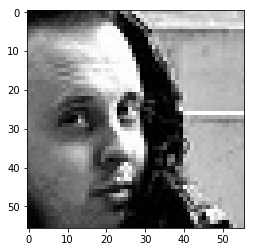

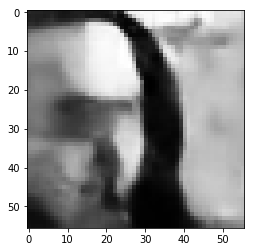

rmse 32.459952011704445
ssim 0.6052415884916558
psnr 17.90384613995147

 next
rmses 0.074995324
ssims 0.5059693598797744
psnrs 24.523222056506807


In [155]:
patch_size = 56

images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
        img = np.expand_dims(img, axis=-1)        
        images.append(img)
        

rmses = []
ssims = []
psnrs = []
        
images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 1)
images = images / 255
predictions = decoder.predict_on_batch(encoder.predict_on_batch(np.array(images)))
print("predictions: ")
for i, im1 in enumerate(images):
    
    print(i)
    im_1 = im1.reshape((patch_size, patch_size))
    plt.imshow(im_1, cmap='gray')
    plt.show()
    
    pred_1 = predictions[i].reshape((patch_size, patch_size))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

In [156]:
with tf.Session() as sess:  #print(product.eval())
    psnrs_tf = tf.image.psnr(images, predictions, max_val=1).eval()

In [158]:
np.mean(psnrs_tf)

24.523222

In [87]:
images.shape

(100, 56, 56, 1)

In [88]:
predictions.shape

(100, 56, 56, 1)

In [116]:
autoencoder_alex = load_model('/home/niaki/Code/sundry_segments/weights/autoencoderalex_20200801_56x56x1.h5')

predictions alex: 
0


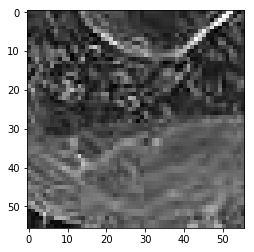

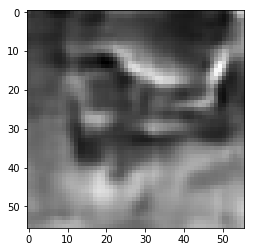

rmse 37.34975762665272
ssim 0.0975727895413525
psnr 16.68504785071036

 next
1


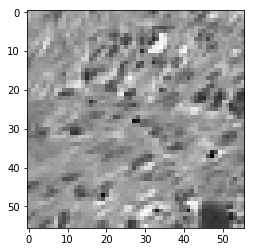

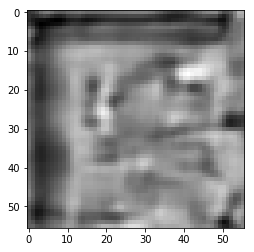

rmse 37.699870839715004
ssim 0.09262218394055852
psnr 16.604006362491702

 next
2


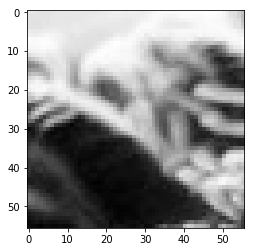

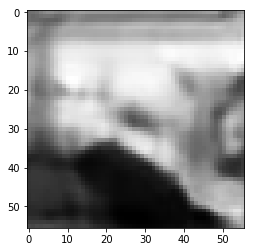

rmse 63.40466693043709
ssim 0.14873350144210207
psnr 12.088379098507595

 next
3


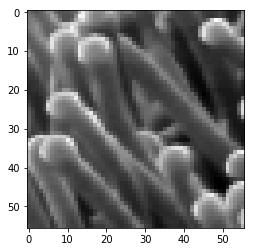

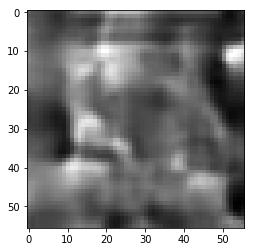

rmse 32.42987282574177
ssim 0.08110721114655425
psnr 17.911898697006194

 next
4


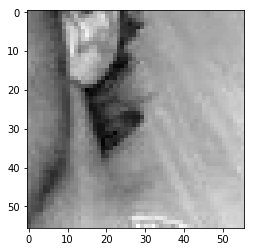

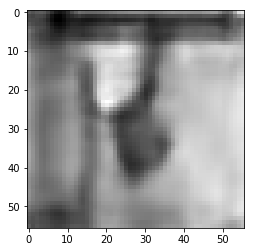

rmse 21.826537996530533
ssim 0.13193061897913252
psnr 21.3511064925151

 next
5


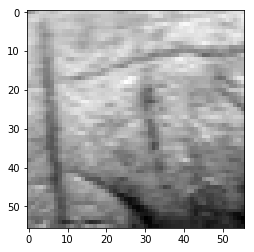

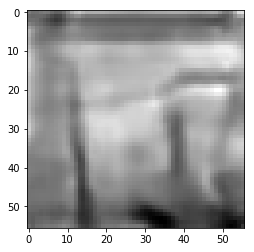

rmse 20.422355644404888
ssim 0.09211062979286522
psnr 21.928686910113836

 next
6


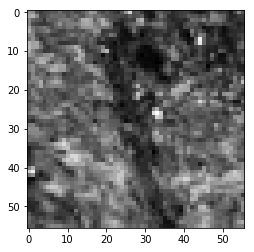

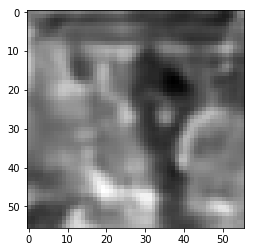

rmse 43.232883140444756
ssim 0.003335774830286857
psnr 15.414519628871988

 next
7


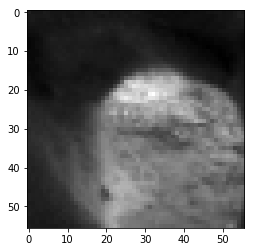

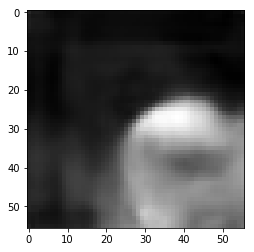

rmse 40.13818100094795
ssim 0.3012506898403567
psnr 16.059649867548607

 next
8


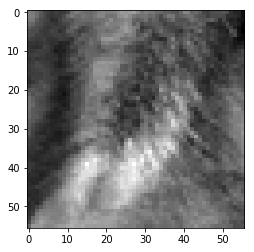

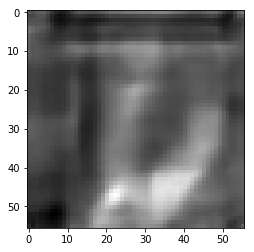

rmse 20.371003299951553
ssim -0.07586084191082682
psnr 21.95055522612071

 next
9


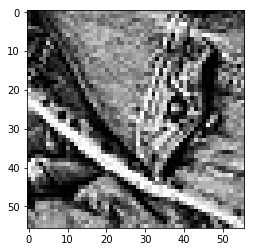

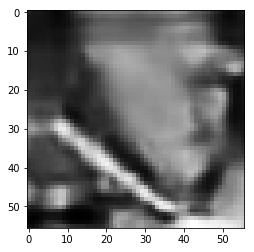

rmse 80.80365970730782
ssim 0.0770255541346604
psnr 9.982182988559709

 next
10


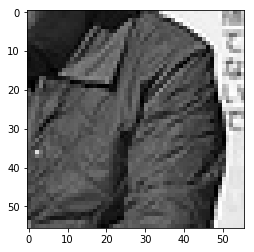

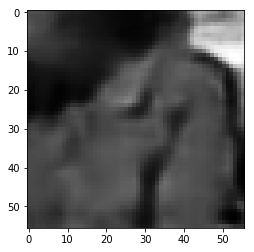

rmse 65.8793905377388
ssim 0.12238042398274622
psnr 11.755812153102818

 next
11


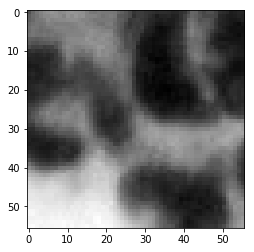

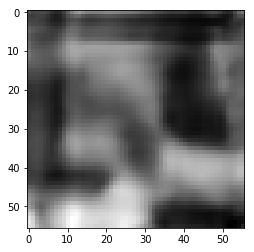

rmse 26.346925534307957
ssim 0.0867438200609319
psnr 19.71620472919662

 next
12


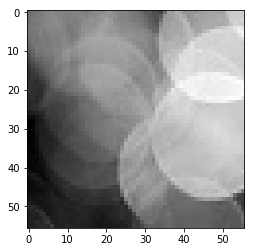

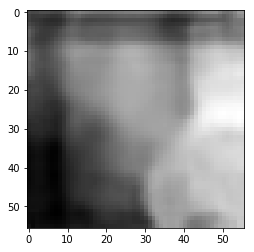

rmse 32.71823175251484
ssim 0.39776037708229045
psnr 17.835007122432163

 next
13


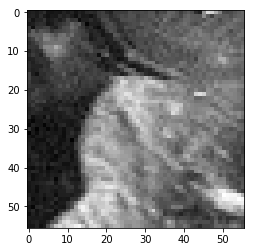

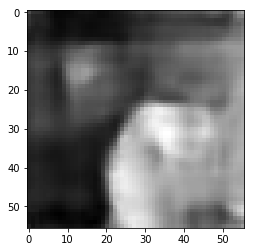

rmse 27.450507916510105
ssim 0.10640150867157258
psnr 19.35979591652931

 next
14


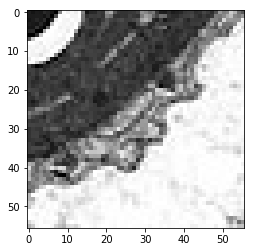

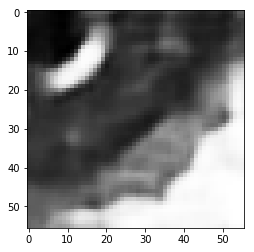

rmse 89.5845477283001
ssim 0.07436857364080997
psnr 9.08614149915729

 next
15


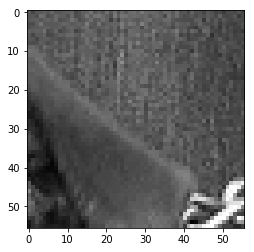

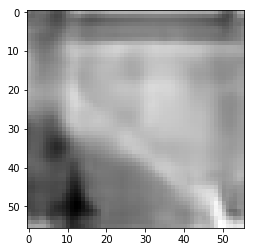

rmse 28.590332753956318
ssim 0.3133919646779828
psnr 19.006419408573482

 next
16


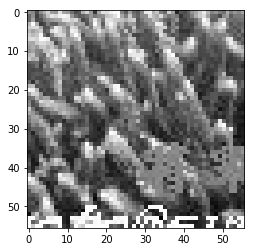

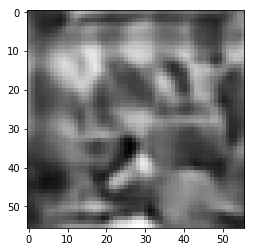

rmse 60.30250959098339
ssim -0.017759397622935994
psnr 12.524095880358148

 next
17


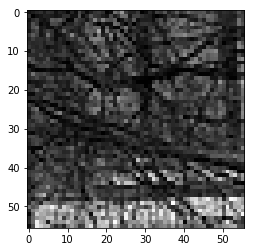

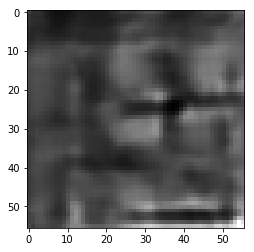

rmse 48.36061678826809
ssim 0.06215224928593491
psnr 14.440966984907252

 next
18


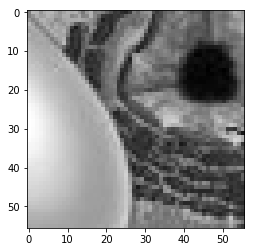

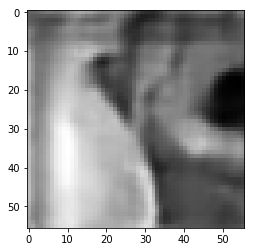

rmse 47.56653919816017
ssim 0.05821428322865154
psnr 14.584772517139537

 next
19


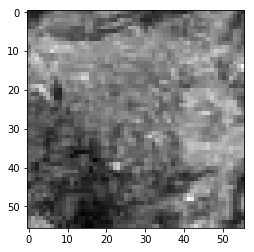

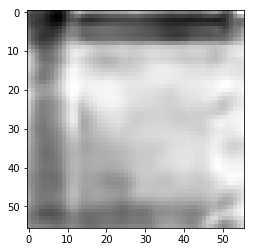

rmse 17.772877514362335
ssim 0.19878782269885917
psnr 23.13564865140436

 next
20


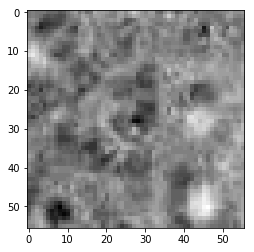

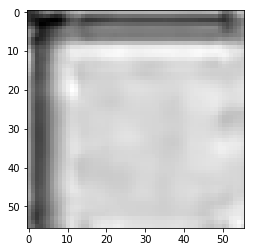

rmse 25.618924498558044
ssim 0.2618221696869331
psnr 19.95958573293796

 next
21


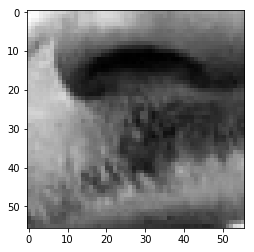

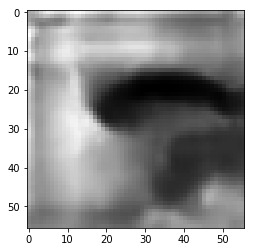

rmse 40.977111384272575
ssim -0.02764162939307949
psnr 15.879976803650372

 next
22


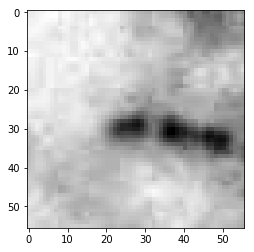

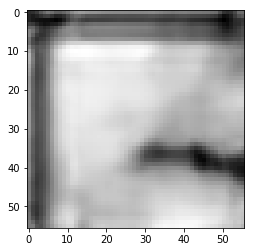

rmse 35.07716417312622
ssim 0.18911072182164718
psnr 17.230314100514846

 next
23


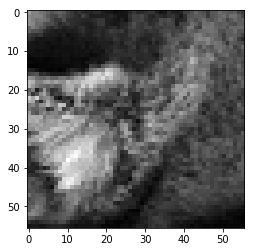

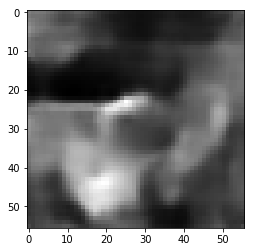

rmse 35.90553492307663
ssim 0.05095599108325691
psnr 17.027575583482786

 next
24


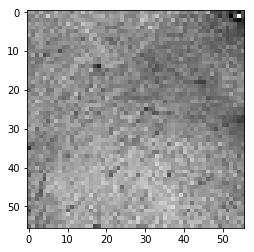

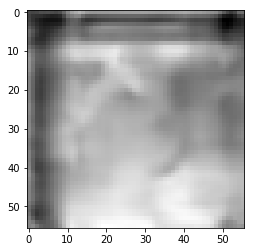

rmse 26.779235936701298
ssim 0.1703038014192258
psnr 19.574839976823423

 next
25


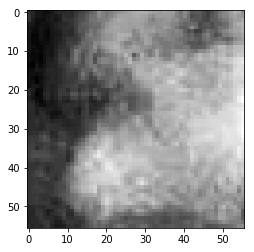

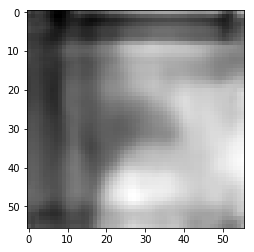

rmse 17.08214297890663
ssim 0.32093531005384907
psnr 23.479956556170034

 next
26


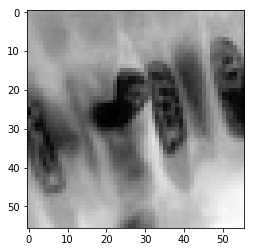

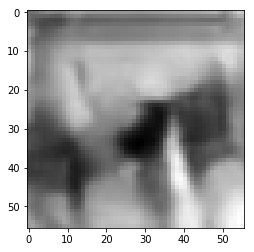

rmse 53.779008239507675
ssim 0.031946493342210364
psnr 13.518547829468467

 next
27


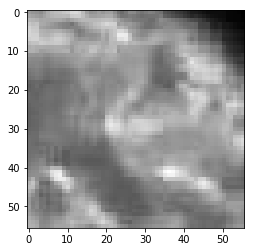

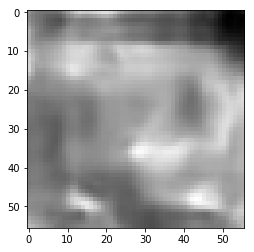

rmse 21.50716133415699
ssim 0.193602410217834
psnr 21.479141749852136

 next
28


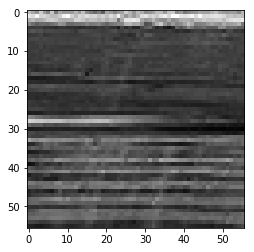

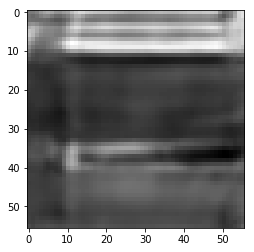

rmse 37.262563705444336
ssim 0.0617841754154088
psnr 16.705348978137458

 next
29


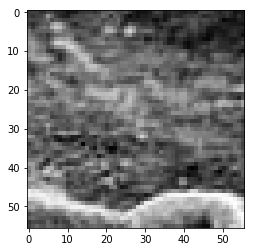

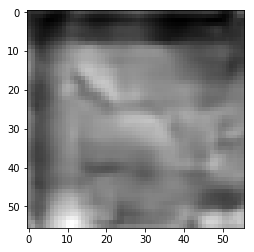

rmse 39.278564527630806
ssim 0.11371891139031431
psnr 16.247691454649917

 next
30


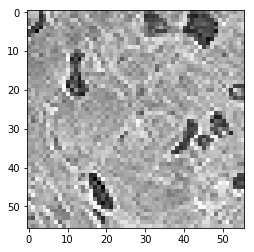

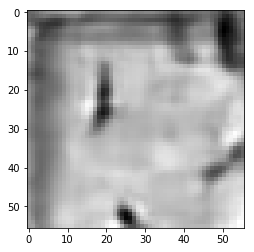

rmse 50.52814967930317
ssim 0.03270886541025092
psnr 14.060135711906447

 next
31


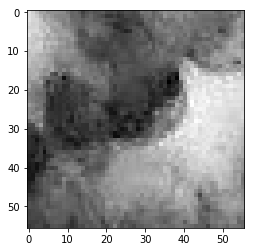

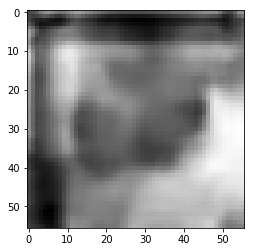

rmse 29.54690482467413
ssim 0.0940128542582956
psnr 18.72056374390628

 next
32


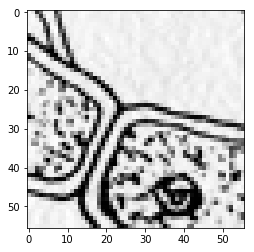

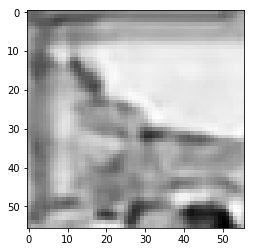

rmse 81.42077699303627
ssim 0.09565757987546841
psnr 9.91609875855135

 next
33


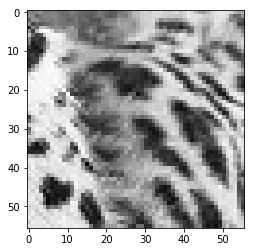

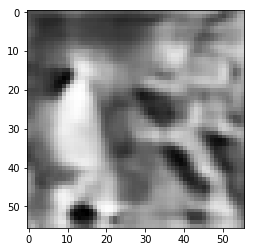

rmse 73.27620282769203
ssim -0.042862590930610636
psnr 10.831544486560567

 next
34


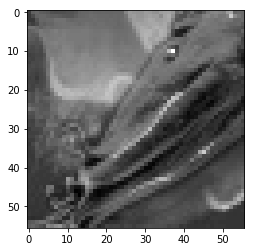

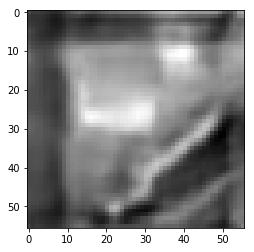

rmse 33.84539946913719
ssim 0.10750053646463803
psnr 17.540810721935166

 next
35


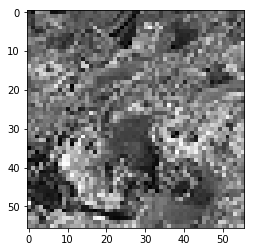

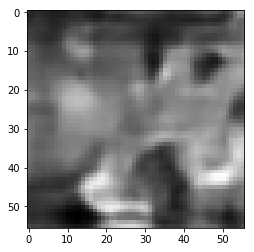

rmse 53.68182845413685
ssim 0.06058584709059795
psnr 13.534257610759122

 next
36


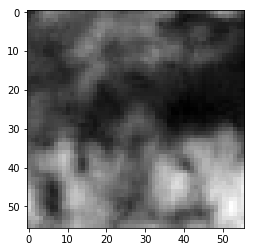

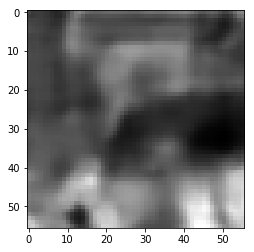

rmse 32.961335107684135
ssim 0.1487302462950493
psnr 17.77070771677176

 next
37


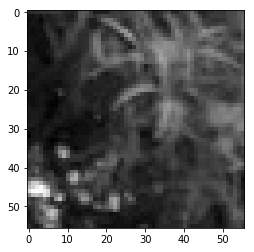

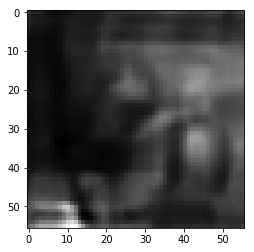

rmse 22.896201498806477
ssim 0.15203783579283842
psnr 20.93553483955909

 next
38


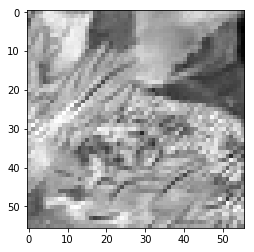

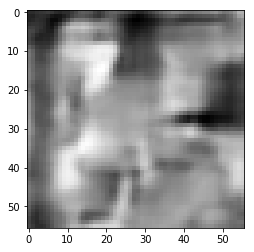

rmse 52.978797778487206
ssim 0.008274570105139486
psnr 13.64876163179275

 next
39


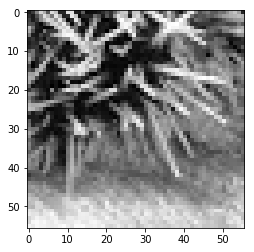

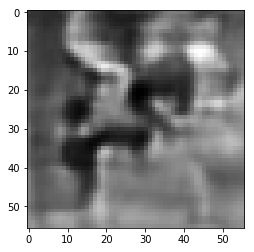

rmse 69.48058649897575
ssim 0.0348094871588047
psnr 11.2935340936057

 next
40


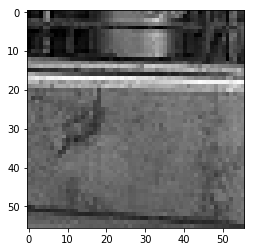

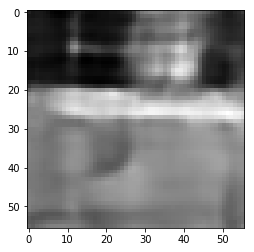

rmse 45.21616771817207
ssim 0.09248629607484103
psnr 15.024928587094333

 next
41


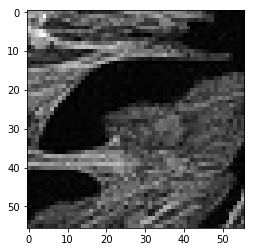

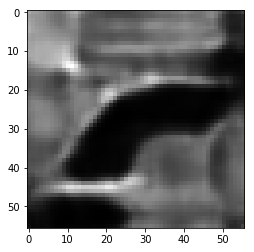

rmse 32.22577057778835
ssim -0.004813674942026256
psnr 17.96673738999795

 next
42


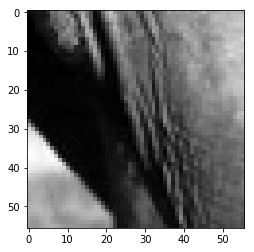

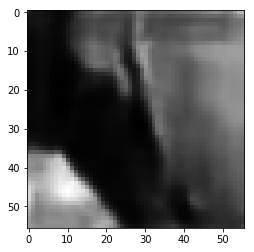

rmse 30.463715828955173
ssim 0.3099153968185259
psnr 18.455146097761336

 next
43


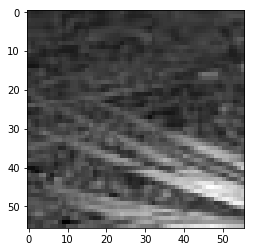

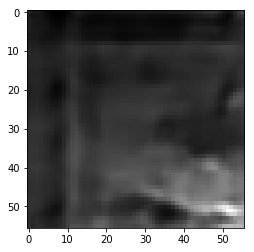

rmse 27.139148823916912
ssim 0.1065733063423206
psnr 19.45887915699683

 next
44


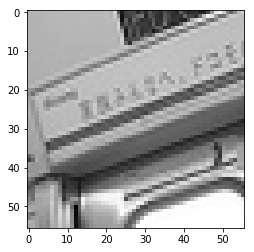

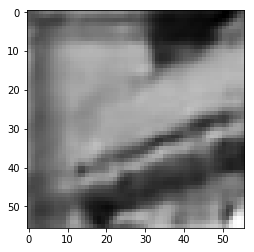

rmse 68.84624093770981
ssim -0.0043199956667500945
psnr 11.373198960706375

 next
45


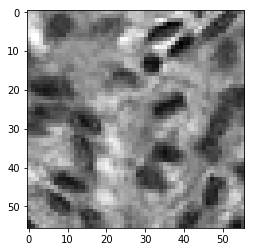

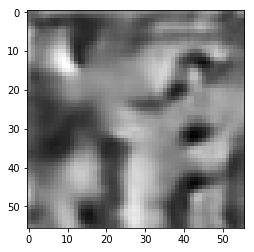

rmse 44.49155420064926
ssim -0.07553972653226233
psnr 15.165252068689565

 next
46


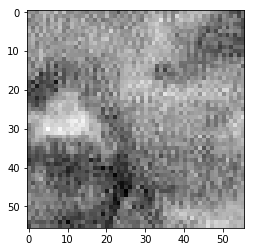

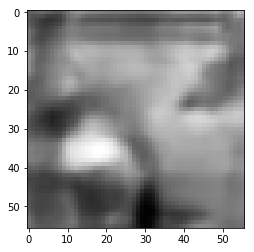

rmse 45.86485370993614
ssim 0.01626184907688928
psnr 14.901203356186517

 next
47


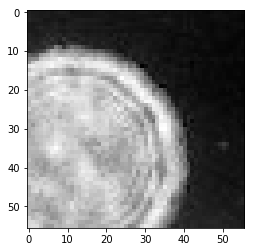

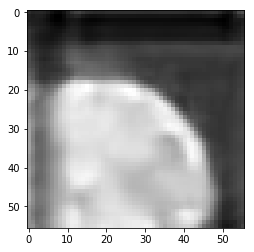

rmse 34.12540264427662
ssim 0.30678192531050874
psnr 17.46924792262981

 next
48


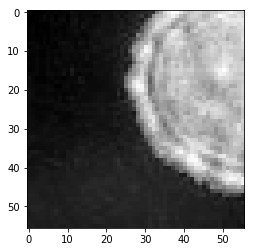

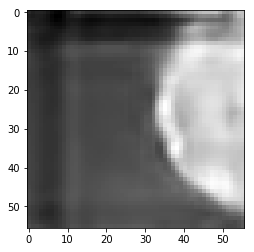

rmse 30.657214745879173
ssim 0.37940417158487316
psnr 18.400149688619628

 next
49


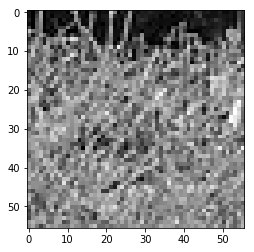

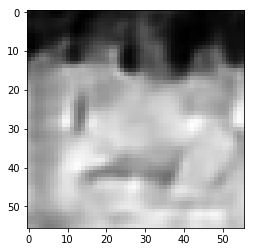

rmse 51.47783271968365
ssim 0.0641941868306806
psnr 13.8983985230125

 next
50


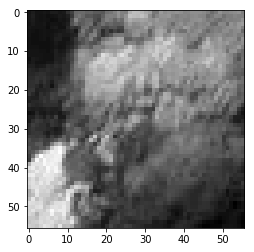

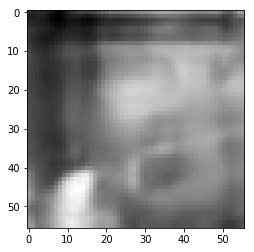

rmse 26.973884291946888
ssim 0.2295659665792414
psnr 19.511933804506377

 next
51


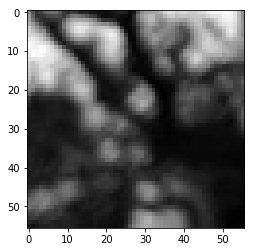

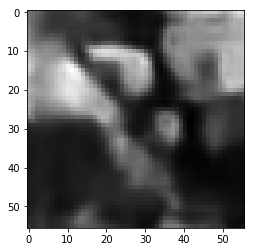

rmse 43.529043048620224
ssim 0.15526916660688586
psnr 15.355221215805411

 next
52


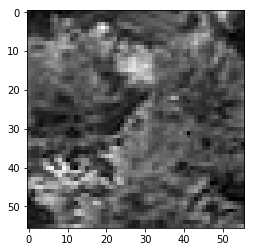

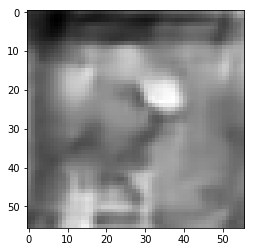

rmse 35.436640083789825
ssim 0.1355092506625076
psnr 17.141752855803254

 next
53


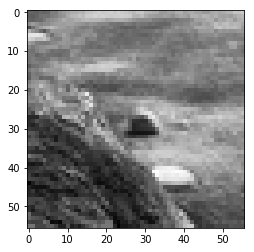

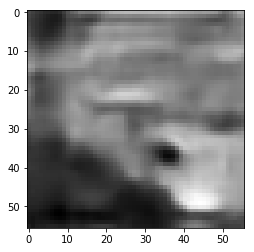

rmse 37.8822610527277
ssim 0.020928764209308833
psnr 16.562085757800173

 next
54


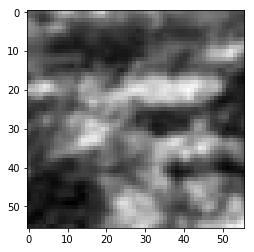

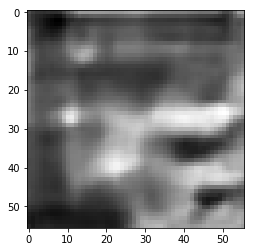

rmse 34.058488234877586
ssim -0.14114239789318697
psnr 17.486296270981082

 next
55


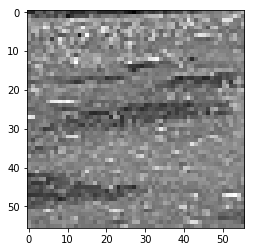

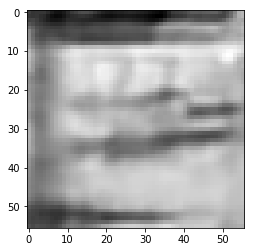

rmse 43.22585731744766
ssim 0.021353288980763375
psnr 15.415931296980506

 next
56


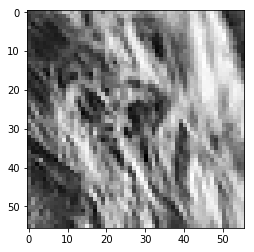

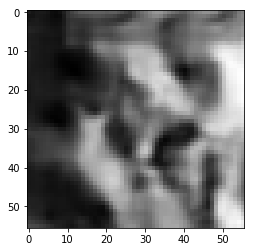

rmse 59.763314723968506
ssim 0.07268774295197261
psnr 12.6021100633202

 next
57


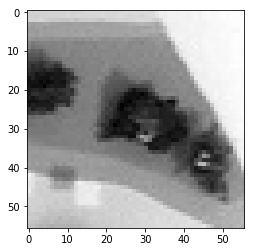

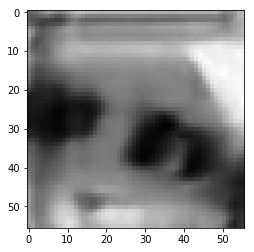

rmse 39.608717411756516
ssim 0.2014850457954123
psnr 16.174988017859178

 next
58


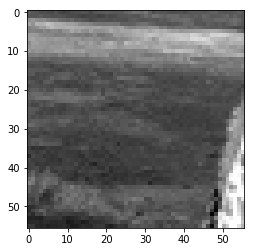

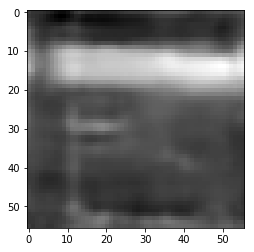

rmse 48.502094596624374
ssim 0.16704284400214606
psnr 14.41559372236039

 next
59


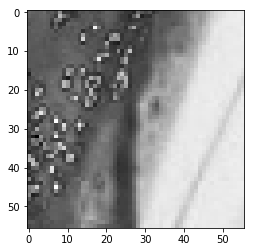

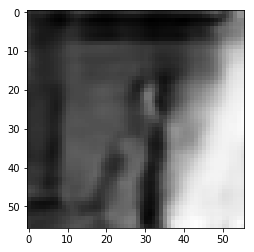

rmse 53.681456074118614
ssim 0.15537702276819962
psnr 13.534317863232879

 next
60


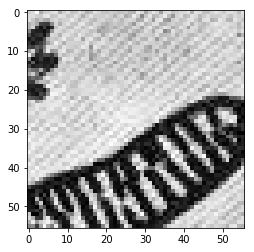

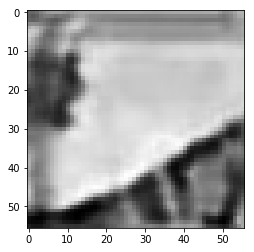

rmse 83.12060058116913
ssim 0.04057944399277887
psnr 9.736630158277679

 next
61


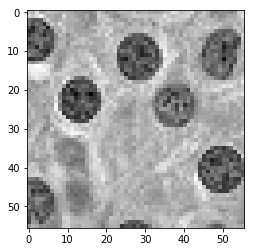

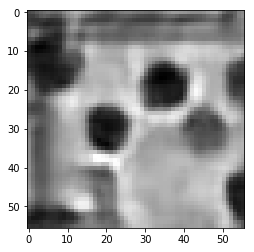

rmse 55.21441541612148
ssim -0.025226436782496812
psnr 13.28975404019934

 next
62


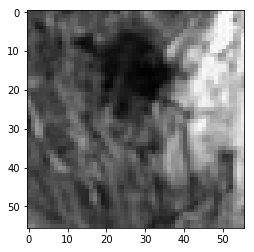

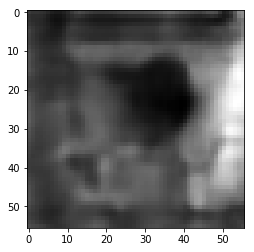

rmse 45.95308117568493
ssim 0.06714271435108175
psnr 14.884510881729273

 next
63


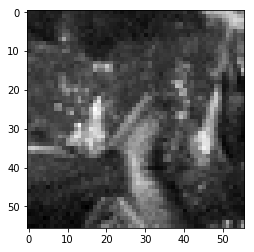

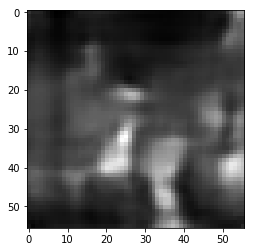

rmse 32.103945314884186
ssim 0.07772851398095929
psnr 17.9996354694938

 next
64


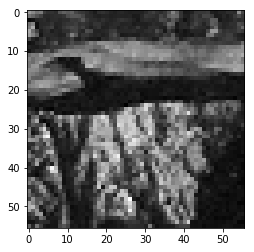

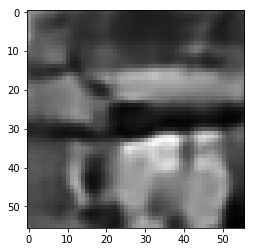

rmse 58.961876928806305
ssim -0.012394326945405406
psnr 12.719377610014282

 next
65


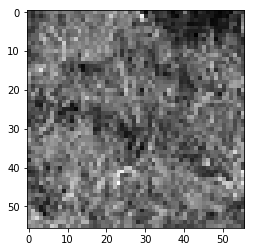

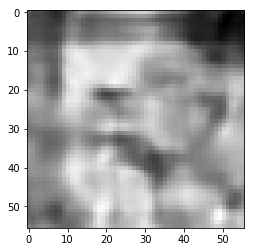

rmse 32.012575417757034
ssim 0.04869916791382766
psnr 18.024391316219504

 next
66


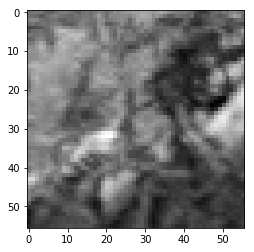

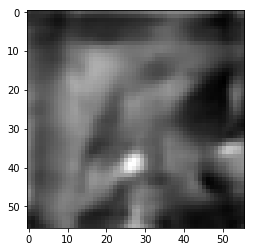

rmse 38.645484298467636
ssim -0.035642465299143555
psnr 16.388828525264792

 next
67


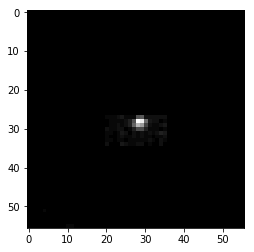

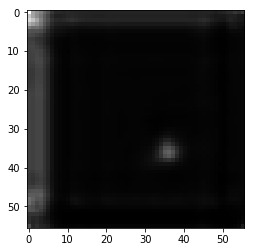

rmse 2.055235141888261
ssim 0.3005678341336652
psnr 41.873573264657

 next
68


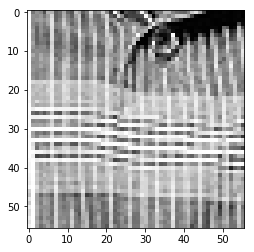

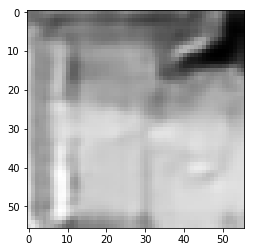

rmse 60.183173194527626
ssim 0.031072701667800608
psnr 12.541301959693211

 next
69


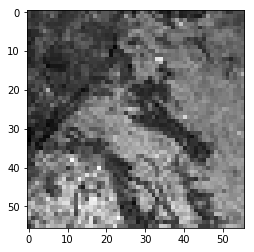

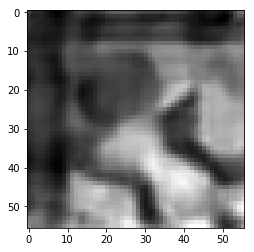

rmse 28.698138669133186
ssim 0.12098040780580163
psnr 18.973729013329404

 next
70


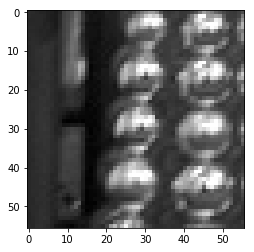

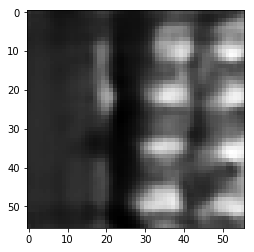

rmse 74.67626810073853
ssim -0.042791989249461
psnr 10.667151484132775

 next
71


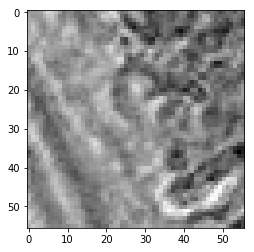

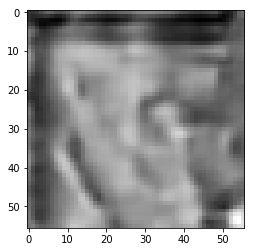

rmse 34.559818133711815
ssim 0.06866704929747132
psnr 17.35937464072094

 next
72


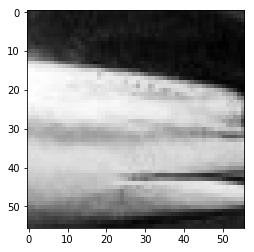

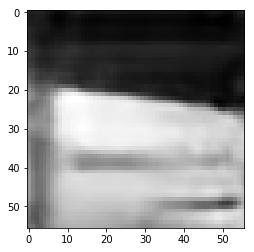

rmse 64.30853202939034
ssim 0.06172358183106521
psnr 11.965431687529664

 next
73


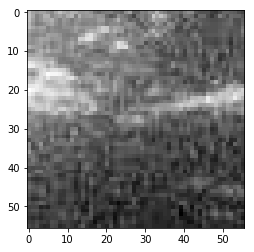

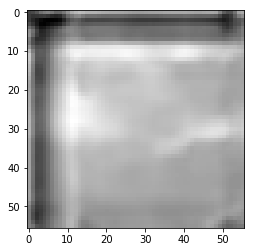

rmse 21.397977992892265
ssim 0.20072680483989033
psnr 21.523348878160974

 next
74


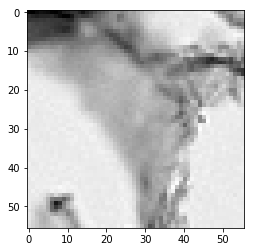

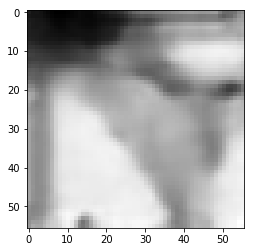

rmse 51.918354481458664
ssim 0.271015376121901
psnr 13.824385222103754

 next
75


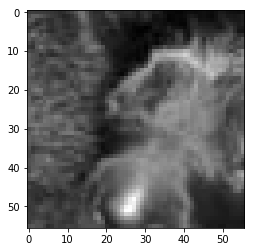

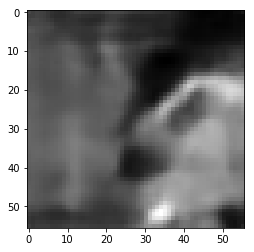

rmse 43.01265075802803
ssim 0.054764738627582424
psnr 15.45887945226796

 next
76


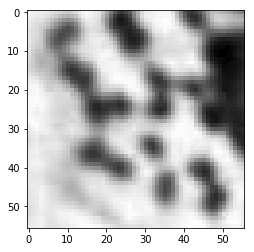

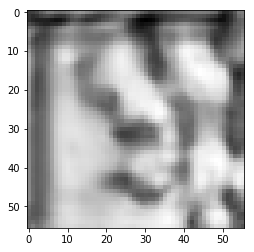

rmse 47.795028537511826
ssim 0.01696581173718996
psnr 14.54314910363815

 next
77


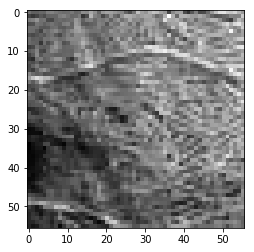

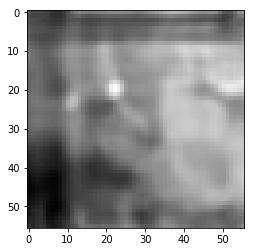

rmse 27.277317009866238
ssim 0.07171864674929698
psnr 19.414770588926487

 next
78


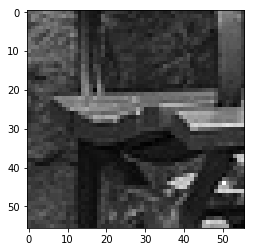

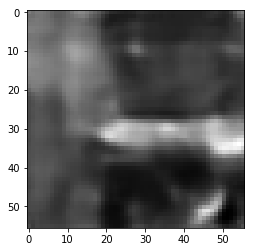

rmse 33.81450332701206
ssim 0.06652023387835349
psnr 17.548743352290906

 next
79


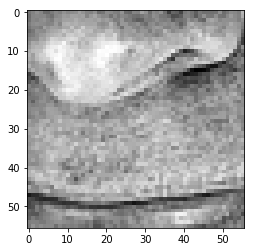

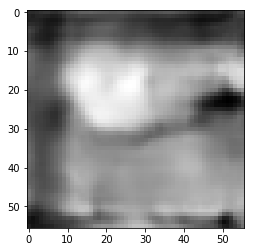

rmse 52.47632414102554
ssim 0.06920238166555988
psnr 13.731535488788921

 next
80


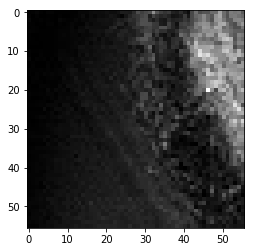

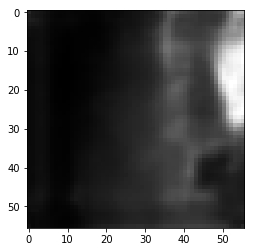

rmse 24.838756062090397
ssim 0.3191276609700455
psnr 20.228206761597413

 next
81


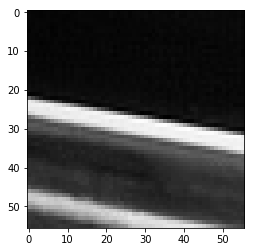

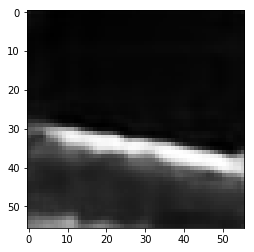

rmse 81.20781362056732
ssim 0.3518713892792912
psnr 9.93884724823051

 next
82


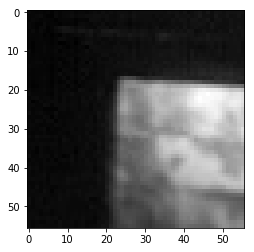

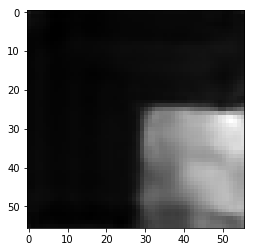

rmse 40.9086162596941
ssim 0.45404113151583186
psnr 15.894507815310382

 next
83


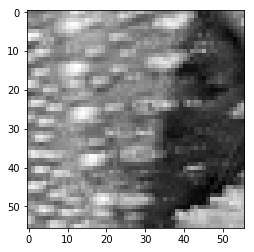

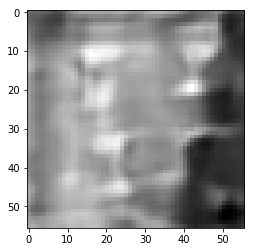

rmse 46.924483850598335
ssim -0.013389236254705483
psnr 14.702813523384602

 next
84


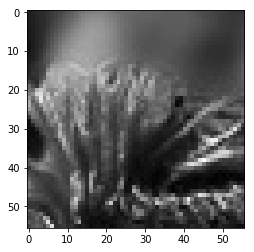

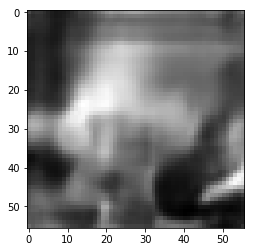

rmse 33.31647925078869
ssim 0.11135250810542459
psnr 17.67762159476636

 next
85


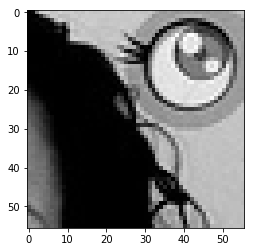

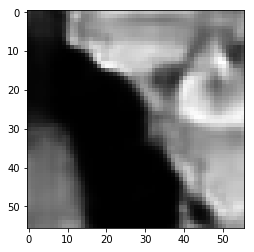

rmse 45.50030507147312
ssim 0.23157357700344214
psnr 14.970517437992592

 next
86


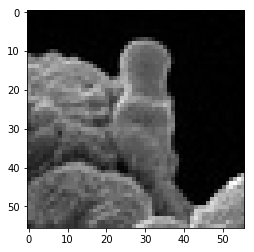

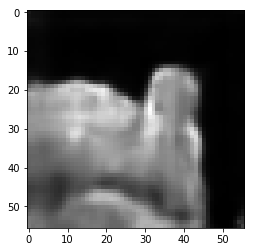

rmse 59.14206326007843
ssim 0.17972882139709803
psnr 12.69287417923074

 next
87


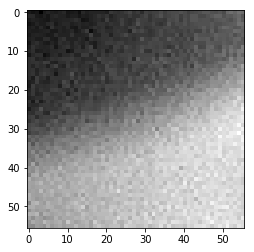

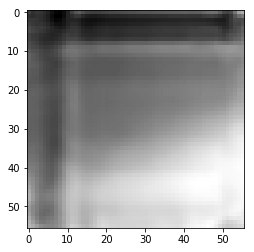

rmse 18.616675436496735
ssim 0.42147021400211804
psnr 22.732761062342846

 next
88


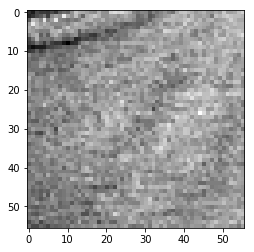

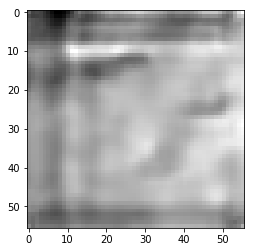

rmse 11.894010622054338
ssim 0.04999755636886514
psnr 26.624237168397748

 next
89


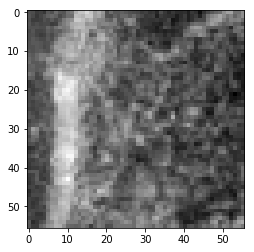

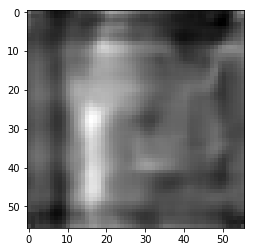

rmse 13.177849631756544
ssim -0.00326281617268871
psnr 25.73391265580247

 next
90


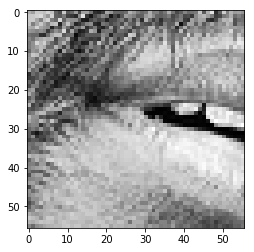

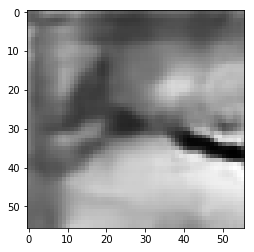

rmse 63.54457162320614
ssim 0.09444991751232278
psnr 12.069234482485562

 next
91


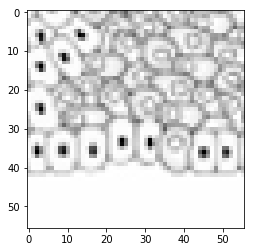

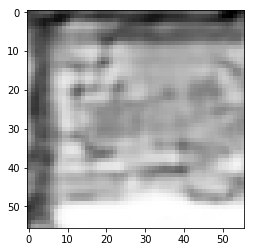

rmse 54.01722505688667
ssim 0.08099585657552442
psnr 13.480158206924857

 next
92


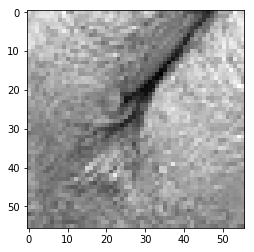

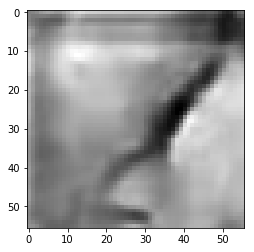

rmse 41.16013616323471
ssim 0.11654015073348932
psnr 15.841267552739193

 next
93


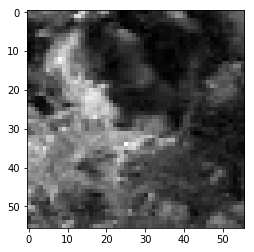

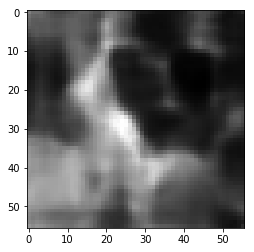

rmse 26.42915692180395
ssim 0.09074677694983693
psnr 19.689137417591027

 next
94


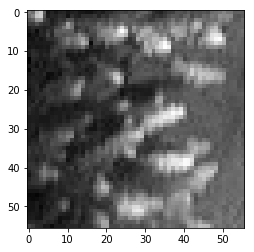

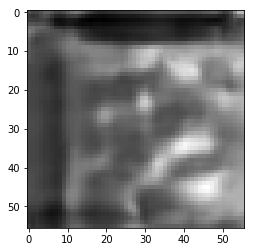

rmse 24.25804652273655
ssim 0.045639005951249985
psnr 20.433687116283117

 next
95


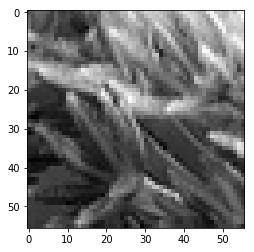

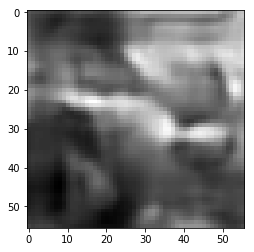

rmse 45.05108177661896
ssim 0.09263154659675593
psnr 15.05669913235499

 next
96


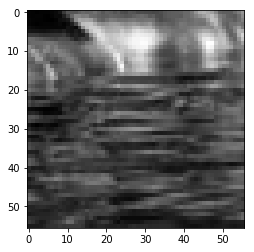

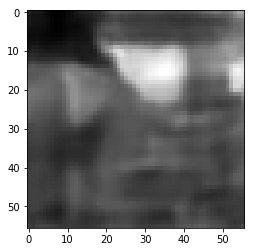

rmse 35.1715587079525
ssim 0.053819976432921045
psnr 17.20697129877334

 next
97


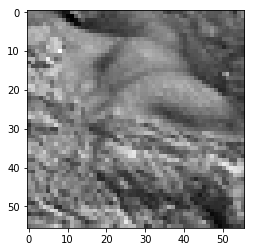

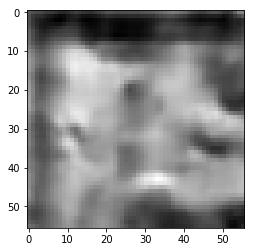

rmse 34.16489012539387
ssim 0.040057636791786165
psnr 17.45920304136237

 next
98


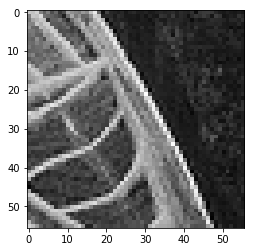

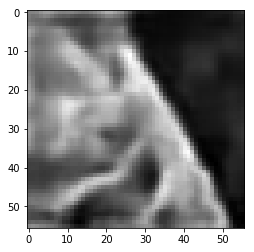

rmse 48.20306584239006
ssim 0.051696230118897825
psnr 14.46931038079476

 next
99


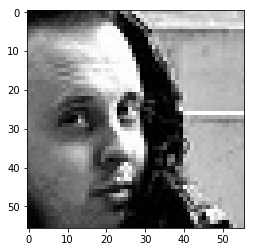

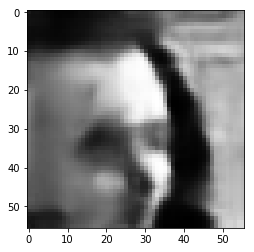

rmse 90.89839562773705
ssim 0.07751718335713095
psnr 8.959679250327707

 next
rmses 0.16611433
ssims 0.10917909031115165
psnrs 16.494193481507583


In [152]:
patch_size = 56

images_directory = '/scratch/image_datasets/2_for_learned_brief/ready/test/class0'
files = os.listdir(images_directory)
files.sort()

images = []

counter = 0

for file in files:
    counter += 1
    if counter > 100:
        break
    if not file.startswith('.'):
        #print(file)
        
#         img = load_img(images_directory + '/' + file, False, target_size=(patch_size, patch_size))
        img = imageio.imread(images_directory + '/' + file)
        img = np.expand_dims(img, axis=-1)        
        images.append(img)
        

rmses = []
ssims = []
psnrs = []
        
images = np.array(images).reshape(np.array(images).shape[0], patch_size, patch_size, 1)
images = images / 255
predictions_alex = autoencoder_alex.predict_on_batch(np.array(images))
print("predictions alex: ")
for i, im1 in enumerate(images):
    
    print(i)
    im_1 = im1.reshape((patch_size, patch_size))
    plt.imshow(im_1, cmap='gray')
    plt.show()
    
    pred_1 = predictions_alex[i].reshape((patch_size, patch_size))
    plt.imshow(pred_1, cmap='gray')
    plt.show()
    
    
    diff_rmse = np.sqrt(np.mean(np.square(np.subtract(im_1, pred_1, dtype=np.float32))))
    print("rmse", diff_rmse * 255)
    rmses.append(diff_rmse)
    
    dr_max = max(im_1.max(), pred_1.max())
    dr_min = min(im_1.min(), pred_1.min())
    diff_ssim = ssim(im_1, pred_1, data_range=dr_max - dr_min)
    print("ssim", diff_ssim)
    ssims.append(diff_ssim)
    
    diff_psnr = calculate_psnr(im_1, pred_1, max_value=1)
    print("psnr", diff_psnr)
    psnrs.append(diff_psnr)
    
    print("\n next")
    
print("rmses", np.mean(rmses))
print("ssims", np.mean(ssims))
print("psnrs", np.mean(psnrs))

In [ ]:
rmses 0.16611433
ssims 0.10917909031115165
psnrs 16.494193481507583

In [159]:
with tf.Session() as sess:  #print(product.eval())
    psnrs_tf = tf.image.psnr(images, predictions_alex, max_val=1).eval()

In [160]:
np.mean(psnrs_tf)

16.494194

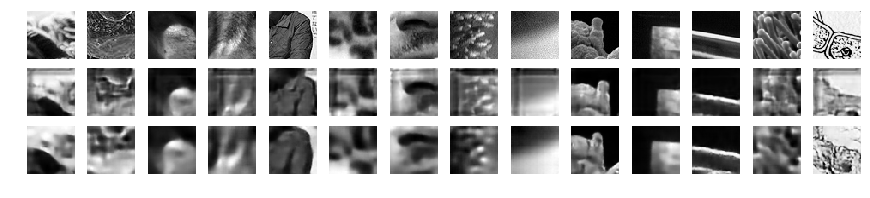

In [127]:
fig = plt.figure(figsize=(15, 3))

selected_indices = [2, 0, 7, 8, 10, 11, 21, 94, 87, 86, 82, 81, 3, 32]

columns = len(selected_indices)
rows = 3

for i in range(len(selected_indices)):

    ax = fig.add_subplot(rows, columns, i + 1)
    ax.axis('off')
    ax.imshow(images[selected_indices[i],:,:,0], cmap='gray')

    ax = fig.add_subplot(rows, columns, 2 * columns + i + 1)
    ax.axis('off')
    ax.imshow(predictions[selected_indices[i],:,:,0], cmap='gray')
    
    ax = fig.add_subplot(rows, columns, columns + i + 1)
    ax.axis('off')
    ax.imshow(predictions_alex[selected_indices[i],:,:,0], cmap='gray')

fig.savefig("/home/niaki/Downloads/Visualisation_reconstructed_patches_" + datetime.datetime.now().strftime(
    "%Y%m%d_%H%M%S") + ".pdf", bbox_inches='tight')


In [109]:
columns

12

In [114]:
str(selected_indices)

'[2, 0, 7, 8, 10, 11, 21, 94, 87, 86, 82, 81, 3, 32]'